*Welcome* to SIESTA and sisl playground
----------------------------

In this notebook, we learn how to run first principle calculactions of simple systems using **SIESTA** and how to analyse results with **sisl**.


Prelude: setting things up
-------

### <font color='black'>1. Setting up Google Colab</font>

> Añadir blockquote



If you run this notebook in Google Colab, you need to first install `conda` by executing this cell:

In [ ]:
!pip install -q condacolab
import condacolab
condacolab.install()

⏬ Downloading https://github.com/conda-forge/miniforge/releases/download/23.11.0-0/Mambaforge-23.11.0-0-Linux-x86_64.sh...
📦 Installing...
📌 Adjusting configuration...
🩹 Patching environment...
⏲ Done in 0:00:22
🔁 Restarting kernel...


### <font color='black'>2. Installing `SIESTA` with conda </font>

You need to install it with `conda`. In this next cell we use `mamba` because it's faster, but if you don't have it just change the command to `conda`.

In [ ]:
! mamba install -c conda-forge "siesta=*=*openmpi*"


Looking for: ['siesta=[build=*openmpi*]']

[+] 0.0s
conda-forge/linux-64  ⣾  
conda-forge/noarch    ⣾  [+] 0.1s
conda-forge/linux-64   1%
conda-forge/noarch    ⣾  [+] 0.2s
conda-forge/linux-64   9%
conda-forge/noarch     4%[+] 0.3s
conda-forge/linux-64  19%
conda-forge/noarch    15%[+] 0.4s
conda-forge/linux-64  24%
conda-forge/noarch    38%[+] 0.5s
conda-forge/linux-64  29%
conda-forge/noarch    49%[+] 0.6s
conda-forge/linux-64  34%
conda-forge/noarch    61%[+] 0.7s
conda-forge/linux-64  38%
conda-forge/noarch    72%[+] 0.8s
conda-forge/linux-64  43%
conda-forge/noarch    72%[+] 0.9s
conda-forge/linux-64  43%
conda-forge/noarch    84%[+] 1.0s
conda-forge/linux-64  48%
conda-forge/noarch    96%conda-forge/noarch                                
[+] 1.1s
conda-forge/linux-64  58%[+] 1.2s
conda-forge/linux-64  67%[+] 1.3s
conda-forge/linux-64  77%[+] 1.4s
conda-forge/linux-64  82%[+] 1.5s
conda-forge/linux-64  87%conda-forge/linux-64                              

Pinned packages:
  - py

### SIESTA documentation reference

- SIESTA project: https://departments.icmab.es/leem/siesta/
- download: https://gitlab.com/siesta-project/siesta
- documentation: https://docs.siesta-project.org/projects/siesta/en/latest/index.html
- more tutorials: https://personales.unican.es/junqueraj/siesta-tutorial.html

### 3. Installing `sisl`

`sisl` can be simply installed with `pip`. Here we also ask for the extra visualization dependencies.

In [ ]:
! pip install sisl[viz]

### sisl documentation reference

- Sisl documentation: https://zerothi.github.io/sisl/
- Sisl visualization module documentation: https://zerothi.github.io/sisl/visualization/viz_module/index.html


### <font color='black'>4. Importing notebook dependencies</font>

In [ ]:
##### Just to define file paths, not related to sisl
from pathlib import Path

##### Sisl matplotlib
import os
import math
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from functools import partial
%matplotlib inline

##### Sisl imports
import sisl
import sisl.viz
from sisl.viz import merge_plots
from sisl.viz.processors.math import normalize
from functools import partial
import matplotlib.pyplot as plt
from sisl import *

##### To quickly plot the hamiltonian matrix
import plotly.express as px
import plotly.graph_objs as go

#### For some reason sisl logger interferes with Colab logger.
sisl.nodes.Node.context["log_level"] = "CRITICAL"

Simulation files
----------------------------

### Input files

For most basic `SIESTA` calculations, we need at least two inputs:
- Pseudo potential ﬁle(s) (e.g. available in PSML format from
http://www.pseudo-dojo.org, or a PSF created with ATOM avalable also from:
https://www.simuneatomistics.com/siesta-pro/siesta-pseudos-and-basis-database/).
- An fdf ﬁle with the input options.

The fdf ﬁle contains all relevant input options for our simulation: geometry
information, atomic species information, level of theory, basis set information,
and a plethora of ﬁne-tuning options.
Let’s have a look at the ﬁrst fdf for this tutorial…

<font color='green'>Orbital vawefunctions of H2O molecule</font>
----------------------------


##### Creating the geometry

Our system of interest will be the water system. The first task will be to create the molecule geometry. This is done using lists of atomic coordinates and atomic species. Additionally one needs to define the lattice (or if you prefer: unit-cell) where the molecule resides in. Siesta is a periodic DFT code and thus all directions are periodic. I.e. when simulating molecules it is vital to have a large vacuum gap between periodic images. In this case we use a supercell of side-lengths 10 Å.

In [ ]:
h2o = Geometry(
    [[0, 0, 0], [0.8, 0.6, 0], [-0.8, 0.6, 0.0]],
    [Atom("O"), Atom("H"), Atom("H")],
    lattice=Lattice(10, origin=[-5] * 3),
)

The input are the 1) xyz coordinates, 2) the atomic species and 3) the lattice that is attached.

By printing the object one gets basic information regarding the geometry, such as 1) number of atoms, 2) species of atoms, 3) number of orbitals, 4) orbitals associated with each atom and 5) number of supercells (should be 1 for molecules).



In [ ]:
print(h2o)

Geometry{na: 3, no: 3,
 Atoms{species: 2,
  Atom{O, Z: 8, mass(au): 15.99940, maxR: -1.00000,
   Orbital{R: -1.00000, q0: 0.0}
  }: 1,
  Atom{H, Z: 1, mass(au): 1.00794, maxR: -1.00000,
   Orbital{R: -1.00000, q0: 0.0}
  }: 2,
 },
 maxR: -1.00000,
 Lattice{nsc: [1 1 1],
  origin=-5.0000, -5.0000, -5.0000,
  A=[10.0000, 0.0000, 0.0000],
  B=[0.0000, 10.0000, 0.0000],
  C=[0.0000, 0.0000, 10.0000],
  bc=[Periodic,
      Periodic,
      Periodic]
 }
}



So there are 3 atoms, 1 Oxygen and 2 Hydrogen. Currently there are only 1 orbital per atom.
Later we will look into the details of orbitals associated with atoms and how they may be used for wavefunctions etc.

Lets visualize the atomic positions (here adding atomic indices)

In [ ]:
h2o.plot(axes="xyz")

##### Generating input files

Now we need to create the input fdf file for Siesta:

In [ ]:
! cd /content &&  mkdir water
open("/content/water/RUN.fdf", "w").write(
    """%include STRUCT.fdf
SystemName water
SystemLabel water
PAO.BasisSize SZP
MeshCutoff 250. Ry
CDF.Save true
CDF.Compress 9
SaveHS true
SaveRho true
MD.TypeOfRun CG
MD.NumCGsteps 100
MD.MaxCGDispl         0.1 Bohr
MD.MaxForceTol        0.001d0 eV/Ang
"""
)
h2o.write("/content/water/STRUCT.fdf")



The first block of code simply writes a text-file with the required input, the last line of code tells the geometry (h2o) to write its information to the file STRUCT.fdf.
It automatically writes the following geometry information to the fdf file: - LatticeConstant - LatticeVectors - NumberOfAtoms - AtomicCoordinatesFormat - AtomicCoordinatesAndAtomicSpecies - NumberOfSpecies - ChemicalSpeciesLabel


We need as well pseudopotential files for oxygen and hydrogen.

###### O.psf and H.psf files

In [ ]:
%%writefile /content/water/O.psf
  O  ca nrl nc
 ATM3      19-FEB-98 Troullier-Martins
 2s 2.00  r= 1.14/2p 4.00  r= 1.14/3d 0.00  r= 1.14/4f 0.00  r= 1.14/
   4  0 1029  0.309844022083E-03  0.125000000000E-01   6.00000000000
 Radial grid follows
  0.389735801693E-05  0.784373876281E-05  0.118397588677E-04  0.158860427178E-04
  0.199832225532E-04  0.241319385666E-04  0.283328390034E-04  0.325865802628E-04
  0.368938270004E-04  0.412552522324E-04  0.456715374403E-04  0.501433726777E-04
  0.546714566780E-04  0.592564969634E-04  0.638992099558E-04  0.686003210887E-04
  0.733605649201E-04  0.781806852479E-04  0.830614352256E-04  0.880035774804E-04
  0.930078842321E-04  0.980751374137E-04  0.103206128794E-03  0.108401660101E-03
  0.113662543146E-03  0.118989599954E-03  0.124383662888E-03  0.129845574781E-03
  0.135376189068E-03  0.140976369919E-03  0.146646992373E-03  0.152388942477E-03
  0.158203117422E-03  0.164090425685E-03  0.170051787170E-03  0.176088133351E-03
  0.182200407420E-03  0.188389564433E-03  0.194656571457E-03  0.201002407725E-03
  0.207428064787E-03  0.213934546665E-03  0.220522870010E-03  0.227194064261E-03
  0.233949171805E-03  0.240789248143E-03  0.247715362049E-03  0.254728595743E-03
  0.261830045058E-03  0.269020819608E-03  0.276302042968E-03  0.283674852843E-03
  0.291140401250E-03  0.298699854695E-03  0.306354394360E-03  0.314105216280E-03
  0.321953531539E-03  0.329900566451E-03  0.337947562756E-03  0.346095777814E-03
  0.354346484801E-03  0.362700972906E-03  0.371160547534E-03  0.379726530512E-03
  0.388400260291E-03  0.397183092161E-03  0.406076398455E-03  0.415081568772E-03
  0.424200010187E-03  0.433433147476E-03  0.442782423334E-03  0.452249298606E-03
  0.461835252510E-03  0.471541782870E-03  0.481370406352E-03  0.491322658699E-03
  0.501400094969E-03  0.511604289783E-03  0.521936837567E-03  0.532399352802E-03
  0.542993470279E-03  0.553720845349E-03  0.564583154186E-03  0.575582094048E-03
  0.586719383543E-03  0.597996762894E-03  0.609415994214E-03  0.620978861782E-03
  0.632687172320E-03  0.644542755274E-03  0.656547463104E-03  0.668703171570E-03
  0.681011780026E-03  0.693475211716E-03  0.706095414078E-03  0.718874359044E-03
  0.731814043350E-03  0.744916488848E-03  0.758183742822E-03  0.771617878307E-03
  0.785220994414E-03  0.798995216658E-03  0.812942697289E-03  0.827065615629E-03
  0.841366178413E-03  0.855846620133E-03  0.870509203387E-03  0.885356219235E-03
  0.900389987551E-03  0.915612857394E-03  0.931027207368E-03  0.946635445996E-03
  0.962440012097E-03  0.978443375167E-03  0.994648035764E-03  0.101105652590E-02
  0.102767140943E-02  0.104449528247E-02  0.106153077378E-02  0.107878054520E-02
  0.109624729202E-02  0.111393374348E-02  0.113184266311E-02  0.114997684922E-02
  0.116833913530E-02  0.118693239052E-02  0.120575952009E-02  0.122482346580E-02
  0.124412720643E-02  0.126367375822E-02  0.128346617537E-02  0.130350755048E-02
  0.132380101505E-02  0.134434973998E-02  0.136515693606E-02  0.138622585444E-02
  0.140755978719E-02  0.142916206778E-02  0.145103607161E-02  0.147318521654E-02
  0.149561296342E-02  0.151832281662E-02  0.154131832460E-02  0.156460308048E-02
  0.158818072252E-02  0.161205493479E-02  0.163622944769E-02  0.166070803852E-02
  0.168549453213E-02  0.171059280144E-02  0.173600676811E-02  0.176174040314E-02
  0.178779772744E-02  0.181418281254E-02  0.184089978115E-02  0.186795280785E-02
  0.189534611974E-02  0.192308399708E-02  0.195117077396E-02  0.197961083901E-02
  0.200840863603E-02  0.203756866475E-02  0.206709548148E-02  0.209699369984E-02
  0.212726799149E-02  0.215792308685E-02  0.218896377585E-02  0.222039490864E-02
  0.225222139642E-02  0.228444821213E-02  0.231708039128E-02  0.235012303271E-02
  0.238358129941E-02  0.241746041930E-02  0.245176568605E-02  0.248650245994E-02
  0.252167616865E-02  0.255729230816E-02  0.259335644355E-02  0.262987420992E-02
  0.266685131324E-02  0.270429353127E-02  0.274220671442E-02  0.278059678671E-02
  0.281946974666E-02  0.285883166826E-02  0.289868870188E-02  0.293904707526E-02
  0.297991309449E-02  0.302129314496E-02  0.306319369239E-02  0.310562128383E-02
  0.314858254867E-02  0.319208419969E-02  0.323613303413E-02  0.328073593470E-02
  0.332589987069E-02  0.337163189906E-02  0.341793916553E-02  0.346482890571E-02
  0.351230844621E-02  0.356038520581E-02  0.360906669661E-02  0.365836052518E-02
  0.370827439378E-02  0.375881610155E-02  0.380999354576E-02  0.386181472296E-02
  0.391428773033E-02  0.396742076687E-02  0.402122213475E-02  0.407570024052E-02
  0.413086359651E-02  0.418672082210E-02  0.424328064509E-02  0.430055190307E-02
  0.435854354480E-02  0.441726463158E-02  0.447672433871E-02  0.453693195688E-02
  0.459789689366E-02  0.465962867494E-02  0.472213694645E-02  0.478543147521E-02
  0.484952215114E-02  0.491441898853E-02  0.498013212765E-02  0.504667183630E-02
  0.511404851145E-02  0.518227268084E-02  0.525135500465E-02  0.532130627711E-02
  0.539213742827E-02  0.546385952563E-02  0.553648377591E-02  0.561002152681E-02
  0.568448426874E-02  0.575988363667E-02  0.583623141189E-02  0.591353952390E-02
  0.599182005225E-02  0.607108522844E-02  0.615134743780E-02  0.623261922147E-02
  0.631491327834E-02  0.639824246701E-02  0.648261980784E-02  0.656805848497E-02
  0.665457184835E-02  0.674217341589E-02  0.683087687550E-02  0.692069608727E-02
  0.701164508565E-02  0.710373808160E-02  0.719698946483E-02  0.729141380607E-02
  0.738702585931E-02  0.748384056413E-02  0.758187304802E-02  0.768113862876E-02
  0.778165281679E-02  0.788343131767E-02  0.798649003449E-02  0.809084507039E-02
  0.819651273104E-02  0.830350952725E-02  0.841185217747E-02  0.852155761047E-02
  0.863264296794E-02  0.874512560720E-02  0.885902310388E-02  0.897435325471E-02
  0.909113408025E-02  0.920938382774E-02  0.932912097396E-02  0.945036422806E-02
  0.957313253456E-02  0.969744507626E-02  0.982332127723E-02  0.995078080590E-02
  0.100798435781E-01  0.102105297601E-01  0.103428597719E-01  0.104768542903E-01
  0.106125342523E-01  0.107499208582E-01  0.108890355748E-01  0.110299001391E-01
  0.111725365615E-01  0.113169671292E-01  0.114632144099E-01  0.116113012549E-01
  0.117612508030E-01  0.119130864843E-01  0.120668320234E-01  0.122225114433E-01
  0.123801490692E-01  0.125397695323E-01  0.127013977737E-01  0.128650590481E-01
  0.130307789280E-01  0.131985833073E-01  0.133684984058E-01  0.135405507732E-01
  0.137147672930E-01  0.138911751868E-01  0.140698020187E-01  0.142506756996E-01
  0.144338244913E-01  0.146192770113E-01  0.148070622367E-01  0.149972095095E-01
  0.151897485406E-01  0.153847094146E-01  0.155821225944E-01  0.157820189264E-01
  0.159844296447E-01  0.161893863764E-01  0.163969211464E-01  0.166070663825E-01
  0.168198549202E-01  0.170353200083E-01  0.172534953135E-01  0.174744149262E-01
  0.176981133656E-01  0.179246255849E-01  0.181539869773E-01  0.183862333807E-01
  0.186214010844E-01  0.188595268335E-01  0.191006478359E-01  0.193448017671E-01
  0.195920267767E-01  0.198423614941E-01  0.200958450347E-01  0.203525170056E-01
  0.206124175125E-01  0.208755871654E-01  0.211420670849E-01  0.214118989092E-01
  0.216851248001E-01  0.219617874495E-01  0.222419300867E-01  0.225255964845E-01
  0.228128309663E-01  0.231036784132E-01  0.233981842705E-01  0.236963945555E-01
  0.239983558641E-01  0.243041153784E-01  0.246137208740E-01  0.249272207272E-01
  0.252446639232E-01  0.255661000631E-01  0.258915793718E-01  0.262211527063E-01
  0.265548715629E-01  0.268927880861E-01  0.272349550758E-01  0.275814259965E-01
  0.279322549848E-01  0.282874968586E-01  0.286472071250E-01  0.290114419896E-01
  0.293802583648E-01  0.297537138790E-01  0.301318668852E-01  0.305147764706E-01
  0.309025024657E-01  0.312951054535E-01  0.316926467789E-01  0.320951885587E-01
  0.325027936906E-01  0.329155258640E-01  0.333334495691E-01  0.337566301072E-01
  0.341851336012E-01  0.346190270056E-01  0.350583781172E-01  0.355032555854E-01
  0.359537289234E-01  0.364098685184E-01  0.368717456431E-01  0.373394324669E-01
  0.378130020668E-01  0.382925284389E-01  0.387780865103E-01  0.392697521503E-01
  0.397676021828E-01  0.402717143977E-01  0.407821675637E-01  0.412990414402E-01
  0.418224167896E-01  0.423523753905E-01  0.428890000500E-01  0.434323746168E-01
  0.439825839942E-01  0.445397141537E-01  0.451038521478E-01  0.456750861243E-01
  0.462535053398E-01  0.468392001733E-01  0.474322621409E-01  0.480327839097E-01
  0.486408593125E-01  0.492565833623E-01  0.498800522672E-01  0.505113634455E-01
  0.511506155409E-01  0.517979084377E-01  0.524533432769E-01  0.531170224715E-01
  0.537890497227E-01  0.544695300360E-01  0.551585697381E-01  0.558562764926E-01
  0.565627593177E-01  0.572781286028E-01  0.580024961258E-01  0.587359750705E-01
  0.594786800447E-01  0.602307270973E-01  0.609922337374E-01  0.617633189518E-01
  0.625441032243E-01  0.633347085539E-01  0.641352584743E-01  0.649458780730E-01
  0.657666940112E-01  0.665978345428E-01  0.674394295353E-01  0.682916104897E-01
  0.691545105609E-01  0.700282645788E-01  0.709130090693E-01  0.718088822755E-01
  0.727160241794E-01  0.736345765238E-01  0.745646828343E-01  0.755064884420E-01
  0.764601405059E-01  0.774257880360E-01  0.784035819169E-01  0.793936749306E-01
  0.803962217814E-01  0.814113791191E-01  0.824393055643E-01  0.834801617324E-01
  0.845341102593E-01  0.856013158268E-01  0.866819451877E-01  0.877761671928E-01
  0.888841528162E-01  0.900060751832E-01  0.911421095962E-01  0.922924335631E-01
  0.934572268243E-01  0.946366713810E-01  0.958309515240E-01  0.970402538618E-01
  0.982647673506E-01  0.995046833228E-01  0.100760195518      0.102031500113
  0.103318795750      0.104622283574      0.105942167256      0.107278653031
  0.108631949728      0.110002268801      0.111389824366      0.112794833232
  0.114217514934      0.115658091769      0.117116788830      0.118593834041
  0.120089458193      0.121603894981      0.123137381040      0.124690155978
  0.126262462420      0.127854546043      0.129466655613      0.131099043025
  0.132751963343      0.134425674838      0.136120439033      0.137836520737
  0.139574188092      0.141333712611      0.143115369224      0.144919436319
  0.146746195784      0.148595933054      0.150468937156      0.152365500748
  0.154285920174      0.156230495502      0.158199530577      0.160193333064
  0.162212214499      0.164256490336      0.166326479998      0.168422506925
  0.170544898625      0.172693986726      0.174870107027      0.177073599552
  0.179304808601      0.181564082805      0.183851775180      0.186168243183
  0.188513848766      0.190888958436      0.193293943307      0.195729179164
  0.198195046517      0.200691930664      0.203220221746      0.205780314815
  0.208372609891      0.210997512025      0.213655431364      0.216346783211
  0.219071988098      0.221831471842      0.224625665619      0.227455006027
  0.230319935156      0.233220900657      0.236158355812      0.239132759605
  0.242144576791      0.245194277974      0.248282339676      0.251409244412
  0.254575480767      0.257781543474      0.261027933484      0.264315158055
  0.267643730820      0.271014171876      0.274427007862      0.277882772039
  0.281382004380      0.284925251644      0.288513067473      0.292146012469
  0.295824654287      0.299549567724      0.303321334803      0.307140544873
  0.311007794690      0.314923688523      0.318888838236      0.322903863392
  0.326969391348      0.331086057351      0.335254504637      0.339475384535
  0.343749356567      0.348077088549      0.352459256697      0.356896545736
  0.361389648999      0.365939268545      0.370546115259      0.375210908971
  0.379934378565      0.384717262093      0.389560306889      0.394464269689
  0.399429916748      0.404458023958      0.409549376970      0.414704771320
  0.419925012548      0.425210916327      0.430563308590      0.435983025661
  0.441470914379      0.447027832241      0.452654647524      0.458352239430
  0.464121498221      0.469963325353      0.475878633625      0.481868347315
  0.487933402329      0.494074746343      0.500293338955      0.506590151834
  0.512966168867      0.519422386322      0.525959812996      0.532579470374
  0.539282392792      0.546069627594      0.552942235301      0.559901289770
  0.566947878369      0.574083102141      0.581308075980      0.588623928802
  0.596031803724      0.603532858242      0.611128264410      0.618819209027
  0.626606893818      0.634492535625      0.642477366596      0.650562634375
  0.658749602304      0.667039549612      0.675433771621      0.683933579944
  0.692540302694      0.701255284690      0.710079887664      0.719015490479
  0.728063489341      0.737225298018      0.746502348061      0.755896089030
  0.765407988713      0.775039533366      0.784792227937      0.794667596303
  0.804667181512      0.814792546019      0.825045271933      0.835426961263
  0.845939236169      0.856583739215      0.867362133628      0.878276103552
  0.889327354317      0.900517612705      0.911848627216      0.923322168344
  0.934940028853      0.946704024058      0.958615992105      0.970677794266
  0.982891315221      0.995258463357       1.00778117107       1.02046139505
   1.03330111661       1.04630234199       1.05946710266       1.07279745563
   1.08629548379       1.09996329625       1.11380302863       1.12781684341
   1.14200693028       1.15637550647       1.17092481710       1.18565713552
   1.20057476370       1.21568003255       1.23097530228       1.24646296283
   1.26214543416       1.27802516670       1.29410464169       1.31038637157
   1.32687290040       1.34356680424       1.36047069153       1.37758720356
   1.39491901480       1.41246883339       1.43023940152       1.44823349588
   1.46645392809       1.48490354512       1.50358522976       1.52250190107
   1.54165651481       1.56105206393       1.58069157903       1.60057812881
   1.62071482060       1.64110480079       1.66175125536       1.68265741035
   1.70382653241       1.72526192924       1.74696695017       1.76894498665
   1.79119947280       1.81373388593       1.83655174708       1.85965662159
   1.88305211964       1.90674189684       1.93072965474       1.95501914150
   1.97961415239       2.00451853043       2.02973616699       2.05527100237
   2.08112702643       2.10730827924       2.13381885167       2.16066288605
   2.18784457681       2.21536817116       2.24323796970       2.27145832716
   2.30003365301       2.32896841222       2.35826712589       2.38793437201
   2.41797478615       2.44839306218       2.47919395302       2.51038227138
   2.54196289048       2.57394074488       2.60632083116       2.63910820880
   2.67230800087       2.70592539492       2.73996564373       2.77443406616
   2.80933604797       2.84467704267       2.88046257236       2.91669822860
   2.95338967328       2.99054263952       3.02816293255       3.06625643062
   3.10482908590       3.14388692546       3.18343605215       3.22348264563
   3.26403296324       3.30509334105       3.34667019483       3.38877002106
   3.43139939791       3.47456498631       3.51827353097       3.56253186145
   3.60734689319       3.65272562863       3.69867515830       3.74520266190
   3.79231540945       3.84002076242       3.88832617485       3.93723919457
   3.98676746434       4.03691872305       4.08770080694       4.13912165081
   4.19118928928       4.24391185801       4.29729759502       4.35135484193
   4.40609204530       4.46151775793       4.51764064021       4.57446946144
   4.63201310124       4.69028055093       4.74928091491       4.80902341211
   4.86951737741       4.93077226313       4.99279764046       5.05560320099
   5.11919875822       5.18359424908       5.24879973551       5.31482540599
   5.38168157716       5.44937869544       5.51792733865       5.58733821764
   5.65762217801       5.72879020177       5.80085340907       5.87382305993
   5.94771055600       6.02252744237       6.09828540931       6.17499629417
   6.25267208318       6.33132491333       6.41096707430       6.49161101033
   6.57326932220       6.65595476919       6.73968027107       6.82445891012
   6.91030393317       6.99722875368       7.08524695384       7.17437228666
   7.26461867816       7.35600022952       7.44853121930       7.54222610565
   7.63709952858       7.73316631227       7.83044146735       7.92894019324
   8.02867788059       8.12967011361       8.23193267253       8.33548153609
   8.44033288402       8.54650309955       8.65400877199       8.76286669931
   8.87309389081       8.98470756969       9.09772517582       9.21216436843
   9.32804302888       9.44537926344       9.56419140615       9.68449802164
   9.80631790805       9.92967010001       10.0545738715       10.1810487391
   10.3091144647       10.4387910587       10.5700987836       10.7030581563
   10.8376899520       10.9740152072       11.1120552230       11.2518315685
   11.3933660840       11.5366808846       11.6817983634       11.8287411953
   11.9775323406       12.1281950481       12.2807528591       12.4352296112
   12.5916494416       12.7500367913       12.9104164086       13.0728133531
   13.2372529997       13.4037610425       13.5723634986       13.7430867125
   13.9159573601       14.0910024527       14.2682493416       14.4477257219
   14.6294596371       14.8134794836       14.9998140148       15.1884923458
   15.3795439581       15.5729987039       15.7688868108       15.9672388867
   16.1680859247       16.3714593073       16.5773908122       16.7859126166
   16.9970573024       17.2108578613       17.4273477003       17.6465606462
   17.8685309515       18.0932932995       18.3208828098       18.5513350438
   18.7846860100       19.0209721701       19.2602304441       19.5024982168
   19.7478133429       19.9962141534       20.2477394615       20.5024285685
   20.7603212700       21.0214578625       21.2858791489       21.5536264456
   21.8247415887       22.0992669405       22.3772453962       22.6587203904
   22.9437359041       23.2323364717       23.5245671876       23.8204737133
   24.1201022849       24.4234997200       24.7307134251       25.0417914028
   25.3567822598       25.6757352141       25.9987001026       26.3257273893
   26.6568681729       26.9921741948       27.3316978472       27.6754921815
   28.0236109161       28.3761084454       28.7330398477       29.0944608944
   29.4604280583       29.8309985223       30.2062301890       30.5861816890
   30.9709123906       31.3604824086       31.7549526142       32.1543846442
   32.5588409106       32.9683846106       33.3830797362       33.8029910842
   34.2281842669       34.6587257214       35.0946827207       35.5361233840
   35.9831166873       36.4357324741       36.8940414668       37.3581152769
   37.8280264169       38.3038483114       38.7856553086       39.2735226917
   39.7675266911       40.2677444958       40.7742542659       41.2871351447
   41.8064672707       42.3323317907       42.8648108721       43.4039877158
   43.9499465693       44.5027727398       45.0625526075       45.6293736391
   46.2033244017       46.7844945760       47.3729749712       47.9688575386
   48.5722353860       49.1832027924       49.8018552227       50.4282893426
   51.0626030337       51.7048954089       52.3552668275       53.0138189116
   53.6806545611       54.3558779705       55.0395946449       55.7319114163
   56.4329364607       57.1427793146       57.8615508925       58.5893635038
   59.3263308708       60.0725681461       60.8281919308       61.5933202926
   62.3680727845       63.1525704631       63.9469359077       64.7512932395
   65.5657681411       66.3904878757       67.2255813076       68.0711789217
   68.9274128445       69.7944168641       70.6723264518       71.5612787827
   72.4614127574       73.3728690237       74.2957899985       75.2303198900
   76.1766047205       77.1347923488       78.1050324938       79.0874767575
   80.0822786487       81.0895936073       82.1095790283       83.1423942865
   84.1882007614       85.2471618623       86.3194430541       87.4052118830
   88.5046380024       89.6178932000       90.7451514241       91.8865888112
   93.0423837132       94.2127167253       95.3977707145       96.5977308479
   97.8127846216       99.0431218904       100.288934897       101.550418302
   102.827769215       104.121187224       105.430874429       106.757035472
   108.099877566       109.459610535       110.836446839       112.230601612
   113.642292693       115.071740662       116.519168873       117.984803490
   119.468873521
 Down Pseudopotential follows (l on next line)
  0
 -0.477757180914E-04 -0.961523807311E-04 -0.145137546864E-03 -0.194738870515E-03
 -0.244964101984E-03 -0.295821089056E-03 -0.347317778231E-03 -0.399462215960E-03
 -0.452262549909E-03 -0.505727030225E-03 -0.559864010830E-03 -0.614681950726E-03
 -0.670189415314E-03 -0.726395077733E-03 -0.783307720218E-03 -0.840936235469E-03
 -0.899289628041E-03 -0.958377015754E-03 -0.101820763111E-02 -0.107879082275E-02
 -0.114013605690E-02 -0.120225291885E-02 -0.126515111446E-02 -0.132884047168E-02
 -0.139333094208E-02 -0.145863260239E-02 -0.152475565611E-02 -0.159171043506E-02
 -0.165950740103E-02 -0.172815714740E-02 -0.179767040080E-02 -0.186805802278E-02
 -0.193933101151E-02 -0.201150050348E-02 -0.208457777530E-02 -0.215857424539E-02
 -0.223350147579E-02 -0.230937117398E-02 -0.238619519472E-02 -0.246398554185E-02
 -0.254275437021E-02 -0.262251398753E-02 -0.270327685634E-02 -0.278505559595E-02
 -0.286786298438E-02 -0.295171196036E-02 -0.303661562541E-02 -0.312258724580E-02
 -0.320964025469E-02 -0.329778825420E-02 -0.338704501754E-02 -0.347742449116E-02
 -0.356894079694E-02 -0.366160823437E-02 -0.375544128281E-02 -0.385045460376E-02
 -0.394666304312E-02 -0.404408163351E-02 -0.414272559666E-02 -0.424261034574E-02
 -0.434375148780E-02 -0.444616482620E-02 -0.454986636306E-02 -0.465487230179E-02
 -0.476119904960E-02 -0.486886322009E-02 -0.497788163580E-02 -0.508827133089E-02
 -0.520004955374E-02 -0.531323376973E-02 -0.542784166387E-02 -0.554389114366E-02
 -0.566140034180E-02 -0.578038761909E-02 -0.590087156725E-02 -0.602287101187E-02
 -0.614640501530E-02 -0.627149287968E-02 -0.639815414991E-02 -0.652640861674E-02
 -0.665627631983E-02 -0.678777755092E-02 -0.692093285695E-02 -0.705576304331E-02
 -0.719228917707E-02 -0.733053259028E-02 -0.747051488331E-02 -0.761225792819E-02
 -0.775578387208E-02 -0.790111514068E-02 -0.804827444176E-02 -0.819728476870E-02
 -0.834816940409E-02 -0.850095192334E-02 -0.865565619841E-02 -0.881230640149E-02
 -0.897092700881E-02 -0.913154280445E-02 -0.929417888420E-02 -0.945886065950E-02
 -0.962561386141E-02 -0.979446454460E-02 -0.996543909147E-02 -0.101385642162E-01
 -0.103138669690E-01 -0.104913747403E-01 -0.106711152651E-01 -0.108531166269E-01
 -0.110374072629E-01 -0.112240159677E-01 -0.114129718979E-01 -0.116043045771E-01
 -0.117980439001E-01 -0.119942201377E-01 -0.121928639414E-01 -0.123940063481E-01
 -0.125976787853E-01 -0.128039130756E-01 -0.130127414418E-01 -0.132241965120E-01
 -0.134383113247E-01 -0.136551193339E-01 -0.138746544143E-01 -0.140969508666E-01
 -0.143220434230E-01 -0.145499672525E-01 -0.147807579662E-01 -0.150144516233E-01
 -0.152510847365E-01 -0.154906942774E-01 -0.157333176828E-01 -0.159789928605E-01
 -0.162277581946E-01 -0.164796525521E-01 -0.167347152890E-01 -0.169929862560E-01
 -0.172545058050E-01 -0.175193147955E-01 -0.177874546005E-01 -0.180589671137E-01
 -0.183338947554E-01 -0.186122804794E-01 -0.188941677797E-01 -0.191796006973E-01
 -0.194686238268E-01 -0.197612823239E-01 -0.200576219120E-01 -0.203576888894E-01
 -0.206615301366E-01 -0.209691931238E-01 -0.212807259180E-01 -0.215961771905E-01
 -0.219155962250E-01 -0.222390329244E-01 -0.225665378196E-01 -0.228981620765E-01
 -0.232339575046E-01 -0.235739765648E-01 -0.239182723777E-01 -0.242668987315E-01
 -0.246199100913E-01 -0.249773616064E-01 -0.253393091200E-01 -0.257058091772E-01
 -0.260769190340E-01 -0.264526966665E-01 -0.268332007795E-01 -0.272184908161E-01
 -0.276086269666E-01 -0.280036701781E-01 -0.284036821638E-01 -0.288087254131E-01
 -0.292188632006E-01 -0.296341595967E-01 -0.300546794772E-01 -0.304804885333E-01
 -0.309116532823E-01 -0.313482410775E-01 -0.317903201190E-01 -0.322379594641E-01
 -0.326912290382E-01 -0.331501996459E-01 -0.336149429815E-01 -0.340855316408E-01
 -0.345620391319E-01 -0.350445398868E-01 -0.355331092733E-01 -0.360278236063E-01
 -0.365287601600E-01 -0.370359971796E-01 -0.375496138939E-01 -0.380696905275E-01
 -0.385963083130E-01 -0.391295495040E-01 -0.396694973879E-01 -0.402162362986E-01
 -0.407698516298E-01 -0.413304298483E-01 -0.418980585076E-01 -0.424728262609E-01
 -0.430548228759E-01 -0.436441392479E-01 -0.442408674142E-01 -0.448451005687E-01
 -0.454569330760E-01 -0.460764604864E-01 -0.467037795504E-01 -0.473389882341E-01
 -0.479821857342E-01 -0.486334724935E-01 -0.492929502165E-01 -0.499607218853E-01
 -0.506368917754E-01 -0.513215654719E-01 -0.520148498862E-01 -0.527168532725E-01
 -0.534276852441E-01 -0.541474567913E-01 -0.548762802979E-01 -0.556142695589E-01
 -0.563615397983E-01 -0.571182076867E-01 -0.578843913598E-01 -0.586602104360E-01
 -0.594457860359E-01 -0.602412408003E-01 -0.610466989095E-01 -0.618622861028E-01
 -0.626881296972E-01 -0.635243586083E-01 -0.643711033691E-01 -0.652284961509E-01
 -0.660966707836E-01 -0.669757627764E-01 -0.678659093386E-01 -0.687672494012E-01
 -0.696799236380E-01 -0.706040744876E-01 -0.715398461752E-01 -0.724873847353E-01
 -0.734468380336E-01 -0.744183557904E-01 -0.754020896036E-01 -0.763981929719E-01
 -0.774068213185E-01 -0.784281320154E-01 -0.794622844073E-01 -0.805094398362E-01
 -0.815697616667E-01 -0.826434153104E-01 -0.837305682520E-01 -0.848313900749E-01
 -0.859460524872E-01 -0.870747293480E-01 -0.882175966946E-01 -0.893748327690E-01
 -0.905466180456E-01 -0.917331352588E-01 -0.929345694312E-01 -0.941511079016E-01
 -0.953829403542E-01 -0.966302588473E-01 -0.978932578429E-01 -0.991721342366E-01
 -0.100467087387     -0.101778319148     -0.103106033897     -0.104450438568
 -0.105811742683     -0.107190158384     -0.108585900463     -0.109999186400
 -0.111430236391     -0.112879273384     -0.114346523111     -0.115832214125
 -0.117336577833     -0.118859848532     -0.120402263444     -0.121964062750
 -0.123545489632     -0.125146790303     -0.126768214048     -0.128410013262
 -0.130072443488     -0.131755763452     -0.133460235107     -0.135186123670
 -0.136933697659     -0.138703228941     -0.140494992765     -0.142309267808
 -0.144146336215     -0.146006483640     -0.147889999292     -0.149797175975
 -0.151728310136     -0.153683701901     -0.155663655130     -0.157668477453
 -0.159698480324     -0.161753979058     -0.163835292887     -0.165942744999
 -0.168076662593     -0.170237376920     -0.172425223340     -0.174640541362
 -0.176883674703     -0.179154971330     -0.181454783519     -0.183783467899
 -0.186141385510     -0.188528901851     -0.190946386937     -0.193394215349
 -0.195872766291     -0.198382423645     -0.200923576022     -0.203496616825
 -0.206101944300     -0.208739961595     -0.211411076816     -0.214115703091
 -0.216854258620     -0.219627166742     -0.222434855991     -0.225277760159
 -0.228156318355     -0.231070975068     -0.234022180229     -0.237010389275
 -0.240036063213     -0.243099668679     -0.246201678012     -0.249342569312
 -0.252522826507     -0.255742939424     -0.259003403852     -0.262304721611
 -0.265647400620     -0.269031954968     -0.272458904982     -0.275928777297
 -0.279442104929     -0.282999427344     -0.286601290530     -0.290248247072
 -0.293940856226     -0.297679683987     -0.301465303170     -0.305298293482
 -0.309179241599     -0.313108741239     -0.317087393243     -0.321115805652
 -0.325194593781     -0.329324380301     -0.333505795319     -0.337739476455
 -0.342026068922     -0.346366225609     -0.350760607164     -0.355209882071
 -0.359714726734     -0.364275825563     -0.368893871056     -0.373569563880
 -0.378303612960     -0.383096735562     -0.387949657380     -0.392863112617
 -0.397837844081     -0.402874603262     -0.407974150428     -0.413137254707
 -0.418364694179     -0.423657255964     -0.429015736311     -0.434440940689
 -0.439933683876     -0.445494790053     -0.451125092889     -0.456825435641
 -0.462596671241     -0.468439662387     -0.474355281642     -0.480344411524
 -0.486407944598     -0.492546783576     -0.498761841405     -0.505054041370
 -0.511424317183     -0.517873613083     -0.524402883932     -0.531013095311
 -0.537705223619     -0.544480256173     -0.551339191303     -0.558283038452
 -0.565312818279     -0.572429562757     -0.579634315275     -0.586928130738
 -0.594312075674     -0.601787228332     -0.609354678788     -0.617015529052
 -0.624770893173     -0.632621897342     -0.640569680005     -0.648615391969
 -0.656760196513     -0.665005269499     -0.673351799486     -0.681800987842
 -0.690354048860     -0.699012209880     -0.707776711400     -0.716648807206
 -0.725629764490     -0.734720863976     -0.743923400052     -0.753238680895
 -0.762668028610     -0.772212779363     -0.781874283523     -0.791653905805
 -0.801553025418     -0.811573036215     -0.821715346849     -0.831981380934
 -0.842372577213     -0.852890389725     -0.863536287982     -0.874311757157
 -0.885218298268     -0.896257428378     -0.907430680798     -0.918739605302
 -0.930185768344     -0.941770753294     -0.953496160675     -0.965363608415
 -0.977374732111     -0.989531185302      -1.00183463976      -1.01428678578
  -1.02688933251      -1.03964400828      -1.05255256095      -1.06561675825
  -1.07883838822      -1.09221925956      -1.10576120208      -1.11946606714
  -1.13333572813      -1.14737208098      -1.16157704463      -1.17595256166
  -1.19050059880      -1.20522314759      -1.22012222501      -1.23519987418
  -1.25045816507      -1.26589919524      -1.28152509071      -1.29733800675
  -1.31334012880      -1.32953367343      -1.34592088931      -1.36250405832
  -1.37928549664      -1.39626755591      -1.41345262453      -1.43084312895
  -1.44844153506      -1.46625034968      -1.48427212211      -1.50250944579
  -1.52096496001      -1.53964135176      -1.55854135769      -1.57766776612
  -1.59702341923      -1.61661121535      -1.63643411135      -1.65649512521
  -1.67679733869      -1.69734390020      -1.71813802777      -1.73918301224
  -1.76048222056      -1.78203909938      -1.80385717869      -1.82594007583
  -1.84829149955      -1.87091525442      -1.89381524543      -1.91699548281
  -1.94046008719      -1.96421329496      -1.98825946397      -2.01260307950
  -2.03724876058      -2.06220126659      -2.08746550432      -2.11304653525
  -2.13894958335      -2.16518004320      -2.19174348854      -2.21864568133
  -2.24589258118      -2.27349035528      -2.30144538892      -2.32976429640
  -2.35845393260      -2.38752140503      -2.41697408655      -2.44681962865
  -2.47706597536      -2.50772137791      -2.53879440994      -2.57029398354
  -2.60222936597      -2.63461019713      -2.66744650782      -2.70074873880
  -2.73452776072      -2.76879489477      -2.80356193437      -2.83884116755
  -2.87464540037      -2.91098798121      -2.94788282590      -2.98534444390
  -3.02338796530      -3.06202916880      -3.10128451062      -3.14117115424
  -3.18170700113      -3.22291072225      -3.26480179043      -3.30740051348
  -3.35072806809      -3.39480653433      -3.43965893074      -3.48530924992
  -3.53178249445      -3.57910471313      -3.62730303719      -3.67640571652
  -3.72644215559      -3.77744294883      -3.82943991536      -3.88246613255
  -3.93655596833      -3.99174511172      -4.04807060131      -4.10557085114
  -4.16428567352      -4.22425629831      -4.28552538796      -4.34813704769
  -4.41213683009      -4.47757173337      -4.54449019223      -4.61294206065
  -4.68297858528      -4.75465236854      -4.82801732004      -4.90312859508
  -4.98004251873      -5.05881649405      -5.13950889274      -5.22217892643
  -5.30688649680      -5.39369202248      -5.48265624070      -5.57383998134
  -5.66730391115      -5.76310824569      -5.86131242639      -5.96197476025
  -6.06515201932      -6.17089899740      -6.27926802116      -6.39030841295
  -6.50406590253      -6.62058198533      -6.73989322455      -6.86203049509
  -6.98701816709      -7.11487322769      -7.24560433970      -7.37921083664
  -7.51568165404      -7.65499419812      -7.79711315340      -7.94198923219
  -8.08955787024      -8.23973787416      -8.39243002780      -8.54751566713
  -8.70485523471      -8.86428682761      -9.02562475529      -9.18865812644
  -9.35314948743      -9.51883353807      -9.68541595405      -9.85257234936
  -10.0199474159      -10.1871542814      -10.3537741320      -10.5193561475
  -10.6834178055      -10.8454456089      -11.0048963010      -11.1611986293
  -11.3137557261      -11.4619481716      -11.6051378080      -11.7426723696
  -11.8738909916      -11.9981306552      -12.1147336171      -12.2230558628
  -12.3224766073      -12.4124088496      -12.4923109642      -12.5616992881
  -12.6201616241      -12.6673715480      -12.7031033570      -12.7272474441
  -12.7398258192      -12.7410074226      -12.7311227892      -12.7106775188
  -12.6803638820      -12.6410697488      -12.5938838468      -12.5400961475
  -12.4811919163      -12.4188376534      -12.3548567654      -12.2911923440
  -12.2298538615      -12.1728439116      -12.1220603046      -12.0791678588
  -12.0454330966      -12.0215137394      -12.0071934010      -12.0010501896
  -12.0000428749      -12.0000340386      -12.0000269757      -12.0000213201
  -12.0000168039      -12.0000132077      -12.0000103523      -12.0000080915
  -12.0000063067      -12.0000049017      -12.0000037991      -12.0000029363
  -12.0000022632      -12.0000017396      -12.0000013335      -12.0000010196
  -12.0000007776      -12.0000005916      -12.0000004491      -12.0000003402
  -12.0000002572      -12.0000001942      -12.0000001464      -12.0000001103
  -12.0000000831      -12.0000000626      -12.0000000472      -12.0000000357
  -12.0000000270      -12.0000000205      -12.0000000157      -12.0000000120
  -12.0000000093      -12.0000000073      -12.0000000057      -12.0000000045
  -12.0000000036      -12.0000000029      -12.0000000024      -12.0000000019
  -12.0000000016      -12.0000000013      -12.0000000011      -12.0000000009
  -12.0000000008      -12.0000000007      -12.0000000006      -12.0000000005
  -12.0000000004      -12.0000000003      -12.0000000003      -12.0000000003
  -12.0000000002      -12.0000000002      -12.0000000002      -12.0000000001
  -12.0000000001      -12.0000000001      -12.0000000001      -12.0000000001
  -12.0000000001      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000
 Down Pseudopotential follows (l on next line)
  1
 -0.144057762305E-03 -0.289927548186E-03 -0.437632150086E-03 -0.587194647143E-03
 -0.738638408794E-03 -0.891987098425E-03 -0.104726467707E-02 -0.120449540716E-02
 -0.136370385631E-02 -0.152491490114E-02 -0.168815373121E-02 -0.185344585289E-02
 -0.202081709340E-02 -0.219029360484E-02 -0.236190186822E-02 -0.253566869767E-02
 -0.271162124461E-02 -0.288978700195E-02 -0.307019380844E-02 -0.325286985299E-02
 -0.343784367907E-02 -0.362514418922E-02 -0.381480064947E-02 -0.400684269403E-02
 -0.420130032982E-02 -0.439820394122E-02 -0.459758429479E-02 -0.479947254408E-02
 -0.500390023450E-02 -0.521089930828E-02 -0.542050210939E-02 -0.563274138867E-02
 -0.584765030889E-02 -0.606526244997E-02 -0.628561181420E-02 -0.650873283158E-02
 -0.673466036516E-02 -0.696342971654E-02 -0.719507663133E-02 -0.742963730479E-02
 -0.766714838743E-02 -0.790764699079E-02 -0.815117069318E-02 -0.839775754563E-02
 -0.864744607776E-02 -0.890027530382E-02 -0.915628472883E-02 -0.941551435470E-02
 -0.967800468649E-02 -0.994379673877E-02 -0.102129320420E-01 -0.104854526490E-01
 -0.107614011415E-01 -0.110408206371E-01 -0.113237547954E-01 -0.116102478253E-01
 -0.119003444919E-01 -0.121940901231E-01 -0.124915306173E-01 -0.127927124500E-01
 -0.130976826813E-01 -0.134064889632E-01 -0.137191795472E-01 -0.140358032917E-01
 -0.143564096696E-01 -0.146810487761E-01 -0.150097713366E-01 -0.153426287143E-01
 -0.156796729188E-01 -0.160209566137E-01 -0.163665331249E-01 -0.167164564494E-01
 -0.170707812630E-01 -0.174295629296E-01 -0.177928575091E-01 -0.181607217668E-01
 -0.185332131820E-01 -0.189103899568E-01 -0.192923110257E-01 -0.196790360641E-01
 -0.200706254984E-01 -0.204671405148E-01 -0.208686430692E-01 -0.212751958968E-01
 -0.216868625218E-01 -0.221037072677E-01 -0.225257952667E-01 -0.229531924705E-01
 -0.233859656603E-01 -0.238241824574E-01 -0.242679113333E-01 -0.247172216211E-01
 -0.251721835258E-01 -0.256328681356E-01 -0.260993474328E-01 -0.265716943049E-01
 -0.270499825566E-01 -0.275342869206E-01 -0.280246830696E-01 -0.285212476283E-01
 -0.290240581852E-01 -0.295331933045E-01 -0.300487325387E-01 -0.305707564411E-01
 -0.310993465779E-01 -0.316345855414E-01 -0.321765569628E-01 -0.327253455251E-01
 -0.332810369766E-01 -0.338437181440E-01 -0.344134769461E-01 -0.349904024077E-01
 -0.355745846732E-01 -0.361661150208E-01 -0.367650858771E-01 -0.373715908309E-01
 -0.379857246484E-01 -0.386075832874E-01 -0.392372639131E-01 -0.398748649126E-01
 -0.405204859105E-01 -0.411742277845E-01 -0.418361926812E-01 -0.425064840318E-01
 -0.431852065686E-01 -0.438724663411E-01 -0.445683707329E-01 -0.452730284778E-01
 -0.459865496778E-01 -0.467090458192E-01 -0.474406297909E-01 -0.481814159015E-01
 -0.489315198974E-01 -0.496910589809E-01 -0.504601518283E-01 -0.512389186086E-01
 -0.520274810022E-01 -0.528259622202E-01 -0.536344870230E-01 -0.544531817405E-01
 -0.552821742913E-01 -0.561215942031E-01 -0.569715726324E-01 -0.578322423858E-01
 -0.587037379398E-01 -0.595861954624E-01 -0.604797528345E-01 -0.613845496709E-01
 -0.623007273423E-01 -0.632284289977E-01 -0.641677995863E-01 -0.651189858807E-01
 -0.660821364990E-01 -0.670574019289E-01 -0.680449345505E-01 -0.690448886607E-01
 -0.700574204967E-01 -0.710826882609E-01 -0.721208521453E-01 -0.731720743566E-01
 -0.742365191416E-01 -0.753143528129E-01 -0.764057437747E-01 -0.775108625490E-01
 -0.786298818027E-01 -0.797629763741E-01 -0.809103233004E-01 -0.820721018454E-01
 -0.832484935273E-01 -0.844396821472E-01 -0.856458538177E-01 -0.868671969922E-01
 -0.881039024939E-01 -0.893561635461E-01 -0.906241758018E-01 -0.919081373750E-01
 -0.932082488707E-01 -0.945247134170E-01 -0.958577366965E-01 -0.972075269785E-01
 -0.985742951512E-01 -0.999582547551E-01 -0.101359622016     -0.102778615879
 -0.104215458043     -0.105670372993     -0.107143588040     -0.108635333350
 -0.110145841987     -0.111675349943     -0.113224096179     -0.114792322661
 -0.116380274396     -0.117988199473     -0.119616349103     -0.121264977652
 -0.122934342686     -0.124624705011     -0.126336328711     -0.128069481190
 -0.129824433217     -0.131601458963     -0.133400836047     -0.135222845580
 -0.137067772206     -0.138935904149     -0.140827533257     -0.142742955046
 -0.144682468749     -0.146646377361     -0.148634987686     -0.150648610385
 -0.152687560026     -0.154752155132     -0.156842718229     -0.158959575898
 -0.161103058827     -0.163273501860     -0.165471244053     -0.167696628720
 -0.169950003494     -0.172231720379     -0.174542135800     -0.176881610667
 -0.179250510422     -0.181649205106     -0.184078069407     -0.186537482726
 -0.189027829229     -0.191549497914     -0.194102882667     -0.196688382326
 -0.199306400740     -0.201957346834     -0.204641634674     -0.207359683528
 -0.210111917933     -0.212898767764     -0.215720668295     -0.218578060271
 -0.221471389977     -0.224401109305     -0.227367675823     -0.230371552853
 -0.233413209535     -0.236493120905     -0.239611767968     -0.242769637772
 -0.245967223483     -0.249205024464     -0.252483546351     -0.255803301132
 -0.259164807227     -0.262568589568     -0.266015179680     -0.269505115765
 -0.273038942786     -0.276617212548     -0.280240483790     -0.283909322264
 -0.287624300830     -0.291385999540     -0.295195005733     -0.299051914118
 -0.302957326876     -0.306911853746     -0.310916112125     -0.314970727157
 -0.319076331838     -0.323233567107     -0.327443081952     -0.331705533504
 -0.336021587143     -0.340391916600     -0.344817204061     -0.349298140273
 -0.353835424650     -0.358429765384     -0.363081879550     -0.367792493221
 -0.372562341579     -0.377392169028     -0.382282729308     -0.387234785616
 -0.392249110718     -0.397326487073     -0.402467706949     -0.407673572553
 -0.412944896145     -0.418282500170     -0.423687217385     -0.429159890982
 -0.434701374723     -0.440312533070     -0.445994241316     -0.451747385724
 -0.457572863658     -0.463471583726     -0.469444465917     -0.475492441741
 -0.481616454377     -0.487817458811     -0.494096421990     -0.500454322962
 -0.506892153036     -0.513410915923     -0.520011627899     -0.526695317954
 -0.533463027954     -0.540315812799     -0.547254740580     -0.554280892749
 -0.561395364280     -0.568599263837     -0.575893713942     -0.583279851148
 -0.590758826209     -0.598331804260     -0.605999964988     -0.613764502817
 -0.621626627085     -0.629587562230     -0.637648547976     -0.645810839517
 -0.654075707713     -0.662444439277     -0.670918336971     -0.679498719804
 -0.688186923231     -0.696984299352     -0.705892217118     -0.714912062534
 -0.724045238872     -0.733293166878     -0.742657284985     -0.752139049531
 -0.761739934975     -0.771461434118     -0.781305058327     -0.791272337758
 -0.801364821586     -0.811584078235     -0.821931695612     -0.832409281339
 -0.843018462997     -0.853760888362     -0.864638225651     -0.875652163768
 -0.886804412553     -0.898096703031     -0.909530787672     -0.921108440641
 -0.932831458065     -0.944701658289     -0.956720882147     -0.968890993224
 -0.981213878135     -0.993691446792      -1.00632563268      -1.01911839315
  -1.03207170968      -1.04518758818      -1.05846805925      -1.07191517853
  -1.08553102693      -1.09931771096      -1.11327736301      -1.12741214169
  -1.14172423210      -1.15621584615      -1.17088922287      -1.18574662872
  -1.20079035794      -1.21602273280      -1.23144610402      -1.24706285100
  -1.26287538221      -1.27888613550      -1.29509757845      -1.31151220869
  -1.32813255423      -1.34496117386      -1.36200065742      -1.37925362620
  -1.39672273329      -1.41441066390      -1.43232013577      -1.45045389946
  -1.46881473878      -1.48740547112      -1.50622894783      -1.52528805458
  -1.54458571173      -1.56412487472      -1.58390853444      -1.60393971760
  -1.62422148713      -1.64475694254      -1.66554922033      -1.68660149436
  -1.70791697623      -1.72949891571      -1.75135060109      -1.77347535958
  -1.79587655774      -1.81855760181      -1.84152193819      -1.86477305376
  -1.88831447631      -1.91214977495      -1.93628256049      -1.96071648584
  -1.98545524640      -2.01050258050      -2.03586226972      -2.06153813934
  -2.08753405874      -2.11385394175      -2.14050174705      -2.16748147859
  -2.19479718592      -2.22245296463      -2.25045295667      -2.27880135074
  -2.30750238268      -2.33656033579      -2.36597954123      -2.39576437832
  -2.42591927492      -2.45644870772      -2.48735720262      -2.51864933499
  -2.55032973000      -2.58240306290      -2.61487405931      -2.64774749548
  -2.68102819852      -2.71472104667      -2.74883096948      -2.78336294804
  -2.81832201513      -2.85371325541      -2.88954180550      -2.92581285414
  -2.96253164225      -2.99970346298      -3.03733366173      -3.07542763615
  -3.11399083607      -3.15302876345      -3.19254697222      -3.23255106812
  -3.27304670848      -3.31403960199      -3.35553550832      -3.39754023778
  -3.44005965088      -3.48309965783      -3.52666621797      -3.57076533909
  -3.61540307676      -3.66058553350      -3.70631885788      -3.75260924351
  -3.79946292799      -3.84688619168      -3.89488535639      -3.94346678394
  -3.99263687461      -4.04240206540      -4.09276882820      -4.14374366781
  -4.19533311968      -4.24754374767      -4.30038214140      -4.35385491363
  -4.40796869719      -4.46273014192      -4.51814591120      -4.57422267829
  -4.63096712243      -4.68838592464      -4.74648576317      -4.80527330870
  -4.86475521920      -4.92493813438      -4.98582866983      -5.04743341070
  -5.10975890503      -5.17281165657      -5.23659811717      -5.30112467867
  -5.36639766423      -5.43242331920      -5.49920780128      -5.56675717016
  -5.63507737651      -5.70417425023      -5.77405348800      -5.84472064015
  -5.91618109660      -5.98844007210      -6.06150259047      -6.13537346802
  -6.21005729593      -6.28555842162      -6.36188092908      -6.43902861809
  -6.51700498220      -6.59581318555      -6.67545603837      -6.75593597117
  -6.83725500747      -6.91941473516      -7.00241627619      -7.08626025485
  -7.17094676424      -7.25647533108      -7.34284487876      -7.43005368846
  -7.51809935842      -7.60697876116      -7.69668799867      -7.78722235547
  -7.87857624943      -7.97074318043      -8.06371567656      -8.15748523808
  -8.25204227881      -8.34737606515      -8.44347465243      -8.54032481882
  -8.63791199645      -8.73622020005      -8.83523195280      -8.93492820957
  -9.03528827743      -9.13628973352      -9.23790834033      -9.34011795829
  -9.44289045592      -9.54619561747      -9.65000104829      -9.75427207792
  -9.85897166113      -9.96406027716      -10.0694958272      -10.1752335305
  -10.2812258196      -10.3874222341      -10.4937693150      -10.6002104983
  -10.7066860093      -10.8131327583      -10.9194842371      -11.0256704187
  -11.1316176596      -11.2372486054      -11.3424821021      -11.4472331123
  -11.5514126382      -11.6549276522      -11.7576810370      -11.8595715357
  -11.9604937132      -12.0603379319      -12.1589903407      -12.2563328820
  -12.3522433160      -12.4465952660      -12.5392582853      -12.6300979490
  -12.7189759721      -12.8057503571      -12.8902755716      -12.9724027616
  -13.0519799990      -13.1288525695      -13.2028633014      -13.2738529381
  -13.3416605577      -13.4061240418      -13.4670805962      -13.5243673245
  -13.5778218602      -13.6272830552      -13.6725917301      -13.7135914857
  -13.7501295783      -13.7820578588      -13.8092337767      -13.8315214493
  -13.8487927938      -13.8609287241      -13.8678204074      -13.8693705799
  -13.8654949174      -13.8561234564      -13.8412020603      -13.8206939244
  -13.7945811122      -13.7628661128      -13.7255734118      -13.6827510618
  -13.6344722405      -13.5808367829      -13.5219726699      -13.4580374572
  -13.3892196252      -13.3157398283      -13.2378520221      -13.1558444434
  -13.0700404164      -12.9807989581      -12.8885151516      -12.7936202538
  -12.6965815048      -12.5979015988      -12.4981177774      -12.3978005006
  -12.2975516496      -12.1980022086      -12.0998093716      -12.0036530147
  -11.9102314696      -11.8202565302      -11.7344476190      -11.6535250379
  -11.5782022255      -11.5091769409      -11.4471213003      -11.3926705974
  -11.3464108537      -11.3088650658      -11.2804781507      -11.2616006359
  -11.2524712079      -11.2531983166      -11.2637411520      -11.2838904519
  -11.3132497905      -11.3512182260      -11.3969754736      -11.4494711156
  -11.5074197752      -11.5693046734      -11.6333925701      -11.6977637624
  -11.7603616049      -11.8190669232      -11.8718037527      -11.9166840656
  -11.9522005986      -11.9774786127      -11.9925994747      -11.9990783357
  -12.0000399633      -12.0000317352      -12.0000251502      -12.0000198773
  -12.0000156668      -12.0000123140      -12.0000096517      -12.0000075439
  -12.0000058799      -12.0000045700      -12.0000035420      -12.0000027376
  -12.0000021100      -12.0000016218      -12.0000012433      -12.0000009506
  -12.0000007250      -12.0000005516      -12.0000004187      -12.0000003172
  -12.0000002398      -12.0000001810      -12.0000001365      -12.0000001029
  -12.0000000775      -12.0000000584      -12.0000000440      -12.0000000333
  -12.0000000252      -12.0000000192      -12.0000000146      -12.0000000112
  -12.0000000087      -12.0000000068      -12.0000000053      -12.0000000042
  -12.0000000034      -12.0000000027      -12.0000000022      -12.0000000018
  -12.0000000015      -12.0000000012      -12.0000000010      -12.0000000009
  -12.0000000007      -12.0000000006      -12.0000000005      -12.0000000004
  -12.0000000004      -12.0000000003      -12.0000000003      -12.0000000002
  -12.0000000002      -12.0000000002      -12.0000000001      -12.0000000001
  -12.0000000001      -12.0000000001      -12.0000000001      -12.0000000001
  -12.0000000001      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000
 Down Pseudopotential follows (l on next line)
  2
 -0.109804095643E-03 -0.220989356775E-03 -0.333573156314E-03 -0.447573085698E-03
 -0.563006957642E-03 -0.679892808913E-03 -0.798248903156E-03 -0.918093733740E-03
 -0.103944602665E-02 -0.116232474343E-02 -0.128674908410E-02 -0.141273849022E-02
 -0.154031264787E-02 -0.166949149075E-02 -0.180029520332E-02 -0.193274422390E-02
 -0.206685924789E-02 -0.220266123104E-02 -0.234017139266E-02 -0.247941121896E-02
 -0.262040246644E-02 -0.276316716524E-02 -0.290772762261E-02 -0.305410642639E-02
 -0.320232644855E-02 -0.335241084873E-02 -0.350438307790E-02 -0.365826688199E-02
 -0.381408630564E-02 -0.397186569591E-02 -0.413162970611E-02 -0.429340329966E-02
 -0.445721175397E-02 -0.462308066440E-02 -0.479103594827E-02 -0.496110384888E-02
 -0.513331093964E-02 -0.530768412821E-02 -0.548425066069E-02 -0.566303812592E-02
 -0.584407445973E-02 -0.602738794937E-02 -0.621300723787E-02 -0.640096132856E-02
 -0.659127958957E-02 -0.678399175844E-02 -0.697912794677E-02 -0.717671864489E-02
 -0.737679472668E-02 -0.757938745433E-02 -0.778452848327E-02 -0.799224986712E-02
 -0.820258406265E-02 -0.841556393491E-02 -0.863122276231E-02 -0.884959424188E-02
 -0.907071249447E-02 -0.929461207012E-02 -0.952132795348E-02 -0.975089556922E-02
 -0.998335078759E-02 -0.102187299300E-01 -0.104570697749E-01 -0.106984075630E-01
 -0.109427810038E-01 -0.111902282809E-01 -0.114407880582E-01 -0.116944994861E-01
 -0.119514022072E-01 -0.122115363630E-01 -0.124749425995E-01 -0.127416620745E-01
 -0.130117364630E-01 -0.132852079646E-01 -0.135621193093E-01 -0.138425137650E-01
 -0.141264351434E-01 -0.144139278076E-01 -0.147050366785E-01 -0.149998072423E-01
 -0.152982855569E-01 -0.156005182599E-01 -0.159065525755E-01 -0.162164363216E-01
 -0.165302179178E-01 -0.168479463927E-01 -0.171696713916E-01 -0.174954431841E-01
 -0.178253126724E-01 -0.181593313986E-01 -0.184975515533E-01 -0.188400259836E-01
 -0.191868082012E-01 -0.195379523908E-01 -0.198935134190E-01 -0.202535468421E-01
 -0.206181089154E-01 -0.209872566018E-01 -0.213610475806E-01 -0.217395402566E-01
 -0.221227937692E-01 -0.225108680018E-01 -0.229038235909E-01 -0.233017219356E-01
 -0.237046252075E-01 -0.241125963599E-01 -0.245256991383E-01 -0.249439980896E-01
 -0.253675585727E-01 -0.257964467688E-01 -0.262307296913E-01 -0.266704751964E-01
 -0.271157519939E-01 -0.275666296580E-01 -0.280231786378E-01 -0.284854702683E-01
 -0.289535767822E-01 -0.294275713204E-01 -0.299075279438E-01 -0.303935216449E-01
 -0.308856283593E-01 -0.313839249778E-01 -0.318884893584E-01 -0.323994003382E-01
 -0.329167377459E-01 -0.334405824143E-01 -0.339710161929E-01 -0.345081219607E-01
 -0.350519836391E-01 -0.356026862048E-01 -0.361603157036E-01 -0.367249592635E-01
 -0.372967051082E-01 -0.378756425710E-01 -0.384618621090E-01 -0.390554553169E-01
 -0.396565149414E-01 -0.402651348956E-01 -0.408814102740E-01 -0.415054373670E-01
 -0.421373136761E-01 -0.427771379290E-01 -0.434250100952E-01 -0.440810314015E-01
 -0.447453043479E-01 -0.454179327235E-01 -0.460990216228E-01 -0.467886774619E-01
 -0.474870079955E-01 -0.481941223334E-01 -0.489101309577E-01 -0.496351457400E-01
 -0.503692799590E-01 -0.511126483178E-01 -0.518653669624E-01 -0.526275534992E-01
 -0.533993270140E-01 -0.541808080901E-01 -0.549721188273E-01 -0.557733828612E-01
 -0.565847253820E-01 -0.574062731545E-01 -0.582381545377E-01 -0.590804995049E-01
 -0.599334396639E-01 -0.607971082775E-01 -0.616716402848E-01 -0.625571723216E-01
 -0.634538427419E-01 -0.643617916399E-01 -0.652811608715E-01 -0.662120940765E-01
 -0.671547367011E-01 -0.681092360205E-01 -0.690757411621E-01 -0.700544031284E-01
 -0.710453748210E-01 -0.720488110643E-01 -0.730648686295E-01 -0.740937062593E-01
 -0.751354846925E-01 -0.761903666894E-01 -0.772585170567E-01 -0.783401026736E-01
 -0.794352925178E-01 -0.805442576918E-01 -0.816671714496E-01 -0.828042092237E-01
 -0.839555486525E-01 -0.851213696082E-01 -0.863018542247E-01 -0.874971869257E-01
 -0.887075544543E-01 -0.899331459012E-01 -0.911741527349E-01 -0.924307688313E-01
 -0.937031905037E-01 -0.949916165339E-01 -0.962962482029E-01 -0.976172893225E-01
 -0.989549462668E-01 -0.100309428004     -0.101680946132     -0.103069714905
 -0.104475951274     -0.105899874915     -0.107341708269     -0.108801676571
 -0.110280007888     -0.111776933153     -0.113292686205     -0.114827503819
 -0.116381625750     -0.117955294763     -0.119548756678     -0.121162260404
 -0.122796057976     -0.124450404602     -0.126125558693     -0.127821781911
 -0.129539339205     -0.131278498856     -0.133039532516     -0.134822715249
 -0.136628325580     -0.138456645532     -0.140307960671     -0.142182560154
 -0.144080736772     -0.146002786993     -0.147949011012     -0.149919712797
 -0.151915200134     -0.153935784676     -0.155981781994     -0.158053511622
 -0.160151297110     -0.162275466071     -0.164426350237     -0.166604285504
 -0.168809611991     -0.171042674088     -0.173303820512     -0.175593404357
 -0.177911783158     -0.180259318936     -0.182636378261     -0.185043332306
 -0.187480556907     -0.189948432619     -0.192447344776     -0.194977683551
 -0.197539844016     -0.200134226205     -0.202761235173     -0.205421281061
 -0.208114779161     -0.210842149977     -0.213603819291     -0.216400218232
 -0.219231783339     -0.222098956630     -0.225002185672     -0.227941923649
 -0.230918629432     -0.233932767648     -0.236984808757     -0.240075229121
 -0.243204511079     -0.246373143020     -0.249581619461     -0.252830441121
 -0.256120115000     -0.259451154458     -0.262824079292     -0.266239415817
 -0.269697696949     -0.273199462284     -0.276745258184     -0.280335637861
 -0.283971161460     -0.287652396149     -0.291379916203     -0.295154303093
 -0.298976145578     -0.302846039792     -0.306764589338     -0.310732405382
 -0.314750106742     -0.318818319990     -0.322937679540     -0.327108827755
 -0.331332415036     -0.335609099929     -0.339939549220     -0.344324438045
 -0.348764449983     -0.353260277171     -0.357812620402     -0.362422189237
 -0.367089702110     -0.371815886441     -0.376601478744     -0.381447224742
 -0.386353879479     -0.391322207434     -0.396352982641     -0.401446988804
 -0.406605019415     -0.411827877879     -0.417116377631     -0.422471342264
 -0.427893605649     -0.433384012066     -0.438943416328     -0.444572683915
 -0.450272691099     -0.456044325079     -0.461888484119     -0.467806077674
 -0.473798026536     -0.479865262970     -0.486008730849     -0.492229385805
 -0.498528195363     -0.504906139093     -0.511364208754     -0.517903408441
 -0.524524754738     -0.531229276868     -0.538018016846     -0.544892029635
 -0.551852383303     -0.558900159183     -0.566036452028     -0.573262370182
 -0.580579035736     -0.587987584697     -0.595489167157     -0.603084947460
 -0.610776104377     -0.618563831272     -0.626449336286     -0.634433842509
 -0.642518588158     -0.650704826762     -0.658993827340     -0.667386874589
 -0.675885269070     -0.684490327395     -0.693203382420     -0.702025783436
 -0.710958896364     -0.720004103952     -0.729162805971     -0.738436419422
 -0.747826378730     -0.757334135956     -0.766961161000     -0.776708941812
 -0.786578984600     -0.796572814046     -0.806691973521     -0.816938025300
 -0.827312550781     -0.837817150711     -0.848453445403     -0.859223074969
 -0.870127699541     -0.881168999504     -0.892348675728     -0.903668449802
 -0.915130064271     -0.926735282871     -0.938485890774     -0.950383694829
 -0.962430523803     -0.974628228635     -0.986978682680     -0.999483781959
  -1.01214544542      -1.02496561517      -1.03794625679      -1.05108935950
  -1.06439693652      -1.07787102526      -1.09151368764      -1.10532701030
  -1.11931310493      -1.13347410848      -1.14781218351      -1.16232951838
  -1.17702832759      -1.19191085202      -1.20697935927      -1.22223614384
  -1.23768352753      -1.25332385965      -1.26915951732      -1.28519290579
  -1.30142645871      -1.31786263841      -1.33450393623      -1.35135287277
  -1.36841199823      -1.38568389271      -1.40317116644      -1.42087646019
  -1.43880244547      -1.45695182491      -1.47532733253      -1.49393173404
  -1.51276782715      -1.53183844190      -1.55114644096      -1.57069471989
  -1.59048620753      -1.61052386625      -1.63081069227      -1.65134971599
  -1.67214400228      -1.69319665080      -1.71451079629      -1.73608960890
  -1.75793629450      -1.78005409494      -1.80244628842      -1.82511618975
  -1.84806715067      -1.87130256014      -1.89482584463      -1.91864046846
  -1.94274993402      -1.96715778212      -1.99186759226      -2.01688298287
  -2.04220761167      -2.06784517585      -2.09379941243      -2.12007409843
  -2.14667305119      -2.17360012861      -2.20085922935      -2.22845429314
  -2.25638930090      -2.28466827507      -2.31329527971      -2.34227442079
  -2.37160984629      -2.40130574642      -2.43136635376      -2.46179594340
  -2.49259883306      -2.52377938321      -2.55534199715      -2.58729112108
  -2.61963124415      -2.65236689847      -2.68550265914      -2.71904314420
  -2.75299301456      -2.78735697396      -2.82213976880      -2.85734618803
  -2.89298106294      -2.92904926690      -2.96555571517      -3.00250536447
  -3.03990321272      -3.07775429852      -3.11606370076      -3.15483653804
  -3.19407796806      -3.23379318700      -3.27398742874      -3.31466596405
  -3.35583409973      -3.39749717757      -3.43966057331      -3.48232969545
  -3.52550998398      -3.56920690898      -3.61342596909      -3.65817268990
  -3.70345262216      -3.74927133985      -3.79563443816      -3.84254753119
  -3.89001624962      -3.93804623807      -3.98664315236      -4.03581265653
  -4.08556041962      -4.13589211228      -4.18681340308      -4.23832995460
  -4.29044741923      -4.34317143470      -4.39650761926      -4.45046156664
  -4.50503884053      -4.56024496884      -4.61608543746      -4.67256568374
  -4.72969108945      -4.78746697334      -4.84589858326      -4.90499108771
  -4.96474956694      -5.02517900350      -5.08628427217      -5.14807012935
  -5.21054120174      -5.27370197446      -5.33755677836      -5.40210977666
  -5.46736495086      -5.53332608573      -5.59999675362      -5.66738029770
  -5.73547981449      -5.80429813525      -5.87383780649      -5.94410106937
  -6.01508983805      -6.08680567690      -6.15924977650      -6.23242292850
  -6.30632549913      -6.38095740141      -6.45631806608      -6.53240641103
  -6.60922080929      -6.68675905563      -6.76501833146      -6.84399516829
  -6.92368540949      -7.00408417041      -7.08518579683      -7.16698382163
  -7.24947091977      -7.33263886141      -7.41647846331      -7.50097953837
  -7.58613084335      -7.67192002477      -7.75833356304      -7.84535671471
  -7.93297345307      -8.02116640689      -8.10991679762      -8.19920437491
  -8.28900735061      -8.37930233140      -8.47006425006      -8.56126629564
  -8.65287984261      -8.74487437920      -8.83721743514      -8.92987450911
  -9.02280899605      -9.11598211476      -9.20935283604      -9.30287781185
  -9.39651130580      -9.49020512555      -9.58390855756      -9.67756830477
  -9.77112842783      -9.86453029058      -9.95771251047      -10.0506109147
  -10.1431585028      -10.2352854172      -10.3269189214      -10.4179833889
  -10.5084003014      -10.5980882595      -10.6869630071      -10.7749374688
  -10.8619218045      -10.9478234800      -11.0325473578      -11.1159958070
  -11.1980688362      -11.2786642496      -11.3576778290      -11.4350035431
  -11.5105337857      -11.5841596453      -11.6557712072      -11.7252578904
  -11.7925088213      -11.8574132449      -11.9198609770      -11.9797428963
  -12.0369514810      -12.0913813883      -12.1429300796      -12.1914984913
  -12.2369917520      -12.2793199463      -12.3183989246      -12.3541511575
  -12.3865066351      -12.4154038073      -12.4407905632      -12.4626252459
  -12.4808776976      -12.4955303306      -12.5065792153      -12.5140351787
  -12.5179249029      -12.5182920123      -12.5151981361      -12.5087239313
  -12.4989700471      -12.4860580136      -12.4701310283      -12.4513546176
  -12.4299171435      -12.4060301229      -12.3799283242      -12.3518696020
  -12.3221344258      -12.2910250566      -12.2588643205      -12.2259939243
  -12.1927722581      -12.1595716242      -12.1267748344      -12.0947711156
  -12.0639512706      -12.0347020430      -12.0073996514      -11.9824024693
  -11.9600428522      -11.9406181470      -11.9243809566      -11.9115287931
  -11.9021933215      -11.8964294896      -11.8942049538      -11.8953903548
  -11.8997511767      -11.9069421387      -11.9165053353      -11.9278736670
  -11.9403814869      -11.9532848616      -11.9657944055      -11.9771243203
  -11.9865620795      -11.9935641627      -11.9978844060      -11.9997603153
  -12.0000392409      -12.0000317352      -12.0000251502      -12.0000198773
  -12.0000156668      -12.0000123140      -12.0000096517      -12.0000075439
  -12.0000058799      -12.0000045700      -12.0000035420      -12.0000027376
  -12.0000021100      -12.0000016218      -12.0000012433      -12.0000009506
  -12.0000007250      -12.0000005516      -12.0000004187      -12.0000003172
  -12.0000002398      -12.0000001810      -12.0000001365      -12.0000001029
  -12.0000000775      -12.0000000584      -12.0000000440      -12.0000000333
  -12.0000000252      -12.0000000192      -12.0000000146      -12.0000000112
  -12.0000000087      -12.0000000068      -12.0000000053      -12.0000000042
  -12.0000000034      -12.0000000027      -12.0000000022      -12.0000000018
  -12.0000000015      -12.0000000012      -12.0000000010      -12.0000000009
  -12.0000000007      -12.0000000006      -12.0000000005      -12.0000000004
  -12.0000000004      -12.0000000003      -12.0000000003      -12.0000000002
  -12.0000000002      -12.0000000002      -12.0000000001      -12.0000000001
  -12.0000000001      -12.0000000001      -12.0000000001      -12.0000000001
  -12.0000000001      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000
 Down Pseudopotential follows (l on next line)
  3
 -0.997906871301E-04 -0.200836586576E-03 -0.303153486958E-03 -0.406757375493E-03
 -0.511664440491E-03 -0.617891073886E-03 -0.725453873796E-03 -0.834369647118E-03
 -0.944655412153E-03 -0.105632840126E-02 -0.116940606357E-02 -0.128390606768E-02
 -0.139984630443E-02 -0.151724488971E-02 -0.163612016727E-02 -0.175649071160E-02
 -0.187837533082E-02 -0.200179306964E-02 -0.212676321231E-02 -0.225330528564E-02
 -0.238143906208E-02 -0.251118456277E-02 -0.264256206067E-02 -0.277559208377E-02
 -0.291029541825E-02 -0.304669311176E-02 -0.318480647667E-02 -0.332465709346E-02
 -0.346626681404E-02 -0.360965776517E-02 -0.375485235196E-02 -0.390187326130E-02
 -0.405074346548E-02 -0.420148622574E-02 -0.435412509587E-02 -0.450868392599E-02
 -0.466518686616E-02 -0.482365837024E-02 -0.498412319967E-02 -0.514660642735E-02
 -0.531113344156E-02 -0.547772994992E-02 -0.564642198339E-02 -0.581723590040E-02
 -0.599019839088E-02 -0.616533648052E-02 -0.634267753490E-02 -0.652224926384E-02
 -0.670407972572E-02 -0.688819733182E-02 -0.707463085079E-02 -0.726340941316E-02
 -0.745456251584E-02 -0.764812002681E-02 -0.784411218969E-02 -0.804256962855E-02
 -0.824352335264E-02 -0.844700476125E-02 -0.865304564863E-02 -0.886167820896E-02
 -0.907293504134E-02 -0.928684915493E-02 -0.950345397408E-02 -0.972278334357E-02
 -0.994487153387E-02 -0.101697532465E-01 -0.103974636196E-01 -0.106280382331E-01
 -0.108615131145E-01 -0.110979247446E-01 -0.113373100629E-01 -0.115797064736E-01
 -0.118251518514E-01 -0.120736845474E-01 -0.123253433950E-01 -0.125801677163E-01
 -0.128381973276E-01 -0.130994725463E-01 -0.133640341969E-01 -0.136319236174E-01
 -0.139031826656E-01 -0.141778537261E-01 -0.144559797162E-01 -0.147376040933E-01
 -0.150227708615E-01 -0.153115245782E-01 -0.156039103612E-01 -0.158999738960E-01
 -0.161997614426E-01 -0.165033198430E-01 -0.168106965281E-01 -0.171219395256E-01
 -0.174370974674E-01 -0.177562195969E-01 -0.180793557770E-01 -0.184065564976E-01
 -0.187378728838E-01 -0.190733567039E-01 -0.194130603770E-01 -0.197570369819E-01
 -0.201053402646E-01 -0.204580246476E-01 -0.208151452375E-01 -0.211767578343E-01
 -0.215429189396E-01 -0.219136857661E-01 -0.222891162455E-01 -0.226692690388E-01
 -0.230542035443E-01 -0.234439799078E-01 -0.238386590313E-01 -0.242383025830E-01
 -0.246429730067E-01 -0.250527335316E-01 -0.254676481822E-01 -0.258877817883E-01
 -0.263131999950E-01 -0.267439692732E-01 -0.271801569298E-01 -0.276218311182E-01
 -0.280690608491E-01 -0.285219160013E-01 -0.289804673321E-01 -0.294447864892E-01
 -0.299149460213E-01 -0.303910193895E-01 -0.308730809789E-01 -0.313612061102E-01
 -0.318554710515E-01 -0.323559530300E-01 -0.328627302445E-01 -0.333758818769E-01
 -0.338954881055E-01 -0.344216301166E-01 -0.349543901178E-01 -0.354938513507E-01
 -0.360400981038E-01 -0.365932157256E-01 -0.371532906381E-01 -0.377204103505E-01
 -0.382946634721E-01 -0.388761397271E-01 -0.394649299680E-01 -0.400611261898E-01
 -0.406648215449E-01 -0.412761103568E-01 -0.418950881356E-01 -0.425218515926E-01
 -0.431564986552E-01 -0.437991284828E-01 -0.444498414814E-01 -0.451087393203E-01
 -0.457759249469E-01 -0.464515026039E-01 -0.471355778444E-01 -0.478282575496E-01
 -0.485296499444E-01 -0.492398646149E-01 -0.499590125257E-01 -0.506872060364E-01
 -0.514245589200E-01 -0.521711863803E-01 -0.529272050698E-01 -0.536927331080E-01
 -0.544678901000E-01 -0.552527971549E-01 -0.560475769050E-01 -0.568523535246E-01
 -0.576672527497E-01 -0.584924018975E-01 -0.593279298863E-01 -0.601739672555E-01
 -0.610306461860E-01 -0.618981005213E-01 -0.627764657876E-01 -0.636658792155E-01
 -0.645664797614E-01 -0.654784081288E-01 -0.664018067907E-01 -0.673368200118E-01
 -0.682835938705E-01 -0.692422762824E-01 -0.702130170229E-01 -0.711959677509E-01
 -0.721912820319E-01 -0.731991153629E-01 -0.742196251956E-01 -0.752529709619E-01
 -0.762993140981E-01 -0.773588180704E-01 -0.784316484004E-01 -0.795179726908E-01
 -0.806179606518E-01 -0.817317841271E-01 -0.828596171213E-01 -0.840016358264E-01
 -0.851580186499E-01 -0.863289462422E-01 -0.875146015250E-01 -0.887151697197E-01
 -0.899308383763E-01 -0.911617974026E-01 -0.924082390941E-01 -0.936703581636E-01
 -0.949483517716E-01 -0.962424195575E-01 -0.975527636701E-01 -0.988795887994E-01
 -0.100223102209     -0.101583513767     -0.102961035980     -0.104355884026
 -0.105768275787     -0.107198431886     -0.108646575716     -0.110112933480
 -0.111597734224     -0.113101209871     -0.114623595260     -0.116165128183
 -0.117726049418     -0.119306602771     -0.120907035111     -0.122527596409
 -0.124168539779     -0.125830121514     -0.127512601129     -0.129216241399
 -0.130941308402     -0.132688071557     -0.134456803671     -0.136247780978
 -0.138061283181     -0.139897593500     -0.141756998709     -0.143639789190
 -0.145546258969     -0.147476705767     -0.149431431045     -0.151410740051
 -0.153414941866     -0.155444349455     -0.157499279713     -0.159580053514
 -0.161686995764     -0.163820435447     -0.165980705682     -0.168168143767
 -0.170383091238     -0.172625893919     -0.174896901976     -0.177196469972
 -0.179524956921     -0.181882726345     -0.184270146327     -0.186687589573
 -0.189135433467     -0.191614060129     -0.194123856476     -0.196665214280
 -0.199238530231     -0.201844205994     -0.204482648277     -0.207154268891
 -0.209859484812     -0.212598718249     -0.215372396706     -0.218180953052
 -0.221024825582     -0.223904458092     -0.226820299941     -0.229772806125
 -0.232762437344     -0.235789660076     -0.238854946647     -0.241958775302
 -0.245101630285     -0.248284001906     -0.251506386623     -0.254769287113
 -0.258073212355     -0.261418677703     -0.264806204967     -0.268236322497
 -0.271709565259     -0.275226474918     -0.278787599924     -0.282393495596
 -0.286044724202     -0.289741855052     -0.293485464582     -0.297276136442
 -0.301114461585     -0.305001038360     -0.308936472602     -0.312921377724
 -0.316956374811     -0.321042092715     -0.325179168153     -0.329368245801
 -0.333609978394     -0.337905026823     -0.342254060242     -0.346657756163
 -0.351116800560     -0.355631887978     -0.360203721633     -0.364833013523
 -0.369520484532     -0.374266864543     -0.379072892546     -0.383939316749
 -0.388866894696     -0.393856393376     -0.398908589341     -0.404024268822
 -0.409204227852     -0.414449272378     -0.419760218389     -0.425137892035
 -0.430583129753     -0.436096778392     -0.441679695336     -0.447332748639
 -0.453056817151     -0.458852790648     -0.464721569968     -0.470664067143
 -0.476681205534     -0.482773919971     -0.488943156890     -0.495189874473
 -0.501515042791     -0.507919643947     -0.514404672219     -0.520971134211
 -0.527620048996     -0.534352448272     -0.541169376507     -0.548071891097
 -0.555061062516     -0.562137974479     -0.569303724093     -0.576559422023
 -0.583906192649     -0.591345174231     -0.598877519074     -0.606504393693
 -0.614226978985     -0.622046470395     -0.629964078090     -0.637981027134
 -0.646098557659     -0.654317925048     -0.662640400107     -0.671067269254
 -0.679599834694     -0.688239414608     -0.696987343339     -0.705844971578
 -0.714813666553     -0.723894812227     -0.733089809483     -0.742400076326
 -0.751827048077     -0.761372177573     -0.771036935370     -0.780822809941
 -0.790731307885     -0.800763954133     -0.810922292153     -0.821207884168
 -0.831622311357     -0.842167174081     -0.852844092089     -0.863654704742
 -0.874600671232     -0.885683670798     -0.896905402959     -0.908267587729
 -0.919771965852     -0.931420299027     -0.943214370138     -0.955155983489
 -0.967246965040     -0.979489162635     -0.991884446251      -1.00443470823
  -1.01714186352      -1.03000784992      -1.04303462834      -1.05622418302
  -1.06957852178      -1.08309967631      -1.09678970238      -1.11065068011
  -1.12468471420      -1.13889393425      -1.15328049494      -1.16784657634
  -1.18259438416      -1.19752615000      -1.21264413164      -1.22795061327
  -1.24344790579      -1.25913834705      -1.27502430215      -1.29110816368
  -1.30739235202      -1.32387931558      -1.34057153110      -1.35747150393
  -1.37458176828      -1.39190488750      -1.40944345440      -1.42720009146
  -1.44517745118      -1.46337821630      -1.48180510011      -1.50046084675
  -1.51934823144      -1.53847006080      -1.55782917312      -1.57742843865
  -1.59727075987      -1.61735907177      -1.63769634214      -1.65828557186
  -1.67912979516      -1.70023207989      -1.72159552785      -1.74322327499
  -1.76511849177      -1.78728438338      -1.80972419000      -1.83244118714
  -1.85543868582      -1.87872003292      -1.90228861138      -1.92614784049
  -1.95030117614      -1.97475211108      -1.99950417515      -2.02456093554
  -2.04992599703      -2.07560300222      -2.10159563175      -2.12790760454
  -2.15454267797      -2.18150464814      -2.20879735001      -2.23642465763
  -2.26439048431      -2.29269878277      -2.32135354534      -2.35035880406
  -2.37971863082      -2.40943713752      -2.43951847613      -2.46996683877
  -2.50078645782      -2.53198160594      -2.56355659609      -2.59551578157
  -2.62786355598      -2.66060435316      -2.69374264717      -2.72728295212
  -2.76122982212      -2.79558785104      -2.83036167235      -2.86555595889
  -2.90117542255      -2.93722481395      -2.97370892212      -3.01063257399
  -3.04800063399      -3.08581800346      -3.12408962009      -3.16282045723
  -3.20201552315      -3.24167986027      -3.28181854421      -3.32243668289
  -3.36353941539      -3.40513191084      -3.44721936711      -3.48980700949
  -3.53290008915      -3.57650388155      -3.62062368467      -3.66526481715
  -3.71043261624      -3.75613243560      -3.80236964295      -3.84914961753
  -3.89647774735      -3.94435942630      -3.99280005099      -4.04180501738
  -4.09137971720      -4.14152953408      -4.19225983943      -4.24357598809
  -4.29548331356      -4.34798712303      -4.40109269207      -4.45480525888
  -4.50913001827      -4.56407211520      -4.61963663792      -4.67582861069
  -4.73265298602      -4.79011463645      -4.84821834583      -4.90696880004
  -4.96637057719      -5.02642813721      -5.08714581082      -5.14852778791
  -5.21057810514      -5.27330063297      -5.33669906179      -5.40077688743
  -5.46553739575      -5.53098364640      -5.59711845576      -5.66394437890
  -5.73146369054      -5.79967836512      -5.86859005573      -5.93820007202
  -6.00850935693      -6.07951846228      -6.15122752318      -6.22363623119
  -6.29674380608      -6.37054896645      -6.44504989879      -6.52024422528
  -6.59612897003      -6.67270052392      -6.74995460787      -6.82788623457
  -6.90648966866      -6.98575838531      -7.06568502712      -7.14626135948
  -7.22747822419      -7.30932549152      -7.39179201053      -7.47486555787
  -7.55853278489      -7.64277916315      -7.72758892851      -7.81294502360
  -7.89882903899      -7.98522115295      -8.07210007002      -8.15944295846
  -8.24722538678      -8.33542125933      -8.42400275143      -8.51294024394
  -8.60220225776      -8.69175538836      -8.78156424067      -8.87159136479
  -8.96179719269      -9.05213997649      -9.14257572863      -9.23305816455
  -9.32353864831      -9.41396614187      -9.50428715852      -9.59444572132
  -9.68438332722      -9.77403891767      -9.86334885664      -9.95224691703
  -10.0406642764      -10.1285295230      -10.2157686739      -10.3023052051
  -10.3880600963      -10.4729518913      -10.5568967746      -10.6398086669
  -10.7215993400      -10.8021785539      -10.8814542165      -10.9593325680
  -11.0357183925      -11.1105152572      -11.1836257819      -11.2549519404
  -11.3243953954      -11.3918578677      -11.4572415433      -11.5204495174
  -11.5813862785      -11.6399582325      -11.6960742686      -11.7496463664
  -11.8005902456      -11.8488260572      -11.8942791164      -11.9368806746
  -11.9765687303      -12.0132888747      -12.0469951691      -12.0776510501
  -12.1052302561      -12.1297177684      -12.1511107589      -12.1694195354
  -12.1846684703      -12.1968969033      -12.2061599984      -12.2125295414
  -12.2160946542      -12.2169624071      -12.2152582995      -12.2111265852
  -12.2047304067      -12.1962517088      -12.1858908917      -12.1738661644
  -12.1604125580      -12.1457805534      -12.1302342794      -12.1140492357
  -12.0975094973      -12.0809043600      -12.0645243920      -12.0486568663
  -12.0335805605      -12.0195599304      -12.0068386875      -11.9956328433
  -11.9861233263      -11.9784483328      -11.9726956408      -11.9688952048
  -11.9670124588      -11.9669428853      -11.9685085801      -11.9714577369
  -11.9754682273      -11.9801567454      -11.9850953470      -11.9898376444
  -11.9939574386      -11.9971031932      -11.9991345136      -11.9999230921
  -12.0000373010      -12.0000296134      -12.0000234687      -12.0000185484
  -12.0000146193      -12.0000114907      -12.0000090064      -12.0000070395
  -12.0000054868      -12.0000042645      -12.0000033052      -12.0000025546
  -12.0000019689      -12.0000015134      -12.0000011601      -12.0000008870
  -12.0000006765      -12.0000005147      -12.0000003907      -12.0000002960
  -12.0000002238      -12.0000001689      -12.0000001274      -12.0000000960
  -12.0000000723      -12.0000000545      -12.0000000411      -12.0000000310
  -12.0000000235      -12.0000000179      -12.0000000137      -12.0000000105
  -12.0000000081      -12.0000000063      -12.0000000050      -12.0000000039
  -12.0000000031      -12.0000000025      -12.0000000021      -12.0000000017
  -12.0000000014      -12.0000000012      -12.0000000010      -12.0000000008
  -12.0000000007      -12.0000000006      -12.0000000005      -12.0000000004
  -12.0000000004      -12.0000000003      -12.0000000003      -12.0000000002
  -12.0000000002      -12.0000000002      -12.0000000001      -12.0000000001
  -12.0000000001      -12.0000000001      -12.0000000001      -12.0000000001
  -12.0000000001      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000      -12.0000000000      -12.0000000000      -12.0000000000
  -12.0000000000
 Core charge follows
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000
 Valence charge follows
  0.492067138083E-10  0.199310418009E-09  0.454118792434E-09  0.817551676193E-09
  0.129364410540E-08  0.188654943031E-08  0.260054251385E-08  0.344002301379E-08
  0.440951875045E-08  0.551368916247E-08  0.675732885253E-08  0.814537122571E-08
  0.968289222256E-08  0.113751141495E-07  0.132274096089E-07  0.152453055317E-07
  0.174344873149E-07  0.198008030662E-07  0.223502679600E-07  0.250890687061E-07
  0.280235681343E-07  0.311603098984E-07  0.345060233031E-07  0.380676282544E-07
  0.418522403407E-07  0.458671760441E-07  0.501199580876E-07  0.546183209208E-07
  0.593702163479E-07  0.643838193018E-07  0.696675337669E-07  0.752299988566E-07
  0.810800950472E-07  0.872269505734E-07  0.936799479897E-07  0.100448730901E-06
  0.107543210869E-06  0.114973574491E-06  0.122750290675E-06  0.130884118085E-06
  0.139386112795E-06  0.148267636130E-06  0.157540362713E-06  0.167216288724E-06
  0.177307740364E-06  0.187827382542E-06  0.198788227788E-06  0.210203645393E-06
  0.222087370783E-06  0.234453515142E-06  0.247316575271E-06  0.260691443715E-06
  0.274593419142E-06  0.289038216989E-06  0.304041980389E-06  0.319621291371E-06
  0.335793182355E-06  0.352575147941E-06  0.369985156997E-06  0.388041665068E-06
  0.406763627091E-06  0.426170510450E-06  0.446282308355E-06  0.467119553576E-06
  0.488703332524E-06  0.511055299691E-06  0.534197692468E-06  0.558153346340E-06
  0.582945710472E-06  0.608598863694E-06  0.635137530898E-06  0.662587099859E-06
  0.690973638478E-06  0.720323912479E-06  0.750665403555E-06  0.782026327979E-06
  0.814435655691E-06  0.847923129883E-06  0.882519287074E-06  0.918255477711E-06
  0.955163887291E-06  0.993277558026E-06  0.103263041107E-05  0.107325726930E-05
  0.111519388071E-05  0.115847694236E-05  0.120314412497E-05  0.124923409818E-05
  0.129678655633E-05  0.134584224508E-05  0.139644298856E-05  0.144863171727E-05
  0.150245249674E-05  0.155795055682E-05  0.161517232186E-05  0.167416544149E-05
  0.173497882236E-05  0.179766266058E-05  0.186226847501E-05  0.192884914143E-05
  0.199745892760E-05  0.206815352911E-05  0.214099010632E-05  0.221602732205E-05
  0.229332538042E-05  0.237294606653E-05  0.245495278726E-05  0.253941061305E-05
  0.262638632079E-05  0.271594843779E-05  0.280816728683E-05  0.290311503248E-05
  0.300086572846E-05  0.310149536631E-05  0.320508192528E-05  0.331170542345E-05
  0.342144797026E-05  0.353439382025E-05  0.365062942827E-05  0.377024350609E-05
  0.389332708039E-05  0.401997355235E-05  0.415027875860E-05  0.428434103391E-05
  0.442226127534E-05  0.456414300807E-05  0.471009245297E-05  0.486021859581E-05
  0.501463325830E-05  0.517345117089E-05  0.533679004749E-05  0.550477066206E-05
  0.567751692718E-05  0.585515597457E-05  0.603781823776E-05  0.622563753681E-05
  0.641875116518E-05  0.661729997888E-05  0.682142848784E-05  0.703128494965E-05
  0.724702146568E-05  0.746879407965E-05  0.769676287874E-05  0.793109209725E-05
  0.817195022295E-05  0.841951010611E-05  0.867394907134E-05  0.893544903226E-05
  0.920419660915E-05  0.948038324954E-05  0.976420535195E-05  0.100558643928E-04
  0.103555670563E-04  0.106635253682E-04  0.109799568324E-04  0.113050845716E-04
  0.116391374708E-04  0.119823503252E-04  0.123349639915E-04  0.126972255432E-04
  0.130693884300E-04  0.134517126406E-04  0.138444648708E-04  0.142479186948E-04
  0.146623547415E-04  0.150880608754E-04  0.155253323816E-04  0.159744721557E-04
  0.164357908993E-04  0.169096073193E-04  0.173962483330E-04  0.178960492786E-04
  0.184093541309E-04  0.189365157218E-04  0.194778959680E-04  0.200338661031E-04
  0.206048069163E-04  0.211911089971E-04  0.217931729865E-04  0.224114098343E-04
  0.230462410629E-04  0.236980990384E-04  0.243674272484E-04  0.250546805865E-04
  0.257603256450E-04  0.264848410142E-04  0.272287175897E-04  0.279924588884E-04
  0.287765813709E-04  0.295816147739E-04  0.304081024504E-04  0.312566017181E-04
  0.321276842180E-04  0.330219362812E-04  0.339399593058E-04  0.348823701426E-04
  0.358498014923E-04  0.368429023109E-04  0.378623382275E-04  0.389087919715E-04
  0.399829638115E-04  0.410855720054E-04  0.422173532617E-04  0.433790632134E-04
  0.445714769038E-04  0.457953892845E-04  0.470516157271E-04  0.483409925473E-04
  0.496643775429E-04  0.510226505460E-04  0.524167139892E-04  0.538474934862E-04
  0.553159384280E-04  0.568230225944E-04  0.583697447810E-04  0.599571294430E-04
  0.615862273553E-04  0.632581162902E-04  0.649739017122E-04  0.667347174912E-04
  0.685417266343E-04  0.703961220364E-04  0.722991272508E-04  0.742519972794E-04
  0.762560193837E-04  0.783125139174E-04  0.804228351799E-04  0.825883722933E-04
  0.848105501008E-04  0.870908300904E-04  0.894307113414E-04  0.918317314961E-04
  0.942954677579E-04  0.968235379142E-04  0.994176013871E-04  0.102079360312E-03
  0.104810560643E-03  0.107612993290E-03  0.110488495283E-03  0.113438950971E-03
  0.116466293248E-03  0.119572504813E-03  0.122759619466E-03  0.126029723436E-03
  0.129384956744E-03  0.132827514603E-03  0.136359648857E-03  0.139983669452E-03
  0.143701945954E-03  0.147516909107E-03  0.151431052423E-03  0.155446933826E-03
  0.159567177336E-03  0.163794474794E-03  0.168131587640E-03  0.172581348737E-03
  0.177146664240E-03  0.181830515518E-03  0.186635961131E-03  0.191566138860E-03
  0.196624267781E-03  0.201813650414E-03  0.207137674916E-03  0.212599817338E-03
  0.218203643944E-03  0.223952813593E-03  0.229851080191E-03  0.235902295196E-03
  0.242110410211E-03  0.248479479633E-03  0.255013663380E-03  0.261717229699E-03
  0.268594558041E-03  0.275650142024E-03  0.282888592474E-03  0.290314640554E-03
  0.297933140975E-03  0.305749075304E-03  0.313767555357E-03  0.321993826691E-03
  0.330433272196E-03  0.339091415783E-03  0.347973926182E-03  0.357086620841E-03
  0.366435469944E-03  0.376026600532E-03  0.385866300755E-03  0.395961024231E-03
  0.406317394545E-03  0.416942209860E-03  0.427842447679E-03  0.439025269729E-03
  0.450498026997E-03  0.462268264905E-03  0.474343728639E-03  0.486732368634E-03
  0.499442346218E-03  0.512482039422E-03  0.525860048960E-03  0.539585204385E-03
  0.553666570433E-03  0.568113453547E-03  0.582935408602E-03  0.598142245822E-03
  0.613744037919E-03  0.629751127431E-03  0.646174134289E-03  0.663023963614E-03
  0.680311813747E-03  0.698049184526E-03  0.716247885813E-03  0.734920046285E-03
  0.754078122494E-03  0.773734908208E-03  0.793903544042E-03  0.814597527383E-03
  0.835830722629E-03  0.857617371751E-03  0.879972105181E-03  0.902909953045E-03
  0.926446356756E-03  0.950597180967E-03  0.975378725913E-03  0.100080774014E-02
  0.102690143366E-02  0.105367749151E-02  0.108115408773E-02  0.110934989988E-02
  0.113828412393E-02  0.116797648970E-02  0.119844727677E-02  0.122971733095E-02
  0.126180808129E-02  0.129474155762E-02  0.132854040870E-02  0.136322792101E-02
  0.139882803814E-02  0.143536538078E-02  0.147286526753E-02  0.151135373629E-02
  0.155085756642E-02  0.159140430172E-02  0.163302227408E-02  0.167574062809E-02
  0.171958934640E-02  0.176459927601E-02  0.181080215550E-02  0.185823064315E-02
  0.190691834614E-02  0.195689985074E-02  0.200821075356E-02  0.206088769395E-02
  0.211496838758E-02  0.217049166118E-02  0.222749748857E-02  0.228602702799E-02
  0.234612266084E-02  0.240782803174E-02  0.247118809016E-02  0.253624913355E-02
  0.260305885208E-02  0.267166637502E-02  0.274212231887E-02  0.281447883733E-02
  0.288878967312E-02  0.296511021172E-02  0.304349753723E-02  0.312401049032E-02
  0.320670972840E-02  0.329165778805E-02  0.337891914998E-02  0.346856030636E-02
  0.356064983085E-02  0.365525845133E-02  0.375245912547E-02  0.385232711927E-02
  0.395494008868E-02  0.406037816446E-02  0.416872404034E-02  0.428006306480E-02
  0.439448333638E-02  0.451207580285E-02  0.463293436441E-02  0.475715598095E-02
  0.488484078369E-02  0.501609219132E-02  0.515101703085E-02  0.528972566340E-02
  0.543233211511E-02  0.557895421334E-02  0.572971372860E-02  0.588473652216E-02
  0.604415269985E-02  0.620809677216E-02  0.637670782102E-02  0.655012967344E-02
  0.672851108243E-02  0.691200591544E-02  0.710077335066E-02  0.729497808160E-02
  0.749479053015E-02  0.770038706870E-02  0.791195025155E-02  0.812966905610E-02
  0.835373913423E-02  0.858436307433E-02  0.882175067440E-02  0.906611922679E-02
  0.931769381501E-02  0.957670762319E-02  0.984340225871E-02  0.101180280886E-01
  0.104008445903E-01  0.106921207175E-01  0.109921352814E-01  0.113011773486E-01
  0.116195466556E-01  0.119475540419E-01  0.122855219006E-01  0.126337846489E-01
  0.129926892193E-01  0.133625955705E-01  0.137438772220E-01  0.141369218101E-01
  0.145421316685E-01  0.149599244340E-01  0.153907336779E-01  0.158350095643E-01
  0.162932195372E-01  0.167658490362E-01  0.172534022441E-01  0.177564028652E-01
  0.182753949375E-01  0.188109436796E-01  0.193636363739E-01  0.199340832866E-01
  0.205229186279E-01  0.211308015522E-01  0.217584172011E-01  0.224064777903E-01
  0.230757237425E-01  0.237669248682E-01  0.244808815957E-01  0.252184262532E-01
  0.259804244041E-01  0.267677762382E-01  0.275814180207E-01  0.284223236008E-01
  0.292915059839E-01  0.301900189664E-01  0.311189588398E-01  0.320794661626E-01
  0.330727276048E-01  0.340999778676E-01  0.351625016793E-01  0.362616358722E-01
  0.373987715415E-01  0.385753562902E-01  0.397928965620E-01  0.410529600660E-01
  0.423571782954E-01  0.437072491434E-01  0.451049396194E-01  0.465520886685E-01
  0.480506100979E-01  0.496024956112E-01  0.512098179574E-01  0.528747341930E-01
  0.545994890649E-01  0.563864185130E-01  0.582379532984E-01  0.601566227584E-01
  0.621450586919E-01  0.642059993774E-01  0.663422937265E-01  0.685569055749E-01
  0.708529181140E-01  0.732335384636E-01  0.757021023898E-01  0.782620791668E-01
  0.809170765870E-01  0.836708461174E-01  0.865272882051E-01  0.894904577308E-01
  0.925645696109E-01  0.957540045462E-01  0.990633149169E-01  0.102497230822
  0.106060666260      0.109758725445      0.113596709263      0.117580121849
  0.121714677291      0.126006306451      0.130461163890      0.135085634890
  0.139886342569      0.144870155065      0.150044192782      0.155415835687
  0.160992730627      0.166782798660      0.172794242379      0.179035553190
  0.185515518542      0.192243229057      0.199228085549      0.206479805888
  0.214008431673      0.221824334681      0.229938223042      0.238361147097
  0.247104504893      0.256180047256      0.265599882383      0.275376479910
  0.285522674357      0.296051667916      0.306977032482      0.318312710863
  0.330073017079      0.342272635658      0.354926619848      0.368050388635
  0.381659722469      0.395770757591      0.410399978842      0.425564210848
  0.441280607445      0.457566639229      0.474440079091      0.491918985611
  0.510021684163      0.528766745600      0.548172962370      0.568259321916
  0.589044977219      0.610549214330      0.632791416759      0.655791026560
  0.679567501983      0.704140271557      0.729528684466      0.755751957110
  0.782829115719      0.810778934941      0.839619872303      0.869369998471
  0.900046923277      0.931667717455      0.964248830099      0.997806001852
   1.03235417388       1.06790739272       1.10447871109       1.14208008487
   1.18072226639       1.22041469435       1.26116538063       1.30298079424
   1.34586574303       1.38982325343       1.43485444883       1.48095842711
   1.52813213812       1.57637026161       1.62566508655       1.67600639262
   1.72738133475       1.77977433171       1.83316695973       1.88753785230
   1.94286260710       1.99911370140       2.05626041706       2.11426877616
   2.17310148880       2.23271791391       2.29307403456       2.35412244869
   2.41581237648       2.47808968531       2.54089693326       2.60417343186
   2.66785532896       2.73187571190       2.79616473160       2.86064974751
   2.92525549331       2.98990426307       3.05451611718       3.11900910724
   3.18329951858       3.24730212917       3.31093048295       3.37409717567
   3.43671415091       3.49869300374       3.55994528916       3.62038283249
   3.67991803844       3.73846419577       3.79593577419       3.85224871027
   3.90732067927       3.96107134979       4.01342261853       4.06429882274
   4.11362692821       4.16133669127       4.20736079363       4.25163494961
   4.29409798580       4.33469189396       4.37336185843       4.41005626012
   4.44472665979       4.47732776356       4.50781737440       4.53615633346
   4.56230845529       4.58624046122       4.60792191475       4.62732516275
   4.64442528556       4.65920005848       4.67162992619       4.68169799093
   4.68939001375       4.69469442739       4.69760235820       4.69810765343
   4.69620690965       4.69189949733       4.68518757689       4.67607610157
   4.66457280356       4.65068816116       4.63443534695       4.61583015916
   4.59489094172       4.57163850139       4.54609603353       4.51828907108
   4.48824547317       4.45599547098       4.42157178748       4.38500984471
   4.34634806684       4.30562827773       4.26289617956       4.21820188173
   4.17160042837       4.12315224651       4.07292340562       4.02098553498
   3.96741520785       3.91229270410       3.85570039022       3.79772183704
   3.73844220461       3.67794751735       3.61632467743       3.55366118319
   3.49004493484       3.42556402346       3.36030652592       3.29436030323
   3.22781280335       3.16075086907       3.09326055139       3.02542692910
   2.95733393492       2.88906418864       2.82069883781       2.75231740615
   2.68399765019       2.61581542427       2.54784455424       2.48015672003
   2.41282134725       2.34590550793       2.27947383050       2.21358841904
   2.14830878184       2.08369176910       2.01979151997       1.95665941851
   1.89434405873       1.83289121832       1.77234384105       1.71274202751
   1.65412303402       1.59652127942       1.53996835945       1.48449306846
   1.43012142805       1.37687672242       1.32477954001       1.27384782105
   1.22409691075       1.17553961764       1.12818627686       1.08204481776
   1.03712083564      0.993417667225      0.950936469352      0.909676300637
  0.869634205674      0.830805301416      0.793182865369      0.756758425238
  0.721521849691      0.687461439890      0.654564021475      0.622815036670
  0.592198636236      0.562697770947      0.534294282351      0.506968992525
  0.480701792602      0.455471729826      0.431257092922      0.408035495597
  0.385783957966      0.364478985760      0.344096647145      0.324612647041
  0.306002398794      0.288241093127      0.271303764262      0.255165353147
  0.239800767736      0.225184940264      0.211292881502      0.198099731964
  0.185580810065      0.173711657235      0.162468080012      0.151826189135
  0.141762435681      0.132253644289      0.123277043532      0.114810293494
  0.106831510624      0.993192899499E-01  0.922527247176E-01  0.856114235606E-01
  0.793755252759E-01  0.735257113068E-01  0.680432160256E-01  0.629098349172E-01
  0.581079307604E-01  0.536204379104E-01  0.494308647818E-01  0.455232946350E-01
  0.418823847648E-01  0.384933641941E-01  0.353420299687E-01  0.324147421527E-01
  0.296984176190E-01  0.271805227286E-01  0.248490649910E-01  0.226925837928E-01
  0.207001402830E-01  0.188613064967E-01  0.171661537993E-01  0.156052407289E-01
  0.141696003109E-01  0.128507269183E-01  0.116405627456E-01  0.105314839628E-01
  0.951628661145E-02  0.858817230414E-02  0.774073378304E-02  0.696794039176E-02
  0.626412351155E-02  0.562396200967E-02  0.504246774497E-02  0.451497117308E-02
  0.403710709027E-02  0.360480055288E-02  0.321425300589E-02  0.286192865197E-02
  0.254454108916E-02  0.225904024338E-02  0.200259961863E-02  0.177260388584E-02
  0.156663682850E-02  0.138246966090E-02  0.121804973242E-02  0.107148962905E-02
  0.941056680999E-03  0.825162883251E-03  0.722355233771E-03  0.631306492009E-03
  0.550806358615E-03  0.479753075379E-03  0.417145442735E-03  0.362075250607E-03
  0.313720116855E-03  0.271336726278E-03  0.234254461811E-03  0.201869418488E-03
  0.173638789701E-03  0.149075614399E-03  0.127743873121E-03  0.109253920075E-03
  0.932582379717E-04  0.794475018827E-04  0.675469380753E-04  0.573129635841E-04
  0.485300921564E-04  0.410080921990E-04  0.345793824258E-04  0.290966510552E-04
  0.244306846351E-04  0.204683928657E-04  0.171110161383E-04  0.142725029168E-04
  0.118780445310E-04  0.986275543852E-05  0.817048752447E-05  0.675276754701E-05
  0.556784739077E-05  0.457985735540E-05  0.375805327709E-05  0.307614885108E-05
  0.251172508931E-05  0.204570940360E-05  0.166191734962E-05  0.134665059473E-05
  0.108834518340E-05  0.877264662498E-06  0.705233096067E-06  0.565403441574E-06
  0.452057178061E-06  0.360431469062E-06  0.286570510258E-06  0.227198053263E-06
  0.179608413059E-06  0.141573558050E-06  0.111264149079E-06  0.871826381400E-07
  0.681067597077E-07  0.530419490085E-07  0.411814030886E-07  0.318726636740E-07
  0.245897466955E-07  0.189099733068E-07  0.144947725022E-07  0.110738272879E-07
  0.843202596278E-08  0.639875858379E-08  0.483916721040E-08  0.364701806971E-08
  0.273891533023E-08  0.204962060172E-08  0.152828042193E-08  0.113539660121E-08
  0.840402060306E-09  0.619728337900E-09  0.455270821748E-09  0.333174470034E-09
  0.242876783297E-09  0.176356454175E-09  0.127545807959E-09  0.918731534478E-10
  0.659077533626E-10  0.470855238045E-10  0.334979781014E-10  0.237305092574E-10
  0.167389992590E-10  0.117560732930E-10  0.822018397683E-11  0.572220007784E-11
  0.396535681355E-11  0.273535948917E-11  0.187816745983E-11  0.128356100872E-11
  0.873042207831E-12  0.590968561572E-12  0.398086537087E-12  0.266838079980E-12
  0.177970581346E-12  0.118100374875E-12  0.779702958636E-13  0.512098838857E-13
  0.334577400567E-13  0.217434652220E-13  0.140546823862E-13  0.903532640701E-14
  0.577653260680E-14  0.367249190037E-14  0.232163520229E-14  0.145926956738E-14
  0.911914218636E-15  0.566522907139E-15  0.349859521425E-15  0.214758300607E-15
  0.131024693049E-15  0.794455821451E-16  0.478702634244E-16  0.286620320988E-16
  0.170513367862E-16  0.100782457013E-16  0.591767113103E-17  0.345159598746E-17
  0.199965810434E-17  0.115059149725E-17  0.657474155631E-18  0.373070016172E-18
  0.210192726827E-18  0.117576834047E-18  0.652924778228E-19  0.359916639436E-19
  0.196923551975E-19  0.106932426660E-19  0.576229862932E-20  0.308116323951E-20
  0.163464617449E-20  0.860359369591E-21  0.449199768652E-21  0.232626150035E-21
  0.119479182375E-21  0.608548798448E-22  0.307342220241E-22  0.153895634017E-22
  0.763942482449E-23  0.375904692604E-23  0.183328249803E-23  0.886067537413E-24
  0.424366078290E-24  0.201372837587E-24  0.946666200135E-25  0.440836277434E-25
  0.203324788198E-25  0.928716786551E-26  0.420051926337E-26  0.188102888672E-26
  0.833884973106E-27  0.365914599940E-27  0.158913299884E-27  0.682953245443E-28
  0.290411964045E-28  0.122172284825E-28  0.508401321599E-29  0.209245826429E-29
  0.851653071919E-30  0.342738794473E-30  0.136362993829E-30  0.536290125591E-31
  0.208453688437E-31  0.800684778133E-32  0.303871971308E-32  0.113928098483E-32
  0.421905710048E-33  0.154303817980E-33  0.557244976820E-34  0.198680164185E-34
  0.699248382637E-35  0.242887913960E-35  0.832541269225E-36  0.281551670887E-36
  0.939266932370E-37  0.309046419097E-37  0.100273547372E-37  0.320774827979E-38
  0.101155080901E-38  0.314390876899E-39  0.962869150208E-40  0.290535357024E-40
  0.863541762028E-41  0.252776994572E-41  0.728580853639E-42  0.206737407810E-42
  0.577398300452E-43  0.158693809563E-43  0.429125521306E-44  0.114145628155E-44
  0.298603144914E-45  0.768065153929E-46  0.194212694338E-46  0.482657587449E-47
  0.117865732555E-47  0.282765622000E-48  0.666283105990E-49  0.154164876475E-49
  0.350192293450E-50  0.780766289609E-51  0.170815157143E-51  0.366622337929E-52
  0.771780157692E-53  0.159310415172E-53  0.322376223484E-54  0.639353712209E-55
  0.124242014288E-55  0.236501169680E-56  0.440882316895E-57  0.804678407904E-58
  0.143752904980E-58  0.251297681757E-59  0.429753553997E-60  0.718769753007E-61
  0.117537976705E-61  0.187872019796E-62  0.293438733657E-63  0.447732651291E-64
  0.667174161330E-65  0.970622839045E-66  0.137823387979E-66  0.190952492052E-67
  0.258062668805E-68  0.340085800650E-69  0.436897851065E-70  0.546968808210E-71
  0.667111386677E-72  0.792405437701E-73  0.916366802295E-74  0.103138442652E-74
  0.112943105187E-75  0.120292104147E-76  0.124570818703E-77  0.125376680381E-78
  0.122655219192E-79  0.116821097577E-80  0.108021194521E-81  0.969365470990E-83
  0.843904678479E-84


Writing /content/water/O.psf


In [ ]:
%%writefile /content/water/H.psf
 H  ca nrl nc
 ATM3      19-FEB-98 Troullier-Martins
 1s 1.00  r= 1.25/2p 0.00  r= 1.25/3d 0.00  r= 1.25/4f 0.00  r= 1.25/
   4  0  863  0.247875217667E-02  0.125000000000E-01   1.00000000000
 Radial grid follows
  0.311788641354E-04  0.627499101025E-04  0.947180709413E-04  0.127088341742E-03
  0.159865780426E-03  0.193055508533E-03  0.226662712027E-03  0.260692642102E-03
  0.295150616003E-03  0.330042017859E-03  0.365372299523E-03  0.401146981422E-03
  0.437371653424E-03  0.474051975707E-03  0.511193679647E-03  0.548802568709E-03
  0.586884519361E-03  0.625445481983E-03  0.664491481805E-03  0.704028619843E-03
  0.744063073857E-03  0.784601099310E-03  0.825649030352E-03  0.867213280805E-03
  0.909300345168E-03  0.951916799631E-03  0.995069303102E-03  0.103876459825E-02
  0.108300951254E-02  0.112781095935E-02  0.117317593898E-02  0.121911153982E-02
  0.126562493938E-02  0.131272340548E-02  0.136041429736E-02  0.140870506681E-02
  0.145760325936E-02  0.150711651546E-02  0.155725257165E-02  0.160801926180E-02
  0.165942451829E-02  0.171147637332E-02  0.176418296008E-02  0.181755251409E-02
  0.187159337444E-02  0.192631398514E-02  0.198172289639E-02  0.203782876595E-02
  0.209464036046E-02  0.215216655687E-02  0.221041634375E-02  0.226939882275E-02
  0.232912321000E-02  0.238959883756E-02  0.245083515488E-02  0.251284173024E-02
  0.257562825231E-02  0.263920453161E-02  0.270358050205E-02  0.276876622252E-02
  0.283477187841E-02  0.290160778324E-02  0.296928438027E-02  0.303781224409E-02
  0.310720208233E-02  0.317746473729E-02  0.324861118764E-02  0.332065255018E-02
  0.339360008150E-02  0.346746517981E-02  0.354225938667E-02  0.361799438885E-02
  0.369468202008E-02  0.377233426296E-02  0.385096325082E-02  0.393058126959E-02
  0.401120075975E-02  0.409283431826E-02  0.417549470053E-02  0.425919482242E-02
  0.434394776223E-02  0.442976676279E-02  0.451666523349E-02  0.460465675239E-02
  0.469375506834E-02  0.478397410315E-02  0.487532795371E-02  0.496783089426E-02
  0.506149737856E-02  0.515634204219E-02  0.525237970483E-02  0.534962537256E-02
  0.544809424020E-02  0.554780169373E-02  0.564876331263E-02  0.575099487235E-02
  0.585451234680E-02  0.595933191079E-02  0.606546994257E-02  0.617294302645E-02
  0.628176795531E-02  0.639196173326E-02  0.650354157831E-02  0.661652492503E-02
  0.673092942730E-02  0.684677296106E-02  0.696407362710E-02  0.708284975388E-02
  0.720311990041E-02  0.732490285916E-02  0.744821765894E-02  0.757308356797E-02
  0.769952009678E-02  0.782754700133E-02  0.795718428611E-02  0.808845220719E-02
  0.822137127545E-02  0.835596225977E-02  0.849224619027E-02  0.863024436158E-02
  0.876997833620E-02  0.891146994785E-02  0.905474130488E-02  0.919981479373E-02
  0.934671308243E-02  0.949545912414E-02  0.964607616072E-02  0.979858772640E-02
  0.995301765142E-02  0.101093900658E-01  0.102677294030E-01  0.104280604038E-01
  0.105904081204E-01  0.107547979199E-01  0.109212554885E-01  0.110898068355E-01
  0.112604782975E-01  0.114332965423E-01  0.116082885729E-01  0.117854817323E-01
  0.119649037073E-01  0.121465825329E-01  0.123305465968E-01  0.125168246438E-01
  0.127054457802E-01  0.128964394784E-01  0.130898355815E-01  0.132856643082E-01
  0.134839562570E-01  0.136847424115E-01  0.138880541449E-01  0.140939232251E-01
  0.143023818195E-01  0.145134625003E-01  0.147271982492E-01  0.149436224628E-01
  0.151627689580E-01  0.153846719766E-01  0.156093661917E-01  0.158368867121E-01
  0.160672690883E-01  0.163005493180E-01  0.165367638518E-01  0.167759495987E-01
  0.170181439319E-01  0.172633846948E-01  0.175117102068E-01  0.177631592691E-01
  0.180177711713E-01  0.182755856970E-01  0.185366431302E-01  0.188009842617E-01
  0.190686503953E-01  0.193396833544E-01  0.196141254884E-01  0.198920196795E-01
  0.201734093492E-01  0.204583384653E-01  0.207468515484E-01  0.210389936793E-01
  0.213348105059E-01  0.216343482502E-01  0.219376537154E-01  0.222447742937E-01
  0.225557579733E-01  0.228706533461E-01  0.231895096150E-01  0.235123766021E-01
  0.238393047559E-01  0.241703451597E-01  0.245055495391E-01  0.248449702706E-01
  0.251886603893E-01  0.255366735976E-01  0.258890642730E-01  0.262458874776E-01
  0.266071989655E-01  0.269730551924E-01  0.273435133242E-01  0.277186312457E-01
  0.280984675697E-01  0.284830816465E-01  0.288725335729E-01  0.292668842014E-01
  0.296661951502E-01  0.300705288124E-01  0.304799483660E-01  0.308945177837E-01
  0.313143018426E-01  0.317393661350E-01  0.321697770780E-01  0.326056019242E-01
  0.330469087721E-01  0.334937665768E-01  0.339462451607E-01  0.344044152246E-01
  0.348683483584E-01  0.353381170527E-01  0.358137947097E-01  0.362954556551E-01
  0.367831751493E-01  0.372770293996E-01  0.377770955716E-01  0.382834518017E-01
  0.387961772091E-01  0.393153519083E-01  0.398410570212E-01  0.403733746904E-01
  0.409123880916E-01  0.414581814467E-01  0.420108400372E-01  0.425704502169E-01
  0.431370994261E-01  0.437108762050E-01  0.442918702073E-01  0.448801722145E-01
  0.454758741499E-01  0.460790690933E-01  0.466898512951E-01  0.473083161912E-01
  0.479345604180E-01  0.485686818275E-01  0.492107795024E-01  0.498609537718E-01
  0.505193062267E-01  0.511859397361E-01  0.518609584627E-01  0.525444678797E-01
  0.532365747868E-01  0.539373873271E-01  0.546470150040E-01  0.553655686982E-01
  0.560931606852E-01  0.568299046528E-01  0.575759157186E-01  0.583313104486E-01
  0.590962068745E-01  0.598707245130E-01  0.606549843841E-01  0.614491090300E-01
  0.622532225343E-01  0.630674505414E-01  0.638919202759E-01  0.647267605631E-01
  0.655721018483E-01  0.664280762180E-01  0.672948174198E-01  0.681724608838E-01
  0.690611437435E-01  0.699610048576E-01  0.708721848311E-01  0.717948260377E-01
  0.727290726420E-01  0.736750706219E-01  0.746329677917E-01  0.756029138245E-01
  0.765850602765E-01  0.775795606101E-01  0.785865702179E-01  0.796062464472E-01
  0.806387486246E-01  0.816842380806E-01  0.827428781751E-01  0.838148343227E-01
  0.849002740188E-01  0.859993668654E-01  0.871122845982E-01  0.882392011127E-01
  0.893802924921E-01  0.905357370340E-01  0.917057152791E-01  0.928904100389E-01
  0.940900064243E-01  0.953046918747E-01  0.965346561872E-01  0.977800915461E-01
  0.990411925534E-01  0.100318156259      0.101611182190      0.102920472385
  0.104246231424      0.105588666458      0.106947987247      0.108324406186
  0.109718138344      0.111129401494      0.112558416150      0.114005405597
  0.115470595931      0.116954216090      0.118456497894      0.119977676076
  0.121517988325      0.123077675317      0.124656980755      0.126256151411
  0.127875437158      0.129515091011      0.131175369171      0.132856531060
  0.134558839362      0.136282560066      0.138027962508      0.139795319410
  0.141584906925      0.143397004680      0.145231895818      0.147089867046
  0.148971208675      0.150876214668      0.152805182687      0.154758414137
  0.156736214214      0.158738891953      0.160766760277      0.162820136045
  0.164899340100      0.167004697323      0.169136536679      0.171295191274
  0.173480998400      0.175694299596      0.177935440694      0.180204771876
  0.182502647731      0.184829427305      0.187185474164      0.189571156444
  0.191986846913      0.194432923028      0.196909766992      0.199417765818
  0.201957311386      0.204528800504      0.207132634974      0.209769221650
  0.212438972503      0.215142304689      0.217879640607      0.220651407972
  0.223458039878      0.226299974869      0.229177657000      0.232091535917
  0.235042066919      0.238029711032      0.241054935081      0.244118211765
  0.247220019726      0.250360843628      0.253541174231      0.256761508469
  0.260022349525      0.263324206912      0.266667596553      0.270053040857
  0.273481068809      0.276952216045      0.280467024937      0.284026044684
  0.287629831387      0.291278948147      0.294973965145      0.298715459736
  0.302504016534      0.306340227511      0.310224692082      0.314158017202
  0.318140817462      0.322173715182      0.326257340510      0.330392331521
  0.334579334317      0.338819003124      0.343112000400      0.347458996934
  0.351860671954      0.356317713229      0.360830817182      0.365400688995
  0.370028042718      0.374713601386      0.379458097127      0.384262271278
  0.389126874500      0.394052666898      0.399040418138      0.404090907564
  0.409204924327      0.414383267502      0.419626746215      0.424936179772
  0.430312397781      0.435756240288      0.441268557904      0.446850211941
  0.452502074542      0.458225028822      0.464019969006      0.469887800564
  0.475829440357      0.481845816779      0.487937869899      0.494106551615
  0.500352825794      0.506677668431      0.513082067794      0.519567024584
  0.526133552089      0.532782676342      0.539515436283      0.546332883917
  0.553236084487      0.560226116630      0.567304072554      0.574471058204
  0.581728193435      0.589076612190      0.596517462674      0.604051907536
  0.611681124047      0.619406304288      0.627228655335      0.635149399445
  0.643169774251      0.651291032953      0.659514444514      0.667841293859
  0.676272882075      0.684810526614      0.693455561502      0.702209337542
  0.711073222530      0.720048601465      0.729136876770      0.738339468505
  0.747657814594      0.757093371048      0.766647612192      0.776322030895
  0.786118138804      0.796037466583      0.806081564145      0.816252000901
  0.826550366004      0.836978268593      0.847537338049      0.858229224248
  0.869055597820      0.880018150408      0.891118594932      0.902358665859
  0.913740119474      0.925264734152      0.936934310637      0.948750672324
  0.960715665544      0.972831159852      0.985099048317      0.997521247823
   1.01009969936       1.02283636835       1.03573324491       1.04879234420
   1.06201570674       1.07540539871       1.08896351227       1.10269216590
   1.11659350474       1.13066970089       1.14492295380       1.15935549055
   1.17396956627       1.18876746444       1.20375149724       1.21892400598
   1.23428736139       1.24984396402       1.26559624461       1.28154666451
   1.29769771599       1.31405192269       1.33061183999       1.34738005540
   1.36435918900       1.38155189380       1.39896085622       1.41658879642
   1.43443846881       1.45251266244       1.47081420144       1.48934594546
   1.50811079013       1.52711166749       1.54635154646       1.56583343331
   1.58556037214       1.60553544531       1.62576177397       1.64624251852
   1.66698087913       1.68798009620       1.70924345091       1.73077426569
   1.75257590478       1.77465177474       1.79700532495       1.81964004821
   1.84255948125       1.86576720526       1.88926684650       1.91306207684
   1.93715661433       1.96155422379       1.98625871741       2.01127395529
   2.03660384614       2.06225234779       2.08822346788       2.11452126444
   2.14114984656       2.16811337501       2.19541606289       2.22306217632
   2.25105603504       2.27940201315       2.30810453978       2.33716809975
   2.36659723430       2.39639654179       2.42657067843       2.45712435898
   2.48806235752       2.51938950818       2.55111070589       2.58323090714
   2.61575513079       2.64868845881       2.68203603710       2.71580307628
   2.74999485254       2.78461670839       2.81967405358       2.85517236589
   2.89111719200       2.92751414836       2.96436892207       3.00168727177
   3.03947502852       3.07773809674       3.11648245511       3.15571415751
   3.19543933398       3.23566419166       3.27639501576       3.31763817056
   3.35940010038       3.40168733061       3.44450646872       3.48786420529
   3.53176731504       3.57622265792       3.62123718019       3.66681791544
   3.71297198576       3.75970660282       3.80702906900       3.85494677852
   3.90346721863       3.95259797074       4.00234671164       4.05272121467
   4.10372935094       4.15537909058       4.20767850397       4.26063576299
   4.31425914233       4.36855702075       4.42353788241       4.47921031816
   4.53558302695       4.59266481713       4.65046460784       4.70899143041
   4.76825442979       4.82826286593       4.88902611528       4.95055367222
   5.01285515055       5.07594028500       5.13981893277       5.20450107500
   5.26999681843       5.33631639690       5.40347017296       5.47146863955
   5.54032242155       5.61004227752       5.68063910131       5.75212392383
   5.82450791472       5.89780238414       5.97201878449       6.04716871224
   6.12326390971       6.20031626693       6.27833782349       6.35734077043
   6.43733745210       6.51834036815       6.60036217546       6.68341569010
   6.76751388935       6.85266991372       6.93889706902       7.02620882841
   7.11461883454       7.20414090164       7.29478901773       7.38657734675
   7.47952023083       7.57363219246       7.66892793684       7.76542235413
   7.86313052177       7.96206770686       8.06224936854       8.16369116039
   8.26640893291       8.37041873595       8.47573682126       8.58237964500
   8.69036387033       8.79970637001       8.91042422902       9.02253474726
   9.13605544221       9.25100405173       9.36739853676       9.48525708418
   9.60459810963       9.72544026038       9.84780241827       9.97170370264
   10.0971634733       10.2242013336       10.3528371335       10.4830909726
   10.6149832032       10.7485344339       10.8837655323       11.0206976285
   11.1593521184       11.2997506671       11.4419152122       11.5858679670
   11.7316314247       11.8792283609       12.0286818381       12.1800152085
   12.3332521185       12.4884165114       12.6455326322       12.8046250305
   12.9657185648       13.1288384063       13.2940100429       13.4612592828
   13.6306122593       13.8020954339       13.9757356013       14.1515598932
   14.3295957824       14.5098710874       14.6924139766       14.8772529727
   15.0644169571       15.2539351747       15.4458372379       15.6401531320
   15.8369132191       16.0361482435       16.2378893359       16.4421680189
   16.6490162114       16.8584662339       17.0705508133       17.2853030884
   17.5027566145       17.7229453693       17.9459037576       18.1716666173
   18.4002692241       18.6317472977       18.8661370071       19.1034749761
   19.3437982892       19.5871444974       19.8335516242       20.0830581710
   20.3357031239       20.5915259590       20.8505666493       21.1128656704
   21.3784640069       21.6474031593       21.9197251498       22.1954725293
   22.4746883838       22.7574163414       23.0437005789       23.3335858288
   23.6271173862       23.9243411162       24.2253034604       24.5300514449
   24.8386326872       25.1510954036       25.4674884172       25.7878611650
   26.1122637059       26.4407467284       26.7733615587       27.1101601685
   27.4511951833       27.7965198905       28.1461882478       28.5002548916
   28.8587751455       29.2218050291       29.5894012664       29.9616212952
   30.3385232756       30.7201660993       31.1066093988       31.4979135566
   31.8941397147       32.2953497844       32.7016064555       33.1129732065
   33.5295143142       33.9512948641       34.3783807601       34.8108387354
   35.2487363624       35.6921420635       36.1411251217       36.5957556915
   37.0561048099       37.5222444074       37.9942473193       38.4721872969
   38.9561390193       39.4461781050       39.9423811236       40.4448256079
   40.9535900657       41.4687539927       41.9903978841       42.5186032479
   43.0534526173       43.5950295635       44.1434187092       44.6987057411
   45.2609774241       45.8303216142       46.4068272725       46.9905844794
   47.5816844480       48.1802195389       48.7862832745       49.3999703534
   50.0213766654       50.6505993067       51.2877365944       51.9328880827
   52.5861545776       53.2476381536       53.9174421686       54.5956712810
   55.2824314654       55.9778300295       56.6819756307       57.3949782933
   58.1169494253       58.8480018362       59.5882497544       60.3378088452
   61.0967962287       61.8653304982       62.6435317388       63.4315215459
   64.2294230447       65.0373609088       65.8554613802       66.6838522887
   67.5226630722       68.3720247964       69.2320701759       70.1029335945
   70.9847511265       71.8776605575       72.7818014065       73.6973149474
   74.6243442310       75.5630341076       76.5135312492       77.4759841731
   78.4505432644       79.4373608001       80.4365909723       81.4483899128
   82.4729157172       83.5103284699       84.5607902685       85.6244652500
   86.7015196157       87.7921216576       88.8964417844       90.0146525483
   91.1469286722       92.2934470765       93.4543869069       94.6299295627
   95.8202587249       97.0255603848       98.2460228731       99.4818368898
   100.733195533       102.000294331       103.283331269       104.582506825
   105.898023998       107.230088340       108.578907989       109.944693700
   111.327658881       112.728019622       114.145994733       115.581805775
   117.035677097       118.507835869       119.998512118
 Down Pseudopotential follows (l on next line)
  0
 -0.194762529562E-03 -0.391974870160E-03 -0.591667836617E-03 -0.793872631361E-03
 -0.998620849296E-03 -0.120594448274E-02 -0.141587592643E-02 -0.162844798257E-02
 -0.184369386597E-02 -0.206164720924E-02 -0.228234206800E-02 -0.250581292628E-02
 -0.273209470185E-02 -0.296122275167E-02 -0.319323287747E-02 -0.342816133128E-02
 -0.366604482114E-02 -0.390692051682E-02 -0.415082605562E-02 -0.439779954827E-02
 -0.464787958486E-02 -0.490110524088E-02 -0.515751608334E-02 -0.541715217695E-02
 -0.568005409035E-02 -0.594626290247E-02 -0.621582020897E-02 -0.648876812870E-02
 -0.676514931030E-02 -0.704500693888E-02 -0.732838474272E-02 -0.761532700016E-02
 -0.790587854648E-02 -0.820008478092E-02 -0.849799167377E-02 -0.879964577356E-02
 -0.910509421431E-02 -0.941438472292E-02 -0.972756562664E-02 -0.100446858606E-01
 -0.103657949753E-01 -0.106909431449E-01 -0.110201811742E-01 -0.113535605073E-01
 -0.116911332354E-01 -0.120329521049E-01 -0.123790705255E-01 -0.127295425790E-01
 -0.130844230272E-01 -0.134437673208E-01 -0.138076316081E-01 -0.141760727436E-01
 -0.145491482967E-01 -0.149269165614E-01 -0.153094365644E-01 -0.156967680753E-01
 -0.160889716154E-01 -0.164861084670E-01 -0.168882406836E-01 -0.172954310990E-01
 -0.177077433375E-01 -0.181252418235E-01 -0.185479917919E-01 -0.189760592981E-01
 -0.194095112284E-01 -0.198484153105E-01 -0.202928401237E-01 -0.207428551103E-01
 -0.211985305858E-01 -0.216599377502E-01 -0.221271486993E-01 -0.226002364354E-01
 -0.230792748793E-01 -0.235643388815E-01 -0.240555042341E-01 -0.245528476824E-01
 -0.250564469370E-01 -0.255663806862E-01 -0.260827286079E-01 -0.266055713821E-01
 -0.271349907039E-01 -0.276710692958E-01 -0.282138909209E-01 -0.287635403958E-01
 -0.293201036040E-01 -0.298836675093E-01 -0.304543201693E-01 -0.310321507493E-01
 -0.316172495360E-01 -0.322097079519E-01 -0.328096185693E-01 -0.334170751251E-01
 -0.340321725351E-01 -0.346550069089E-01 -0.352856755651E-01 -0.359242770464E-01
 -0.365709111350E-01 -0.372256788682E-01 -0.378886825541E-01 -0.385600257875E-01
 -0.392398134667E-01 -0.399281518089E-01 -0.406251483677E-01 -0.413309120494E-01
 -0.420455531300E-01 -0.427691832727E-01 -0.435019155454E-01 -0.442438644377E-01
 -0.449951458798E-01 -0.457558772597E-01 -0.465261774420E-01 -0.473061667866E-01
 -0.480959671669E-01 -0.488957019896E-01 -0.497054962133E-01 -0.505254763687E-01
 -0.513557705775E-01 -0.521965085735E-01 -0.530478217217E-01 -0.539098430398E-01
 -0.547827072184E-01 -0.556665506423E-01 -0.565615114116E-01 -0.574677293636E-01
 -0.583853460943E-01 -0.593145049806E-01 -0.602553512030E-01 -0.612080317677E-01
 -0.621726955301E-01 -0.631494932179E-01 -0.641385774545E-01 -0.651401027828E-01
 -0.661542256898E-01 -0.671811046303E-01 -0.682209000524E-01 -0.692737744221E-01
 -0.703398922486E-01 -0.714194201105E-01 -0.725125266812E-01 -0.736193827558E-01
 -0.747401612773E-01 -0.758750373639E-01 -0.770241883364E-01 -0.781877937454E-01
 -0.793660354000E-01 -0.805590973957E-01 -0.817671661434E-01 -0.829904303985E-01
 -0.842290812900E-01 -0.854833123510E-01 -0.867533195482E-01 -0.880393013131E-01
 -0.893414585725E-01 -0.906599947802E-01 -0.919951159485E-01 -0.933470306807E-01
 -0.947159502032E-01 -0.961020883988E-01 -0.975056618399E-01 -0.989268898224E-01
 -0.100365994400     -0.101823200419     -0.103298735551     -0.104792830335
 -0.106305718203     -0.107837635528     -0.109388821651     -0.110959518924
 -0.112549972747     -0.114160431605     -0.115791147105     -0.117442374021
 -0.119114370328     -0.120807397245     -0.122521719275     -0.124257604246
 -0.126015323354     -0.127795151202     -0.129597365848     -0.131422248843
 -0.133270085277     -0.135141163824     -0.137035776788     -0.138954220144
 -0.140896793589     -0.142863800586     -0.144855548410     -0.146872348199
 -0.148914515000     -0.150982367820     -0.153076229673     -0.155196427631
 -0.157343292876     -0.159517160749     -0.161718370805     -0.163947266863
 -0.166204197062     -0.168489513911     -0.170803574346     -0.173146739787
 -0.175519376190     -0.177921854106     -0.180354548738     -0.182817839999
 -0.185312112568     -0.187837755955     -0.190395164554     -0.192984737710
 -0.195606879776     -0.198262000178     -0.200950513476     -0.203672839428
 -0.206429403055     -0.209220634707     -0.212046970126     -0.214908850515
 -0.217806722603     -0.220741038718     -0.223712256850     -0.226720840723
 -0.229767259867     -0.232851989688     -0.235975511537     -0.239138312790
 -0.242340886912     -0.245583733541     -0.248867358556     -0.252192274155
 -0.255558998935     -0.258968057962     -0.262419982858     -0.265915311874
 -0.269454589971     -0.273038368901     -0.276667207291     -0.280341670720
 -0.284062331804     -0.287829770283     -0.291644573098     -0.295507334485
 -0.299418656053     -0.303379146874     -0.307389423570     -0.311450110401
 -0.315561839351     -0.319725250222     -0.323940990717     -0.328209716536
 -0.332532091465     -0.336908787466     -0.341340484768     -0.345827871964
 -0.350371646098     -0.354972512762     -0.359631186186     -0.364348389335
 -0.369124853999     -0.373961320892     -0.378858539738     -0.383817269375
 -0.388838277840     -0.393922342468     -0.399070249986     -0.404282796601
 -0.409560788098     -0.414905039931     -0.420316377315     -0.425795635314
 -0.431343658934     -0.436961303214     -0.442649433309     -0.448408924579
 -0.454240662674     -0.460145543617     -0.466124473889     -0.472178370500
 -0.478308161075     -0.484514783924     -0.490799188114     -0.497162333541
 -0.503605190988     -0.510128742196     -0.516733979917     -0.523421907964
 -0.530193541267     -0.537049905913     -0.543992039183     -0.551020989585
 -0.558137816883     -0.565343592111     -0.572639397588     -0.580026326919
 -0.587505484991     -0.595077987960     -0.602744963225     -0.610507549390
 -0.618366896224     -0.626324164598     -0.634380526413     -0.642537164515
 -0.650795272594     -0.659156055069     -0.667620726951     -0.676190513691
 -0.684866651009     -0.693650384702     -0.702542970427     -0.711545673465
 -0.720659768455     -0.729886539103     -0.739227277864     -0.748683285595
 -0.758255871165     -0.767946351046     -0.777756048857     -0.787686294872
 -0.797738425485     -0.807913782637     -0.818213713186     -0.828639568239
 -0.839192702424     -0.849874473107     -0.860686239555     -0.871629362029
 -0.882705200816     -0.893915115190     -0.905260462298     -0.916742595966
 -0.928362865421     -0.940122613932     -0.952023177348     -0.964065882543
 -0.976252045755     -0.988582970817      -1.00105994727      -1.01368424835
  -1.02645712885      -1.03937982286      -1.05245354131      -1.06567946944
  -1.07905876404      -1.09259255057      -1.10628192006      -1.12012792586
  -1.13413158017      -1.14829385038      -1.16261565520      -1.17709786051
  -1.19174127502      -1.20654664569      -1.22151465286      -1.23664590505
  -1.25194093363      -1.26740018699      -1.28302402455      -1.29881271035
  -1.31476640633      -1.33088516528      -1.34716892330      -1.36361749204
  -1.38023055036      -1.39700763571      -1.41394813495      -1.43105127484
  -1.44831611191      -1.46574152198      -1.48332618906      -1.50106859384
  -1.51896700151      -1.53701944917      -1.55522373251      -1.57357739208
  -1.59207769880      -1.61072163897      -1.62950589859      -1.64842684709
  -1.66748052042      -1.68666260343      -1.70596841165      -1.72539287244
  -1.74493050538      -1.76457540215      -1.78432120562      -1.80416108844
  -1.82408773091      -1.84409329832      -1.86416941769      -1.88430715400
  -1.90449698587      -1.92472878086      -1.94499177033      -1.96527452397
  -1.98556492413      -2.00585013987      -2.02611660103      -2.04634997233
  -2.06653512754      -2.08665612400      -2.10669617764      -2.12663763848
  -2.14646196701      -2.16614971161      -2.18568048708      -2.20503295477
  -2.22418480441      -2.24311273792      -2.26179245573      -2.28019864564
  -2.29830497488      -2.31608408563      -2.33350759440      -2.35054609586
  -2.36716917152      -2.38334540376      -2.39904239592      -2.41422679881
  -2.42886434452      -2.44291988792      -2.45635745680      -2.46914031110
  -2.48123101224      -2.49259150308      -2.50318319943      -2.51296709391
  -2.52190387294      -2.52995404775      -2.53707810010      -2.54323664379
  -2.54839060250      -2.55250140496      -2.55553119804      -2.55744307860
  -2.55820134465      -2.55777176648      -2.55612187808      -2.55322128934
  -2.54904201922      -2.54355884980      -2.53674970129      -2.52859602746
  -2.51908323087      -2.50820109716      -2.49594424696      -2.48231260388
  -2.46731187667      -2.45095405283      -2.43325790086      -2.41424947744
  -2.39396263533      -2.37243952709      -2.34973109881      -2.32589756734
  -2.30100887342      -2.27514510226      -2.24839686178      -2.22086560771
  -2.19266390333      -2.16391560019      -2.13475592487      -2.10533145483
  -2.07579996517      -2.04633012619      -2.01710102967      -1.98830152040
  -1.96012930749      -1.93278982840      -1.90649483737      -1.88146068872
  -1.85790628503      -1.83605066032      -1.81611016941      -1.79829525701
  -1.78280678442      -1.76983189745      -1.75953942893      -1.75207484099
  -1.74755473005      -1.74606093907      -1.74763435140      -1.75226847712
  -1.75990299000      -1.77041743150      -1.78362537071      -1.79926939758
  -1.81701743465      -1.83646098262      -1.85711607103      -1.87842787192
  -1.89978015569      -1.92051103067      -1.93993671843      -1.95738548285
  -1.97224426393      -1.98402107934      -1.99242686316      -1.99748113219
  -1.99967284813      -1.99999990846      -2.00000001587      -2.00000001441
  -2.00000001306      -2.00000001183      -2.00000001069      -2.00000000965
  -2.00000000870      -2.00000000783      -2.00000000704      -2.00000000632
  -2.00000000567      -2.00000000507      -2.00000000453      -2.00000000404
  -2.00000000360      -2.00000000320      -2.00000000284      -2.00000000252
  -2.00000000223      -2.00000000197      -2.00000000174      -2.00000000153
  -2.00000000134      -2.00000000118      -2.00000000103      -2.00000000090
  -2.00000000079      -2.00000000069      -2.00000000060      -2.00000000052
  -2.00000000045      -2.00000000039      -2.00000000034      -2.00000000029
  -2.00000000025      -2.00000000022      -2.00000000019      -2.00000000016
  -2.00000000014      -2.00000000012      -2.00000000010      -2.00000000009
  -2.00000000007      -2.00000000006      -2.00000000005      -2.00000000005
  -2.00000000004      -2.00000000003      -2.00000000003      -2.00000000002
  -2.00000000002      -2.00000000002      -2.00000000002      -2.00000000001
  -2.00000000001      -2.00000000001      -2.00000000001      -2.00000000001
  -2.00000000001      -2.00000000001      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000
 Down Pseudopotential follows (l on next line)
  1
 -0.136130541247E-03 -0.273973393905E-03 -0.413550096195E-03 -0.554882457257E-03
 -0.697992560553E-03 -0.842902767322E-03 -0.989635720071E-03 -0.113821434612E-02
 -0.128866186116E-02 -0.144100177293E-02 -0.159525788484E-02 -0.175145429970E-02
 -0.190961542352E-02 -0.206976596928E-02 -0.223193096083E-02 -0.239613573675E-02
 -0.256240595437E-02 -0.273076759373E-02 -0.290124696167E-02 -0.307387069592E-02
 -0.324866576928E-02 -0.342565949381E-02 -0.360487952514E-02 -0.378635386672E-02
 -0.397011087429E-02 -0.415617926022E-02 -0.434458809806E-02 -0.453536682705E-02
 -0.472854525673E-02 -0.492415357160E-02 -0.512222233583E-02 -0.532278249803E-02
 -0.552586539612E-02 -0.573150276218E-02 -0.593972672744E-02 -0.615056982727E-02
 -0.636406500630E-02 -0.658024562356E-02 -0.679914545767E-02 -0.702079871212E-02
 -0.724524002065E-02 -0.747250445263E-02 -0.770262751853E-02 -0.793564517550E-02
 -0.817159383298E-02 -0.841051035836E-02 -0.865243208278E-02 -0.889739680695E-02
 -0.914544280703E-02 -0.939660884066E-02 -0.965093415295E-02 -0.990845848270E-02
 -0.101692220685E-01 -0.104332656552E-01 -0.107006304999E-01 -0.109713583790E-01
 -0.112454915941E-01 -0.115230729789E-01 -0.118041459061E-01 -0.120887542937E-01
 -0.123769426123E-01 -0.126687558918E-01 -0.129642397284E-01 -0.132634402921E-01
 -0.135664043333E-01 -0.138731791906E-01 -0.141838127982E-01 -0.144983536930E-01
 -0.148168510225E-01 -0.151393545523E-01 -0.154659146743E-01 -0.157965824137E-01
 -0.161314094381E-01 -0.164704480645E-01 -0.168137512682E-01 -0.171613726910E-01
 -0.175133666490E-01 -0.178697881418E-01 -0.182306928608E-01 -0.185961371978E-01
 -0.189661782539E-01 -0.193408738486E-01 -0.197202825284E-01 -0.201044635766E-01
 -0.204934770217E-01 -0.208873836477E-01 -0.212862450029E-01 -0.216901234098E-01
 -0.220990819748E-01 -0.225131845983E-01 -0.229324959841E-01 -0.233570816500E-01
 -0.237870079380E-01 -0.242223420245E-01 -0.246631519308E-01 -0.251095065338E-01
 -0.255614755768E-01 -0.260191296803E-01 -0.264825403532E-01 -0.269517800036E-01
 -0.274269219506E-01 -0.279080404354E-01 -0.283952106331E-01 -0.288885086641E-01
 -0.293880116067E-01 -0.298937975082E-01 -0.304059453981E-01 -0.309245352995E-01
 -0.314496482423E-01 -0.319813662754E-01 -0.325197724800E-01 -0.330649509819E-01
 -0.336169869655E-01 -0.341759666862E-01 -0.347419774846E-01 -0.353151077998E-01
 -0.358954471834E-01 -0.364830863130E-01 -0.370781170071E-01 -0.376806322391E-01
 -0.382907261514E-01 -0.389084940711E-01 -0.395340325237E-01 -0.401674392493E-01
 -0.408088132170E-01 -0.414582546408E-01 -0.421158649954E-01 -0.427817470314E-01
 -0.434560047922E-01 -0.441387436294E-01 -0.448300702201E-01 -0.455300925827E-01
 -0.462389200946E-01 -0.469566635088E-01 -0.476834349710E-01 -0.484193480379E-01
 -0.491645176940E-01 -0.499190603703E-01 -0.506830939621E-01 -0.514567378475E-01
 -0.522401129060E-01 -0.530333415376E-01 -0.538365476815E-01 -0.546498568360E-01
 -0.554733960775E-01 -0.563072940808E-01 -0.571516811391E-01 -0.580066891842E-01
 -0.588724518072E-01 -0.597491042793E-01 -0.606367835730E-01 -0.615356283836E-01
 -0.624457791506E-01 -0.633673780796E-01 -0.643005691648E-01 -0.652454982114E-01
 -0.662023128582E-01 -0.671711626006E-01 -0.681521988143E-01 -0.691455747785E-01
 -0.701514457002E-01 -0.711699687382E-01 -0.722013030276E-01 -0.732456097049E-01
 -0.743030519326E-01 -0.753737949255E-01 -0.764580059756E-01 -0.775558544788E-01
 -0.786675119613E-01 -0.797931521058E-01 -0.809329507793E-01 -0.820870860603E-01
 -0.832557382661E-01 -0.844390899817E-01 -0.856373260878E-01 -0.868506337897E-01
 -0.880792026466E-01 -0.893232246011E-01 -0.905828940088E-01 -0.918584076694E-01
 -0.931499648565E-01 -0.944577673492E-01 -0.957820194633E-01 -0.971229280832E-01
 -0.984807026942E-01 -0.998555554151E-01 -0.101247701031     -0.102657357027
 -0.104084743623     -0.105530083805     -0.106993603363     -0.108475530926
 -0.109976097993     -0.111495538978     -0.113034091235     -0.114591995105
 -0.116169493948     -0.117766834181     -0.119384265320     -0.121022040013
 -0.122680414083     -0.124359646570     -0.126059999764     -0.127781739253
 -0.129525133958     -0.131290456182     -0.133077981645     -0.134887989530
 -0.136720762526     -0.138576586873     -0.140455752403     -0.142358552587
 -0.144285284582     -0.146236249272     -0.148211751321     -0.150212099212
 -0.152237605304     -0.154288585871     -0.156365361155     -0.158468255419
 -0.160597596988     -0.162753718307     -0.164936955990     -0.167147650867
 -0.169386148044     -0.171652796951     -0.173947951396     -0.176271969619
 -0.178625214346     -0.181008052849     -0.183420856993     -0.185864003302
 -0.188337873009     -0.190842852117     -0.193379331458     -0.195947706749
 -0.198548378654     -0.201181752845     -0.203848240061     -0.206548256169
 -0.209282222228     -0.212050564552     -0.214853714772     -0.217692109900
 -0.220566192396     -0.223476410229     -0.226423216949     -0.229407071748
 -0.232428439529     -0.235487790977     -0.238585602620     -0.241722356908
 -0.244898542271     -0.248114653200     -0.251371190309     -0.254668660413
 -0.258007576595     -0.261388458279     -0.264811831304     -0.268278227998
 -0.271788187249     -0.275342254579     -0.278940982222     -0.282584929195
 -0.286274661374     -0.290010751570     -0.293793779606     -0.297624332390
 -0.301503003992     -0.305430395720     -0.309407116200     -0.313433781445
 -0.317511014937     -0.321639447701     -0.325819718382     -0.330052473318
 -0.334338366620     -0.338678060242     -0.343072224059     -0.347521535938
 -0.352026681815     -0.356588355764     -0.361207260069     -0.365884105297
 -0.370619610363     -0.375414502603     -0.380269517833     -0.385185400424
 -0.390162903355     -0.395202788280     -0.400305825584     -0.405472794442
 -0.410704482868     -0.416001687772     -0.421365215003     -0.426795879392
 -0.432294504799     -0.437861924142     -0.443498979436     -0.449206521813
 -0.454985411553     -0.460836518092     -0.466760720040     -0.472758905183
 -0.478831970478     -0.484980822051     -0.491206375171     -0.497509554231
 -0.503891292711     -0.510352533132     -0.516894227005     -0.523517334760
 -0.530222825677     -0.537011677785     -0.543884877768     -0.550843420841
 -0.557888310622     -0.565020558976     -0.572241185853     -0.579551219101
 -0.586951694262     -0.594443654341     -0.602028149565     -0.609706237103
 -0.617478980774     -0.625347450718     -0.633312723047     -0.641375879459
 -0.649538006823     -0.657800196730     -0.666163545004     -0.674629151185
 -0.683198117955     -0.691871550535     -0.700650556032     -0.709536242734
 -0.718529719356     -0.727632094237     -0.736844474470     -0.746167964978
 -0.755603667527     -0.765152679665     -0.774816093594     -0.784594994967
 -0.794490461602     -0.804503562116     -0.814635354466     -0.824886884397
 -0.835259183800     -0.845753268950     -0.856370138650     -0.867110772254
 -0.877976127565     -0.888967138614     -0.900084713300     -0.911329730890
 -0.922703039374     -0.934205452663     -0.945837747629     -0.957600660968
 -0.969494885896     -0.981521068645     -0.993679804780      -1.00597163530
  -1.01839704253      -1.03095644580      -1.04365019689      -1.05647857521
  -1.06944178278      -1.08253993888      -1.09577307453      -1.10914112656
  -1.12264393152      -1.13628121920      -1.15005260587      -1.16395758719
  -1.17799553081      -1.19216566863      -1.20646708864      -1.22089872654
  -1.23545935684      -1.25014758369      -1.26496183131      -1.27990033396
  -1.29496112564      -1.31014202931      -1.32544064568      -1.34085434172
  -1.35638023865      -1.37201519959      -1.38775581681      -1.40359839862
  -1.41953895579      -1.43557318777      -1.45169646838      -1.46790383135
  -1.48418995542      -1.50054914928      -1.51697533619      -1.53346203845
  -1.55000236173      -1.56658897928      -1.58321411610      -1.59986953318
  -1.61654651181      -1.63323583811      -1.64992778781      -1.66661211148
  -1.68327802026      -1.69991417217      -1.71650865927      -1.73304899575
  -1.74952210710      -1.76591432056      -1.78221135711      -1.79839832514
  -1.81445971605      -1.83037940206      -1.84614063652      -1.86172605688
  -1.87711769085      -1.89229696586      -1.90724472234      -1.92194123103
  -1.93636621491      -1.95049887596      -1.96431792731      -1.97780163116
  -1.99092784300      -2.00367406251      -2.01601749173      -2.02793510095
  -2.03940370278      -2.05040003501      -2.06090085266      -2.07088302977
  -2.08032367139      -2.08920023617      -2.09749067004      -2.10517355129
  -2.11222824732      -2.11863508341      -2.12437552349      -2.12943236308
  -2.13378993425      -2.13743432227      -2.14035359367      -2.14253803497
  -2.14398040128      -2.14467617353      -2.14462382298      -2.14382508123
  -2.14228521337      -2.14001329189      -2.13702246807      -2.13333023718
  -2.12895869340      -2.12393476939      -2.11829045502      -2.11206298885
  -2.10529501515      -2.09803469854      -2.09033578715      -2.08225761461
  -2.07386502991      -2.06522824351      -2.05642257719      -2.04752810398
  -2.03862916446      -2.02981374473      -2.02117270151      -2.01279881991
  -2.00478569029      -1.99722639192      -1.99021197376      -1.98382972566
  -1.97816123883      -1.97328026028      -1.96925035553      -1.96612240480
  -1.96393197306      -1.96269661302      -1.96241318385      -1.96305529778
  -1.96457104347      -1.96688117982      -1.96987804864      -1.97342552174
  -1.97736037848      -1.98149560791      -1.98562624689      -1.98953850677
  -1.99302311021      -1.99589396179      -1.99801351736      -1.99937570793
  -1.99991758633      -2.00000016366      -2.00000001471      -2.00000001335
  -2.00000001211      -2.00000001096      -2.00000000991      -2.00000000895
  -2.00000000807      -2.00000000726      -2.00000000653      -2.00000000586
  -2.00000000525      -2.00000000470      -2.00000000420      -2.00000000375
  -2.00000000334      -2.00000000297      -2.00000000263      -2.00000000234
  -2.00000000207      -2.00000000183      -2.00000000161      -2.00000000142
  -2.00000000125      -2.00000000109      -2.00000000096      -2.00000000084
  -2.00000000073      -2.00000000064      -2.00000000056      -2.00000000048
  -2.00000000042      -2.00000000036      -2.00000000031      -2.00000000027
  -2.00000000023      -2.00000000020      -2.00000000017      -2.00000000015
  -2.00000000013      -2.00000000011      -2.00000000009      -2.00000000008
  -2.00000000007      -2.00000000006      -2.00000000005      -2.00000000004
  -2.00000000004      -2.00000000003      -2.00000000003      -2.00000000002
  -2.00000000002      -2.00000000002      -2.00000000001      -2.00000000001
  -2.00000000001      -2.00000000001      -2.00000000001      -2.00000000001
  -2.00000000001      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000
 Down Pseudopotential follows (l on next line)
  2
 -0.119484445649E-03 -0.240471820603E-03 -0.362981029380E-03 -0.487031214288E-03
 -0.612641758414E-03 -0.739832288657E-03 -0.868622678788E-03 -0.999033052560E-03
 -0.113108378685E-02 -0.126479551485E-02 -0.140018912928E-02 -0.153728578566E-02
 -0.167610690561E-02 -0.181667418020E-02 -0.195900957334E-02 -0.210313532521E-02
 -0.224907395576E-02 -0.239684826816E-02 -0.254648135245E-02 -0.269799658908E-02
 -0.285141765260E-02 -0.300676851535E-02 -0.316407345120E-02 -0.332335703935E-02
 -0.348464416816E-02 -0.364796003906E-02 -0.381333017046E-02 -0.398078040175E-02
 -0.415033689736E-02 -0.432202615081E-02 -0.449587498886E-02 -0.467191057572E-02
 -0.485016041728E-02 -0.503065236541E-02 -0.521341462232E-02 -0.539847574493E-02
 -0.558586464941E-02 -0.577561061559E-02 -0.596774329165E-02 -0.616229269866E-02
 -0.635928923531E-02 -0.655876368268E-02 -0.676074720899E-02 -0.696527137455E-02
 -0.717236813661E-02 -0.738206985440E-02 -0.759440929420E-02 -0.780941963441E-02
 -0.802713447077E-02 -0.824758782160E-02 -0.847081413312E-02 -0.869684828482E-02
 -0.892572559491E-02 -0.915748182587E-02 -0.939215318999E-02 -0.962977635507E-02
 -0.987038845011E-02 -0.101140270712E-01 -0.103607302871E-01 -0.106105366458E-01
 -0.108634851798E-01 -0.111196154128E-01 -0.113789673655E-01 -0.116415815620E-01
 -0.119074990363E-01 -0.121767613383E-01 -0.124494105407E-01 -0.127254892452E-01
 -0.130050405897E-01 -0.132881082545E-01 -0.135747364691E-01 -0.138649700198E-01
 -0.141588542559E-01 -0.144564350972E-01 -0.147577590412E-01 -0.150628731700E-01
 -0.153718251582E-01 -0.156846632800E-01 -0.160014364166E-01 -0.163221940643E-01
 -0.166469863418E-01 -0.169758639983E-01 -0.173088784214E-01 -0.176460816449E-01
 -0.179875263572E-01 -0.183332659094E-01 -0.186833543236E-01 -0.190378463016E-01
 -0.193967972330E-01 -0.197602632042E-01 -0.201283010073E-01 -0.205009681483E-01
 -0.208783228569E-01 -0.212604240950E-01 -0.216473315662E-01 -0.220391057252E-01
 -0.224358077868E-01 -0.228374997361E-01 -0.232442443376E-01 -0.236561051455E-01
 -0.240731465132E-01 -0.244954336036E-01 -0.249230323992E-01 -0.253560097126E-01
 -0.257944331965E-01 -0.262383713548E-01 -0.266878935528E-01 -0.271430700285E-01
 -0.276039719033E-01 -0.280706711931E-01 -0.285432408197E-01 -0.290217546219E-01
 -0.295062873676E-01 -0.299969147649E-01 -0.304937134741E-01 -0.309967611199E-01
 -0.315061363032E-01 -0.320219186137E-01 -0.325441886421E-01 -0.330730279926E-01
 -0.336085192961E-01 -0.341507462225E-01 -0.346997934944E-01 -0.352557468998E-01
 -0.358186933059E-01 -0.363887206722E-01 -0.369659180649E-01 -0.375503756702E-01
 -0.381421848086E-01 -0.387414379495E-01 -0.393482287250E-01 -0.399626519450E-01
 -0.405848036120E-01 -0.412147809358E-01 -0.418526823489E-01 -0.424986075219E-01
 -0.431526573789E-01 -0.438149341134E-01 -0.444855412044E-01 -0.451645834321E-01
 -0.458521668947E-01 -0.465483990248E-01 -0.472533886062E-01 -0.479672457910E-01
 -0.486900821165E-01 -0.494220105230E-01 -0.501631453711E-01 -0.509136024598E-01
 -0.516734990445E-01 -0.524429538552E-01 -0.532220871152E-01 -0.540110205600E-01
 -0.548098774559E-01 -0.556187826195E-01 -0.564378624371E-01 -0.572672448849E-01
 -0.581070595480E-01 -0.589574376416E-01 -0.598185120310E-01 -0.606904172524E-01
 -0.615732895340E-01 -0.624672668170E-01 -0.633724887777E-01 -0.642890968486E-01
 -0.652172342410E-01 -0.661570459671E-01 -0.671086788627E-01 -0.680722816102E-01
 -0.690480047616E-01 -0.700360007622E-01 -0.710364239741E-01 -0.720494307008E-01
 -0.730751792110E-01 -0.741138297636E-01 -0.751655446329E-01 -0.762304881333E-01
 -0.773088266455E-01 -0.784007286424E-01 -0.795063647149E-01 -0.806259075991E-01
 -0.817595322027E-01 -0.829074156327E-01 -0.840697372229E-01 -0.852466785616E-01
 -0.864384235202E-01 -0.876451582818E-01 -0.888670713701E-01 -0.901043536789E-01
 -0.913571985016E-01 -0.926258015616E-01 -0.939103610428E-01 -0.952110776201E-01
 -0.965281544910E-01 -0.978617974071E-01 -0.992122147061E-01 -0.100579617344
 -0.101964218929     -0.103366235753     -0.104785886827     -0.106223393913
 -0.107678981560     -0.109152877141     -0.110645310884     -0.112156515908
 -0.113686728265     -0.115236186970     -0.116805134040     -0.118393814536
 -0.120002476593     -0.121631371466     -0.123280753563     -0.124950880489
 -0.126642013083     -0.128354415460     -0.130088355052     -0.131844102646
 -0.133621932432     -0.135422122038     -0.137244952581     -0.139090708702
 -0.140959678617     -0.142852154157     -0.144768430815     -0.146708807790
 -0.148673588036     -0.150663078303     -0.152677589191     -0.154717435192
 -0.156782934743     -0.158874410270     -0.160992188240     -0.163136599211
 -0.165307977882     -0.167506663144     -0.169732998132     -0.171987330276
 -0.174270011355     -0.176581397552     -0.178921849503     -0.181291732356
 -0.183691415825     -0.186121274247     -0.188581686633     -0.191073036733
 -0.193595713087     -0.196150109087     -0.198736623031     -0.201355658191
 -0.204007622862     -0.206692930433     -0.209411999439     -0.212165253630
 -0.214953122028     -0.217776038993     -0.220634444285     -0.223528783130
 -0.226459506281     -0.229427070086     -0.232431936552     -0.235474573413
 -0.238555454195     -0.241675058284     -0.244833870992     -0.248032383630
 -0.251271093569     -0.254550504316     -0.257871125580     -0.261233473341
 -0.264638069924     -0.268085444066     -0.271576130987     -0.275110672463
 -0.278689616898     -0.282313519390     -0.285982941810     -0.289698452870
 -0.293460628193     -0.297270050389     -0.301127309124     -0.305033001194
 -0.308987730593     -0.312992108588     -0.317046753787     -0.321152292212
 -0.325309357368     -0.329518590312     -0.333780639723     -0.338096161968
 -0.342465821172     -0.346890289283     -0.351370246136     -0.355906379518
 -0.360499385230     -0.365149967147     -0.369858837278     -0.374626715825
 -0.379454331232     -0.384342420245     -0.389291727957     -0.394303007858
 -0.399377021878     -0.404514540430     -0.409716342444     -0.414983215407
 -0.420315955386     -0.425715367058     -0.431182263729     -0.436717467347
 -0.442321808516     -0.447996126498     -0.453741269207     -0.459558093205
 -0.465447463681     -0.471410254426     -0.477447347801     -0.483559634696
 -0.489748014473     -0.496013394905     -0.502356692105     -0.508778830435
 -0.515280742411     -0.521863368590     -0.528527657443     -0.535274565213
 -0.542105055756     -0.549020100366     -0.556020677581     -0.563107772966
 -0.570282378881     -0.577545494219     -0.584898124132     -0.592341279713
 -0.599875977674     -0.607503239975     -0.615224093436     -0.623039569313
 -0.630950702837     -0.638958532721     -0.647064100629     -0.655268450598
 -0.663572628430     -0.671977681023     -0.680484655667     -0.689094599283
 -0.697808557608     -0.706627574327     -0.715552690144     -0.724584941786
 -0.733725360943     -0.742974973143     -0.752334796541     -0.761805840640
 -0.771389104926     -0.781085577414     -0.790896233103     -0.800822032341
 -0.810863919077     -0.821022819017     -0.831299637665     -0.841695258242
 -0.852210539484     -0.862846313316     -0.873603382382     -0.884482517437
 -0.895484454587     -0.906609892376     -0.917859488710     -0.929233857606
 -0.940733565768     -0.952359128972     -0.964111008263     -0.975989605944
 -0.987995261361      -1.00012824646      -1.01238876113      -1.02477692831
  -1.03729278881      -1.04993629596      -1.06270730993      -1.07560559180
  -1.08863079736      -1.10178247062      -1.11506003702      -1.12846279632
  -1.14198991527      -1.15564041981      -1.16941318711      -1.18330693716
  -1.19732022411      -1.21145142723      -1.22569874156      -1.24006016818
  -1.25453350421      -1.26911633242      -1.28380601051      -1.29859966013
  -1.31349415547      -1.32848611167      -1.34357187284      -1.35874749986
  -1.37400875793      -1.38935110383      -1.40476967306      -1.42025926679
  -1.43581433862      -1.45142898139      -1.46709691381      -1.48281146722
  -1.49856557242      -1.51435174663      -1.53016208071      -1.54598822674
  -1.56182138598      -1.57765229742      -1.59347122692      -1.60926795726
  -1.62503177897      -1.64075148236      -1.65641535078      -1.67201115531
  -1.68752615108      -1.70294707548      -1.71826014841      -1.73345107488
  -1.74850505017      -1.76340676790      -1.77814043122      -1.79268976745
  -1.80703804660      -1.82116810389      -1.83506236690      -1.84870288752
  -1.86207137909      -1.87514925930      -1.88791769902      -1.90035767758
  -1.91245004495      -1.92417559110      -1.93551512300      -1.94644954962
  -1.95695997528      -1.96702780173      -1.97663483902      -1.98576342576
  -1.99439655853      -2.00251803085      -2.01011258144      -2.01716605191
  -2.02366555334      -2.02959964160      -2.03495850066      -2.03973413318
  -2.04392055727      -2.04751400830      -2.05051314393      -2.05291925071
  -2.05473644972      -2.05597189871      -2.05663598747      -2.05674252293
  -2.05630889960      -2.05535625082      -2.05390957528      -2.05199783293
  -2.04965400362      -2.04691510106      -2.04382213423      -2.04042000767
  -2.03675735125      -2.03288627011      -2.02886200443      -2.02474248914
  -2.02058780338      -2.01645950029      -2.01241980842      -2.00853069774
  -2.00485280558      -2.00144422086      -1.99835912979      -1.99564633185
  -1.99334764297      -1.99149621264      -1.99011479470      -1.98921402759
  -1.98879080005      -1.98882680336      -1.98928740206      -1.99012099306
  -1.99125906914      -1.99261725937      -1.99409768678      -1.99559306622
  -1.99699306407      -1.99819356069      -1.99917387050      -1.99973594752
  -1.99996465494      -2.00000014812      -2.00000001365      -2.00000001239
  -2.00000001123      -2.00000001017      -2.00000000920      -2.00000000830
  -2.00000000748      -2.00000000674      -2.00000000606      -2.00000000544
  -2.00000000487      -2.00000000436      -2.00000000390      -2.00000000348
  -2.00000000310      -2.00000000275      -2.00000000244      -2.00000000217
  -2.00000000192      -2.00000000169      -2.00000000149      -2.00000000132
  -2.00000000116      -2.00000000102      -2.00000000089      -2.00000000078
  -2.00000000068      -2.00000000059      -2.00000000052      -2.00000000045
  -2.00000000039      -2.00000000034      -2.00000000029      -2.00000000025
  -2.00000000022      -2.00000000019      -2.00000000016      -2.00000000014
  -2.00000000012      -2.00000000010      -2.00000000009      -2.00000000007
  -2.00000000006      -2.00000000005      -2.00000000005      -2.00000000004
  -2.00000000003      -2.00000000003      -2.00000000002      -2.00000000002
  -2.00000000002      -2.00000000002      -2.00000000001      -2.00000000001
  -2.00000000001      -2.00000000001      -2.00000000001      -2.00000000001
  -2.00000000001      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000
 Down Pseudopotential follows (l on next line)
  3
 -0.111619570255E-03 -0.224643141861E-03 -0.339088374976E-03 -0.454973151894E-03
 -0.572315579843E-03 -0.691133993809E-03 -0.811446959404E-03 -0.933273275767E-03
 -0.105663197850E-02 -0.118154234264E-02 -0.130802388569E-02 -0.143609637062E-02
 -0.156577980902E-02 -0.169709446418E-02 -0.183006085426E-02 -0.196469975553E-02
 -0.210103220557E-02 -0.223907950660E-02 -0.237886322878E-02 -0.252040521357E-02
 -0.266372757718E-02 -0.280885271402E-02 -0.295580330017E-02 -0.310460229692E-02
 -0.325527295441E-02 -0.340783881522E-02 -0.356232371804E-02 -0.371875180145E-02
 -0.387714750761E-02 -0.403753558616E-02 -0.419994109803E-02 -0.436438941940E-02
 -0.453090624560E-02 -0.469951759521E-02 -0.487024981407E-02 -0.504312957938E-02
 -0.521818390394E-02 -0.539544014029E-02 -0.557492598506E-02 -0.575666948322E-02
 -0.594069903252E-02 -0.612704338791E-02 -0.631573166603E-02 -0.650679334976E-02
 -0.670025829281E-02 -0.689615672443E-02 -0.709451925408E-02 -0.729537687626E-02
 -0.749876097531E-02 -0.770470333035E-02 -0.791323612021E-02 -0.812439192851E-02
 -0.833820374869E-02 -0.855470498920E-02 -0.877392947871E-02 -0.899591147142E-02
 -0.922068565236E-02 -0.944828714288E-02 -0.967875150605E-02 -0.991211475231E-02
 -0.101484133450E-01 -0.103876842062E-01 -0.106299647223E-01 -0.108752927501E-01
 -0.111237066223E-01 -0.113752451541E-01 -0.116299476486E-01 -0.118878539036E-01
 -0.121490042172E-01 -0.124134393946E-01 -0.126812007541E-01 -0.129523301337E-01
 -0.132268698979E-01 -0.135048629439E-01 -0.137863527083E-01 -0.140713831744E-01
 -0.143599988785E-01 -0.146522449172E-01 -0.149481669543E-01 -0.152478112279E-01
 -0.155512245578E-01 -0.158584543526E-01 -0.161695486175E-01 -0.164845559611E-01
 -0.168035256038E-01 -0.171265073848E-01 -0.174535517704E-01 -0.177847098615E-01
 -0.181200334019E-01 -0.184595747863E-01 -0.188033870682E-01 -0.191515239686E-01
 -0.195040398841E-01 -0.198609898957E-01 -0.202224297770E-01 -0.205884160032E-01
 -0.209590057599E-01 -0.213342569519E-01 -0.217142282126E-01 -0.220989789124E-01
 -0.224885691690E-01 -0.228830598559E-01 -0.232825126124E-01 -0.236869898532E-01
 -0.240965547779E-01 -0.245112713811E-01 -0.249312044622E-01 -0.253564196360E-01
 -0.257869833422E-01 -0.262229628564E-01 -0.266644263003E-01 -0.271114426525E-01
 -0.275640817593E-01 -0.280224143453E-01 -0.284865120247E-01 -0.289564473127E-01
 -0.294322936364E-01 -0.299141253464E-01 -0.304020177286E-01 -0.308960470158E-01
 -0.313962903996E-01 -0.319028260427E-01 -0.324157330906E-01 -0.329350916844E-01
 -0.334609829734E-01 -0.339934891272E-01 -0.345326933492E-01 -0.350786798893E-01
 -0.356315340568E-01 -0.361913422343E-01 -0.367581918907E-01 -0.373321715951E-01
 -0.379133710307E-01 -0.385018810084E-01 -0.390977934815E-01 -0.397012015599E-01
 -0.403121995243E-01 -0.409308828416E-01 -0.415573481790E-01 -0.421916934198E-01
 -0.428340176783E-01 -0.434844213155E-01 -0.441430059545E-01 -0.448098744967E-01
 -0.454851311374E-01 -0.461688813828E-01 -0.468612320656E-01 -0.475622913626E-01
 -0.482721688109E-01 -0.489909753250E-01 -0.497188232148E-01 -0.504558262024E-01
 -0.512020994403E-01 -0.519577595292E-01 -0.527229245360E-01 -0.534977140129E-01
 -0.542822490153E-01 -0.550766521212E-01 -0.558810474501E-01 -0.566955606825E-01
 -0.575203190796E-01 -0.583554515028E-01 -0.592010884341E-01 -0.600573619966E-01
 -0.609244059749E-01 -0.618023558359E-01 -0.626913487502E-01 -0.635915236132E-01
 -0.645030210674E-01 -0.654259835234E-01 -0.663605551829E-01 -0.673068820609E-01
 -0.682651120086E-01 -0.692353947361E-01 -0.702178818365E-01 -0.712127268086E-01
 -0.722200850818E-01 -0.732401140395E-01 -0.742729730443E-01 -0.753188234625E-01
 -0.763778286893E-01 -0.774501541744E-01 -0.785359674477E-01 -0.796354381455E-01
 -0.807487380368E-01 -0.818760410502E-01 -0.830175233011E-01 -0.841733631190E-01
 -0.853437410751E-01 -0.865288400109E-01 -0.877288450664E-01 -0.889439437088E-01
 -0.901743257622E-01 -0.914201834365E-01 -0.926817113579E-01 -0.939591065989E-01
 -0.952525687090E-01 -0.965622997459E-01 -0.978885043067E-01 -0.992313895600E-01
 -0.100591165278     -0.101968043869     -0.103362240410     -0.104773972683
 -0.106203461203     -0.107650929259     -0.109116602943     -0.110600711189
 -0.112103485807     -0.113625161518     -0.115165975994     -0.116726169889
 -0.118305986882     -0.119905673712     -0.121525480217     -0.123165659371
 -0.124826467326     -0.126508163450     -0.128211010366     -0.129935273994
 -0.131681223595     -0.133449131805     -0.135239274685     -0.137051931759
 -0.138887386058     -0.140745924164     -0.142627836255     -0.144533416147
 -0.146462961342     -0.148416773073     -0.150395156347     -0.152398419999
 -0.154426876730     -0.156480843163     -0.158560639888     -0.160666591508
 -0.162799026694     -0.164958278234     -0.167144683079     -0.169358582400
 -0.171600321636     -0.173870250548     -0.176168723273     -0.178496098373
 -0.180852738895     -0.183239012423     -0.185655291130     -0.188101951841
 -0.190579376082     -0.193087950142     -0.195628065130     -0.198200117030
 -0.200804506763     -0.203441640245     -0.206111928447     -0.208815787455
 -0.211553638534     -0.214325908183     -0.217133028204     -0.219975435763
 -0.222853573449     -0.225767889343     -0.228718837079     -0.231706875911
 -0.234732470777     -0.237796092365     -0.240898217178     -0.244039327604
 -0.247219911978     -0.250440464655     -0.253701486075     -0.257003482830
 -0.260346967736     -0.263732459898     -0.267160484785     -0.270631574291
 -0.274146266813     -0.277705107316     -0.281308647404     -0.284957445390
 -0.288652066366     -0.292393082274     -0.296181071975     -0.300016621320
 -0.303900323215     -0.307832777700     -0.311814592006     -0.315846380634
 -0.319928765417     -0.324062375588     -0.328247847851     -0.332485826441
 -0.336776963195     -0.341121917609     -0.345521356908     -0.349975956103
 -0.354486398054     -0.359053373524     -0.363677581240     -0.368359727948
 -0.373100528462     -0.377900705715     -0.382760990810     -0.387682123063
 -0.392664850043     -0.397709927613     -0.402818119964     -0.407990199646
 -0.413226947598     -0.418529153164     -0.423897614118     -0.429333136672
 -0.434836535483     -0.440408633656     -0.446050262737     -0.451762262700
 -0.457545481928     -0.463400777185     -0.469329013576     -0.475331064508
 -0.481407811628     -0.487560144759     -0.493788961826     -0.500095168761
 -0.506479679407     -0.512943415398     -0.519487306033     -0.526112288128
 -0.532819305855     -0.539609310564     -0.546483260585     -0.553442121007
 -0.560486863446     -0.567618465780     -0.574837911863     -0.582146191219
 -0.589544298704     -0.597033234141     -0.604614001925     -0.612287610596
 -0.620055072378     -0.627917402684     -0.635875619579     -0.643930743208
 -0.652083795177     -0.660335797890     -0.668687773840     -0.677140744851
 -0.685695731260     -0.694353751050     -0.703115818921     -0.711982945298
 -0.720956135272     -0.730036387475     -0.739224692876     -0.748522033506
 -0.757929381094     -0.767447695623     -0.777077923794     -0.786820997395
 -0.796677831567     -0.806649322968     -0.816736347829     -0.826939759888
 -0.837260388205     -0.847699034856     -0.858256472481     -0.868933441701
 -0.879730648391     -0.890648760790     -0.901688406460     -0.912850169074
 -0.924134585033     -0.935542139897     -0.947073264630     -0.958728331649
 -0.970507650666     -0.982411464322     -0.994439943592      -1.00659318297
  -1.01887119543      -1.03127390710      -1.04380115174      -1.05645266491
  -1.06922807792      -1.08212691146      -1.09514856898      -1.10829232979
  -1.12155734179      -1.13494261405      -1.14844700891      -1.16206923394
  -1.17580783344      -1.18966117976      -1.20362746421      -1.21770468773
  -1.23189065119      -1.24618294546      -1.26057894107      -1.27507577774
  -1.28967035347      -1.30435931350      -1.31913903893      -1.33400563518
  -1.34895492019      -1.36398241252      -1.37908331925      -1.39425252381
  -1.40948457374      -1.42477366846      -1.44011364706      -1.45549797622
  -1.47091973832      -1.48637161976      -1.50184589969      -1.51733443911
  -1.53282867058      -1.54831958851      -1.56379774030      -1.57925321836
  -1.59467565322      -1.61005420784      -1.62537757337      -1.64063396644
  -1.65581112829      -1.67089632588      -1.68587635530      -1.70073754755
  -1.71546577717      -1.73004647386      -1.74446463738      -1.75870485610
  -1.77275132946      -1.78658789470      -1.80019805816      -1.81356503154
  -1.82667177347      -1.83950103669      -1.85203542125      -1.86425743410
  -1.87614955535      -1.88769431155      -1.89887435629      -1.90967255846
  -1.92007209834      -1.93005657161      -1.93961010171      -1.94871746025
  -1.95736419569      -1.96553677004      -1.97322270331      -1.98041072541
  -1.98709093479      -1.99325496322      -1.99889614556      -2.00400969353
  -2.00859287178      -2.01264517460      -2.01616850114      -2.01916732657
  -2.02164886640      -2.02362323052      -2.02510356316      -2.02610616461
  -2.02665058962      -2.02675971746      -2.02645978733      -2.02578039308
  -2.02475442998      -2.02341798628      -2.02181017171      -2.01997287488
  -2.01795044134      -2.01578926438      -2.01353728081      -2.01124336503
  -2.00895661586      -2.00672553267      -2.00459707998      -2.00261564368
  -2.00082188694      -1.99925152038      -1.99793400978      -1.99689125513
  -1.99613628865      -1.99567205615      -1.99549036741      -1.99557112714
  -1.99588199005      -1.99637862261      -1.99700580137      -1.99769963559
  -1.99839127112      -1.99908294242      -1.99957256569      -1.99986106869
  -1.99998115880      -2.00000013158      -2.00000001268      -2.00000001151
  -2.00000001043      -2.00000000944      -2.00000000854      -2.00000000771
  -2.00000000695      -2.00000000626      -2.00000000562      -2.00000000505
  -2.00000000452      -2.00000000405      -2.00000000362      -2.00000000323
  -2.00000000287      -2.00000000256      -2.00000000227      -2.00000000201
  -2.00000000178      -2.00000000157      -2.00000000139      -2.00000000122
  -2.00000000107      -2.00000000094      -2.00000000083      -2.00000000072
  -2.00000000063      -2.00000000055      -2.00000000048      -2.00000000042
  -2.00000000036      -2.00000000031      -2.00000000027      -2.00000000023
  -2.00000000020      -2.00000000017      -2.00000000015      -2.00000000013
  -2.00000000011      -2.00000000009      -2.00000000008      -2.00000000007
  -2.00000000006      -2.00000000005      -2.00000000004      -2.00000000004
  -2.00000000003      -2.00000000003      -2.00000000002      -2.00000000002
  -2.00000000002      -2.00000000001      -2.00000000001      -2.00000000001
  -2.00000000001      -2.00000000001      -2.00000000001      -2.00000000001
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000      -2.00000000000
  -2.00000000000      -2.00000000000      -2.00000000000
 Core charge follows
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000
 Valence charge follows
  0.192859942394E-08  0.781173797153E-08  0.177986530177E-07  0.320429777590E-07
  0.507028602581E-07  0.739410855989E-07  0.101925201233E-06  0.134827645597E-06
  0.172825880089E-06  0.216102524489E-06  0.264845495903E-06  0.319248151340E-06
  0.379509433995E-06  0.445834023349E-06  0.518432489170E-06  0.597521449530E-06
  0.683323732926E-06  0.776068544625E-06  0.875991637323E-06  0.983335486252E-06
  0.109834946882E-05  0.122129004895E-05  0.135242096614E-05  0.149201342952E-05
  0.164034631684E-05  0.179770637873E-05  0.196438844814E-05  0.214069565534E-05
  0.232693964833E-05  0.252344081913E-05  0.273052853577E-05  0.294854138044E-05
  0.317782739366E-05  0.341874432486E-05  0.367165988941E-05  0.393695203229E-05
  0.421500919859E-05  0.450623061099E-05  0.481102655440E-05  0.512981866796E-05
  0.546304024460E-05  0.581113653829E-05  0.617456507923E-05  0.655379599720E-05
  0.694931235324E-05  0.736161047981E-05  0.779120032985E-05  0.823860583470E-05
  0.870436527134E-05  0.918903163903E-05  0.969317304571E-05  0.102173731042E-04
  0.107622313389E-04  0.113283636025E-04  0.119164025038E-04  0.125269978465E-04
  0.131608170789E-04  0.138185457558E-04  0.145008880115E-04  0.152085670456E-04
  0.159423256210E-04  0.167029265745E-04  0.174911533412E-04  0.183078104914E-04
  0.191537242818E-04  0.200297432214E-04  0.209367386506E-04  0.218756053360E-04
  0.228472620808E-04  0.238526523500E-04  0.248927449119E-04  0.259685344964E-04
  0.270810424697E-04  0.282313175266E-04  0.294204364004E-04  0.306495045908E-04
  0.319196571109E-04  0.332320592526E-04  0.345879073726E-04  0.359884296973E-04
  0.374348871494E-04  0.389285741946E-04  0.404708197112E-04  0.420629878802E-04
  0.437064791003E-04  0.454027309241E-04  0.471532190199E-04  0.489594581571E-04
  0.508230032169E-04  0.527454502295E-04  0.547284374366E-04  0.567736463820E-04
  0.588828030295E-04  0.610576789096E-04  0.633000922950E-04  0.656119094069E-04
  0.679950456508E-04  0.704514668852E-04  0.729831907215E-04  0.755922878576E-04
  0.782808834452E-04  0.810511584922E-04  0.839053513006E-04  0.868457589407E-04
  0.898747387635E-04  0.929947099510E-04  0.962081551062E-04  0.995176218837E-04
  0.102925724661E-03  0.106435146253E-03  0.110048639670E-03  0.113769029920E-03
  0.117599215858E-03  0.121542172080E-03  0.125600950866E-03  0.129778684174E-03
  0.134078585684E-03  0.138503952889E-03  0.143058169249E-03  0.147744706389E-03
  0.152567126361E-03  0.157529083955E-03  0.162634329080E-03  0.167886709193E-03
  0.173290171799E-03  0.178848767007E-03  0.184566650159E-03  0.190448084516E-03
  0.196497444018E-03  0.202719216115E-03  0.209118004664E-03  0.215698532905E-03
  0.222465646505E-03  0.229424316690E-03  0.236579643443E-03  0.243936858795E-03
  0.251501330188E-03  0.259278563931E-03  0.267274208741E-03  0.275494059370E-03
  0.283944060329E-03  0.292630309701E-03  0.301559063051E-03  0.310736737439E-03
  0.320169915525E-03  0.329865349787E-03  0.339829966840E-03  0.350070871863E-03
  0.360595353140E-03  0.371410886710E-03  0.382525141143E-03  0.393945982428E-03
  0.405681478984E-03  0.417739906801E-03  0.430129754706E-03  0.442859729763E-03
  0.455938762811E-03  0.469376014131E-03  0.483180879266E-03  0.497362994979E-03
  0.511932245367E-03  0.526898768117E-03  0.542272960931E-03  0.558065488100E-03
  0.574287287251E-03  0.590949576256E-03  0.608063860316E-03  0.625641939220E-03
  0.643695914788E-03  0.662238198493E-03  0.681281519280E-03  0.700838931572E-03
  0.720923823479E-03  0.741549925213E-03  0.762731317701E-03  0.784482441427E-03
  0.806818105478E-03  0.829753496827E-03  0.853304189830E-03  0.877486155974E-03
  0.902315773857E-03  0.927809839409E-03  0.953985576380E-03  0.980860647067E-03
  0.100845316333E-02  0.103678169783E-02  0.106586529564E-02  0.109572348599E-02
  0.112637629448E-02  0.115784425542E-02  0.119014842461E-02  0.122331039231E-02
  0.125735229666E-02  0.129229683731E-02  0.132816728945E-02  0.136498751814E-02
  0.140278199300E-02  0.144157580333E-02  0.148139467342E-02  0.152226497845E-02
  0.156421376059E-02  0.160726874560E-02  0.165145835976E-02  0.169681174729E-02
  0.174335878809E-02  0.179113011598E-02  0.184015713733E-02  0.189047205019E-02
  0.194210786380E-02  0.199509841864E-02  0.204947840692E-02  0.210528339354E-02
  0.216254983758E-02  0.222131511428E-02  0.228161753756E-02  0.234349638304E-02
  0.240699191160E-02  0.247214539354E-02  0.253899913323E-02  0.260759649444E-02
  0.267798192613E-02  0.275020098894E-02  0.282430038225E-02  0.290032797190E-02
  0.297833281848E-02  0.305836520633E-02  0.314047667322E-02  0.322472004063E-02
  0.331114944479E-02  0.339982036837E-02  0.349078967297E-02  0.358411563224E-02
  0.367985796581E-02  0.377807787397E-02  0.387883807308E-02  0.398220283185E-02
  0.408823800836E-02  0.419701108788E-02  0.430859122158E-02  0.442304926605E-02
  0.454045782367E-02  0.466089128390E-02  0.478442586537E-02  0.491113965898E-02
  0.504111267185E-02  0.517442687219E-02  0.531116623519E-02  0.545141678977E-02
  0.559526666639E-02  0.574280614579E-02  0.589412770880E-02  0.604932608704E-02
  0.620849831479E-02  0.637174378184E-02  0.653916428732E-02  0.671086409477E-02
  0.688694998808E-02  0.706753132870E-02  0.725272011384E-02  0.744263103581E-02
  0.763738154248E-02  0.783709189888E-02  0.804188524993E-02  0.825188768428E-02
  0.846722829937E-02  0.868803926757E-02  0.891445590354E-02  0.914661673273E-02
  0.938466356104E-02  0.962874154565E-02  0.987899926705E-02  0.101355888021E-01
  0.103986657987E-01  0.106683895506E-01  0.109449230749E-01  0.112284331891E-01
  0.115190905903E-01  0.118170699354E-01  0.121225499218E-01  0.124357133700E-01
  0.127567473067E-01  0.130858430491E-01  0.134231962901E-01  0.137690071850E-01
  0.141234804382E-01  0.144868253917E-01  0.148592561143E-01  0.152409914910E-01
  0.156322553139E-01  0.160332763735E-01  0.164442885508E-01  0.168655309099E-01
  0.172972477909E-01  0.177396889038E-01  0.181931094226E-01  0.186577700790E-01
  0.191339372574E-01  0.196218830894E-01  0.201218855480E-01  0.206342285423E-01
  0.211592020118E-01  0.216971020195E-01  0.222482308459E-01  0.228128970812E-01
  0.233914157168E-01  0.239841082365E-01  0.245913027054E-01  0.252133338584E-01
  0.258505431863E-01  0.265032790210E-01  0.271718966175E-01  0.278567582343E-01
  0.285582332115E-01  0.292766980451E-01  0.300125364590E-01  0.307661394732E-01
  0.315379054684E-01  0.323282402459E-01  0.331375570839E-01  0.339662767882E-01
  0.348148277379E-01  0.356836459252E-01  0.365731749895E-01  0.374838662442E-01
  0.384161786967E-01  0.393705790609E-01  0.403475417610E-01  0.413475489272E-01
  0.423710903810E-01  0.434186636116E-01  0.444907737407E-01  0.455879334766E-01
  0.467106630555E-01  0.478594901703E-01  0.490349498859E-01  0.502375845398E-01
  0.514679436270E-01  0.527265836691E-01  0.540140680664E-01  0.553309669310E-01
  0.566778569013E-01  0.580553209363E-01  0.594639480882E-01  0.609043332531E-01
  0.623770768971E-01  0.638827847586E-01  0.654220675235E-01  0.669955404742E-01
  0.686038231083E-01  0.702475387283E-01  0.719273139998E-01  0.736437784753E-01
  0.753975640855E-01  0.771893045927E-01  0.790196350078E-01  0.808891909675E-01
  0.827986080706E-01  0.847485211721E-01  0.867395636330E-01  0.887723665237E-01
  0.908475577806E-01  0.929657613123E-01  0.951275960557E-01  0.973336749783E-01
  0.995846040265E-01  0.101880981017      0.104223394471      0.106612422388
  0.109048630958      0.111532573210      0.114064787601      0.116645796531
  0.119276104797      0.121956197978      0.124686540746      0.127467575110
  0.130299718591      0.133183362321      0.136118869067      0.139106571192
  0.142146768535      0.145239726221      0.148385672402      0.151584795926
  0.154837243936      0.158143119404      0.161502478600      0.164915328494
  0.168381624109      0.171901265809      0.175474096544      0.179099899044
  0.182778392977      0.186509232075      0.190292001230      0.194126213575
  0.198011307559      0.201946644018      0.205931503264      0.209965082193
  0.214046491433      0.218174752547      0.222348795293      0.226567454973
  0.230829469882      0.235133478869      0.239478019048      0.243861523650
  0.248282320071      0.252738628116      0.257228558471      0.261750111427
  0.266301175884      0.270879528660      0.275482834128      0.280108644217
  0.284754398804      0.289417426515      0.294094945981      0.298784067563
  0.303481795582      0.308185031075      0.312890575109      0.317595132679
  0.322295317203      0.326987655640      0.331668594263      0.336334505069
  0.340981692875      0.345606403079      0.350204830101      0.354773126503
  0.359307412770      0.363803787747      0.368258339702      0.372667158000
  0.377026345326      0.381332030440      0.385580381389      0.389767619122
  0.393890031426      0.397943987118      0.401925950365      0.405832495067
  0.409660319161      0.413406258723      0.417067301751      0.420640601457
  0.424123488937      0.427513485040      0.430808311270      0.434005899547
  0.437104400641      0.440102191083      0.442997878383      0.445790304351
  0.448478546334      0.451061916191      0.453539956840      0.455912436183
  0.458179338301      0.460340851743      0.462397354842      0.464349397939
  0.466197682492      0.467943037053      0.469586390145      0.471128740130
  0.472571122219      0.473914572847      0.475160091703      0.476308601801
  0.477360908088      0.478317655172      0.479179284885      0.479945994527
  0.480617696764      0.481193982306      0.481674086615      0.482056862058
  0.482340757021      0.482523803624      0.482603615727      0.482577398951
  0.482441974360      0.482193817305      0.481829112616      0.481343826889
  0.480733797882      0.479994840121      0.479122864492      0.478114007910
  0.476964766961      0.475672126666      0.474233672054      0.472647665983
  0.470913070885      0.469029486199      0.466996982391      0.464815870018
  0.462486580310      0.460009732923      0.457386090912      0.454616575315
  0.451702265742      0.448644400990      0.445444380086      0.442103762753
  0.438624269637      0.435007782252      0.431256342637      0.427372152711
  0.423357573327      0.419215123017      0.414947476426      0.410557462424
  0.406048061901      0.401422405240      0.396683769456      0.391835575024
  0.386881382364      0.381824888011      0.376669920458      0.371420435675
  0.366080512308      0.360654346573      0.355146246827      0.349560627845
  0.343902004805      0.338174986971      0.332384271116      0.326534634661
  0.320630928574      0.314678070008      0.308681034723      0.302644849286
  0.296574583069      0.290475340066      0.284352250545      0.278210462548
  0.272055133266      0.265891420306      0.259724472862      0.253559422831
  0.247401375887      0.241255402527      0.235126529124      0.229019729013
  0.222939913627      0.216891923710      0.210880520641      0.204910377884
  0.198986072594      0.193112077405      0.187292752436      0.181532337514
  0.175834944675      0.170204550934      0.164644991380      0.159159952589
  0.153752966405      0.148427404095      0.143186470903      0.138033201031
  0.132970453049      0.128000905774      0.123127054607      0.118351208375
  0.113675486655      0.109101817627      0.104631936429      0.100267384058
  0.960095067872E-01  0.918594561291E-01  0.878181893307E-01  0.838864704037E-01
  0.800648716863E-01  0.763537759297E-01  0.727533789016E-01  0.692636924953E-01
  0.658845483324E-01  0.626156018442E-01  0.594563368135E-01  0.564060703579E-01
  0.534639583344E-01  0.506290011397E-01  0.479000498833E-01  0.452758129051E-01
  0.427548626097E-01  0.403356425871E-01  0.380164749900E-01  0.357955681333E-01
  0.336710242851E-01  0.316408476135E-01  0.297029522571E-01  0.278551704814E-01
  0.260952608902E-01  0.244209166542E-01  0.228297737247E-01  0.213194189972E-01
  0.198873983928E-01  0.185312248251E-01  0.172483860213E-01  0.160363521683E-01
  0.148925833548E-01  0.138145367839E-01  0.127996737309E-01  0.118454662228E-01
  0.109494034201E-01  0.101089976804E-01  0.932179028917E-02  0.858535684220E-02
  0.789731226802E-02  0.725531548143E-02  0.665707366032E-02  0.610034614137E-02
  0.558294793195E-02  0.510275283811E-02  0.465769621076E-02  0.424577731408E-02
  0.386506132236E-02  0.351368095349E-02  0.318983774884E-02  0.289180301130E-02
  0.261791841440E-02  0.236659629707E-02  0.213631965971E-02  0.192564187822E-02
  0.173318615362E-02  0.155764471558E-02  0.139777779863E-02  0.125241241034E-02
  0.112044091082E-02  0.100081942313E-02  0.892566093909E-03  0.794759223473E-03
  0.706535284101E-03  0.627086844948E-03  0.555660421225E-03  0.491554264729E-03
  0.434116111959E-03  0.382740905219E-03  0.336868501164E-03  0.295981380310E-03
  0.259602369956E-03  0.227292391987E-03  0.198648245921E-03  0.173300436534E-03
  0.150911054305E-03  0.131171715925E-03  0.113801571046E-03  0.985453804982E-04
  0.851716702189E-04  0.734709642647E-04  0.632540993902E-04  0.543506228959E-04
  0.466072746907E-04  0.398865538313E-04  0.340653691752E-04  0.290337732188E-04
  0.246937776901E-04  0.209582490236E-04  0.177498814647E-04  0.150002452239E-04
  0.126489068360E-04  0.106426186600E-04  0.893457429107E-05  0.748372653583E-05
  0.625416452187E-05  0.521454647655E-05  0.433758470421E-05  0.359957931914E-05
  0.297999734644E-05  0.246109388135E-05  0.202757209710E-05  0.166627900678E-05
  0.136593401420E-05  0.111688742925E-05  0.910906270504E-06  0.740984831728E-06
  0.601177644702E-06  0.486452628062E-06  0.392562368130E-06  0.315931631453E-06
  0.253559358779E-06  0.202933535288E-06  0.161957471164E-06  0.128886159355E-06
  0.102271503009E-06  0.809153233791E-07  0.638291695628E-07  0.502000542962E-07
  0.393613351753E-07  0.307680481744E-07  0.239760804451E-07  0.186246423254E-07
  0.144215645970E-07  0.111310066537E-07  0.856321476742E-08  0.656601745819E-08
  0.501778751204E-08  0.382163784784E-08  0.290065162999E-08  0.219397615104E-08
  0.165363545597E-08  0.124193881255E-08  0.929381299077E-09  0.692949305273E-09
  0.514757927259E-09  0.380959360274E-09  0.280871708568E-09  0.206286370945E-09
  0.150919531555E-09  0.109979475361E-09  0.798266226255E-10  0.577074839373E-10
  0.415473062892E-10  0.297891247706E-10  0.212693520263E-10  0.151220139117E-10
  0.107053479198E-10  0.754578353343E-11  0.529537384138E-11  0.369959051151E-11
  0.257306732482E-11  0.178141255024E-11  0.122763375141E-11  0.842051897239E-12
  0.574842771122E-12  0.390547257372E-12  0.264050022826E-12  0.177648027364E-12
  0.118923931884E-12  0.792110200848E-13  0.524906403802E-13  0.346043062619E-13
  0.226935361331E-13  0.148036678549E-13  0.960511666662E-14  0.619830243759E-14
  0.397786438230E-14  0.253865789838E-14  0.161103477773E-14  0.101653262509E-14
  0.637708422569E-15  0.397718479274E-15  0.246575620457E-15  0.151954233360E-15
  0.930745459294E-16  0.566593040938E-16  0.342767824929E-16  0.206055046035E-16
  0.123079667364E-16  0.730422684711E-17  0.430637311294E-17  0.252210207982E-17
  0.146720552623E-17  0.847734320011E-18  0.486442890565E-18  0.277184878979E-18
  0.156831974430E-18  0.881025392887E-19  0.491350989475E-19  0.272022731167E-19
  0.149481817820E-19  0.815268589145E-20  0.441266599679E-20  0.236999664238E-20
  0.126298598209E-20  0.667745114160E-21  0.350220062953E-21  0.182198844212E-21
  0.940113161740E-22  0.481060428385E-22  0.244094851360E-22  0.122803576047E-22
  0.612505736587E-23  0.302836915091E-23  0.148408620975E-23  0.720796487407E-24
  0.346912820571E-24  0.165436950269E-24  0.781625736359E-25  0.365820814677E-25
  0.169585850273E-25  0.778592494285E-26  0.353978846950E-26  0.159344594512E-26
  0.710127023381E-27  0.313269769929E-27  0.136782031518E-27  0.591032535548E-28
  0.252701870367E-28  0.106896252387E-28  0.447316537465E-29  0.185142717470E-29
  0.757839992335E-30  0.306737485647E-30  0.122747626663E-30  0.485572362462E-31
  0.189856870950E-31  0.733611747191E-32  0.280097426144E-32  0.105654817400E-32
  0.393677381002E-33  0.144875644166E-33  0.526484979459E-34  0.188904952138E-34
  0.669110184763E-35  0.233925828564E-35  0.807073987669E-36  0.274745538710E-36
  0.922691751851E-37  0.305644755066E-37  0.998472848868E-38  0.321616483282E-38
  0.102128232957E-38  0.319654325693E-39  0.985969264196E-40  0.299649774875E-40
  0.897121090900E-41  0.264540652596E-41  0.768165292472E-42  0.219610677678E-42
  0.618021048583E-43  0.171166027298E-43  0.466453883997E-44  0.125051219512E-44
  0.329735218728E-45  0.854968083364E-46  0.217946276313E-46  0.546098077905E-47
  0.134468007021E-47  0.325310967627E-48  0.773059547242E-49  0.180411230173E-49
  0.413381662674E-50  0.929769442524E-51  0.205226716905E-51  0.444451088876E-52
  0.944150224497E-53  0.196688780105E-53  0.401728312796E-54  0.804250532496E-55
  0.157778094020E-55  0.303240720362E-56  0.570823032720E-57  0.105214342172E-57
  0.189842243025E-58  0.335226864593E-59  0.579155310744E-60  0.978683662235E-61
  0.161718679843E-61  0.261232053326E-62  0.412399442134E-63  0.636077593677E-64
  0.958246688009E-65  0.140953257072E-65  0.202436545755E-66  0.284273825438E-67
  0.389458372654E-68  0.520387124545E-69  0.677948621583E-70


Writing /content/water/H.psf


##### Running `SIESTA` calculations

Now we need to run Siesta to calculate the electronic structure.

In [ ]:
! cd /content/water && siesta RUN.fdf

Siesta Version  : 4.1.5
Architecture    : unknown
Compiler version: GNU Fortran (conda-forge gcc 12.3.0-2) 12.3.0
Compiler flags  : mpifort -march=nocona -mtune=haswell -ftree-vectorize -fPIC -fstack-protectorr-strong -fno-plt -O2 -ffunction-sections -pipe  -fallow-argument-mismatch
PP flags        : -DFC_HAVE_ABORT -DCDF -DMPI -DSIESTA__MRRR -DNCDF -DNCDF_4
Libraries       : libncdf.a libfdict.a -lscalapack -llapack -lblas -lnetcdff -lnetcdf -lhdf5_hll -lhdf5 -lz
PARALLEL version
NetCDF support
NetCDF-4 support

* Running in serial mode with MPI
>> Start of run:   1-FEB-2024  14:19:57

                           ***********************       
                           *  WELCOME TO SIESTA  *       
                           ***********************       

reinit: Reading from RUN.fdf

reinit: -----------------------------------------------------------------------
reinit: System Name: water
reinit: -----------------------------------------------------------------------
reinit: System

##### Reading Hamiltonian

After having completed the Siesta run we may read the Siesta output to manipulate and extract different information.

In [ ]:
fdf = get_sile("/content/water/RUN.fdf")
H = fdf.read_hamiltonian()
# Create a short-hand to handle the geometry
h2o = H.geometry
print(H)

Hamiltonian{non-zero: 289, orthogonal: False,
 Spin{unpolarized, kind=f},
 Geometry{na: 3, no: 17,
  Atoms{species: 2,
   Atom{O, Z: 8, mass(au): 16.00000, maxR: 2.05640,
    AtomicOrbital{2sZ1, q0: 2.0, SphericalOrbital{l: 0, R: 1.7096999999999989, q0: 2.0}},
    AtomicOrbital{2pyZ1, q0: 1.3333333333333333, SphericalOrbital{l: 1, R: 2.036900000000015, q0: 4.0}},
    AtomicOrbital{2pzZ1, q0: 1.3333333333333333, SphericalOrbital{l: 1, R: 2.036900000000015, q0: 4.0}},
    AtomicOrbital{2pxZ1, q0: 1.3333333333333333, SphericalOrbital{l: 1, R: 2.036900000000015, q0: 4.0}},
    AtomicOrbital{3dxyZ1P, q0: 0.0, SphericalOrbital{l: 2, R: 2.0564000000000138, q0: 0.0}},
    AtomicOrbital{3dyzZ1P, q0: 0.0, SphericalOrbital{l: 2, R: 2.0564000000000138, q0: 0.0}},
    AtomicOrbital{3dz2Z1P, q0: 0.0, SphericalOrbital{l: 2, R: 2.0564000000000138, q0: 0.0}},
    AtomicOrbital{3dxzZ1P, q0: 0.0, SphericalOrbital{l: 2, R: 2.0564000000000138, q0: 0.0}},
    AtomicOrbital{3dx2-y2Z1P, q0: 0.0, SphericalOrbi

A lot of new information has appeared. The Hamiltonian object describes the non-orthogonal basis and the “hopping” elements between the orbitals. We see it is a non-orthogonal basis via: orthogonal: False. Secondly, we see it was an un-polarized calculation (Spin{unpolarized...).
Lastly the geometry information is printed again. Contrary to the previous printing of the geometry we now find additional information based on the orbitals on each of the atoms. This information is read from the Siesta output and thus the basic information regarding the orbital symmetry and the basis functions are now handled by sisl. The oxygen has 9 orbitals (s+p+d where the d orbitals are p-polarizations denoted by capital P). We also see that it is a single-ζ calculation Z1 (for double-ζ Z2 would also appear in the list). The hydrogens only has 4 orbitals s+p. For each orbital one can see its maximal radial part and how initial charges are distributed.

##### Plotting orbital vawefunctions

Often it may be educational (and fun) to plot the orbital wavefunctions. To do this we use the intrinsic method in the Orbital class named toGrid. The below code is rather complicated, but the complexity is simply because we want to show the orbitals in a rectangular grid of plots.

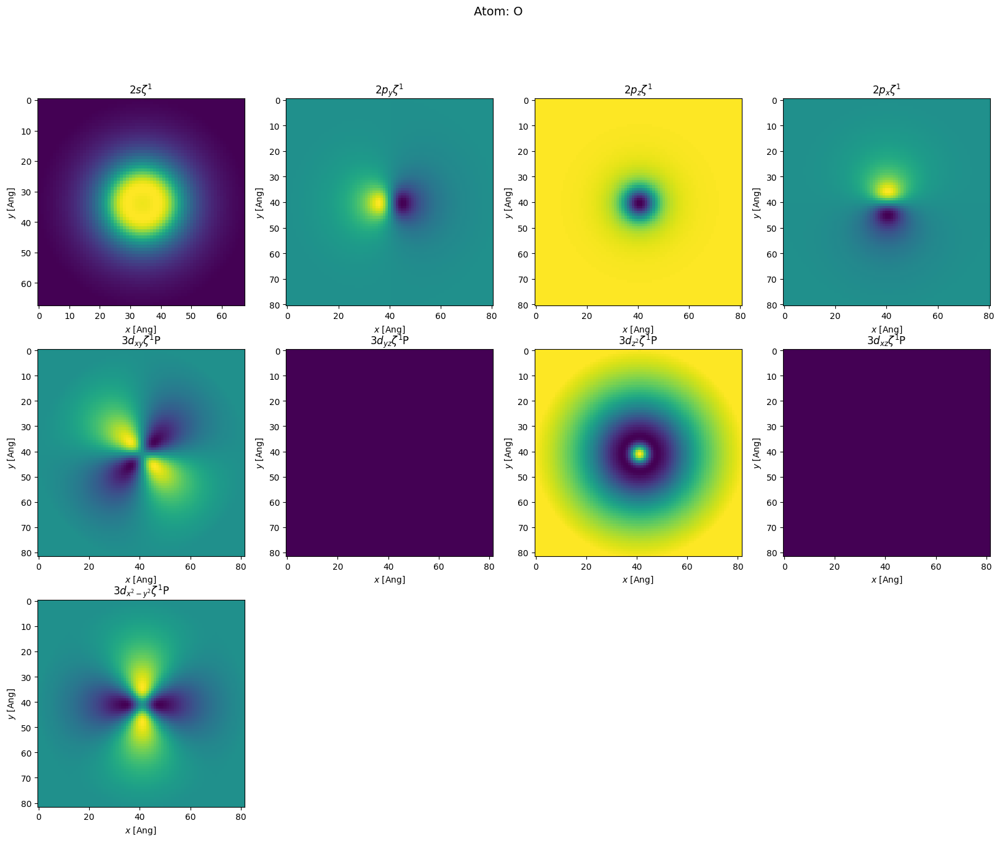

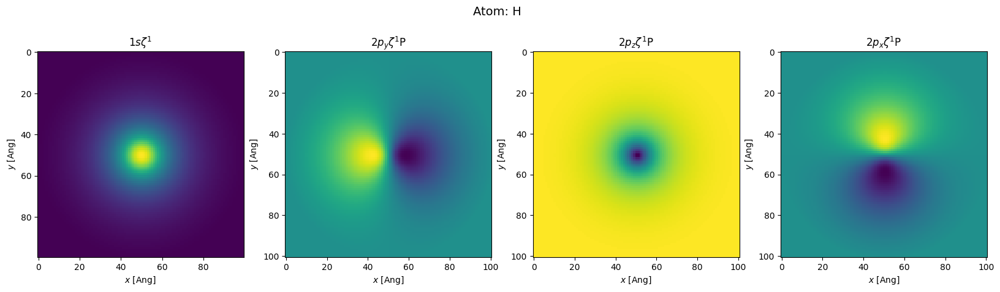

In [ ]:
def plot_atom(atom):
    no = len(atom)  # number of orbitals
    nx = no // 4
    ny = no // nx
    if nx * ny < no:
        nx += 1
    fig, axs = plt.subplots(nx, ny, figsize=(20, 5 * nx))
    fig.suptitle("Atom: {}".format(atom.symbol), fontsize=14)

    def my_plot(i, orb):
        grid = orb.toGrid(atom=atom)
        # Also write to a cube file
        grid.write("/content/water/{}_{}.cube".format(atom.symbol, orb.name()))
        c, r = i // 4, (i - 4) % 4
        if nx == 1:
            ax = axs[r]
        else:
            ax = axs[c][r]
        ax.imshow(grid.grid[:, :, grid.shape[2] // 2])
        ax.set_title(r"${}$".format(orb.name(True)))
        ax.set_xlabel(r"$x$ [Ang]")
        ax.set_ylabel(r"$y$ [Ang]")

    i = 0
    for orb in atom:
        my_plot(i, orb)
        i += 1
    if i < nx * ny:
        # This removes the empty plots
        for j in range(i, nx * ny):
            c, r = j // 4, (j - 4) % 4
            if nx == 1:
                ax = axs[r]
            else:
                ax = axs[c][r]
            fig.delaxes(ax)
        plt.draw()


plot_atom(h2o.atoms[0])
plot_atom(h2o.atoms[1])

<font color='green'>Pristine Graphene</font>
----------------------------

##### Creating the geometry

Instead of defining the atomic positions, the carbon atoms and supercell for graphene, we use a default implementation of graphene in sisl. There are a small selection of the typical geometries, including graphene.

In [ ]:
graphene = geom.graphene(1.44)

Let us plot the geometry.

In [ ]:
graphene.plot(axes="xyz", nsc=[5, 15, 3
                            ])

##### Generating input files

Now we need to create the input fdf file for Siesta:

In [ ]:
! cd /content &&  mkdir graphene
open("/content/graphene/RUN.fdf", "w").write(
    """
SystemName graphene
SystemLabel graphene

# Include Geomety file
%include STRUCT.fdf

PAO.BasisSize SZP
PAO.EnergyShift  200 meV
PAO.SplitNorm      0.15
PAO.OldStylePolOrbs F

XC.functional           GGA
XC.authors              PBE

MeshCutoff              500. Ry

SolutionMethod          diagon
Diag.ParllelOverK       true

ElectronicTemperature    1 meV

%block kgrid.MonkhorstPack
  61  1 1 0.
   1 61 1 0.
   0  0 1 0.
%endblock kgrid.MonkhorstPack

SCF.DM.Tolerance         1.0E-4

MaxSCFIterations        1000

DM.MixingWeight         0.005
DM.NumberPulay          8
DM.UseSaveDM            T
DM.NumberKick           25
DM.MixSCF1  F

WriteMullikenPop       1
WriteHirshfeldPop      t
WriteVoronoiPop        t

WriteForces            T
WriteCoorStep          T

CDF.Save true
CDF.Compress 9

TS.HS.Save true
SaveRho T
SaveTotalPotential t
"""
)
graphene.write("/content/graphene/STRUCT.fdf")

###### C.psf

In [ ]:
%%writefile /content/graphene/C.psf
 C  pb rel nc
 ATM3.3    22-JUL-16 Troullier-Martins
 2s 2.00r r= 1.25/2p 2.00r r= 1.25/3d 0.00r r= 1.25/4f 0.00r r= 1.25/
   4  3 1006  0.413125362778E-03  0.125000000000E-01   4.00000000000
 Radial grid follows
  0.519647735591E-05  0.104583183504E-04  0.157863451569E-04  0.211813902904E-04
  0.266442967376E-04  0.321759180888E-04  0.377771186712E-04  0.434487736837E-04
  0.491917693339E-04  0.550070029765E-04  0.608953832538E-04  0.668578302370E-04
  0.728952755706E-04  0.790086626178E-04  0.851989466078E-04  0.914670947849E-04
  0.978140865601E-04  0.104240913664E-03  0.110748580301E-03  0.117338103307E-03
  0.124010512309E-03  0.130766849885E-03  0.137608171725E-03  0.144535546801E-03
  0.151550057528E-03  0.158652799939E-03  0.165844883850E-03  0.173127433041E-03
  0.180501585424E-03  0.187968493225E-03  0.195529323164E-03  0.203185256636E-03
  0.210937489896E-03  0.218787234247E-03  0.226735716227E-03  0.234784177802E-03
  0.242933876561E-03  0.251186085910E-03  0.259542095276E-03  0.268003210300E-03
  0.276570753049E-03  0.285246062220E-03  0.294030493346E-03  0.302925419014E-03
  0.311932229074E-03  0.321052330857E-03  0.330287149399E-03  0.339638127658E-03
  0.349106726744E-03  0.358694426144E-03  0.368402723958E-03  0.378233137124E-03
  0.388187201666E-03  0.398266472927E-03  0.408472525813E-03  0.418806955041E-03
  0.429271375385E-03  0.439867421934E-03  0.450596750341E-03  0.461461037086E-03
  0.472461979735E-03  0.483601297207E-03  0.494880730045E-03  0.506302040682E-03
  0.517867013722E-03  0.529577456214E-03  0.541435197940E-03  0.553442091696E-03
  0.565600013583E-03  0.577910863301E-03  0.590376564446E-03  0.602999064808E-03
  0.615780336680E-03  0.628722377160E-03  0.641827208470E-03  0.655096878265E-03
  0.668533459959E-03  0.682139053044E-03  0.695915783422E-03  0.709865803737E-03
  0.723991293705E-03  0.738294460465E-03  0.752777538914E-03  0.767442792064E-03
  0.782292511390E-03  0.797329017191E-03  0.812554658952E-03  0.827971815710E-03
  0.843582896426E-03  0.859390340366E-03  0.875396617472E-03  0.891604228760E-03
  0.908015706701E-03  0.924633615621E-03  0.941460552104E-03  0.958499145392E-03
  0.975752057800E-03  0.993221985131E-03  0.101091165710E-02  0.102882383774E-02
  0.104696132589E-02  0.106532695554E-02  0.108392359638E-02  0.110275415417E-02
  0.112182157122E-02  0.114112882684E-02  0.116067893785E-02  0.118047495898E-02
  0.120051998340E-02  0.122081714319E-02  0.124136960982E-02  0.126218059466E-02
  0.128325334946E-02  0.130459116689E-02  0.132619738102E-02  0.134807536786E-02
  0.137022854591E-02  0.139266037663E-02  0.141537436504E-02  0.143837406026E-02
  0.146166305603E-02  0.148524499131E-02  0.150912355081E-02  0.153330246562E-02
  0.155778551374E-02  0.158257652069E-02  0.160767936012E-02  0.163309795440E-02
  0.165883627524E-02  0.168489834429E-02  0.171128823383E-02  0.173801006730E-02
  0.176506802007E-02  0.179246631998E-02  0.182020924808E-02  0.184830113926E-02
  0.187674638292E-02  0.190554942371E-02  0.193471476215E-02  0.196424695539E-02
  0.199415061789E-02  0.202443042215E-02  0.205509109947E-02  0.208613744064E-02
  0.211757429670E-02  0.214940657973E-02  0.218163926359E-02  0.221427738470E-02
  0.224732604283E-02  0.228079040192E-02  0.231467569082E-02  0.234898720418E-02
  0.238373030326E-02  0.241891041672E-02  0.245453304153E-02  0.249060374380E-02
  0.252712815966E-02  0.256411199611E-02  0.260156103195E-02  0.263948111868E-02
  0.267787818138E-02  0.271675821967E-02  0.275612730864E-02  0.279599159979E-02
  0.283635732199E-02  0.287723078247E-02  0.291861836780E-02  0.296052654486E-02
  0.300296186189E-02  0.304593094951E-02  0.308944052171E-02  0.313349737695E-02
  0.317810839922E-02  0.322328055906E-02  0.326902091473E-02  0.331533661325E-02
  0.336223489154E-02  0.340972307754E-02  0.345780859140E-02  0.350649894656E-02
  0.355580175099E-02  0.360572470836E-02  0.365627561923E-02  0.370746238228E-02
  0.375929299555E-02  0.381177555768E-02  0.386491826917E-02  0.391872943368E-02
  0.397321745932E-02  0.402839085995E-02  0.408425825652E-02  0.414082837844E-02
  0.419811006489E-02  0.425611226626E-02  0.431484404551E-02  0.437431457960E-02
  0.443453316091E-02  0.449550919874E-02  0.455725222070E-02  0.461977187428E-02
  0.468307792828E-02  0.474718027442E-02  0.481208892881E-02  0.487781403357E-02
  0.494436585837E-02  0.501175480207E-02  0.507999139434E-02  0.514908629728E-02
  0.521905030710E-02  0.528989435583E-02  0.536162951300E-02  0.543426698736E-02
  0.550781812868E-02  0.558229442946E-02  0.565770752678E-02  0.573406920410E-02
  0.581139139307E-02  0.588968617544E-02  0.596896578495E-02  0.604924260918E-02
  0.613052919155E-02  0.621283823326E-02  0.629618259526E-02  0.638057530028E-02
  0.646602953486E-02  0.655255865138E-02  0.664017617019E-02  0.672889578173E-02
  0.681873134860E-02  0.690969690779E-02  0.700180667286E-02  0.709507503615E-02
  0.718951657102E-02  0.728514603417E-02  0.738197836788E-02  0.748002870241E-02
  0.757931235832E-02  0.767984484889E-02  0.778164188252E-02  0.788471936520E-02
  0.798909340300E-02  0.809478030458E-02  0.820179658373E-02  0.831015896196E-02
  0.841988437111E-02  0.853098995601E-02  0.864349307712E-02  0.875741131329E-02
  0.887276246447E-02  0.898956455452E-02  0.910783583399E-02  0.922759478303E-02
  0.934886011420E-02  0.947165077546E-02  0.959598595311E-02  0.972188507476E-02
  0.984936781241E-02  0.997845408550E-02  0.101091640640E-01  0.102415181717E-01
  0.103755370891E-01  0.105112417569E-01  0.106486533793E-01  0.107877934272E-01
  0.109286836414E-01  0.110713460363E-01  0.112158029033E-01  0.113620768140E-01
  0.115101906239E-01  0.116601674763E-01  0.118120308052E-01  0.119658043396E-01
  0.121215121070E-01  0.122791784370E-01  0.124388279653E-01  0.126004856374E-01
  0.127641767127E-01  0.129299267683E-01  0.130977617030E-01  0.132677077412E-01
  0.134397914374E-01  0.136140396801E-01  0.137904796959E-01  0.139691390538E-01
  0.141500456698E-01  0.143332278109E-01  0.145187140997E-01  0.147065335188E-01
  0.148967154153E-01  0.150892895057E-01  0.152842858799E-01  0.154817350065E-01
  0.156816677374E-01  0.158841153124E-01  0.160891093645E-01  0.162966819244E-01
  0.165068654256E-01  0.167196927098E-01  0.169351970317E-01  0.171534120642E-01
  0.173743719040E-01  0.175981110764E-01  0.178246645411E-01  0.180540676976E-01
  0.182863563906E-01  0.185215669157E-01  0.187597360249E-01  0.190009009328E-01
  0.192450993218E-01  0.194923693483E-01  0.197427496490E-01  0.199962793461E-01
  0.202529980542E-01  0.205129458861E-01  0.207761634592E-01  0.210426919019E-01
  0.213125728596E-01  0.215858485019E-01  0.218625615286E-01  0.221427551767E-01
  0.224264732270E-01  0.227137600110E-01  0.230046604180E-01  0.232992199016E-01
  0.235974844875E-01  0.238995007799E-01  0.242053159697E-01  0.245149778410E-01
  0.248285347791E-01  0.251460357780E-01  0.254675304479E-01  0.257930690228E-01
  0.261227023690E-01  0.264564819922E-01  0.267944600462E-01  0.271366893408E-01
  0.274832233500E-01  0.278341162205E-01  0.281894227799E-01  0.285491985456E-01
  0.289134997334E-01  0.292823832660E-01  0.296559067823E-01  0.300341286460E-01
  0.304171079551E-01  0.308049045509E-01  0.311975790273E-01  0.315951927407E-01
  0.319978078188E-01  0.324054871713E-01  0.328182944986E-01  0.332362943030E-01
  0.336595518976E-01  0.340881334174E-01  0.345221058291E-01  0.349615369417E-01
  0.354064954172E-01  0.358570507814E-01  0.363132734344E-01  0.367752346620E-01
  0.372430066464E-01  0.377166624781E-01  0.381962761667E-01  0.386819226529E-01
  0.391736778198E-01  0.396716185053E-01  0.401758225135E-01  0.406863686275E-01
  0.412033366210E-01  0.417268072713E-01  0.422568623719E-01  0.427935847449E-01
  0.433370582542E-01  0.438873678187E-01  0.444445994254E-01  0.450088401429E-01
  0.455801781349E-01  0.461587026741E-01  0.467445041562E-01  0.473376741139E-01
  0.479383052312E-01  0.485464913578E-01  0.491623275242E-01  0.497859099559E-01
  0.504173360891E-01  0.510567045852E-01  0.517041153470E-01  0.523596695337E-01
  0.530234695770E-01  0.536956191969E-01  0.543762234183E-01  0.550653885869E-01
  0.557632223862E-01  0.564698338541E-01  0.571853334001E-01  0.579098328224E-01
  0.586434453257E-01  0.593862855382E-01  0.601384695304E-01  0.609001148325E-01
  0.616713404531E-01  0.624522668977E-01  0.632430161879E-01  0.640437118796E-01
  0.648544790834E-01  0.656754444831E-01  0.665067363563E-01  0.673484845940E-01
  0.682008207211E-01  0.690638779170E-01  0.699377910359E-01  0.708226966287E-01
  0.717187329636E-01  0.726260400480E-01  0.735447596507E-01  0.744750353234E-01
  0.754170124236E-01  0.763708381370E-01  0.773366615010E-01  0.783146334274E-01
  0.793049067262E-01  0.803076361298E-01  0.813229783165E-01  0.823510919358E-01
  0.833921376324E-01  0.844462780718E-01  0.855136779657E-01  0.865945040974E-01
  0.876889253482E-01  0.887971127237E-01  0.899192393804E-01  0.910554806529E-01
  0.922060140812E-01  0.933710194384E-01  0.945506787590E-01  0.957451763673E-01
  0.969546989058E-01  0.981794353650E-01  0.994195771124E-01  0.100675317923
  0.101946854008      0.103234384048      0.104538109222      0.105858233241
  0.107194962375      0.108548505492      0.109919074086      0.111306882310
  0.112712147012      0.114135087769      0.115575926917      0.117034889590
  0.118512203755      0.120008100244      0.121522812795      0.123056578084
  0.124609635766      0.126182228508      0.127774602032      0.129387005149
  0.131019689801      0.132672911097      0.134346927357      0.136042000150
  0.137758394334      0.139496378099      0.141256223008      0.143038204041
  0.144842599637      0.146669691735      0.148519765822      0.150393110977
  0.152290019912      0.154210789025      0.156155718439      0.158125112054
  0.160119277591      0.162138526642      0.164183174720      0.166253541304
  0.168349949894      0.170472728058      0.172622207484      0.174798724033
  0.177002617790      0.179234233118      0.181493918711      0.183782027650
  0.186098917456      0.188444950148      0.190820492299      0.193225915092
  0.195661594379      0.198127910739      0.200625249541      0.203154000997
  0.205714560231      0.208307327336      0.210932707436      0.213591110752
  0.216282952665      0.219008653782      0.221768639998      0.224563342567
  0.227393198166      0.230258648967      0.233160142703      0.236098132736
  0.239073078135      0.242085443740      0.245135700240      0.248224324244
  0.251351798355      0.254518611248      0.257725257743      0.260972238886
  0.264260062023      0.267589240885      0.270960295661      0.274373753087
  0.277830146522      0.281330016034      0.284873908485      0.288462377615
  0.292095984131      0.295775295790      0.299500887492      0.303273341369
  0.307093246874      0.310961200876      0.314877807750      0.318843679473
  0.322859435722      0.326925703966      0.331043119568      0.335212325882
  0.339433974357      0.343708724632      0.348037244646      0.352420210739
  0.356858307759      0.361352229168      0.365902677149      0.370510362719
  0.375176005839      0.379900335525      0.384684089963      0.389528016625
  0.394432872383      0.399399423632      0.404428446405      0.409520726497
  0.414677059587      0.419898251364      0.425185117648      0.430538484523
  0.435959188465      0.441448076468      0.447006006183      0.452633846047
  0.458332475423      0.464102784732      0.469945675597      0.475862060981
  0.481852865333      0.487919024726      0.494061487012      0.500281211962
  0.506579171420      0.512956349457      0.519413742518      0.525952359586
  0.532573222331      0.539277365277      0.546065835960      0.552939695093
  0.559900016730      0.566947888436      0.574084411454      0.581310700881
  0.588627885839      0.596037109654      0.603539530032      0.611136319240
  0.618828664294      0.626617767137      0.634504844833      0.642491129753
  0.650577869772      0.658766328457      0.667057785274      0.675453535778
  0.683954891823      0.692563181763      0.701279750661      0.710105960499
  0.719043190389      0.728092836792      0.737256313734      0.746535053027
  0.755930504492      0.765444136188      0.775077434640      0.784831905069
  0.794709071632      0.804710477656      0.814837685880      0.825092278703
  0.835475858425      0.845990047501      0.856636488794      0.867416845834
  0.878332803072      0.889386066149      0.900578362161      0.911911439925
  0.923387070259      0.935007046253      0.946773183552      0.958687320638
  0.970751319121      0.982967064024      0.995336464082       1.00786145204
   1.02054398495       1.03338604449       1.04638963725       1.05955679507
   1.07288957535       1.08639006136       1.10006036258       1.11390261502
   1.12791898156       1.14211165229       1.15648284484       1.17103480474
   1.18576980576       1.20069015027       1.21579816962       1.23109622446
   1.24658670514       1.26227203208       1.27815465614       1.29423705902
   1.31052175363       1.32701128448       1.34370822809       1.36061519340
   1.37773482215       1.39506978933       1.41262280354       1.43039660750
   1.44839397839       1.46661772834       1.48507070484       1.50375579121
   1.52267590704       1.54183400862       1.56123308946       1.58087618070
   1.60076635160       1.62090671006       1.64130040305       1.66195061711
   1.68286057888       1.70403355560       1.72547285558       1.74718182876
   1.76916386720       1.79142240565       1.81396092205       1.83678293808
   1.85989201973       1.88329177785       1.90698586869       1.93097799451
   1.95527190412       1.97987139349       2.00478030634       2.03000253475
   2.05554201974       2.08140275191       2.10758877203       2.13410417175
   2.16095309413       2.18813973439       2.21566834048       2.24354321380
   2.27176870988       2.30034923898       2.32928926689       2.35859331553
   2.38826596373       2.41831184790       2.44873566277       2.47954216212
   2.51073615952       2.54232252911       2.57430620632       2.60669218867
   2.63948553652       2.67269137391       2.70631488932       2.74036133649
   2.77483603524       2.80974437232       2.84509180222       2.88088384807
   2.91712610242       2.95382422821       2.99098395961       3.02861110288
   3.06671153735       3.10529121629       3.14435616785       3.18391249601
   3.22396638153       3.26452408290       3.30559193736       3.34717636184
   3.38928385398       3.43192099317       3.47509444155       3.51881094506
   3.56307733449       3.60790052656       3.65328752497       3.69924542154
   3.74578139729       3.79290272356       3.84061676314       3.88893097146
   3.93785289771       3.98739018603       4.03755057674       4.08834190749
   4.13977211453       4.19184923394       4.24458140287       4.29797686084
   4.35204395098       4.40679112140       4.46222692645       4.51836002808
   4.57519919721       4.63275331508       4.69103137463       4.75004248193
   4.80979585758       4.87030083818       4.93156687774       4.99360354920
   5.05642054594       5.12002768322       5.18443489980       5.24965225943
   5.31568995246       5.38255829741       5.45026774259       5.51882886775
   5.58825238570       5.65854914401       5.72973012669       5.80180645590
   5.87478939374       5.94869034391       6.02352085361       6.09929261525
   6.17601746832       6.25370740124       6.33237455321       6.41203121614
   6.49268983655       6.57436301750       6.65706352061       6.74080426798
   6.82559834429       6.91145899878       6.99839964734       7.08643387465
   7.17557543621       7.26583826059       7.35723645153       7.44978429019
   7.54349623735       7.63838693569       7.73447121209       7.83176407990
   7.93028074133       8.03003658982       8.13104721241       8.23332839223
   8.33689611090       8.44176655111       8.54795609907       8.65548134711
   8.76435909627       8.87460635893       8.98624036143       9.09927854683
   9.21373857756       9.32963833824       9.44699593845       9.56582971554
   9.68615823755       9.80800030603       9.93137495907       10.0563014742
   10.1827993714       10.3108884164       10.4405886231       10.5719202577
   10.7049038408       10.8395601515       10.9759102300       11.1139753815
   11.2537771787       11.3953374661       11.5386783626       11.6838222658
   11.8307918544       11.9796100929       12.1303002344       12.2828858246
   12.4373907052       12.5938390179       12.7522552082       12.9126640288
   13.0750905441       13.2395601333       13.4060984954       13.5747316521
   13.7454859529       13.9183880783       14.0934650448       14.2707442083
   14.4502532693       14.6320202763       14.8160736307       15.0024420914
   15.1911547787       15.3822411794       15.5757311512       15.7716549271
   15.9700431208       16.1709267308       16.3743371455       16.5803061483
   16.7888659222       17.0000490551       17.2138885448       17.4304178042
   17.6496706663       17.8716813900       18.0964846648       18.3241156167
   18.5546098134       18.7880032703       19.0243324555       19.2636342958
   19.5059461828       19.7513059781       19.9997520197       20.2513231278
   20.5060586108       20.7639982718       21.0251824144       21.2896518490
   21.5574478996       21.8286124098       22.1031877496       22.3812168221
   22.6627430698       22.9478104818       23.2364636004       23.5287475282
   23.8247079353       24.1243910660       24.4278437464       24.7351133917
   25.0462480134       25.3612962267       25.6803072588       26.0033309557
   26.3304177905       26.6616188712       26.9969859486       27.3365714246
   27.6804283600       28.0286104833       28.3811721985       28.7381685941
   29.0996554516       29.4656892540       29.8363271949       30.2116271872
   30.5916478722       30.9764486290       31.3660895834       31.7606316177
   32.1601363799       32.5646662934       32.9742845668       33.3890552038
   33.8090430131       34.2343136188       34.6649334701       35.1009698524
   35.5424908972       35.9895655931       36.4422637963       36.9006562420
   37.3648145548       37.8348112605       38.3107197970       38.7926145259
   39.2805707443       39.7746646964       40.2749735853       40.7815755853
   41.2945498541       41.8139765448       42.3399368189       42.8725128589
   43.4117878808       43.9578461475       44.5107729815       45.0706547790
   45.6375790225       46.2116342952       46.7929102942       47.3814978453
   47.9774889163       48.5809766322       49.1920552890       49.8108203691
   50.4373685558       51.0717977485       51.7142070781       52.3646969223
   53.0233689214       53.6903259944       54.3656723546       55.0495135262
   55.7419563609       56.4431090543       57.1530811628       57.8719836211
   58.5999287591       59.3370303198       60.0834034767       60.8391648522
   61.6044325355       62.3793261013       63.1639666283       63.9584767182
   64.7629805146       65.5776037232       66.4024736302       67.2377191234
   68.0834707116       68.9398605451       69.8070224367       70.6850918821
   71.5742060815       72.4745039607       73.3861261932       74.3092152217
   75.2439152809       76.1903724195       77.1487345233       78.1191513384
   79.1017744944       80.0967575281       81.1042559077       82.1244270568
   83.1574303794       84.2034272841       85.2625812102       86.3350576527
   87.4210241881       88.5206505010       89.6341084101       90.7615718956
   91.9032171259       93.0592224855       94.2297686024       95.4150383769
   96.6152170099       97.8304920316       99.0610533313       100.307093187
   101.568806294       102.846389798       104.140043325       105.449969010
   106.776371532       108.119458143       109.479438704       110.856525715
   112.250934349       113.662882483       115.092590739       116.540282511
   118.006184003       119.490524267
 Down Pseudopotential follows (l on next line)
  0
 -0.947152835831E-05 -0.190615105301E-04 -0.287735101746E-04 -0.386055998494E-04
 -0.485637491617E-04 -0.586451947572E-04 -0.688546860317E-04 -0.791920919896E-04
 -0.896597202580E-04 -0.100259024798E-03 -0.110991699483E-03 -0.121859425459E-03
 -0.132863907849E-03 -0.144006873593E-03 -0.155290071717E-03 -0.166715273637E-03
 -0.178284273465E-03 -0.189998888304E-03 -0.201860958555E-03 -0.213872348243E-03
 -0.226034945326E-03 -0.238350662015E-03 -0.250821435108E-03 -0.263449226328E-03
 -0.276236022650E-03 -0.289183836641E-03 -0.302294706838E-03 -0.315570698067E-03
 -0.329013901820E-03 -0.342626436627E-03 -0.356410448413E-03 -0.370368110888E-03
 -0.384501625924E-03 -0.398813223945E-03 -0.413305164335E-03 -0.427979735823E-03
 -0.442839256904E-03 -0.457886076259E-03 -0.473122573168E-03 -0.488551157952E-03
 -0.504174272388E-03 -0.519994390203E-03 -0.536014017475E-03 -0.552235693100E-03
 -0.568661989318E-03 -0.585295512123E-03 -0.602138901751E-03 -0.619194833259E-03
 -0.636466016892E-03 -0.653955198717E-03 -0.671665161139E-03 -0.689598723231E-03
 -0.707758741612E-03 -0.726148110746E-03 -0.744769763474E-03 -0.763626671910E-03
 -0.782721847569E-03 -0.802058342307E-03 -0.821639248842E-03 -0.841467701123E-03
 -0.861546875446E-03 -0.881879990663E-03 -0.902470308910E-03 -0.923321136571E-03
 -0.944435824435E-03 -0.965817768965E-03 -0.987470412583E-03 -0.100939724438E-02
 -0.103160180139E-02 -0.105408766852E-02 -0.107685847994E-02 -0.109991791971E-02
 -0.112326972235E-02 -0.114691767404E-02 -0.117086561310E-02 -0.119511743090E-02
 -0.121967707302E-02 -0.124454853973E-02 -0.126973588721E-02 -0.129524322837E-02
 -0.132107473337E-02 -0.134723463156E-02 -0.137372721171E-02 -0.140055682280E-02
 -0.142772787604E-02 -0.145524484488E-02 -0.148311226675E-02 -0.151133474418E-02
 -0.153991694499E-02 -0.156886360513E-02 -0.159817952815E-02 -0.162786958715E-02
 -0.165793872712E-02 -0.168839196372E-02 -0.171923438613E-02 -0.175047115972E-02
 -0.178210752444E-02 -0.181414879775E-02 -0.184660037739E-02 -0.187946773983E-02
 -0.191275644400E-02 -0.194647213344E-02 -0.198062053471E-02 -0.201520746224E-02
 -0.205023881901E-02 -0.208572059722E-02 -0.212165888118E-02 -0.215805984883E-02
 -0.219492977391E-02 -0.223227502680E-02 -0.227010207777E-02 -0.230841749800E-02
 -0.234722796204E-02 -0.238654025051E-02 -0.242636125091E-02 -0.246669796081E-02
 -0.250755749016E-02 -0.254894706334E-02 -0.259087402160E-02 -0.263334582589E-02
 -0.267637005874E-02 -0.271995442691E-02 -0.276410676568E-02 -0.280883504021E-02
 -0.285414734743E-02 -0.290005192097E-02 -0.294655713398E-02 -0.299367150088E-02
 -0.304140368131E-02 -0.308976248405E-02 -0.313875686990E-02 -0.318839595411E-02
 -0.323868901193E-02 -0.328964548181E-02 -0.334127496745E-02 -0.339358724394E-02
 -0.344659226137E-02 -0.350030014766E-02 -0.355472121415E-02 -0.360986596071E-02
 -0.366574507716E-02 -0.372236945170E-02 -0.377975017473E-02 -0.383789854142E-02
 -0.389682605931E-02 -0.395654445396E-02 -0.401706567333E-02 -0.407840189234E-02
 -0.414056552080E-02 -0.420356920840E-02 -0.426742585153E-02 -0.433214859886E-02
 -0.439775085690E-02 -0.446424630021E-02 -0.453164887546E-02 -0.459997280806E-02
 -0.466923261314E-02 -0.473944310000E-02 -0.481061938013E-02 -0.488277687832E-02
 -0.495593133906E-02 -0.503009883204E-02 -0.510529576572E-02 -0.518153889958E-02
 -0.525884534312E-02 -0.533723257278E-02 -0.541671844508E-02 -0.549732119754E-02
 -0.557905946967E-02 -0.566195230742E-02 -0.574601917430E-02 -0.583127996997E-02
 -0.591775503508E-02 -0.600546516655E-02 -0.609443163286E-02 -0.618467618374E-02
 -0.627622106431E-02 -0.636908903461E-02 -0.646330337663E-02 -0.655888791293E-02
 -0.665586702530E-02 -0.675426566496E-02 -0.685410937449E-02 -0.695542429975E-02
 -0.705823721159E-02 -0.716257552533E-02 -0.726846731160E-02 -0.737594132475E-02
 -0.748502701761E-02 -0.759575456149E-02 -0.770815487381E-02 -0.782225962909E-02
 -0.793810128896E-02 -0.805571312734E-02 -0.817512924428E-02 -0.829638459903E-02
 -0.841951503478E-02 -0.854455729663E-02 -0.867154906793E-02 -0.880052899289E-02
 -0.893153670346E-02 -0.906461285064E-02 -0.919979913597E-02 -0.933713833704E-02
 -0.947667433927E-02 -0.961845218027E-02 -0.976251806208E-02 -0.990891939885E-02
 -0.100577048599E-01 -0.102089243806E-01 -0.103626292205E-01 -0.105188719981E-01
 -0.106777067165E-01 -0.108391888231E-01 -0.110033752309E-01 -0.111703243727E-01
 -0.113400962433E-01 -0.115127524314E-01 -0.116883561821E-01 -0.118669724274E-01
 -0.120486678444E-01 -0.122335108934E-01 -0.124215718680E-01 -0.126129229606E-01
 -0.128076382868E-01 -0.130057939600E-01 -0.132074681340E-01 -0.134127410528E-01
 -0.136216951227E-01 -0.138344149468E-01 -0.140509873931E-01 -0.142715016540E-01
 -0.144960492996E-01 -0.147247243419E-01 -0.149576232872E-01 -0.151948452026E-01
 -0.154364917858E-01 -0.156826674055E-01 -0.159334791865E-01 -0.161890370677E-01
 -0.164494538524E-01 -0.167148452913E-01 -0.169853301360E-01 -0.172610302098E-01
 -0.175420704673E-01 -0.178285790603E-01 -0.181206874157E-01 -0.184185302801E-01
 -0.187222457901E-01 -0.190319755503E-01 -0.193478646839E-01 -0.196700618910E-01
 -0.199987195231E-01 -0.203339936366E-01 -0.206760440496E-01 -0.210250344037E-01
 -0.213811322200E-01 -0.217445089508E-01 -0.221153400241E-01 -0.224938049161E-01
 -0.228800871618E-01 -0.232743744323E-01 -0.236768585589E-01 -0.240877355509E-01
 -0.245072056773E-01 -0.249354734430E-01 -0.253727476384E-01 -0.258192413522E-01
 -0.262751719848E-01 -0.267407612545E-01 -0.272162351903E-01 -0.277018241490E-01
 -0.281977627679E-01 -0.287042899660E-01 -0.292216489225E-01 -0.297500870041E-01
 -0.302898557587E-01 -0.308412108471E-01 -0.314044119442E-01 -0.319797227076E-01
 -0.325674106703E-01 -0.331677471365E-01 -0.337810070741E-01 -0.344074689842E-01
 -0.350474147736E-01 -0.357011295984E-01 -0.363689016908E-01 -0.370510221772E-01
 -0.377477848915E-01 -0.384594861474E-01 -0.391864245236E-01 -0.399289005985E-01
 -0.406872166970E-01 -0.414616765998E-01 -0.422525852375E-01 -0.430602483924E-01
 -0.438849723228E-01 -0.447270634127E-01 -0.455868278058E-01 -0.464645709940E-01
 -0.473605973782E-01 -0.482752098443E-01 -0.492087092820E-01 -0.501613941088E-01
 -0.511335597609E-01 -0.521254981408E-01 -0.531374970980E-01 -0.541698398304E-01
 -0.552228042953E-01 -0.562966626085E-01 -0.573916803951E-01 -0.585081161219E-01
 -0.596462204601E-01 -0.608062355658E-01 -0.619883943656E-01 -0.631929198499E-01
 -0.644200243136E-01 -0.656699086160E-01 -0.669427613970E-01 -0.682387582968E-01
 -0.695580611676E-01 -0.709008172912E-01 -0.722671585308E-01 -0.736572005532E-01
 -0.750710420203E-01 -0.765087637416E-01 -0.779704278924E-01 -0.794560771819E-01
 -0.809657340890E-01 -0.824994000196E-01 -0.840570545562E-01 -0.856386547381E-01
 -0.872441342106E-01 -0.888734025884E-01 -0.905263447529E-01 -0.922028201495E-01
 -0.939026621548E-01 -0.956256774881E-01 -0.973716456751E-01 -0.991403184668E-01
 -0.100931419405     -0.102744643426     -0.104579656432     -0.106436095019
 -0.108313566261     -0.110211647448     -0.112129886047     -0.114067799651
 -0.116024876000     -0.118000573129     -0.119994319541     -0.122005514557
 -0.124033528675     -0.126077704023     -0.128137355024     -0.130211769007
 -0.132300207010     -0.134401904727     -0.136516073440     -0.138641901176
 -0.140778553931     -0.142925177003     -0.145080896439     -0.147244820618
 -0.149416041938     -0.151593638589     -0.153776676484     -0.155964211276
 -0.158155290483     -0.160348955732     -0.162544245081     -0.164740195486
 -0.166935845300     -0.169130236909     -0.171322419440     -0.173511451517
 -0.175696404130     -0.177876363510     -0.180050434098     -0.182217741545
 -0.184377435704     -0.186528693688     -0.188670722908     -0.190802764107
 -0.192924094364     -0.195034030083     -0.197131929919     -0.199217197635
 -0.201289284889     -0.203347693921     -0.205391980141     -0.207421754565
 -0.209436686138     -0.211436503885     -0.213420998901     -0.215390026143
 -0.217343506019     -0.219281425819     -0.221203840835     -0.223110875312
 -0.225002723156     -0.226879648333     -0.228741985091     -0.230590137848
 -0.232424580852     -0.234245857563     -0.236054579760     -0.237851426389
 -0.239637142135     -0.241412535747     -0.243178478105     -0.244935900034
 -0.246685789900     -0.248429190977     -0.250167198592     -0.251900957101
 -0.253631656668     -0.255360529883     -0.257088848246     -0.258817918519
 -0.260549078973     -0.262283695546     -0.264023157945     -0.265768875684
 -0.267522274108     -0.269284790408     -0.271057869638     -0.272842960763
 -0.274641512767     -0.276454970797     -0.278284772405     -0.280132343870
 -0.281999096625     -0.283886423800     -0.285795696882     -0.287728262513
 -0.289685439418     -0.291668515482     -0.293678744970     -0.295717345891
 -0.297785497512     -0.299884338020     -0.302014962327     -0.304178420011
 -0.306375713401     -0.308607795782     -0.310875569729     -0.313179885561
 -0.315521539886     -0.317901274265     -0.320319773953     -0.322777666726
 -0.325275521776     -0.327813848677     -0.330393096395     -0.333013652358
 -0.335675841552     -0.338379925658     -0.341126102219     -0.343914503824
 -0.346745197318     -0.349618183032     -0.352533394037     -0.355490695414
 -0.358489883565     -0.361530685555     -0.364612758505     -0.367735689046
 -0.370898992851     -0.374102114268     -0.377344426072     -0.380625229370
 -0.383943753686     -0.387299157268     -0.390690527642     -0.394116882483
 -0.397577170836     -0.401070274738     -0.404595011325     -0.408150135465
 -0.411734343005     -0.415346274700     -0.418984520914     -0.422647627184
 -0.426334100720     -0.430042417974     -0.433771033351     -0.437518389182
 -0.441282927083     -0.445063100788     -0.448857390593     -0.452664319532
 -0.456482471378     -0.460310510621     -0.464147204507     -0.467991447263
 -0.471842286606     -0.475698952638     -0.479560889202     -0.483427787774
 -0.487299623951     -0.491176696577     -0.495059669515     -0.498949616078
 -0.502848066085     -0.506757055489     -0.510679178513     -0.514617642156
 -0.518576322968     -0.522559825905     -0.526573545062     -0.530623726083
 -0.534717529978     -0.538863098068     -0.543069617779     -0.547347388950
 -0.551707890341     -0.556163846009     -0.560729291190     -0.565419637389
 -0.570251736322     -0.575243942409     -0.580416173530     -0.585789969750
 -0.591388549783     -0.597236864951     -0.603361650429     -0.609791473593
 -0.616556779275     -0.623689931745     -0.631225253225     -0.639199058714
 -0.647649686856     -0.656617526534     -0.666145038799     -0.676276773632
 -0.687059380969     -0.698541615253     -0.710774332699     -0.723810480292
 -0.737705075455     -0.752515175185     -0.768299833412     -0.785120045283
 -0.803038677087     -0.822120380648     -0.842431491153     -0.864039907667
 -0.887014955961     -0.911427233755     -0.937348439112     -0.964851183428
 -0.994008791299      -1.02489509047      -1.05758419601      -1.09215029387
  -1.12866742971      -1.16720930988      -1.20784912169      -1.25065938043
  -1.29571181037      -1.34307726607      -1.39282569923      -1.44502617423
  -1.49974693292      -1.55705550633      -1.61701886718      -1.67970361342
  -1.74517616909      -1.81350298496      -1.88475071835      -1.95898636892
  -2.03627734547      -2.11669143885      -2.20029667633      -2.28716103540
  -2.37735199791      -2.47093592975      -2.56797727632      -2.66853756933
  -2.77267424572      -2.88043928493      -2.99187767510      -3.10702572294
  -3.22590922479      -3.34854151912      -3.47492144162      -3.60503120536
  -3.73883422870      -3.87627293374      -4.01726653845      -4.16170886603
  -4.30946619560      -4.46037518020      -4.61424085947      -4.77083479761
  -4.92989338033      -5.09111630848      -5.25416533076      -5.41866326260
  -5.58419334356      -5.75029899049      -5.91648400871      -6.08221332750
  -6.24691432987      -6.40997884875      -6.57076590294      -6.72860524527
  -6.88280179317      -7.03264100700      -7.17739527486      -7.31633135301
  -7.44871889960      -7.57384012435      -7.69100055941      -7.79954093561
  -7.89885012287      -7.98837906395      -8.06765559403      -8.13629999575
  -8.19404108522      -8.24073256062      -8.27636926484      -8.30110291724
  -8.31525675110      -8.31933834956      -8.31404979825      -8.30029406121
  -8.27917623020      -8.25199798774      -8.22024324874      -8.18555249230
  -8.14968274842      -8.11444953858      -8.08164635761      -8.05293575097
  -8.02970853104      -8.01288905546      -8.00272937422      -7.99843250206
  -7.99789440168      -7.99812852088      -7.99830308153      -7.99845940950
  -7.99862492669      -7.99876498300      -7.99889736659      -7.99909653459
  -7.99926243393      -7.99939990326      -7.99951343056      -7.99960684553
  -7.99968343655      -7.99974600945      -7.99979694728      -7.99983826473
  -7.99987165766      -7.99989854745      -7.99992012050      -7.99993736301
  -7.99995109151      -7.99996197936      -7.99997057966      -7.99997734494
  -7.99998264401      -7.99998677625      -7.99998998373      -7.99999246137
  -7.99999436552      -7.99999582102      -7.99999692721      -7.99999776272
  -7.99999838956      -7.99999885639      -7.99999920122      -7.99999945360
  -7.99999963636      -7.99999976709      -7.99999985922      -7.99999992297
  -7.99999996606      -7.99999999428      -8.00000001195      -8.00000002223
  -8.00000002746      -8.00000002933      -8.00000002904      -8.00000002743
  -8.00000002509      -8.00000002243      -8.00000001969      -8.00000001704
  -8.00000001458      -8.00000001236      -8.00000001039      -8.00000000867
  -8.00000000719      -8.00000000593      -8.00000000487      -8.00000000398
  -8.00000000324      -8.00000000263      -8.00000000213      -8.00000000172
  -8.00000000138      -8.00000000111      -8.00000000089      -8.00000000071
  -8.00000000057      -8.00000000045      -8.00000000036      -8.00000000028
  -8.00000000023      -8.00000000018      -8.00000000014      -8.00000000011
  -8.00000000009      -8.00000000007      -8.00000000005      -8.00000000004
  -8.00000000003      -8.00000000003      -8.00000000002      -8.00000000002
  -8.00000000001      -8.00000000001      -8.00000000001      -8.00000000001
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000
 Down Pseudopotential follows (l on next line)
  1
 -0.115355604146E-03 -0.232161519822E-03 -0.350438063394E-03 -0.470200270852E-03
 -0.591471288607E-03 -0.714265746166E-03 -0.838606004563E-03 -0.964509765967E-03
 -0.109199739548E-02 -0.122108863169E-02 -0.135180368306E-02 -0.148416297823E-02
 -0.161818720562E-02 -0.175389731428E-02 -0.189131451709E-02 -0.203046029415E-02
 -0.217135639619E-02 -0.231402484793E-02 -0.245848795158E-02 -0.260476829033E-02
 -0.275288873195E-02 -0.290287243233E-02 -0.305474283918E-02 -0.320852369569E-02
 -0.336423904429E-02 -0.352191323044E-02 -0.368157090645E-02 -0.384323703538E-02
 -0.400693689500E-02 -0.417269608174E-02 -0.434054051474E-02 -0.451049643997E-02
 -0.468259043435E-02 -0.485684940996E-02 -0.503330061827E-02 -0.521197165448E-02
 -0.539289046187E-02 -0.557608533621E-02 -0.576158493028E-02 -0.594941825833E-02
 -0.613961470075E-02 -0.633220400869E-02 -0.652721630878E-02 -0.672468210788E-02
 -0.692463229800E-02 -0.712709816112E-02 -0.733211137414E-02 -0.753970401405E-02
 -0.774990856284E-02 -0.796275791281E-02 -0.817828537177E-02 -0.839652466821E-02
 -0.861750995690E-02 -0.884127582418E-02 -0.906785729339E-02 -0.929728983078E-02
 -0.952960935073E-02 -0.976485222185E-02 -0.100030552727E-01 -0.102442557972E-01
 -0.104884915618E-01 -0.107358008100E-01 -0.109862222695E-01 -0.112397951584E-01
 -0.114965591906E-01 -0.117565545833E-01 -0.120198220628E-01 -0.122864028710E-01
 -0.125563387726E-01 -0.128296720610E-01 -0.131064455659E-01 -0.133867026597E-01
 -0.136704872645E-01 -0.139578438598E-01 -0.142488174889E-01 -0.145434537664E-01
 -0.148417988861E-01 -0.151438996277E-01 -0.154498033650E-01 -0.157595580736E-01
 -0.160732123377E-01 -0.163908153597E-01 -0.167124169668E-01 -0.170380676195E-01
 -0.173678184202E-01 -0.177017211213E-01 -0.180398281335E-01 -0.183821925350E-01
 -0.187288680787E-01 -0.190799092035E-01 -0.194353710408E-01 -0.197953094247E-01
 -0.201597809020E-01 -0.205288427396E-01 -0.209025529349E-01 -0.212809702270E-01
 -0.216641541036E-01 -0.220521648121E-01 -0.224450633712E-01 -0.228429115780E-01
 -0.232457720204E-01 -0.236537080883E-01 -0.240667839808E-01 -0.244850647208E-01
 -0.249086161640E-01 -0.253375050097E-01 -0.257717988129E-01 -0.262115659953E-01
 -0.266568758576E-01 -0.271077985897E-01 -0.275644052841E-01 -0.280267679472E-01
 -0.284949595119E-01 -0.289690538503E-01 -0.294491257856E-01 -0.299352511054E-01
 -0.304275065751E-01 -0.309259699506E-01 -0.314307199919E-01 -0.319418364769E-01
 -0.324594002148E-01 -0.329834930603E-01 -0.335141979289E-01 -0.340515988107E-01
 -0.345957807837E-01 -0.351468300310E-01 -0.357048338555E-01 -0.362698806943E-01
 -0.368420601352E-01 -0.374214629329E-01 -0.380081810248E-01 -0.386023075467E-01
 -0.392039368509E-01 -0.398131645235E-01 -0.404300873991E-01 -0.410548035811E-01
 -0.416874124588E-01 -0.423280147244E-01 -0.429767123927E-01 -0.436336088204E-01
 -0.442988087224E-01 -0.449724181945E-01 -0.456545447322E-01 -0.463452972484E-01
 -0.470447860965E-01 -0.477531230909E-01 -0.484704215277E-01 -0.491967962045E-01
 -0.499323634447E-01 -0.506772411187E-01 -0.514315486671E-01 -0.521954071230E-01
 -0.529689391341E-01 -0.537522689905E-01 -0.545455226458E-01 -0.553488277410E-01
 -0.561623136335E-01 -0.569861114195E-01 -0.578203539601E-01 -0.586651759106E-01
 -0.595207137460E-01 -0.603871057849E-01 -0.612644922225E-01 -0.621530151620E-01
 -0.630528186332E-01 -0.639640486295E-01 -0.648868531406E-01 -0.658213821744E-01
 -0.667677877981E-01 -0.677262241637E-01 -0.686968475401E-01 -0.696798163532E-01
 -0.706752912124E-01 -0.716834349476E-01 -0.727044126470E-01 -0.737383916888E-01
 -0.747855417787E-01 -0.758460349919E-01 -0.769200458038E-01 -0.780077511321E-01
 -0.791093303795E-01 -0.802249654679E-01 -0.813548408853E-01 -0.824991437220E-01
 -0.836580637178E-01 -0.848317933069E-01 -0.860205276544E-01 -0.872244647110E-01
 -0.884438052541E-01 -0.896787529345E-01 -0.909295143313E-01 -0.921962989902E-01
 -0.934793194813E-01 -0.947787914526E-01 -0.960949336722E-01 -0.974279680900E-01
 -0.987781198923E-01 -0.100145617549     -0.101530692878     -0.102933581104
 -0.104354520907     -0.105793754495     -0.107251527658     -0.108728089829
 -0.110223694152     -0.111738597552     -0.113273060784     -0.114827348515
 -0.116401729400     -0.117996476125     -0.119611865504     -0.121248178547
 -0.122905700520     -0.124584721044     -0.126285534149     -0.128008438371
 -0.129753736823     -0.131521737275     -0.133312752246     -0.135127099079
 -0.136965100038     -0.138827082384     -0.140713378466     -0.142624325830
 -0.144560267280     -0.146521551000     -0.148508530635     -0.150521565387
 -0.152561020128     -0.154627265480     -0.156720677927     -0.158841639922
 -0.160990539982     -0.163167772804     -0.165373739357     -0.167608847006
 -0.169873509620     -0.172168147667     -0.174493188348     -0.176849065703
 -0.179236220713     -0.181655101436     -0.184106163108     -0.186589868272
 -0.189106686885     -0.191657096442     -0.194241582110     -0.196860636819
 -0.199514761401     -0.202204464713     -0.204930263752     -0.207692683770
 -0.210492258405     -0.213329529797     -0.216205048704     -0.219119374624
 -0.222073075914     -0.225066729904     -0.228100923005     -0.231176250844
 -0.234293318344     -0.237452739862     -0.240655139282     -0.243901150102
 -0.247191415581     -0.250526588786     -0.253907332712     -0.257334320364
 -0.260808234844     -0.264329769430     -0.267899627642     -0.271518523331
 -0.275187180712     -0.278906334440     -0.282676729663     -0.286499122030
 -0.290374277767     -0.294302973684     -0.298285997159     -0.302324146191
 -0.306418229374     -0.310569065880     -0.314777485432     -0.319044328267
 -0.323370445090     -0.327756697009     -0.332203955452     -0.336713102078
 -0.341285028676     -0.345920637038     -0.350620838835     -0.355386555447
 -0.360218717809     -0.365118266217     -0.370086150120     -0.375123327926
 -0.380230766724     -0.385409442040     -0.390660337574     -0.395984444895
 -0.401382763107     -0.406856298535     -0.412406064353     -0.418033080221
 -0.423738371883     -0.429522970735     -0.435387913416     -0.441334241329
 -0.447363000170     -0.453475239443     -0.459672011939     -0.465954373183
 -0.472323380928     -0.478780094555     -0.485325574490     -0.491960881626
 -0.498687076692     -0.505505219644     -0.512416369021     -0.519421581293
 -0.526521910211     -0.533718406169     -0.541012115489     -0.548404079788
 -0.555895335314     -0.563486912245     -0.571179834051     -0.578975116816
 -0.586873768620     -0.594876788853     -0.602985167617     -0.611199885163
 -0.619521911201     -0.627952204421     -0.636491711953     -0.645141368832
 -0.653902097525     -0.662774807518     -0.671760394944     -0.680859742179
 -0.690073717577     -0.699403175256     -0.708848954840     -0.718411881379
 -0.728092765302     -0.737892402353     -0.747811573728     -0.757851046224
 -0.768011572440     -0.778293891128     -0.788698727556     -0.799226794061
 -0.809878790601     -0.820655405422     -0.831557315913     -0.842585189438
 -0.853739684339     -0.865021451100     -0.876431133491     -0.887969369939
 -0.899636794975     -0.911434040786     -0.923361738885     -0.935420521919
 -0.947611025587     -0.959933890635     -0.972389765032     -0.984979306212
 -0.997703183440      -1.01056208029      -1.02355669722      -1.03668775428
  -1.04995599384      -1.06336218348      -1.07690711900      -1.09059162732
  -1.10441656972      -1.11838284490      -1.13249139222      -1.14674319497
  -1.16113928364      -1.17568073920      -1.19036869644      -1.20520434726
  -1.22018894394      -1.23532380239      -1.25061030539      -1.26604990566
  -1.28164412896      -1.29739457706      -1.31330293057      -1.32937095167
  -1.34560048673      -1.36199346870      -1.37855191940      -1.39527795161
  -1.41217377088      -1.42924167730      -1.44648406686      -1.46390343267
  -1.48150236597      -1.49928355680      -1.51724979445      -1.53540396767
  -1.55374906455      -1.57228817219      -1.59102447606      -1.60996125910
  -1.62910190054      -1.64844987446      -1.66800874811      -1.68778217995
  -1.70777391746      -1.72798779474      -1.74842772986      -1.76909772200
  -1.79000184847      -1.81114426148      -1.83252918476      -1.85416091011
  -1.87604379375      -1.89818225262      -1.92058076057      -1.94324384449
  -1.96617608037      -1.98938208943      -2.01286653406      -2.03663411396
  -2.06068956215      -2.08503764107      -2.10968313875      -2.13463086498
  -2.15988564761      -2.18545232887      -2.21133576180      -2.23754080677
  -2.26407232807      -2.29093519062      -2.31813425676      -2.34567438312
  -2.37356041758      -2.40179719633      -2.43038954100      -2.45934225580
  -2.48866012485      -2.51834790936      -2.54841034508      -2.57885213953
  -2.60967796942      -2.64089247798      -2.67250027228      -2.70450592046
  -2.73691394903      -2.76972883995      -2.80295502770      -2.83659689625
  -2.87065877582      -2.90514493961      -2.94005960029      -2.97540690633
  -3.01119093820      -3.04741570424      -3.08408513648      -3.12120308608
  -3.15877331864      -3.19679950922      -3.23528523710      -3.27423398031
  -3.31364910992      -3.35353388400      -3.39389144142      -3.43472479531
  -3.47603682637      -3.51783027588      -3.56010773855      -3.60287165511
  -3.64612430484      -3.68986779779      -3.73410406709      -3.77883486096
  -3.82406173487      -3.86978604352      -3.91600893303      -3.96273133309
  -4.00995394934      -4.05767725585      -4.10590148801      -4.15462663556
  -4.20385243615      -4.25357836926      -4.30380365066      -4.35452722744
  -4.40574777362      -4.45746368656      -4.50967308399      -4.56237380189
  -4.61556339317      -4.66923912720      -4.72339799022      -4.77803668655
  -4.83315164069      -4.88873900021      -4.94479463938      -5.00131416343
  -5.05829291338      -5.11572597130      -5.17360816579      -5.23193407749
  -5.29069804447      -5.34989416714      -5.40951631249      -5.46955811724
  -5.53001298967      -5.59087410974      -5.65213442699      -5.71378665607
  -5.77582326926      -5.83823648572      -5.90101825699      -5.96416024836
  -6.02765381577      -6.09148997784      -6.15565938271      -6.22015226941
  -6.28495842345      -6.35006712654      -6.41546710006      -6.48114644233
  -6.54709255941      -6.61329208950      -6.67973082069      -6.74639360214
  -6.81326424858      -6.88032543801      -6.94755860251      -7.01494381202
  -7.08245965083      -7.15008308651      -7.21778933102      -7.28555169348
  -7.35334142428      -7.42112754998      -7.48887669861      -7.55655291498
  -7.62411746571      -7.69152863388      -7.75874150361      -7.82570773509
  -7.89237533123      -7.95868839769      -8.02458689867      -8.09000641216
  -8.15487788868      -8.21912741928      -8.28267601938      -8.34543943611
  -8.40732798820      -8.46824644809      -8.52809397691      -8.58676412313
  -8.64414489597      -8.70011892379      -8.75456370675      -8.80735197140
  -8.85835213225      -8.90742886277      -8.95444377461      -8.99925620041
  -9.04172407159      -9.08170487910      -9.11905670164      -9.15363928374
  -9.18531514393      -9.21395069336      -9.23941734530      -9.26159259807
  -9.28036107685      -9.29561552328      -9.30725772651      -9.31519939337
  -9.31936296028      -9.31968235326      -9.31610370571      -9.30858604609
  -9.29710196877      -9.28163830158      -9.26219678254      -9.23879475664
  -9.21146590053      -9.18026098010      -9.14524864207      -9.10651623700
  -9.06417066738      -9.01833925062      -8.96917058346      -8.91683539091
  -8.86152733997      -8.80346379563      -8.74288649397      -8.68006210472
  -8.61528265291      -8.54886576673      -8.48115471528      -8.41251819670
  -8.34334983306      -8.27406732380      -8.20511120470      -8.13694315342
  -8.07004377738      -8.00490981386      -7.94205066684      -7.88198420157
  -7.82523171511      -7.77231200209      -7.72373443913      -7.67999102036
  -7.64154729244      -7.60883215951      -7.58222656088      -7.56205106622
  -7.54855248725      -7.54188967433      -7.54211875192      -7.54917815274
  -7.56287394072      -7.58286607005      -7.60865641996      -7.63957967526
  -7.67479840054      -7.71330398736      -7.75392554837      -7.79534929937
  -7.83615152220      -7.87484884265      -7.90997039811      -7.94015677325
  -7.96429524109      -7.98168478015      -7.99229222384      -7.99696186414
  -7.99789427614      -7.99812852088      -7.99830308153      -7.99845940950
  -7.99862492669      -7.99876498300      -7.99889736659      -7.99909653459
  -7.99926243393      -7.99939990326      -7.99951343056      -7.99960684553
  -7.99968343655      -7.99974600945      -7.99979694728      -7.99983826473
  -7.99987165766      -7.99989854745      -7.99992012050      -7.99993736301
  -7.99995109151      -7.99996197936      -7.99997057966      -7.99997734494
  -7.99998264401      -7.99998677625      -7.99998998373      -7.99999246137
  -7.99999436552      -7.99999582102      -7.99999692721      -7.99999776272
  -7.99999838956      -7.99999885639      -7.99999920122      -7.99999945360
  -7.99999963636      -7.99999976709      -7.99999985922      -7.99999992297
  -7.99999996606      -7.99999999428      -8.00000001195      -8.00000002223
  -8.00000002746      -8.00000002933      -8.00000002904      -8.00000002743
  -8.00000002509      -8.00000002243      -8.00000001969      -8.00000001704
  -8.00000001458      -8.00000001236      -8.00000001039      -8.00000000867
  -8.00000000719      -8.00000000593      -8.00000000487      -8.00000000398
  -8.00000000324      -8.00000000263      -8.00000000213      -8.00000000172
  -8.00000000138      -8.00000000111      -8.00000000089      -8.00000000071
  -8.00000000057      -8.00000000045      -8.00000000036      -8.00000000028
  -8.00000000023      -8.00000000018      -8.00000000014      -8.00000000011
  -8.00000000009      -8.00000000007      -8.00000000005      -8.00000000004
  -8.00000000003      -8.00000000003      -8.00000000002      -8.00000000002
  -8.00000000001      -8.00000000001      -8.00000000001      -8.00000000001
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000
 Down Pseudopotential follows (l on next line)
  2
 -0.882648868756E-04 -0.177639326006E-03 -0.268139347535E-03 -0.359775647313E-03
 -0.452566977021E-03 -0.546523516158E-03 -0.641663119773E-03 -0.737998927374E-03
 -0.835546684013E-03 -0.934321450099E-03 -0.103433869710E-02 -0.113561405706E-02
 -0.123816336147E-02 -0.134200264135E-02 -0.144714812970E-02 -0.155361626412E-02
 -0.166142368936E-02 -0.177058725999E-02 -0.188112404300E-02 -0.199305132053E-02
 -0.210638659262E-02 -0.222114757990E-02 -0.233735222646E-02 -0.245501870264E-02
 -0.257416540794E-02 -0.269481097386E-02 -0.281697426695E-02 -0.294067439168E-02
 -0.306593069355E-02 -0.319276276211E-02 -0.332119043407E-02 -0.345123379644E-02
 -0.358291318972E-02 -0.371624921112E-02 -0.385126271783E-02 -0.398797483032E-02
 -0.412640693570E-02 -0.426658069112E-02 -0.440851802719E-02 -0.455224115150E-02
 -0.469777255212E-02 -0.484513500119E-02 -0.499435155856E-02 -0.514544557542E-02
 -0.529844069807E-02 -0.545336087168E-02 -0.561023034405E-02 -0.576907366959E-02
 -0.592991571312E-02 -0.609278165395E-02 -0.625769698990E-02 -0.642468754117E-02
 -0.659377945484E-02 -0.676499920880E-02 -0.693837361595E-02 -0.711392982882E-02
 -0.729169534352E-02 -0.747169800448E-02 -0.765396600881E-02 -0.783852791067E-02
 -0.802541262628E-02 -0.821464943821E-02 -0.840626800013E-02 -0.860029834193E-02
 -0.879677087407E-02 -0.899571639302E-02 -0.919716608587E-02 -0.940115153537E-02
 -0.960770472560E-02 -0.981685804628E-02 -0.100286442988E-01 -0.102430967012E-01
 -0.104602488936E-01 -0.106801349438E-01 -0.109027893528E-01 -0.111282470603E-01
 -0.113565434507E-01 -0.115877143584E-01 -0.118217960744E-01 -0.120588253518E-01
 -0.122988394115E-01 -0.125418759492E-01 -0.127879731412E-01 -0.130371696501E-01
 -0.132895046324E-01 -0.135450177439E-01 -0.138037491468E-01 -0.140657395167E-01
 -0.143310300481E-01 -0.145996624630E-01 -0.148716790165E-01 -0.151471225041E-01
 -0.154260362703E-01 -0.157084642132E-01 -0.159944507935E-01 -0.162840410434E-01
 -0.165772805711E-01 -0.168742155701E-01 -0.171748928284E-01 -0.174793597331E-01
 -0.177876642813E-01 -0.180998550882E-01 -0.184159813927E-01 -0.187360930688E-01
 -0.190602406334E-01 -0.193884752537E-01 -0.197208487571E-01 -0.200574136402E-01
 -0.203982230781E-01 -0.207433309322E-01 -0.210927917613E-01 -0.214466608301E-01
 -0.218049941190E-01 -0.221678483346E-01 -0.225352809187E-01 -0.229073500587E-01
 -0.232841146984E-01 -0.236656345481E-01 -0.240519700950E-01 -0.244431826148E-01
 -0.248393341813E-01 -0.252404876781E-01 -0.256467068115E-01 -0.260580561203E-01
 -0.264746009867E-01 -0.268964076502E-01 -0.273235432194E-01 -0.277560756829E-01
 -0.281940739228E-01 -0.286376077277E-01 -0.290867478054E-01 -0.295415657946E-01
 -0.300021342806E-01 -0.304685268083E-01 -0.309408178940E-01 -0.314190830422E-01
 -0.319033987588E-01 -0.323938425650E-01 -0.328904930130E-01 -0.333934297019E-01
 -0.339027332899E-01 -0.344184855138E-01 -0.349407692035E-01 -0.354696682963E-01
 -0.360052678555E-01 -0.365476540876E-01 -0.370969143584E-01 -0.376531372093E-01
 -0.382164123772E-01 -0.387868308114E-01 -0.393644846929E-01 -0.399494674522E-01
 -0.405418737876E-01 -0.411417996877E-01 -0.417493424490E-01 -0.423646006947E-01
 -0.429876743996E-01 -0.436186649075E-01 -0.442576749530E-01 -0.449048086860E-01
 -0.455601716922E-01 -0.462238710126E-01 -0.468960151712E-01 -0.475767142016E-01
 -0.482660796608E-01 -0.489642246608E-01 -0.496712638964E-01 -0.503873136617E-01
 -0.511124918860E-01 -0.518469181541E-01 -0.525907137329E-01 -0.533440016061E-01
 -0.541069064948E-01 -0.548795548895E-01 -0.556620750817E-01 -0.564545971903E-01
 -0.572572531926E-01 -0.580701769613E-01 -0.588935042886E-01 -0.597273729223E-01
 -0.605719226026E-01 -0.614272950902E-01 -0.622936342063E-01 -0.631710858633E-01
 -0.640597981049E-01 -0.649599211447E-01 -0.658716073965E-01 -0.667950115215E-01
 -0.677302904632E-01 -0.686776034874E-01 -0.696371122296E-01 -0.706089807267E-01
 -0.715933754677E-01 -0.725904654396E-01 -0.736004221627E-01 -0.746234197449E-01
 -0.756596349286E-01 -0.767092471300E-01 -0.777724384985E-01 -0.788493939613E-01
 -0.799403012734E-01 -0.810453510720E-01 -0.821647369315E-01 -0.832986554125E-01
 -0.844473061179E-01 -0.856108917616E-01 -0.867896182051E-01 -0.879836945301E-01
 -0.891933331074E-01 -0.904187496326E-01 -0.916601632107E-01 -0.929177964167E-01
 -0.941918753482E-01 -0.954826297115E-01 -0.967902928708E-01 -0.981151019291E-01
 -0.994572977993E-01 -0.100817125263     -0.102194833064     -0.103590673964
 -0.105004904835     -0.106437786723     -0.107889584930     -0.109360569109
 -0.110851013322     -0.112361196140     -0.113891400726     -0.115441914908
 -0.117013031289     -0.118605047313     -0.120218265364     -0.121852992863
 -0.123509542355     -0.125188231603     -0.126889383682     -0.128613327075
 -0.130360395783     -0.132130929399     -0.133925273231     -0.135743778398
 -0.137586801916     -0.139454706821     -0.141347862259     -0.143266643599
 -0.145211432528     -0.147182617163     -0.149180592162     -0.151205758817
 -0.153258525161     -0.155339306090     -0.157448523456     -0.159586606169
 -0.161753990316     -0.163951119255     -0.166178443722     -0.168436421934
 -0.170725519695     -0.173046210488     -0.175398975576     -0.177784304111
 -0.180202693205     -0.182654648046     -0.185140681977     -0.187661316564
 -0.190217081726     -0.192808515766     -0.195436165469     -0.198100586171
 -0.200802341824     -0.203542005056     -0.206320157222     -0.209137388470
 -0.211994297756     -0.214891492902     -0.217829590625     -0.220809216534
 -0.223831005170     -0.226895600010     -0.230003653419     -0.233155826684
 -0.236352789970     -0.239595222277     -0.242883811396     -0.246219253842
 -0.249602254796     -0.253033528008     -0.256513795699     -0.260043788439
 -0.263624245032     -0.267255912362     -0.270939545240     -0.274675906217
 -0.278465765400     -0.282309900235     -0.286209095274     -0.290164141954
 -0.294175838293     -0.298244988621     -0.302372403289     -0.306558898338
 -0.310805295136     -0.315112420039     -0.319481103988     -0.323912182119
 -0.328406493334     -0.332964879836     -0.337588186693     -0.342277261330
 -0.347032953026     -0.351856112400     -0.356747590855     -0.361708240002
 -0.366738911111     -0.371840454490     -0.377013718864     -0.382259550761
 -0.387578793854     -0.392972288318     -0.398440870144     -0.403985370460
 -0.409606614849     -0.415305422662     -0.421082606281     -0.426938970446
 -0.432875311548     -0.438892416900     -0.444991064054     -0.451172020090
 -0.457436040956     -0.463783870747     -0.470216241062     -0.476733870409
 -0.483337463464     -0.490027710562     -0.496805287109     -0.503670853005
 -0.510625052134     -0.517668511903     -0.524801842829     -0.532025638089
 -0.539340473216     -0.546746905832     -0.554245475355     -0.561836702861
 -0.569521091002     -0.577299123887     -0.585171267176     -0.593137968180
 -0.601199656012     -0.609356741892     -0.617609619458     -0.625958665267
 -0.634404239304     -0.642946685588     -0.651586332984     -0.660323495977
 -0.669158475623     -0.678091560663     -0.687123028610     -0.696253147066
 -0.705482175118     -0.714810364826     -0.724237962848     -0.733765212181
 -0.743392354029     -0.753119629740     -0.762947282921     -0.772875561622
 -0.782904720645     -0.793035023964     -0.803266747235     -0.813600180438
 -0.824035630570     -0.834573424457     -0.845213911666     -0.855957467438
 -0.866804495753     -0.877755432403     -0.888810748154     -0.899970951940
 -0.911236594060     -0.922608269431     -0.934086620831     -0.945672342136
 -0.957366181528     -0.969168944692     -0.981081497945     -0.993104771307
  -1.00523976150      -1.01748753483      -1.02984923001      -1.04232606080
  -1.05491931854      -1.06763037451      -1.08046068215      -1.09341177907
  -1.10648528882      -1.11968292259      -1.13300648051      -1.14645785283
  -1.16003902083      -1.17375205747      -1.18759912776      -1.20158248895
  -1.21570449034      -1.22996757287      -1.24437426848      -1.25892719915
  -1.27362907564      -1.28848269606      -1.30349094414      -1.31865678720
  -1.33398327397      -1.34947353215      -1.36513076569      -1.38095825202
  -1.39695933893      -1.41313744139      -1.42949603820      -1.44603866847
  -1.46276892800      -1.47969046563      -1.49680697939      -1.51412221269
  -1.53163995047      -1.54936401523      -1.56729826321      -1.58544658042
  -1.60381287884      -1.62240109257      -1.64121517410      -1.66025909058
  -1.67953682027      -1.69905234897      -1.71880966664      -1.73881276407
  -1.75906562968      -1.77957224640      -1.80033658877      -1.82136261997
  -1.84265428912      -1.86421552864      -1.88605025165      -1.90816234956
  -1.93055568967      -1.95323411292      -1.97620143159      -1.99946142722
  -2.02301784844      -2.04687440887      -2.07103478506      -2.09550261444
  -2.12028149320      -2.14537497424      -2.17078656497      -2.19651972516
  -2.22257786468      -2.24896434116      -2.27568245755      -2.30273545963
  -2.33012653334      -2.35785880204      -2.38593532360      -2.41435908740
  -2.44313301117      -2.47225993766      -2.50174263120      -2.53158377414
  -2.56178596308      -2.59235170503      -2.62328341346      -2.65458340419
  -2.68625389121      -2.71829698250      -2.75071467565      -2.78350885365
  -2.81668128053      -2.85023359714      -2.88416731700      -2.91848382225
  -2.95318435985      -2.98827003793      -3.02374182252      -3.05960053452
  -3.09584684725      -3.13248128431      -3.16950421815      -3.20691586915
  -3.24471630557      -3.28290544409      -3.32148305141      -3.36044874673
  -3.39980200519      -3.43954216252      -3.47966842083      -3.52017985560
  -3.56107542397      -3.60235397442      -3.64401425776      -3.68605493949
  -3.72847461362      -3.77127181778      -3.81444504970      -3.85799278493
  -3.90191349573      -3.94620567105      -3.99086783737      -4.03589858026
  -4.08129656655      -4.12706056664      -4.17318947696      -4.21968234199
  -4.26653837580      -4.31375698255      -4.36133777557      -4.40928059483
  -4.45758552218      -4.50625289403      -4.55528331108      -4.60467764465
  -4.65443703927      -4.70456291104      -4.75505694156      -4.80592106693
  -4.85715746166      -4.90876851710      -4.96075681427      -5.01312509069
  -5.06587620127      -5.11901307276      -5.17253865190      -5.22645584682
  -5.28076746168      -5.33547612410      -5.39058420536      -5.44609373269
  -5.50200629353      -5.55832293102      -5.61504403021      -5.67216919436
  -5.72969711046      -5.78762540328      -5.84595047706      -5.90466734410
  -5.96376943953      -6.02324842168      -6.08309395790      -6.14329349573
  -6.20383202010      -6.26469179770      -6.32585211026      -6.38728897967
  -6.44897488844      -6.51087850038      -6.57296438727      -6.63519276855
  -6.69751927204      -6.75989472461      -6.82226498252      -6.88457081136
  -6.94674782573      -7.00872649793      -7.07043224422      -7.13178559510
  -7.19270245416      -7.25309444670      -7.31286935659      -7.37193164555
  -7.43018304596      -7.48752321446      -7.54385043049      -7.59906232178
  -7.65305659709      -7.70573176644      -7.75698782960      -7.80672691603
  -7.85485386223      -7.90127671686      -7.94590716829      -7.98866089442
  -8.02945783922      -8.06822242513      -8.10488371389      -8.13937553150
  -8.17163657448      -8.20161051563      -8.22924612678      -8.25449743493
  -8.27732392618      -8.29769080902      -8.31556934569      -8.33093725728
  -8.34377920471      -8.35408734512      -8.36186196016      -8.36711215001
  -8.36985658504      -8.37012430448      -8.36795555003      -8.36340262032
  -8.35653073028      -8.34741885773      -8.33616055710      -8.32286471778
  -8.30765624153      -8.29067661009      -8.27208430991      -8.25205507676
  -8.23078191826      -8.20847486766      -8.18536041762      -8.16168057909
  -8.13769150777      -8.11366163951      -8.08986927755      -8.06659957874
  -8.04414089313      -8.02278042307      -8.00279918323      -7.98446626288
  -7.96803241692      -7.95372304172      -7.94173062813      -7.93220682644
  -7.92525430892      -7.92091867712      -7.91918073461      -7.91994953710
  -7.92305674253      -7.92825292147      -7.93520665692      -7.94350747097
  -7.95267387085      -7.96216811056      -7.97141971821      -7.97985969920
  -7.98697146954      -7.99234790250      -7.99581103641      -7.99745109229
  -7.99789385030      -7.99812852088      -7.99830308153      -7.99845940950
  -7.99862492669      -7.99876498300      -7.99889736659      -7.99909653459
  -7.99926243393      -7.99939990326      -7.99951343056      -7.99960684553
  -7.99968343655      -7.99974600945      -7.99979694728      -7.99983826473
  -7.99987165766      -7.99989854745      -7.99992012050      -7.99993736301
  -7.99995109151      -7.99996197936      -7.99997057966      -7.99997734494
  -7.99998264401      -7.99998677625      -7.99998998373      -7.99999246137
  -7.99999436552      -7.99999582102      -7.99999692721      -7.99999776272
  -7.99999838956      -7.99999885639      -7.99999920122      -7.99999945360
  -7.99999963636      -7.99999976709      -7.99999985922      -7.99999992297
  -7.99999996606      -7.99999999428      -8.00000001195      -8.00000002223
  -8.00000002746      -8.00000002933      -8.00000002904      -8.00000002743
  -8.00000002509      -8.00000002243      -8.00000001969      -8.00000001704
  -8.00000001458      -8.00000001236      -8.00000001039      -8.00000000867
  -8.00000000719      -8.00000000593      -8.00000000487      -8.00000000398
  -8.00000000324      -8.00000000263      -8.00000000213      -8.00000000172
  -8.00000000138      -8.00000000111      -8.00000000089      -8.00000000071
  -8.00000000057      -8.00000000045      -8.00000000036      -8.00000000028
  -8.00000000023      -8.00000000018      -8.00000000014      -8.00000000011
  -8.00000000009      -8.00000000007      -8.00000000005      -8.00000000004
  -8.00000000003      -8.00000000003      -8.00000000002      -8.00000000002
  -8.00000000001      -8.00000000001      -8.00000000001      -8.00000000001
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000
 Down Pseudopotential follows (l on next line)
  3
 -0.806906823315E-04 -0.162395645154E-03 -0.245129720238E-03 -0.328902389990E-03
 -0.413731177382E-03 -0.499625017751E-03 -0.586600506333E-03 -0.674669506975E-03
 -0.763846473024E-03 -0.854145156937E-03 -0.945579705775E-03 -0.103816441052E-02
 -0.113191374473E-02 -0.122684236441E-02 -0.132296511025E-02 -0.142029701004E-02
 -0.151885328096E-02 -0.161864933207E-02 -0.171970076667E-02 -0.182202338480E-02
 -0.192563318574E-02 -0.203054637051E-02 -0.213677934445E-02 -0.224434871981E-02
 -0.235327131839E-02 -0.246356417417E-02 -0.257524453605E-02 -0.268832987053E-02
 -0.280283786453E-02 -0.291878642814E-02 -0.303619369752E-02 -0.315507803770E-02
 -0.327545804558E-02 -0.339735255281E-02 -0.352078062881E-02 -0.364576158381E-02
 -0.377231497191E-02 -0.390046059418E-02 -0.403021850181E-02 -0.416160899933E-02
 -0.429465264780E-02 -0.442937026815E-02 -0.456578294443E-02 -0.470391202720E-02
 -0.484377913697E-02 -0.498540616762E-02 -0.512881528987E-02 -0.527402895494E-02
 -0.542106989798E-02 -0.556996114184E-02 -0.572072600076E-02 -0.587338808392E-02
 -0.602797129955E-02 -0.618449985850E-02 -0.634299827815E-02 -0.650349138665E-02
 -0.666600432644E-02 -0.683056255871E-02 -0.699719186737E-02 -0.716591836297E-02
 -0.733676848744E-02 -0.750976901789E-02 -0.768494707106E-02 -0.786233010797E-02
 -0.804194593789E-02 -0.822382272342E-02 -0.840798898461E-02 -0.859447360364E-02
 -0.878330583005E-02 -0.897451528463E-02 -0.916813196497E-02 -0.936418625015E-02
 -0.956270890548E-02 -0.976373108794E-02 -0.996728435092E-02 -0.101734006495E-01
 -0.103821123460E-01 -0.105934522148E-01 -0.108074534480E-01 -0.110241496613E-01
 -0.112435748984E-01 -0.114657636381E-01 -0.116907507990E-01 -0.119185717452E-01
 -0.121492622935E-01 -0.123828587174E-01 -0.126193977548E-01 -0.128589166135E-01
 -0.131014529770E-01 -0.133470450118E-01 -0.135957313728E-01 -0.138475512103E-01
 -0.141025441774E-01 -0.143607504345E-01 -0.146222106578E-01 -0.148869660472E-01
 -0.151550583302E-01 -0.154265297712E-01 -0.157014231792E-01 -0.159797819128E-01
 -0.162616498895E-01 -0.165470715938E-01 -0.168360920818E-01 -0.171287569922E-01
 -0.174251125533E-01 -0.177252055897E-01 -0.180290835317E-01 -0.183367944235E-01
 -0.186483869313E-01 -0.189639103517E-01 -0.192834146208E-01 -0.196069503223E-01
 -0.199345686972E-01 -0.202663216528E-01 -0.206022617710E-01 -0.209424423188E-01
 -0.212869172572E-01 -0.216357412511E-01 -0.219889696791E-01 -0.223466586435E-01
 -0.227088649803E-01 -0.230756462690E-01 -0.234470608451E-01 -0.238231678092E-01
 -0.242040270367E-01 -0.245896991913E-01 -0.249802457353E-01 -0.253757289405E-01
 -0.257762118997E-01 -0.261817585398E-01 -0.265924336329E-01 -0.270083028076E-01
 -0.274294325634E-01 -0.278558902827E-01 -0.282877442420E-01 -0.287250636272E-01
 -0.291679185466E-01 -0.296163800430E-01 -0.300705201088E-01 -0.305304117006E-01
 -0.309961287509E-01 -0.314677461859E-01 -0.319453399395E-01 -0.324289869659E-01
 -0.329187652579E-01 -0.334147538621E-01 -0.339170328947E-01 -0.344256835562E-01
 -0.349407881502E-01 -0.354624300993E-01 -0.359906939630E-01 -0.365256654547E-01
 -0.370674314581E-01 -0.376160800493E-01 -0.381717005124E-01 -0.387343833579E-01
 -0.393042203455E-01 -0.398813045006E-01 -0.404657301349E-01 -0.410575928693E-01
 -0.416569896533E-01 -0.422640187832E-01 -0.428787799279E-01 -0.435013741551E-01
 -0.441319039426E-01 -0.447704732092E-01 -0.454171873410E-01 -0.460721532061E-01
 -0.467354791894E-01 -0.474072752110E-01 -0.480876527518E-01 -0.487767248863E-01
 -0.494746063018E-01 -0.501814133287E-01 -0.508972639706E-01 -0.516222779293E-01
 -0.523565766337E-01 -0.531002832755E-01 -0.538535228317E-01 -0.546164220987E-01
 -0.553891097276E-01 -0.561717162504E-01 -0.569643741186E-01 -0.577672177318E-01
 -0.585803834759E-01 -0.594040097603E-01 -0.602382370459E-01 -0.610832078910E-01
 -0.619390669836E-01 -0.628059611801E-01 -0.636840395502E-01 -0.645734534073E-01
 -0.654743563567E-01 -0.663869043395E-01 -0.673112556663E-01 -0.682475710691E-01
 -0.691960137456E-01 -0.701567493979E-01 -0.711299462879E-01 -0.721157752810E-01
 -0.731144098937E-01 -0.741260263453E-01 -0.751508036110E-01 -0.761889234688E-01
 -0.772405705529E-01 -0.783059324199E-01 -0.793851995838E-01 -0.804785655857E-01
 -0.815862270600E-01 -0.827083837684E-01 -0.838452386813E-01 -0.849969980362E-01
 -0.861638713877E-01 -0.873460716909E-01 -0.885438153485E-01 -0.897573222881E-01
 -0.909868160315E-01 -0.922325237507E-01 -0.934946763574E-01 -0.947735085587E-01
 -0.960692589426E-01 -0.973821700427E-01 -0.987124884152E-01 -0.100060464732
 -0.101426353835     -0.102810414834     -0.104212911183     -0.105634110757
 -0.107074285953     -0.108533713754     -0.110012675830     -0.111511458622
 -0.113030353434     -0.114569656520     -0.116129669175     -0.117710697829
 -0.119313054154     -0.120937055130     -0.122583023169     -0.124251286207
 -0.125942177784     -0.127656037164     -0.129393209425     -0.131154045562
 -0.132938902585     -0.134748143618     -0.136582138018     -0.138441261454
 -0.140325896014     -0.142236430324     -0.144173259634     -0.146136785920
 -0.148127417991     -0.150145571591     -0.152191669488     -0.154266141585
 -0.156369425010     -0.158501964215     -0.160664211063     -0.162856624938
 -0.165079672808     -0.167333829340     -0.169619576970     -0.171937405970
 -0.174287814571     -0.176671308987     -0.179088403515     -0.181539620591
 -0.184025490853     -0.186546553199     -0.189103354825     -0.191696451295
 -0.194326406545     -0.196993792934     -0.199699191273     -0.202443190810
 -0.205226389273     -0.208049392856     -0.210912816179     -0.213817282305
 -0.216763422696     -0.219751877160     -0.222783293805     -0.225858328966
 -0.228977647133     -0.232141920860     -0.235351830648     -0.238608064825
 -0.241911319423     -0.245262298013     -0.248661711552     -0.252110278181
 -0.255608723043     -0.259157778051     -0.262758181655     -0.266410678605
 -0.270116019651     -0.273874961257     -0.277688265306     -0.281556698763
 -0.285481033303     -0.289462044962     -0.293500513731     -0.297597223153
 -0.301752959889     -0.305968513246     -0.310244674731     -0.314582237530
 -0.318981996005     -0.323444745168     -0.327971280115     -0.332562395440
 -0.337218884683     -0.341941539694     -0.346731150005     -0.351588502210
 -0.356514379290     -0.361509559969     -0.366574818012     -0.371710921542
 -0.376918632342     -0.382198705164     -0.387551886978     -0.392978916288
 -0.398480522422     -0.404057424782     -0.409710332161     -0.415439942010
 -0.421246939781     -0.427131998180     -0.433095776527     -0.439138920137
 -0.445262059580     -0.451465810150     -0.457750771272     -0.464117525911
 -0.470566640049     -0.477098662215     -0.483714123058     -0.490413534883
 -0.497197391338     -0.504066167133     -0.511020317732     -0.518060279205
 -0.525186468135     -0.532399281477     -0.539699096652     -0.547086271618
 -0.554561145022     -0.562124036479     -0.569775246880     -0.577515058871
 -0.585343737350     -0.593261530059     -0.601268668380     -0.609365368097
 -0.617551830331     -0.625828242638     -0.634194780080     -0.642651606530
 -0.651198876046     -0.659836734353     -0.668565320442     -0.677384768305
 -0.686295208775     -0.695296771459     -0.704389586825     -0.713573788379
 -0.722849514953     -0.732216913107     -0.741676139621     -0.751227364125
 -0.760870771769     -0.770606566022     -0.780434971561     -0.790356237191
 -0.800370638892     -0.810478482868     -0.820680108696     -0.830975892503
 -0.841366250139     -0.851851640416     -0.862432568330     -0.873109588279
 -0.883883307255     -0.894754388017     -0.905723552208     -0.916791583399
 -0.927959330071     -0.939227708493     -0.950597705498     -0.962070381116
 -0.973646871098     -0.985328389250     -0.997116229629      -1.00901176853
  -1.02101646626      -1.03313186879      -1.04535960905      -1.05770140810
  -1.07015907600      -1.08273451244      -1.09542970715      -1.10824673998
  -1.12118778075      -1.13425508883      -1.14745101244      -1.16077798771
  -1.17423853738      -1.18783526939      -1.20157087509      -1.21544812721
  -1.22946987769      -1.24363905518      -1.25795866239      -1.27243177320
  -1.28706152960      -1.30185113849      -1.31680386831      -1.33192304550
  -1.34721205094      -1.36267431618      -1.37831331970      -1.39413258303
  -1.41013566690      -1.42632616735      -1.44270771177      -1.45928395508
  -1.47605857586      -1.49303527252      -1.51021775958      -1.52760976400
  -1.54521502155      -1.56303727337      -1.58108026254      -1.59934773083
  -1.61784341548      -1.63657104617      -1.65553434209      -1.67473700910
  -1.69418273702      -1.71387519703      -1.73381803922      -1.75401489014
  -1.77446935056      -1.79518499320      -1.81616536066      -1.83741396329
  -1.85893427720      -1.88072974225      -1.90280376014      -1.92515969245
  -1.94780085866      -1.97073053430      -1.99395194885      -2.01746828383
  -2.04128267067      -2.06539818861      -2.08981786247      -2.11454466037
  -2.13958149136      -2.16493120288      -2.19059657823      -2.21658033379
  -2.24288511619      -2.26951349941      -2.29646798164      -2.32375098212
  -2.35136483784      -2.37931180014      -2.40759403119      -2.43621360044
  -2.46517248102      -2.49447254603      -2.52411556491      -2.55410319976
  -2.58443700179      -2.61511840775      -2.64614873661      -2.67752918636
  -2.70926083102      -2.74134461803      -2.77378136586      -2.80657176213
  -2.83971636220      -2.87321558826      -2.90706972910      -2.94127894056
  -2.97584324680      -3.01076254239      -3.04603659543      -3.08166505162
  -3.11764743954      -3.15398317706      -3.19067157903      -3.22771186637
  -3.26510317645      -3.30284457504      -3.34093506968      -3.37937362450
  -3.41815917671      -3.45729065443      -3.49676699607      -3.53658717110
  -3.57675020214      -3.61725518825      -3.65810132927      -3.69928795114
  -3.74081453174      -3.78268072741      -3.82488639941      -3.86743164053
  -3.91031680104      -3.95354251398      -3.99710971932      -4.04101968647
  -4.08527403495      -4.12987475268      -4.17482421145      -4.22012517930
  -4.26578082930      -4.31179474437      -4.35817091783      -4.40491374926
  -4.45202803544      -4.49951895610      -4.54739205408      -4.59565320992
  -4.64430861041      -4.69336471111      -4.74282819251      -4.79270590972
  -4.84300483533      -4.89373199540      -4.94489439793      -4.99649895376
  -5.04855238920      -5.10106114993      -5.15403129554      -5.20746838389
  -5.26137734465      -5.31576234094      -5.37062661838      -5.42597234057
  -5.48180041029      -5.53811027575      -5.59489972150      -5.65216464403
  -5.70989881248      -5.76809361542      -5.82673779554      -5.88581717475
  -5.94531437327      -6.00520852731      -6.06547501101      -6.12608516939
  -6.18700607025      -6.24820028362      -6.30962569839      -6.37123538576
  -6.43297751932      -6.49479536110      -6.55662732148      -6.61840709956
  -6.68006390797      -6.74152278327      -6.80270497998      -6.86352844233
  -6.92390834440      -6.98375768572      -7.04298792631      -7.10150964279
  -7.15923318571      -7.21606931814      -7.27192981607      -7.32672801366
  -7.38037927924      -7.43280141224      -7.48391495583      -7.53364342491
  -7.58191345429      -7.62865487613      -7.67380073950      -7.71728728825
  -7.75905391465      -7.79904310755      -7.83720041342      -7.87347442732
  -7.90781682927      -7.94018247872      -7.97052957722      -7.99881990643
  -8.02501914549      -8.04909726911      -8.07102902534      -8.09079448928
  -8.10837968739      -8.12377728524      -8.13698732984      -8.14801803655
  -8.15688660882      -8.16362007796      -8.16825614786      -8.17084402795
  -8.17144523507      -8.17013434183      -8.16699964595      -8.16214373084
  -8.15568388386      -8.14775233415      -8.13849626808      -8.12807757657
  -8.11667228617      -8.10446962458      -8.09167067199      -8.07848655296
  -8.06513612924      -8.05184316280      -8.03883293032      -8.02632828523
  -8.01454518176      -8.00368769644      -7.99394260723      -7.98547361829
  -7.97841535126      -7.97286726185      -7.96888768651      -7.96648827972
  -7.96562917129      -7.96621525948      -7.96809416324      -7.97105649176
  -7.97483925749      -7.97913345828      -7.98359718549      -7.98787532874
  -7.99163091828      -7.99457626860      -7.99655900450      -7.99755785675
  -7.99789516202      -7.99812852088      -7.99830308153      -7.99845940950
  -7.99862492669      -7.99876498300      -7.99889736659      -7.99909653459
  -7.99926243393      -7.99939990326      -7.99951343056      -7.99960684553
  -7.99968343655      -7.99974600945      -7.99979694728      -7.99983826473
  -7.99987165766      -7.99989854745      -7.99992012050      -7.99993736301
  -7.99995109151      -7.99996197936      -7.99997057966      -7.99997734494
  -7.99998264401      -7.99998677625      -7.99998998373      -7.99999246137
  -7.99999436552      -7.99999582102      -7.99999692721      -7.99999776272
  -7.99999838956      -7.99999885639      -7.99999920122      -7.99999945360
  -7.99999963636      -7.99999976709      -7.99999985922      -7.99999992297
  -7.99999996606      -7.99999999428      -8.00000001195      -8.00000002223
  -8.00000002746      -8.00000002933      -8.00000002904      -8.00000002743
  -8.00000002509      -8.00000002243      -8.00000001969      -8.00000001704
  -8.00000001458      -8.00000001236      -8.00000001039      -8.00000000867
  -8.00000000719      -8.00000000593      -8.00000000487      -8.00000000398
  -8.00000000324      -8.00000000263      -8.00000000213      -8.00000000172
  -8.00000000138      -8.00000000111      -8.00000000089      -8.00000000071
  -8.00000000057      -8.00000000045      -8.00000000036      -8.00000000028
  -8.00000000023      -8.00000000018      -8.00000000014      -8.00000000011
  -8.00000000009      -8.00000000007      -8.00000000005      -8.00000000004
  -8.00000000003      -8.00000000003      -8.00000000002      -8.00000000002
  -8.00000000001      -8.00000000001      -8.00000000001      -8.00000000001
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000
 Up Pseudopotential follows (l on next line)
  1
  0.583738754741E-07  0.117482003894E-06  0.177333621047E-06  0.237938078869E-06
  0.299304846925E-06  0.361443513897E-06  0.424363789090E-06  0.488075503911E-06
  0.552588613441E-06  0.617913198007E-06  0.684059464684E-06  0.751037748982E-06
  0.818858516383E-06  0.887532364010E-06  0.957070022308E-06  0.102748235666E-05
  0.109878036916E-05  0.117097520025E-05  0.124407813052E-05  0.131810058247E-05
  0.139305412223E-05  0.146895046146E-05  0.154580145912E-05  0.162361912334E-05
  0.170241561326E-05  0.178220324102E-05  0.186299447359E-05  0.194480193476E-05
  0.202763840712E-05  0.211151683403E-05  0.219645032166E-05  0.228245214106E-05
  0.236953573017E-05  0.245771469598E-05  0.254700281666E-05  0.263741404362E-05
  0.272896250382E-05  0.282166250191E-05  0.291552852240E-05  0.301057523211E-05
  0.310681748224E-05  0.320427031085E-05  0.330294894514E-05  0.340286880385E-05
  0.350404549967E-05  0.360649484165E-05  0.371023283770E-05  0.381527569712E-05
  0.392163983305E-05  0.402934186512E-05  0.413839862198E-05  0.424882714396E-05
  0.436064468575E-05  0.447386871908E-05  0.458851693542E-05  0.470460724881E-05
  0.482215779857E-05  0.494118695222E-05  0.506171330832E-05  0.518375569935E-05
  0.530733319467E-05  0.543246510354E-05  0.555917097805E-05  0.568747061626E-05
  0.581738406527E-05  0.594893162428E-05  0.608213384790E-05  0.621701154924E-05
  0.635358580320E-05  0.649187794979E-05  0.663190959746E-05  0.677370262641E-05
  0.691727919211E-05  0.706266172869E-05  0.720987295245E-05  0.735893586546E-05
  0.750987375910E-05  0.766271021772E-05  0.781746912233E-05  0.797417465431E-05
  0.813285129924E-05  0.829352385065E-05  0.845621741397E-05  0.862095741040E-05
  0.878776958087E-05  0.895667999016E-05  0.912771503084E-05  0.930090142750E-05
  0.947626624084E-05  0.965383687200E-05  0.983364106674E-05  0.100157069198E-04
  0.102000628794E-04  0.103867377515E-04  0.105757607044E-04  0.107671612734E-04
  0.109609693652E-04  0.111572152626E-04  0.113559296296E-04  0.115571435156E-04
  0.117608883607E-04  0.119671960005E-04  0.121760986709E-04  0.123876290135E-04
  0.126018200802E-04  0.128187053388E-04  0.130383186782E-04  0.132606944133E-04
  0.134858672908E-04  0.137138724944E-04  0.139447456505E-04  0.141785228333E-04
  0.144152405712E-04  0.146549358516E-04  0.148976461274E-04  0.151434093227E-04
  0.153922638385E-04  0.156442485587E-04  0.158994028565E-04  0.161577666003E-04
  0.164193801599E-04  0.166842844130E-04  0.169525207514E-04  0.172241310875E-04
  0.174991578611E-04  0.177776440457E-04  0.180596331552E-04  0.183451692511E-04
  0.186342969489E-04  0.189270614254E-04  0.192235084257E-04  0.195236842702E-04
  0.198276358621E-04  0.201354106942E-04  0.204470568572E-04  0.207626230464E-04
  0.210821585695E-04  0.214057133548E-04  0.217333379581E-04  0.220650835717E-04
  0.224010020314E-04  0.227411458252E-04  0.230855681011E-04  0.234343226759E-04
  0.237874640433E-04  0.241450473822E-04  0.245071285657E-04  0.248737641699E-04
  0.252450114822E-04  0.256209285108E-04  0.260015739935E-04  0.263870074070E-04
  0.267772889759E-04  0.271724796826E-04  0.275726412764E-04  0.279778362833E-04
  0.283881280160E-04  0.288035805833E-04  0.292242589005E-04  0.296502286995E-04
  0.300815565389E-04  0.305183098146E-04  0.309605567701E-04  0.314083665074E-04
  0.318618089978E-04  0.323209550924E-04  0.327858765338E-04  0.332566459670E-04
  0.337333369506E-04  0.342160239685E-04  0.347047824415E-04  0.351996887391E-04
  0.357008201915E-04  0.362082551015E-04  0.367220727567E-04  0.372423534422E-04
  0.377691784529E-04  0.383026301063E-04  0.388427917552E-04  0.393897478011E-04
  0.399435837068E-04  0.405043860104E-04  0.410722423383E-04  0.416472414191E-04
  0.422294730978E-04  0.428190283491E-04  0.434159992922E-04  0.440204792049E-04
  0.446325625386E-04  0.452523449323E-04  0.458799232284E-04  0.465153954872E-04
  0.471588610025E-04  0.478104203170E-04  0.484701752381E-04  0.491382288539E-04
  0.498146855490E-04  0.504996510212E-04  0.511932322975E-04  0.518955377514E-04
  0.526066771196E-04  0.533267615189E-04  0.540559034639E-04  0.547942168843E-04
  0.555418171432E-04  0.562988210545E-04  0.570653469014E-04  0.578415144551E-04
  0.586274449932E-04  0.594232613188E-04  0.602290877798E-04  0.610450502880E-04
  0.618712763391E-04  0.627078950324E-04  0.635550370911E-04  0.644128348827E-04
  0.652814224397E-04  0.661609354804E-04  0.670515114303E-04  0.679532894434E-04
  0.688664104243E-04  0.697910170496E-04  0.707272537906E-04  0.716752669360E-04
  0.726352046145E-04  0.736072168179E-04  0.745914554247E-04  0.755880742238E-04
  0.765972289386E-04  0.776190772510E-04  0.786537788264E-04  0.797014953385E-04
  0.807623904948E-04  0.818366300614E-04  0.829243818901E-04  0.840258159436E-04
  0.851411043224E-04  0.862704212919E-04  0.874139433094E-04  0.885718490516E-04
  0.897443194428E-04  0.909315376829E-04  0.921336892760E-04  0.933509620599E-04
  0.945835462346E-04  0.958316343925E-04  0.970954215489E-04  0.983751051714E-04
  0.996708852118E-04  0.100982964137E-03  0.102311546959E-03  0.103656841272E-03
  0.105019057277E-03  0.106398407821E-03  0.107795108430E-03  0.109209377337E-03
  0.110641435523E-03  0.112091506746E-03  0.113559817581E-03  0.115046597451E-03
  0.116552078665E-03  0.118076496455E-03  0.119620089009E-03  0.121183097513E-03
  0.122765766187E-03  0.124368342321E-03  0.125991076316E-03  0.127634221722E-03
  0.129298035279E-03  0.130982776955E-03  0.132688709989E-03  0.134416100929E-03
  0.136165219676E-03  0.137936339527E-03  0.139729737215E-03  0.141545692952E-03
  0.143384490478E-03  0.145246417097E-03  0.147131763730E-03  0.149040824955E-03
  0.150973899055E-03  0.152931288064E-03  0.154913297815E-03  0.156920237987E-03
  0.158952422154E-03  0.161010167831E-03  0.163093796530E-03  0.165203633803E-03
  0.167340009296E-03  0.169503256804E-03  0.171693714314E-03  0.173911724068E-03
  0.176157632608E-03  0.178431790837E-03  0.180734554067E-03  0.183066282080E-03
  0.185427339180E-03  0.187818094255E-03  0.190238920826E-03  0.192690197115E-03
  0.195172306097E-03  0.197685635562E-03  0.200230578177E-03  0.202807531543E-03
  0.205416898261E-03  0.208059085995E-03  0.210734507529E-03  0.213443580840E-03
  0.216186729157E-03  0.218964381030E-03  0.221776970395E-03  0.224624936640E-03
  0.227508724679E-03  0.230428785015E-03  0.233385573814E-03  0.236379552971E-03
  0.239411190190E-03  0.242480959048E-03  0.245589339073E-03  0.248736815820E-03
  0.251923880941E-03  0.255151032266E-03  0.258418773878E-03  0.261727616191E-03
  0.265078076030E-03  0.268470676711E-03  0.271905948120E-03  0.275384426798E-03
  0.278906656024E-03  0.282473185893E-03  0.286084573408E-03  0.289741382564E-03
  0.293444184432E-03  0.297193557252E-03  0.300990086517E-03  0.304834365065E-03
  0.308726993172E-03  0.312668578643E-03  0.316659736904E-03  0.320701091097E-03
  0.324793272176E-03  0.328936919005E-03  0.333132678452E-03  0.337381205491E-03
  0.341683163300E-03  0.346039223363E-03  0.350450065572E-03  0.354916378330E-03
  0.359438858656E-03  0.364018212289E-03  0.368655153797E-03  0.373350406682E-03
  0.378104703494E-03  0.382918785934E-03  0.387793404971E-03  0.392729320953E-03
  0.397727303720E-03  0.402788132717E-03  0.407912597116E-03  0.413101495925E-03
  0.418355638112E-03  0.423675842723E-03  0.429062939000E-03  0.434517766507E-03
  0.440041175248E-03  0.445634025793E-03  0.451297189404E-03  0.457031548159E-03
  0.462837995078E-03  0.468717434253E-03  0.474670780976E-03  0.480698961870E-03
  0.486802915018E-03  0.492983590092E-03  0.499241948494E-03  0.505578963480E-03
  0.511995620300E-03  0.518492916329E-03  0.525071861206E-03  0.531733476966E-03
  0.538478798182E-03  0.545308872096E-03  0.552224758760E-03  0.559227531173E-03
  0.566318275420E-03  0.573498090809E-03  0.580768090008E-03  0.588129399187E-03
  0.595583158152E-03  0.603130520486E-03  0.610772653682E-03  0.618510739286E-03
  0.626345973028E-03  0.634279564956E-03  0.642312739576E-03  0.650446735982E-03
  0.658682807981E-03  0.667022224236E-03  0.675466268381E-03  0.684016239155E-03
  0.692673450519E-03  0.701439231783E-03  0.710314927717E-03  0.719301898673E-03
  0.728401520687E-03  0.737615185592E-03  0.746944301117E-03  0.756390290986E-03
  0.765954595011E-03  0.775638669174E-03  0.785443985713E-03  0.795372033189E-03
  0.805424316559E-03  0.815602357228E-03  0.825907693103E-03  0.836341878630E-03
  0.846906484825E-03  0.857603099292E-03  0.868433326238E-03  0.879398786457E-03
  0.890501117317E-03  0.901741972731E-03  0.913123023103E-03  0.924645955264E-03
  0.936312472391E-03  0.948124293905E-03  0.960083155350E-03  0.972190808239E-03
  0.984449019902E-03  0.996859573283E-03  0.100942426672E-02  0.102214491369E-02
  0.103502334257E-02  0.104806139625E-02  0.106126093188E-02  0.107462382040E-02
  0.108815194617E-02  0.110184720650E-02  0.111571151112E-02  0.112974678164E-02
  0.114395495093E-02  0.115833796247E-02  0.117289776962E-02  0.118763633483E-02
  0.120255562884E-02  0.121765762969E-02  0.123294432179E-02  0.124841769484E-02
  0.126407974267E-02  0.127993246199E-02  0.129597785108E-02  0.131221790837E-02
  0.132865463086E-02  0.134529001251E-02  0.136212604246E-02  0.137916470314E-02
  0.139640796822E-02  0.141385780050E-02  0.143151614953E-02  0.144938494918E-02
  0.146746611500E-02  0.148576154135E-02  0.150427309845E-02  0.152300262916E-02
  0.154195194554E-02  0.156112282526E-02  0.158051700768E-02  0.160013618977E-02
  0.161998202171E-02  0.164005610223E-02  0.166035997370E-02  0.168089511681E-02
  0.170166294507E-02  0.172266479882E-02  0.174390193899E-02  0.176537554042E-02
  0.178708668480E-02  0.180903635322E-02  0.183122541819E-02  0.185365463530E-02
  0.187632463431E-02  0.189923590978E-02  0.192238881109E-02  0.194578353202E-02
  0.196942009955E-02  0.199329836222E-02  0.201741797771E-02  0.204177839981E-02
  0.206637886463E-02  0.209121837603E-02  0.211629569040E-02  0.214160930044E-02
  0.216715741823E-02  0.219293795732E-02  0.221894851395E-02  0.224518634728E-02
  0.227164835858E-02  0.229833106942E-02  0.232523059881E-02  0.235234263909E-02
  0.237966243078E-02  0.240718473618E-02  0.243490381173E-02  0.246281337903E-02
  0.249090659468E-02  0.251917601859E-02  0.254761358103E-02  0.257621054819E-02
  0.260495748629E-02  0.263384422421E-02  0.266285981460E-02  0.269199249347E-02
  0.272122963819E-02  0.275055772398E-02  0.277996227881E-02  0.280942783669E-02
  0.283893788944E-02  0.286847483692E-02  0.289801993571E-02  0.292755324635E-02
  0.295705357907E-02  0.298649843822E-02  0.301586396540E-02  0.304512488130E-02
  0.307425442659E-02  0.310322430169E-02  0.313200460582E-02  0.316056377542E-02
  0.318886852203E-02  0.321688377007E-02  0.324457259457E-02  0.327189615927E-02
  0.329881365537E-02  0.332528224122E-02  0.335125698352E-02  0.337669080026E-02
  0.340153440608E-02  0.342573626034E-02  0.344924251881E-02  0.347199698931E-02
  0.349394109215E-02  0.351501382604E-02  0.353515174040E-02  0.355428891477E-02
  0.357235694640E-02  0.358928494695E-02  0.360499954935E-02  0.361942492604E-02
  0.363248281975E-02  0.364409258805E-02  0.365417126310E-02  0.366263362798E-02
  0.366939231098E-02  0.367435789964E-02  0.367743907572E-02  0.367854277322E-02
  0.367757436072E-02  0.367443784991E-02  0.366903613217E-02  0.366127124469E-02
  0.365104466800E-02  0.363825765661E-02  0.362281160444E-02  0.360460844646E-02
  0.358355109834E-02  0.355954393518E-02  0.353249331081E-02  0.350230811848E-02
  0.346890039397E-02  0.343218596157E-02  0.339208512329E-02  0.334852339110E-02
  0.330143226201E-02  0.325075003482E-02  0.319642266743E-02  0.313840467267E-02
  0.307666005032E-02  0.301116325219E-02  0.294190017647E-02  0.286886918706E-02
  0.279208215253E-02  0.271156549881E-02  0.262736126881E-02  0.253952818133E-02
  0.244814268078E-02  0.235329996840E-02  0.225511500468E-02  0.215372347211E-02
  0.204928268617E-02  0.194197244198E-02  0.183199578319E-02  0.171957967874E-02
  0.160497559272E-02  0.148845993171E-02  0.137033435330E-02  0.125092591907E-02
  0.113058707430E-02  0.100969543644E-02  0.888653373136E-03  0.767887350056E-03
  0.647847027409E-03  0.529004082825E-03  0.411850736450E-03  0.296897952076E-03
  0.184673285361E-03  0.757183471999E-04 -0.294141537177E-04 -0.130163829300E-03
 -0.225966536692E-03 -0.316258859777E-03 -0.400483203803E-03 -0.478093564903E-03
 -0.548562041055E-03 -0.611386154271E-03 -0.666097054652E-03 -0.712268673783E-03
 -0.749527886081E-03 -0.777565720224E-03 -0.796149635329E-03 -0.805136835906E-03
 -0.804488540927E-03 -0.794285042236E-03 -0.774741280942E-03 -0.746222531454E-03
 -0.709259607241E-03 -0.664562783137E-03 -0.613033360699E-03 -0.555771480476E-03
 -0.494078401914E-03 -0.429451022814E-03 -0.363565891237E-03 -0.298249367093E-03
 -0.235429910938E-03 -0.177067705216E-03 -0.125055929673E-03 -0.810869954281E-04
 -0.464758539079E-04 -0.219310811526E-04 -0.726272626395E-05 -0.101381361854E-05
  0.186465361670E-09   0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000
 Up Pseudopotential follows (l on next line)
  2
  0.163186319213E-06  0.328425269641E-06  0.495742670203E-06  0.665164664571E-06
  0.836717725280E-06  0.101042865788E-05  0.118632460498E-05  0.136443305075E-05
  0.154478182498E-05  0.172739910752E-05  0.191231343271E-05  0.209955369376E-05
  0.228914914738E-05  0.248112941821E-05  0.267552450358E-05  0.287236477811E-05
  0.307168099849E-05  0.327350430830E-05  0.347786624282E-05  0.368479873404E-05
  0.389433411557E-05  0.410650512774E-05  0.432134492270E-05  0.453888706962E-05
  0.475916555989E-05  0.498221481248E-05  0.520806967928E-05  0.543676545057E-05
  0.566833786055E-05  0.590282309287E-05  0.614025778630E-05  0.638067904053E-05
  0.662412442186E-05  0.687063196911E-05  0.712024019961E-05  0.737298811513E-05
  0.762891520807E-05  0.788806146753E-05  0.815046738566E-05  0.841617396393E-05
  0.868522271951E-05  0.895765569182E-05  0.923351544907E-05  0.951284509491E-05
  0.979568827517E-05  0.100820891847E-04  0.103720925741E-04  0.106657437571E-04
  0.109630886174E-04  0.112641736155E-04  0.115690457967E-04  0.118777527978E-04
  0.121903428550E-04  0.125068648111E-04  0.128273681233E-04  0.131519028708E-04
  0.134805197629E-04  0.138132701467E-04  0.141502060151E-04  0.144913800150E-04
  0.148368454555E-04  0.151866563163E-04  0.155408672560E-04  0.158995336209E-04
  0.162627114533E-04  0.166304575004E-04  0.170028292234E-04  0.173798848061E-04
  0.177616831641E-04  0.181482839543E-04  0.185397475838E-04  0.189361352195E-04
  0.193375087980E-04  0.197439310345E-04  0.201554654335E-04  0.205721762979E-04
  0.209941287398E-04  0.214213886900E-04  0.218540229088E-04  0.222920989961E-04
  0.227356854023E-04  0.231848514386E-04  0.236396672881E-04  0.241002040167E-04
  0.245665335843E-04  0.250387288557E-04  0.255168636125E-04  0.260010125641E-04
  0.264912513598E-04  0.269876566005E-04  0.274903058505E-04  0.279992776497E-04
  0.285146515259E-04  0.290365080076E-04  0.295649286357E-04  0.300999959770E-04
  0.306417936370E-04  0.311904062725E-04  0.317459196056E-04  0.323084204361E-04
  0.328779966561E-04  0.334547372630E-04  0.340387323737E-04  0.346300732385E-04
  0.352288522558E-04  0.358351629859E-04  0.364491001662E-04  0.370707597255E-04
  0.377002387994E-04  0.383376357454E-04  0.389830501580E-04  0.396365828845E-04
  0.402983360407E-04  0.409684130269E-04  0.416469185440E-04  0.423339586098E-04
  0.430296405759E-04  0.437340731438E-04  0.444473663826E-04  0.451696317459E-04
  0.459009820890E-04  0.466415316870E-04  0.473913962522E-04  0.481506929525E-04
  0.489195404295E-04  0.496980588172E-04  0.504863697607E-04  0.512845964353E-04
  0.520928635653E-04  0.529112974443E-04  0.537400259541E-04  0.545791785854E-04
  0.554288864573E-04  0.562892823384E-04  0.571605006675E-04  0.580426775741E-04
  0.589359509001E-04  0.598404602213E-04  0.607563468691E-04  0.616837539528E-04
  0.626228263815E-04  0.635737108871E-04  0.645365560474E-04  0.655115123089E-04
  0.664987320104E-04  0.674983694070E-04  0.685105806941E-04  0.695355240318E-04
  0.705733595696E-04  0.716242494713E-04  0.726883579406E-04  0.737658512467E-04
  0.748568977500E-04  0.759616679288E-04  0.770803344057E-04  0.782130719746E-04
  0.793600576279E-04  0.805214705846E-04  0.816974923178E-04  0.828883065833E-04
  0.840940994481E-04  0.853150593200E-04  0.865513769762E-04  0.878032455940E-04
  0.890708607804E-04  0.903544206028E-04  0.916541256200E-04  0.929701789135E-04
  0.943027861194E-04  0.956521554602E-04  0.970184977777E-04  0.984020265654E-04
  0.998029580027E-04  0.101221510988E-03  0.102657907173E-03  0.104112370997E-03
  0.105585129723E-03  0.107076413474E-03  0.108586455264E-03  0.110115491041E-03
  0.111663759720E-03  0.113231503222E-03  0.114818966508E-03  0.116426397623E-03
  0.118054047733E-03  0.119702171159E-03  0.121371025426E-03  0.123060871294E-03
  0.124771972806E-03  0.126504597324E-03  0.128259015574E-03  0.130035501689E-03
  0.131834333247E-03  0.133655791319E-03  0.135500160512E-03  0.137367729012E-03
  0.139258788630E-03  0.141173634849E-03  0.143112566866E-03  0.145075887644E-03
  0.147063903955E-03  0.149076926431E-03  0.151115269610E-03  0.153179251988E-03
  0.155269196065E-03  0.157385428400E-03  0.159528279658E-03  0.161698084663E-03
  0.163895182453E-03  0.166119916327E-03  0.168372633904E-03  0.170653687176E-03
  0.172963432562E-03  0.175302230963E-03  0.177670447822E-03  0.180068453177E-03
  0.182496621720E-03  0.184955332857E-03  0.187444970767E-03  0.189965924460E-03
  0.192518587840E-03  0.195103359764E-03  0.197720644109E-03  0.200370849828E-03
  0.203054391023E-03  0.205771687000E-03  0.208523162343E-03  0.211309246973E-03
  0.214130376221E-03  0.216986990894E-03  0.219879537342E-03  0.222808467530E-03
  0.225774239109E-03  0.228777315485E-03  0.231818165894E-03  0.234897265472E-03
  0.238015095335E-03  0.241172142648E-03  0.244368900704E-03  0.247605869002E-03
  0.250883553321E-03  0.254202465806E-03  0.257563125040E-03  0.260966056131E-03
  0.264411790791E-03  0.267900867421E-03  0.271433831193E-03  0.275011234137E-03
  0.278633635226E-03  0.282301600463E-03  0.286015702973E-03  0.289776523087E-03
  0.293584648438E-03  0.297440674046E-03  0.301345202421E-03  0.305298843646E-03
  0.309302215482E-03  0.313355943456E-03  0.317460660967E-03  0.321617009378E-03
  0.325825638119E-03  0.330087204791E-03  0.334402375262E-03  0.338771823780E-03
  0.343196233070E-03  0.347676294445E-03  0.352212707913E-03  0.356806182288E-03
  0.361457435297E-03  0.366167193695E-03  0.370936193379E-03  0.375765179499E-03
  0.380654906580E-03  0.385606138635E-03  0.390619649287E-03  0.395696221889E-03
  0.400836649645E-03  0.406041735738E-03  0.411312293450E-03  0.416649146293E-03
  0.422053128136E-03  0.427525083334E-03  0.433065866864E-03  0.438676344453E-03
  0.444357392717E-03  0.450109899297E-03  0.455934762997E-03  0.461832893923E-03
  0.467805213630E-03  0.473852655259E-03  0.479976163687E-03  0.486176695675E-03
  0.492455220014E-03  0.498812717678E-03  0.505250181978E-03  0.511768618715E-03
  0.518369046340E-03  0.525052496106E-03  0.531820012239E-03  0.538672652091E-03
  0.545611486313E-03  0.552637599014E-03  0.559752087939E-03  0.566956064631E-03
  0.574250654610E-03  0.581636997549E-03  0.589116247446E-03  0.596689572811E-03
  0.604358156841E-03  0.612123197611E-03  0.619985908254E-03  0.627947517155E-03
  0.636009268140E-03  0.644172420670E-03  0.652438250036E-03  0.660808047560E-03
  0.669283120792E-03  0.677864793718E-03  0.686554406961E-03  0.695353317994E-03
  0.704262901346E-03  0.713284548819E-03  0.722419669706E-03  0.731669691002E-03
  0.741036057635E-03  0.750520232684E-03  0.760123697606E-03  0.769847952469E-03
  0.779694516183E-03  0.789664926734E-03  0.799760741421E-03  0.809983537104E-03
  0.820334910438E-03  0.830816478126E-03  0.841429877169E-03  0.852176765116E-03
  0.863058820319E-03  0.874077742198E-03  0.885235251496E-03  0.896533090546E-03
  0.907973023540E-03  0.919556836803E-03  0.931286339060E-03  0.943163361720E-03
  0.955189759156E-03  0.967367408987E-03  0.979698212365E-03  0.992184094268E-03
  0.100482700379E-02  0.101762891446E-02  0.103059182448E-02  0.104371775713E-02
  0.105700876097E-02  0.107046691022E-02  0.108409430505E-02  0.109789307192E-02
  0.111186536384E-02  0.112601336077E-02  0.114033926990E-02  0.115484532601E-02
  0.116953379176E-02  0.118440695809E-02  0.119946714451E-02  0.121471669948E-02
  0.123015800073E-02  0.124579345562E-02  0.126162550153E-02  0.127765660615E-02
  0.129388926790E-02  0.131032601629E-02  0.132696941225E-02  0.134382204852E-02
  0.136088655007E-02  0.137816557438E-02  0.139566181193E-02  0.141337798650E-02
  0.143131685561E-02  0.144948121086E-02  0.146787387838E-02  0.148649771916E-02
  0.150535562952E-02  0.152445054144E-02  0.154378542300E-02  0.156336327876E-02
  0.158318715022E-02  0.160326011614E-02  0.162358529302E-02  0.164416583547E-02
  0.166500493665E-02  0.168610582865E-02  0.170747178292E-02  0.172910611069E-02
  0.175101216336E-02  0.177319333292E-02  0.179565305236E-02  0.181839479610E-02
  0.184142208036E-02  0.186473846358E-02  0.188834754685E-02  0.191225297427E-02
  0.193645843336E-02  0.196096765546E-02  0.198578441611E-02  0.201091253545E-02
  0.203635587855E-02  0.206211835582E-02  0.208820392335E-02  0.211461658328E-02
  0.214136038412E-02  0.216843942109E-02  0.219585783643E-02  0.222361981974E-02
  0.225172960823E-02  0.228019148701E-02  0.230900978935E-02  0.233818889694E-02
  0.236773324008E-02  0.239764729789E-02  0.242793559852E-02  0.245860271922E-02
  0.248965328656E-02  0.252109197644E-02  0.255292351422E-02  0.258515267469E-02
  0.261778428209E-02  0.265082321007E-02  0.268427438156E-02  0.271814276867E-02
  0.275243339250E-02  0.278715132285E-02  0.282230167800E-02  0.285788962430E-02
  0.289392037577E-02  0.293039919358E-02  0.296733138554E-02  0.300472230540E-02
  0.304257735216E-02  0.308090196924E-02  0.311970164355E-02  0.315898190451E-02
  0.319874832288E-02  0.323900650956E-02  0.327976211417E-02  0.332102082362E-02
  0.336278836040E-02  0.340507048085E-02  0.344787297315E-02  0.349120165527E-02
  0.353506237260E-02  0.357946099551E-02  0.362440341662E-02  0.366989554790E-02
  0.371594331755E-02  0.376255266655E-02  0.380972954508E-02  0.385747990855E-02
  0.390580971342E-02  0.395472491262E-02  0.400423145076E-02  0.405433525886E-02
  0.410504224884E-02  0.415635830748E-02  0.420828929011E-02  0.426084101374E-02
  0.431401924978E-02  0.436782971625E-02  0.442227806953E-02  0.447736989541E-02
  0.453311069973E-02  0.458950589828E-02  0.464656080612E-02  0.470428062613E-02
  0.476267043693E-02  0.482173517996E-02  0.488147964575E-02  0.494190845938E-02
  0.500302606499E-02  0.506483670934E-02  0.512734442439E-02  0.519055300880E-02
  0.525446600830E-02  0.531908669492E-02  0.538441804496E-02  0.545046271561E-02
  0.551722302032E-02  0.558470090260E-02  0.565289790837E-02  0.572181515674E-02
  0.579145330902E-02  0.586181253613E-02  0.593289248402E-02  0.600469223725E-02
  0.607721028057E-02  0.615044445829E-02  0.622439193155E-02  0.629904913322E-02
  0.637441172036E-02  0.645047452425E-02  0.652723149769E-02  0.660467565966E-02
  0.668279903699E-02  0.676159260322E-02  0.684104621426E-02  0.692114854084E-02
  0.700188699775E-02  0.708324766946E-02  0.716521523233E-02  0.724777287303E-02
  0.733090220319E-02  0.741458317012E-02  0.749879396347E-02  0.758351091777E-02
  0.766870841071E-02  0.775435875698E-02  0.784043209781E-02  0.792689628578E-02
  0.801371676520E-02  0.810085644765E-02  0.818827558291E-02  0.827593162501E-02
  0.836377909363E-02  0.845176943059E-02  0.853985085166E-02  0.862796819360E-02
  0.871606275668E-02  0.880407214257E-02  0.889193008790E-02  0.897956629368E-02
  0.906690625073E-02  0.915387106143E-02  0.924037725819E-02  0.932633661888E-02
  0.941165597987E-02  0.949623704702E-02  0.957997620538E-02  0.966276432808E-02
  0.974448658547E-02  0.982502225508E-02  0.990424453355E-02  0.998202035161E-02
  0.100582101932E-01  0.101326679200E-01  0.102052406037E-01  0.102757683655E-01
  0.103440842275E-01  0.104100139755E-01  0.104733760364E-01  0.105339813725E-01
  0.105916333952E-01  0.106461278997E-01  0.106972530257E-01  0.107447892450E-01
  0.107885093810E-01  0.108281786623E-01  0.108635548158E-01  0.108943882015E-01
  0.109204219950E-01  0.109413924210E-01  0.109570290431E-01  0.109670551152E-01
  0.109711879989E-01  0.109691396536E-01  0.109606172035E-01  0.109453235891E-01
  0.109229583078E-01  0.108932182508E-01  0.108557986423E-01  0.108103940873E-01
  0.107566997348E-01  0.106944125636E-01  0.106232327948E-01  0.105428654403E-01
  0.104530219918E-01  0.103534222556E-01  0.102437963406E-01  0.101238868025E-01
  0.999345094999E-02  0.985226331587E-02  0.970011829596E-02  0.953683295789E-02
  0.936225001984E-02  0.917624099861E-02  0.897870952429E-02  0.876959481724E-02
  0.854887532055E-02  0.831657247923E-02  0.807275465405E-02  0.781754115520E-02
  0.755110637729E-02  0.727368401325E-02  0.698557132014E-02  0.668713340518E-02
  0.637880749438E-02  0.606110714021E-02  0.573462631765E-02  0.540004335027E-02
  0.505812459938E-02  0.470972783972E-02  0.435580523452E-02  0.399740581111E-02
  0.363567732540E-02  0.327186738923E-02  0.290732371947E-02  0.254349335081E-02
  0.218192063660E-02  0.182424384292E-02  0.147219012160E-02  0.112756862749E-02
  0.792261525518E-03  0.468212613746E-03  0.157413271701E-03 -0.138114570465E-03
 -0.416338754663E-03 -0.675240822448E-03 -0.912843850108E-03 -0.112724446836E-02
 -0.131664929863E-02 -0.147941596685E-02 -0.161409875210E-02 -0.171949878150E-02
 -0.179471848538E-02 -0.183921976491E-02 -0.185288498399E-02 -0.183607946190E-02
 -0.178971359377E-02 -0.171530204064E-02 -0.161501658498E-02 -0.149172821224E-02
 -0.134903272259E-02 -0.119125266217E-02 -0.102340654618E-02 -0.851134177970E-03
 -0.680564287401E-03 -0.518107645141E-03 -0.370155168042E-03 -0.242656199900E-03
 -0.140546992073E-03 -0.669932422340E-04 -0.224031616796E-04 -0.315867475322E-05
 -0.172256946485E-08   0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000
 Up Pseudopotential follows (l on next line)
  3
  0.770749739072E-06  0.155119431638E-05  0.234145567797E-05  0.314165730381E-05
  0.395192422704E-05  0.477238305349E-05  0.560316198154E-05  0.644439082206E-05
  0.729620101879E-05  0.815872566880E-05  0.903209954332E-05  0.991645910881E-05
  0.108119425482E-04  0.117186897827E-04  0.126368424933E-04  0.135665441433E-04
  0.145079400005E-04  0.154611771598E-04  0.164264045665E-04  0.174037730394E-04
  0.183934352943E-04  0.193955459678E-04  0.204102616420E-04  0.214377408680E-04
  0.224781441917E-04  0.235316341783E-04  0.245983754375E-04  0.256785346500E-04
  0.267722805928E-04  0.278797841659E-04  0.290012184191E-04  0.301367585786E-04
  0.312865820751E-04  0.324508685707E-04  0.336297999875E-04  0.348235605360E-04
  0.360323367438E-04  0.372563174844E-04  0.384956940076E-04  0.397506599682E-04
  0.410214114574E-04  0.423081470326E-04  0.436110677489E-04  0.449303771903E-04
  0.462662815016E-04  0.476189894205E-04  0.489887123104E-04  0.503756641933E-04
  0.517800617832E-04  0.532021245202E-04  0.546420746044E-04  0.561001370309E-04
  0.575765396251E-04  0.590715130777E-04  0.605852909814E-04  0.621181098672E-04
  0.636702092410E-04  0.652418316216E-04  0.668332225781E-04  0.684446307687E-04
  0.700763079791E-04  0.717285091622E-04  0.734014924779E-04  0.750955193331E-04
  0.768108544230E-04  0.785477657722E-04  0.803065247766E-04  0.820874062460E-04
  0.838906884466E-04  0.857166531450E-04  0.875655856519E-04  0.894377748667E-04
  0.913335133228E-04  0.932530972332E-04  0.951968265368E-04  0.971650049453E-04
  0.991579399905E-04  0.101175943073E-03  0.103219329509E-03  0.105288418582E-03
  0.107383533592E-03  0.109505001905E-03  0.111653155004E-03  0.113828328542E-03
  0.116030862396E-03  0.118261100715E-03  0.120519391978E-03  0.122806089049E-03
  0.125121549228E-03  0.127466134311E-03  0.129840210643E-03  0.132244149180E-03
  0.134678325541E-03  0.137143120071E-03  0.139638917900E-03  0.142166109001E-03
  0.144725088253E-03  0.147316255501E-03  0.149940015621E-03  0.152596778580E-03
  0.155286959504E-03  0.158010978738E-03  0.160769261916E-03  0.163562240025E-03
  0.166390349474E-03  0.169254032161E-03  0.172153735541E-03  0.175089912700E-03
  0.178063022421E-03  0.181073529259E-03  0.184121903611E-03  0.187208621792E-03
  0.190334166108E-03  0.193499024931E-03  0.196703692778E-03  0.199948670385E-03
  0.203234464784E-03  0.206561589390E-03  0.209930564071E-03  0.213341915236E-03
  0.216796175917E-03  0.220293885849E-03  0.223835591555E-03  0.227421846435E-03
  0.231053210848E-03  0.234730252203E-03  0.238453545043E-03  0.242223671143E-03
  0.246041219590E-03  0.249906786886E-03  0.253820977033E-03  0.257784401631E-03
  0.261797679972E-03  0.265861439141E-03  0.269976314108E-03  0.274142947829E-03
  0.278361991352E-03  0.282634103908E-03  0.286959953025E-03  0.291340214625E-03
  0.295775573134E-03  0.300266721585E-03  0.304814361728E-03  0.309419204143E-03
  0.314081968344E-03  0.318803382899E-03  0.323584185538E-03  0.328425123270E-03
  0.333326952504E-03  0.338290439158E-03  0.343316358789E-03  0.348405496706E-03
  0.353558648097E-03  0.358776618153E-03  0.364060222192E-03  0.369410285788E-03
  0.374827644899E-03  0.380313145999E-03  0.385867646208E-03  0.391492013429E-03
  0.397187126479E-03  0.402953875233E-03  0.408793160755E-03  0.414705895447E-03
  0.420693003185E-03  0.426755419466E-03  0.432894091556E-03  0.439109978635E-03
  0.445404051947E-03  0.451777294955E-03  0.458230703489E-03  0.464765285909E-03
  0.471382063256E-03  0.478082069415E-03  0.484866351275E-03  0.491735968895E-03
  0.498691995665E-03  0.505735518479E-03  0.512867637901E-03  0.520089468341E-03
  0.527402138222E-03  0.534806790165E-03  0.542304581161E-03  0.549896682755E-03
  0.557584281228E-03  0.565368577783E-03  0.573250788733E-03  0.581232145687E-03
  0.589313895749E-03  0.597497301709E-03  0.605783642240E-03  0.614174212100E-03
  0.622670322332E-03  0.631273300469E-03  0.639984490744E-03  0.648805254299E-03
  0.657736969394E-03  0.666781031629E-03  0.675938854155E-03  0.685211867900E-03
  0.694601521792E-03  0.704109282981E-03  0.713736637075E-03  0.723485088366E-03
  0.733356160069E-03  0.743351394559E-03  0.753472353609E-03  0.763720618639E-03
  0.774097790961E-03  0.784605492028E-03  0.795245363689E-03  0.806019068443E-03
  0.816928289703E-03  0.827974732056E-03  0.839160121528E-03  0.850486205859E-03
  0.861954754770E-03  0.873567560244E-03  0.885326436803E-03  0.897233221793E-03
  0.909289775672E-03  0.921497982299E-03  0.933859749228E-03  0.946377008007E-03
  0.959051714482E-03  0.971885849097E-03  0.984881417209E-03  0.998040449399E-03
  0.101136500179E-02  0.102485715636E-02  0.103851902129E-02  0.105235273127E-02
  0.106636044783E-02  0.108054435971E-02  0.109490668317E-02  0.110944966233E-02
  0.112417556958E-02  0.113908670584E-02  0.115418540102E-02  0.116947401430E-02
  0.118495493456E-02  0.120063058071E-02  0.121650340209E-02  0.123257587885E-02
  0.124885052235E-02  0.126532987552E-02  0.128201651328E-02  0.129891304293E-02
  0.131602210458E-02  0.133334637154E-02  0.135088855076E-02  0.136865138321E-02
  0.138663764435E-02  0.140485014456E-02  0.142329172956E-02  0.144196528087E-02
  0.146087371623E-02  0.148001999012E-02  0.149940709414E-02  0.151903805756E-02
  0.153891594770E-02  0.155904387052E-02  0.157942497100E-02  0.160006243369E-02
  0.162095948321E-02  0.164211938473E-02  0.166354544448E-02  0.168524101027E-02
  0.170720947205E-02  0.172945426237E-02  0.175197885698E-02  0.177478677533E-02
  0.179788158115E-02  0.182126688298E-02  0.184494633476E-02  0.186892363636E-02
  0.189320253422E-02  0.191778682188E-02  0.194268034059E-02  0.196788697993E-02
  0.199341067837E-02  0.201925542395E-02  0.204542525483E-02  0.207192426000E-02
  0.209875657983E-02  0.212592640680E-02  0.215343798610E-02  0.218129561631E-02
  0.220950365007E-02  0.223806649478E-02  0.226698861322E-02  0.229627452436E-02
  0.232592880395E-02  0.235595608529E-02  0.238636105998E-02  0.241714847859E-02
  0.244832315143E-02  0.247988994931E-02  0.251185380430E-02  0.254421971047E-02
  0.257699272470E-02  0.261017796747E-02  0.264378062361E-02  0.267780594319E-02
  0.271225924226E-02  0.274714590373E-02  0.278247137819E-02  0.281824118475E-02
  0.285446091192E-02  0.289113621848E-02  0.292827283434E-02  0.296587656145E-02
  0.300395327470E-02  0.304250892284E-02  0.308154952940E-02  0.312108119362E-02
  0.316111009142E-02  0.320164247635E-02  0.324268468055E-02  0.328424311576E-02
  0.332632427430E-02  0.336893473008E-02  0.341208113963E-02  0.345577024314E-02
  0.350000886547E-02  0.354480391725E-02  0.359016239597E-02  0.363609138699E-02
  0.368259806471E-02  0.372968969365E-02  0.377737362960E-02  0.382565732072E-02
  0.387454830873E-02  0.392405423007E-02  0.397418281708E-02  0.402494189918E-02
  0.407633940409E-02  0.412838335909E-02  0.418108189220E-02  0.423444323347E-02
  0.428847571625E-02  0.434318777845E-02  0.439858796388E-02  0.445468492353E-02
  0.451148741691E-02  0.456900431339E-02  0.462724459360E-02  0.468621735074E-02
  0.474593179204E-02  0.480639724012E-02  0.486762313445E-02  0.492961903277E-02
  0.499239461256E-02  0.505595967251E-02  0.512032413402E-02  0.518549804269E-02
  0.525149156986E-02  0.531831501414E-02  0.538597880298E-02  0.545449349424E-02
  0.552386977777E-02  0.559411847706E-02  0.566525055079E-02  0.573727709456E-02
  0.581020934248E-02  0.588405866889E-02  0.595883659003E-02  0.603455476574E-02
  0.611122500124E-02  0.618885924881E-02  0.626746960958E-02  0.634706833530E-02
  0.642766783014E-02  0.650928065250E-02  0.659191951680E-02  0.667559729536E-02
  0.676032702026E-02  0.684612188514E-02  0.693299524718E-02  0.702096062891E-02
  0.711003172021E-02  0.720022238014E-02  0.729154663895E-02  0.738401870000E-02
  0.747765294172E-02  0.757246391960E-02  0.766846636815E-02  0.776567520291E-02
  0.786410552242E-02  0.796377261028E-02  0.806469193712E-02  0.816687916261E-02
  0.827035013755E-02  0.837512090580E-02  0.848120770639E-02  0.858862697551E-02
  0.869739534853E-02  0.880752966205E-02  0.891904695586E-02  0.903196447504E-02
  0.914629967186E-02  0.926207020783E-02  0.937929395566E-02  0.949798900121E-02
  0.961817364543E-02  0.973986640625E-02  0.986308602052E-02  0.998785144581E-02
  0.101141818623E-01  0.102420966744E-01  0.103716155127E-01  0.105027582357E-01
  0.106355449311E-01  0.107699959178E-01  0.109061317473E-01  0.110439732048E-01
  0.111835413113E-01  0.113248573242E-01  0.114679427390E-01  0.116128192901E-01
  0.117595089522E-01  0.119080339406E-01  0.120584167126E-01  0.122106799679E-01
  0.123648466488E-01  0.125209399413E-01  0.126789832744E-01  0.128390003209E-01
  0.130010149965E-01  0.131650514602E-01  0.133311341129E-01  0.134992875973E-01
  0.136695367960E-01  0.138419068309E-01  0.140164230612E-01  0.141931110813E-01
  0.143719967186E-01  0.145531060311E-01  0.147364653038E-01  0.149221010459E-01
  0.151100399865E-01  0.153003090703E-01  0.154929354527E-01  0.156879464949E-01
  0.158853697573E-01  0.160852329933E-01  0.162875641424E-01  0.164923913217E-01
  0.166997428181E-01  0.169096470781E-01  0.171221326984E-01  0.173372284146E-01
  0.175549630890E-01  0.177753656981E-01  0.179984653181E-01  0.182242911103E-01
  0.184528723044E-01  0.186842381814E-01  0.189184180542E-01  0.191554412478E-01
  0.193953370771E-01  0.196381348240E-01  0.198838637120E-01  0.201325528792E-01
  0.203842313501E-01  0.206389280045E-01  0.208966715445E-01  0.211574904598E-01
  0.214214129898E-01  0.216884670837E-01  0.219586803580E-01  0.222320800506E-01
  0.225086929726E-01  0.227885454566E-01  0.230716633015E-01  0.233580717141E-01
  0.236477952470E-01  0.239408577323E-01  0.242372822110E-01  0.245370908589E-01
  0.248403049068E-01  0.251469445563E-01  0.254570288910E-01  0.257705757812E-01
  0.260876017835E-01  0.264081220351E-01  0.267321501400E-01  0.270596980506E-01
  0.273907759407E-01  0.277253920722E-01  0.280635526536E-01  0.284052616903E-01
  0.287505208272E-01  0.290993291812E-01  0.294516831654E-01  0.298075763028E-01
  0.301669990305E-01  0.305299384922E-01  0.308963783205E-01  0.312662984069E-01
  0.316396746594E-01  0.320164787480E-01  0.323966778364E-01  0.327802342996E-01
  0.331671054281E-01  0.335572431158E-01  0.339505935332E-01  0.343470967840E-01
  0.347466865450E-01  0.351492896890E-01  0.355548258889E-01  0.359632072041E-01
  0.363743376474E-01  0.367881127319E-01  0.372044189982E-01  0.376231335206E-01
  0.380441233915E-01  0.384672451848E-01  0.388923443967E-01  0.393192548636E-01
  0.397477981580E-01  0.401777829596E-01  0.406090044049E-01  0.410412434117E-01
  0.414742659809E-01  0.419078224745E-01  0.423416468708E-01  0.427754559958E-01
  0.432089487337E-01  0.436418052139E-01  0.440736859789E-01  0.445042311312E-01
  0.449330594625E-01  0.453597675659E-01  0.457839289328E-01  0.462050930376E-01
  0.466227844118E-01  0.470365017103E-01  0.474457167748E-01  0.478498736956E-01
  0.482483878777E-01  0.486406451160E-01  0.490260006838E-01  0.494037784411E-01
  0.497732699695E-01  0.501337337406E-01  0.504843943255E-01  0.508244416551E-01
  0.511530303398E-01  0.514692790595E-01  0.517722700357E-01  0.520610485973E-01
  0.523346228538E-01  0.525919634914E-01  0.528320037056E-01  0.530536392895E-01
  0.532557288943E-01  0.534370944821E-01  0.535965219908E-01  0.537327622350E-01
  0.538445320637E-01  0.539305158016E-01  0.539893669993E-01  0.540197105196E-01
  0.540201449891E-01  0.539892456449E-01  0.539255676083E-01  0.538276496162E-01
  0.536940182461E-01  0.535231926669E-01  0.533136899509E-01  0.530640309834E-01
  0.527727470043E-01  0.524383868180E-01  0.520595247063E-01  0.516347690786E-01
  0.511627718925E-01  0.506422388745E-01  0.500719405719E-01  0.494507242567E-01
  0.487775267070E-01  0.480513878779E-01  0.472714654738E-01  0.464370504236E-01
  0.455475832529E-01  0.446026713355E-01  0.436021069971E-01  0.425458864285E-01
  0.414342293495E-01  0.402675993484E-01  0.390467247992E-01  0.377726202368E-01
  0.364466080423E-01  0.350703402616E-01  0.336458203463E-01  0.321754245683E-01
  0.306619228164E-01  0.291084984391E-01  0.275187667416E-01  0.258967916939E-01
  0.242471003381E-01  0.225746943225E-01  0.208850579091E-01  0.191841617304E-01
  0.174784614825E-01  0.157748906588E-01  0.140808463357E-01  0.124041669351E-01
  0.107531007963E-01  0.913626431109E-02  0.756258829786E-02  0.604125123682E-02
  0.458159795263E-02  0.319304233015E-02  0.188495269432E-02  0.666518590382E-03
 -0.453402113677E-03 -0.146645659293E-02 -0.236499127097E-02 -0.314226665367E-02
 -0.379269179170E-02 -0.431207633221E-02 -0.469789676981E-02 -0.494957178128E-02
 -0.506873934826E-02 -0.505952564729E-02 -0.492879231016E-02 -0.468634450761E-02
 -0.434507724218E-02 -0.392103108537E-02 -0.343332116495E-02 -0.290389427150E-02
 -0.235705823694E-02 -0.181871491775E-02 -0.131521280069E-02 -0.871716966186E-03
 -0.509972318450E-03 -0.245309924611E-03 -0.827151576388E-04 -0.117391197319E-04
  0.959734793225E-08   0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000
 Core charge follows
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000
 Valence charge follows
  0.203680782277E-10  0.825003311772E-10  0.187972867346E-09  0.338408221177E-09
  0.535476610463E-09  0.780897226607E-09  0.107643955861E-08  0.142392475160E-08
  0.182522700091E-08  0.228227498242E-08  0.279705332030E-08  0.337160409299E-08
  0.400802837844E-08  0.470848783962E-08  0.547520635131E-08  0.631047166926E-08
  0.721663714280E-08  0.819612347197E-08  0.925142051042E-08  0.103850891151E-07
  0.115997630442E-07  0.128981509040E-07  0.142830381469E-07  0.157572891208E-07
  0.173238491719E-07  0.189857468021E-07  0.207460958820E-07  0.226080979223E-07
  0.245750444025E-07  0.266503191615E-07  0.288374008491E-07  0.311398654415E-07
  0.335613888220E-07  0.361057494279E-07  0.387768309667E-07  0.415786252018E-07
  0.445152348113E-07  0.475908763193E-07  0.508098831044E-07  0.541767084847E-07
  0.576959288839E-07  0.613722470778E-07  0.652104955252E-07  0.692156397856E-07
  0.733927820235E-07  0.777471646045E-07  0.822841737839E-07  0.870093434895E-07
  0.919283592036E-07  0.970470619435E-07  0.102371452346E-06  0.107907694855E-06
  0.113662122021E-06  0.119641238906E-06  0.125851727608E-06  0.132300451894E-06
  0.138994461962E-06  0.145940999317E-06  0.153147501778E-06  0.160621608610E-06
  0.168371165793E-06  0.176404231419E-06  0.184729081237E-06  0.193354214332E-06
  0.202288358954E-06  0.211540478499E-06  0.221119777641E-06  0.231035708618E-06
  0.241297977687E-06  0.251916551741E-06  0.262901665093E-06  0.274263826441E-06
  0.286013826004E-06  0.298162742848E-06  0.310721952398E-06  0.323703134138E-06
  0.337118279515E-06  0.350979700043E-06  0.365300035616E-06  0.380092263031E-06
  0.395369704732E-06  0.411146037781E-06  0.427435303053E-06  0.444251914670E-06
  0.461610669677E-06  0.479526757967E-06  0.498015772454E-06  0.517093719515E-06
  0.536777029697E-06  0.557082568691E-06  0.578027648601E-06  0.599630039486E-06
  0.621907981210E-06  0.644880195589E-06  0.668565898851E-06  0.692984814412E-06
  0.718157185984E-06  0.744103791017E-06  0.770845954477E-06  0.798405562993E-06
  0.826805079347E-06  0.856067557351E-06  0.886216657093E-06  0.917276660579E-06
  0.949272487774E-06  0.982229713053E-06  0.101617458207E-05  0.105113402906E-05
  0.108713569459E-05  0.112420794375E-05  0.116237988483E-05  0.120168138844E-05
  0.124214310717E-05  0.128379649567E-05  0.132667383138E-05  0.137080823562E-05
  0.141623369536E-05  0.146298508545E-05  0.151109819151E-05  0.156060973330E-05
  0.161155738878E-05  0.166397981874E-05  0.171791669202E-05  0.177340871150E-05
  0.183049764061E-05  0.188922633058E-05  0.194963874844E-05  0.201178000563E-05
  0.207569638741E-05  0.214143538301E-05  0.220904571654E-05  0.227857737868E-05
  0.235008165921E-05  0.242361118037E-05  0.249921993101E-05  0.257696330169E-05
  0.265689812064E-05  0.273908269066E-05  0.282357682690E-05  0.291044189569E-05
  0.299974085431E-05  0.309153829181E-05  0.318590047081E-05  0.328289537044E-05
  0.338259273034E-05  0.348506409577E-05  0.359038286395E-05  0.369862433145E-05
  0.380986574292E-05  0.392418634100E-05  0.404166741750E-05  0.416239236594E-05
  0.428644673537E-05  0.441391828560E-05  0.454489704383E-05  0.467947536276E-05
  0.481774798011E-05  0.495981207975E-05  0.510576735433E-05  0.525571606957E-05
  0.540976313007E-05  0.556801614701E-05  0.573058550735E-05  0.589758444498E-05
  0.606912911359E-05  0.624533866145E-05  0.642633530807E-05  0.661224442288E-05
  0.680319460581E-05  0.699931777007E-05  0.720074922697E-05  0.740762777290E-05
  0.762009577858E-05  0.783829928058E-05  0.806238807517E-05  0.829251581461E-05
  0.852884010584E-05  0.877152261177E-05  0.902072915515E-05  0.927662982505E-05
  0.953939908614E-05  0.980921589071E-05  0.100862637937E-04  0.103707310703E-04
  0.106628108372E-04  0.109627011764E-04  0.112706052624E-04  0.115867314926E-04
  0.119112936213E-04  0.122445108967E-04  0.125866082017E-04  0.129378161985E-04
  0.132983714764E-04  0.136685167040E-04  0.140485007845E-04  0.144385790162E-04
  0.148390132560E-04  0.152500720874E-04  0.156720309936E-04  0.161051725336E-04
  0.165497865244E-04  0.170061702268E-04  0.174746285366E-04  0.179554741799E-04
  0.184490279150E-04  0.189556187376E-04  0.194755840929E-04  0.200092700923E-04
  0.205570317357E-04  0.211192331402E-04  0.216962477742E-04  0.222884586972E-04
  0.228962588070E-04  0.235200510920E-04  0.241602488908E-04  0.248172761586E-04
  0.254915677397E-04  0.261835696481E-04  0.268937393549E-04  0.276225460830E-04
  0.283704711096E-04  0.291380080769E-04  0.299256633105E-04  0.307339561463E-04
  0.315634192655E-04  0.324145990391E-04  0.332880558809E-04  0.341843646095E-04
  0.351041148205E-04  0.360479112675E-04  0.370163742540E-04  0.380101400351E-04
  0.390298612293E-04  0.400762072423E-04  0.411498647005E-04  0.422515378973E-04
  0.433819492498E-04  0.445418397686E-04  0.457319695394E-04  0.469531182172E-04
  0.482060855344E-04  0.494916918213E-04  0.508107785406E-04  0.521642088369E-04
  0.535528680994E-04  0.549776645408E-04  0.564395297905E-04  0.579394195047E-04
  0.594783139916E-04  0.610572188539E-04  0.626771656486E-04  0.643392125639E-04
  0.660444451145E-04  0.677939768555E-04  0.695889501154E-04  0.714305367488E-04
  0.733199389095E-04  0.752583898439E-04  0.772471547063E-04  0.792875313962E-04
  0.813808514176E-04  0.835284807625E-04  0.857318208178E-04  0.879923092965E-04
  0.903114211951E-04  0.926906697764E-04  0.951316075792E-04  0.976358274560E-04
  0.100204963638E-03  0.102840692833E-03  0.105544735344E-03  0.108318856234E-03
  0.111164866507E-03  0.114084624332E-03  0.117080036296E-03  0.120153058695E-03
  0.123305698858E-03  0.126540016507E-03  0.129858125163E-03  0.133262193578E-03
  0.136754447218E-03  0.140337169786E-03  0.144012704781E-03  0.147783457107E-03
  0.151651894731E-03  0.155620550375E-03  0.159692023273E-03  0.163868980960E-03
  0.168154161129E-03  0.172550373529E-03  0.177060501924E-03  0.181687506101E-03
  0.186434423950E-03  0.191304373584E-03  0.196300555541E-03  0.201426255032E-03
  0.206684844269E-03  0.212079784852E-03  0.217614630227E-03  0.223293028221E-03
  0.229118723645E-03  0.235095560981E-03  0.241227487140E-03  0.247518554310E-03
  0.253972922887E-03  0.260594864488E-03  0.267388765060E-03  0.274359128085E-03
  0.281510577872E-03  0.288847862956E-03  0.296375859603E-03  0.304099575410E-03
  0.312024153032E-03  0.320154874003E-03  0.328497162694E-03  0.337056590382E-03
  0.345838879447E-03  0.354849907701E-03  0.364095712852E-03  0.373582497108E-03
  0.383316631922E-03  0.393304662895E-03  0.403553314824E-03  0.414069496920E-03
  0.424860308186E-03  0.435933042967E-03  0.447295196687E-03  0.458954471759E-03
  0.470918783696E-03  0.483196267414E-03  0.495795283747E-03  0.508724426172E-03
  0.521992527752E-03  0.535608668317E-03  0.549582181874E-03  0.563922664270E-03
  0.578639981109E-03  0.593744275933E-03  0.609245978681E-03  0.625155814433E-03
  0.641484812453E-03  0.658244315536E-03  0.675445989679E-03  0.693101834085E-03
  0.711224191505E-03  0.729825758952E-03  0.748919598771E-03  0.768519150112E-03
  0.788638240791E-03  0.809291099581E-03  0.830492368929E-03  0.852257118131E-03
  0.874600856970E-03  0.897539549845E-03  0.921089630413E-03  0.945268016749E-03
  0.970092127066E-03  0.995579895995E-03  0.102174979147E-02  0.104862083223E-02
  0.107621260595E-02  0.110454528806E-02  0.113363966128E-02  0.116351713581E-02
  0.119419977036E-02  0.122571029391E-02  0.125807212834E-02  0.129130941184E-02
  0.132544702327E-02  0.136051060747E-02  0.139652660143E-02  0.143352226157E-02
  0.147152569201E-02  0.151056587399E-02  0.155067269632E-02  0.159187698715E-02
  0.163421054687E-02  0.167770618234E-02  0.172239774251E-02  0.176832015534E-02
  0.181550946624E-02  0.186400287805E-02  0.191383879260E-02  0.196505685385E-02
  0.201769799289E-02  0.207180447461E-02  0.212741994636E-02  0.218458948849E-02
  0.224335966696E-02  0.230377858812E-02  0.236589595566E-02  0.242976312990E-02
  0.249543318952E-02  0.256296099582E-02  0.263240325957E-02  0.270381861064E-02
  0.277726767054E-02  0.285281312791E-02  0.293051981710E-02  0.301045480014E-02
  0.309268745195E-02  0.317728954923E-02  0.326433536298E-02  0.335390175496E-02
  0.344606827808E-02  0.354091728111E-02  0.363853401772E-02  0.373900676010E-02
  0.384242691741E-02  0.394888915918E-02  0.405849154391E-02  0.417133565316E-02
  0.428752673122E-02  0.440717383077E-02  0.453038996467E-02  0.465729226416E-02
  0.478800214381E-02  0.492264547344E-02  0.506135275735E-02  0.520425932112E-02
  0.535150550641E-02  0.550323687394E-02  0.565960441517E-02  0.582076477289E-02
  0.598688047124E-02  0.615812015547E-02  0.633465884180E-02  0.651667817796E-02
  0.670436671471E-02  0.689792018889E-02  0.709754181837E-02  0.730344260951E-02
  0.751584167760E-02  0.773496658072E-02  0.796105366774E-02  0.819434844085E-02
  0.843510593334E-02  0.868359110316E-02  0.894007924294E-02  0.920485640704E-02
  0.947821985641E-02  0.976047852184E-02  0.100519534864E-01  0.103529784877E-01
  0.106639004409E-01  0.109850799832E-01  0.113168920400E-01  0.116597264150E-01
  0.120139884036E-01  0.123800994309E-01  0.127584977158E-01  0.131496389615E-01
  0.135539970732E-01  0.139720649046E-01  0.144043550332E-01  0.148514005669E-01
  0.153137559807E-01  0.157919979871E-01  0.162867264386E-01  0.167985652659E-01
  0.173281634501E-01  0.178761960331E-01  0.184433651641E-01  0.190304011853E-01
  0.196380637578E-01  0.202671430275E-01  0.209184608328E-01  0.215928719559E-01
  0.222912654167E-01  0.230145658127E-01  0.237637347038E-01  0.245397720443E-01
  0.253437176617E-01  0.261766527851E-01  0.270397016214E-01  0.279340329821E-01
  0.288608619606E-01  0.298214516597E-01  0.308171149714E-01  0.318492164079E-01
  0.329191739849E-01  0.340284611562E-01  0.351786088011E-01  0.363712072625E-01
  0.376079084371E-01  0.388904279155E-01  0.402205471722E-01  0.416001158041E-01
  0.430310538165E-01  0.445153539544E-01  0.460550840773E-01  0.476523895756E-01
  0.493094958258E-01  0.510287106810E-01  0.528124269937E-01  0.546631251672E-01
  0.565833757310E-01  0.585758419351E-01  0.606432823581E-01  0.627885535235E-01
  0.650146125171E-01  0.673245195984E-01  0.697214407985E-01  0.722086504957E-01
  0.747895339593E-01  0.774675898524E-01  0.802464326817E-01  0.831297951834E-01
  0.861215306324E-01  0.892256150618E-01  0.924461493770E-01  0.957873613505E-01
  0.992536074811E-01  0.102849374699      0.106579281898      0.110448081282
  0.114460659491      0.118622038507      0.122937376290      0.127411967153
  0.132051241818      0.136860767159      0.141846245586      0.147013514042
  0.152368542612      0.157917432675      0.163666414613      0.169621845011
  0.175790203352      0.182178088153      0.188792212525      0.195639399134
  0.202726574518      0.210060762754      0.217649078439      0.225498718957
  0.233616956024      0.242011126477      0.250688622304      0.259656879887
  0.268923368459      0.278495577764      0.288381004918      0.298587140469
  0.309121453679      0.319991377016      0.331204289906      0.342767501740
  0.354688234192      0.366973602870      0.379630598365      0.392666066730
  0.406086689461      0.419898963059      0.434109178219      0.448723398758
  0.463747440350      0.479186849167      0.495046880523      0.511332477622
  0.528048250504      0.545198455304      0.562786973908      0.580817294110
  0.599292490355      0.618215205146      0.637587631172      0.657411494224
  0.677688036897      0.698418003111      0.719601623405      0.741238600954
  0.763328098225      0.785868724116      0.808858521428      0.832294954425
  0.856174896219      0.880494615661      0.905249763338      0.930435356287
  0.956045760901      0.982074673547       1.00851509830       1.03535932122
   1.06259888051       1.09022453198       1.11822620916       1.14659297745
   1.17531298182       1.20437338746       1.23376031314       1.26345875695
   1.29345251436       1.32372408868       1.35425459437       1.38502365371
   1.41600928782       1.44718780336       1.47853367636       1.51001943546
   1.54161554676       1.57329030319       1.60500972167       1.63673745149
   1.66843469799       1.70006016542       1.73157002356       1.76291790224
   1.79405491813       1.82492973791       1.85548868123       1.88567586689
   1.91543340412       1.94470163060       1.97341939711       2.00152439776
   2.02895354296       2.05564337096       2.08153049194       2.10655205699
   2.13064624311       2.15375274336       2.17581325084       2.19677192394
   2.21657582000       2.23517528499       2.25252428697       2.26858068276
   2.28330640899       2.29666759095       2.30863456598       2.31918182124
   2.32828785016       2.33593493579       2.34210887475       2.34679866046
   2.34999615084       2.35169575244       2.35189416078       2.35059020583
   2.34778486152       2.34348147203       2.33768611626       2.33040777300
   2.32165821305       2.31145202719       2.29980657148       2.28674190637
   2.27228070265       2.25644819373       2.23927219382       2.22078292995
   2.20101299835       2.17999724792       2.15777268003       2.13437833736
   2.10985518832       2.08424600649       2.05759524573       2.02994891125
   2.00135442737       1.97186050214       1.94151698966       1.91037475038
   1.87848550989       1.84590171696       1.81267640093       1.77886302940
   1.74451536635       1.70968733137       1.67443286048       1.63880576893
   1.60285961641       1.56664757520       1.53022230165       1.49363581125
   1.45693935786       1.42018331735       1.38341707591       1.34668892348
   1.31004595253       1.27353396242       1.23719736954       1.20107912360
   1.16522063015       1.12966167939       1.09444038172       1.05959310989
   1.02515444788      0.991157146764      0.957632087411      0.924608250122
  0.892112691270      0.860170526835      0.828804922835      0.798037092570
  0.767886300572      0.738369873141      0.709503215312      0.681299834043
  0.653771367442      0.626927619756      0.600776601861      0.575324576945
  0.550576111050      0.526534128124      0.503199969192      0.480573455252
  0.458652953485      0.437435446327      0.416916602989      0.397090852950
  0.377951460999      0.359490603361      0.341699444475      0.324568213990
  0.308086283573      0.292242243122      0.277023976010      0.262418733018
  0.248413204617      0.234993591320      0.222145671821      0.209854868700
  0.198106311478      0.186884896863      0.176175346032      0.165962258852
  0.156230164957      0.146963571617      0.138147008395      0.129765068572
  0.121802447384      0.114243977095      0.107074658981      0.100279692313
  0.938445004169E-01  0.877547539312E-01  0.819963913810E-01  0.765556371898E-01
  0.714190172679E-01  0.665733723149E-01  0.620058689762E-01  0.577040089996E-01
  0.536556365312E-01  0.498489436946E-01  0.462724745900E-01  0.429151278479E-01
  0.397661578677E-01  0.368151748641E-01  0.340521438403E-01  0.314673825974E-01
  0.290515588864E-01  0.267956867963E-01  0.246911224714E-01  0.227295592363E-01
  0.209030222056E-01  0.192038624462E-01  0.176247507512E-01  0.161586710840E-01
  0.147989137374E-01  0.135390682554E-01  0.123730161537E-01  0.112949234739E-01
  0.102992332028E-01  0.938065758241E-02  0.853417033573E-02  0.775499882903E-02
  0.703861619037E-02  0.638073340180E-02  0.577729138129E-02  0.522445306944E-02
  0.471859553484E-02  0.425630211146E-02  0.383435458070E-02  0.344972541037E-02
  0.309957006245E-02  0.278121938118E-02  0.249217207286E-02  0.223008728814E-02
  0.199277731778E-02  0.177820041208E-02  0.158445373413E-02  0.140976645646E-02
  0.125249301036E-02  0.111110649654E-02  0.984192265106E-03  0.870441672632E-03
  0.768646022906E-03  0.677690697617E-03  0.596549482297E-03  0.524279092129E-03
  0.460013901369E-03  0.402960879359E-03  0.352394735220E-03  0.307653272517E-03
  0.268132954351E-03  0.233284678505E-03  0.202609761502E-03  0.175656129683E-03
  0.152014714644E-03  0.131316049760E-03  0.113227063812E-03  0.974480672243E-04
  0.837099258209E-04  0.717714165813E-04  0.614167594385E-04  0.524533188043E-04
  0.447094682098E-04  0.380326112057E-04  0.322873514811E-04  0.273538050306E-04
  0.231260471222E-04  0.195106867920E-04  0.164255616131E-04  0.137985455501E-04
  0.115664628168E-04  0.967410079470E-05  0.807331524482E-05  0.672222124666E-05
  0.558446352555E-05  0.462856007597E-05  0.382731325230E-05  0.315728277465E-05
  0.259831538333E-05  0.213312616707E-05  0.174692688475E-05  0.142709689510E-05
  0.116289260129E-05  0.945191604594E-06  0.766268042423E-06  0.619595858335E-06
  0.499677014284E-06  0.401891906887E-06  0.322369489107E-06  0.257874825714E-06
  0.205712024717E-06  0.163640687405E-06  0.129804206609E-06  0.102668416297E-06
  0.809692559805E-07  0.636682607815E-07  0.499148230019E-07  0.390142939887E-07
  0.304011066913E-07  0.236162001092E-07  0.182881174970E-07  0.141172314671E-07
  0.108626213718E-07  0.833119313520E-08  0.636868879096E-08  0.485227766050E-08
  0.368448635415E-08  0.278821396358E-08  0.210268554675E-08  0.158016527819E-08
  0.118329024443E-08  0.882919338434E-09  0.656405027671E-09  0.486209897824E-09
  0.358803253838E-09  0.263784353386E-09  0.193188342399E-09  0.140938911395E-09
  0.102418319121E-09  0.741309331058E-10  0.534409867280E-10  0.383689984476E-10
  0.274343697849E-10  0.195341852345E-10  0.138502743841E-10  0.977824469987E-11
  0.687352108620E-11  0.481049294511E-11  0.335171931209E-11  0.232481793950E-11
  0.160519831536E-11  0.110321908601E-11  0.754679811150E-12  0.513813893518E-12
  0.348148902435E-12  0.234754484175E-12  0.157516377665E-12  0.105165532994E-12
  0.698601688590E-13  0.461707133886E-13  0.303568146707E-13  0.198550064584E-13
  0.129175243158E-13  0.835900926100E-14  0.537981158000E-14  0.344338966581E-14
  0.219170378614E-14  0.138715016232E-14  0.872931164384E-15  0.546160141602E-15
  0.339712615864E-15  0.210050057781E-15  0.129098375020E-15  0.788628670331E-16
  0.478789616909E-16  0.288870639656E-16  0.173186612060E-16  0.103167462837E-16
  0.610595437957E-17  0.359013798725E-17  0.209690845533E-17  0.121652784909E-17
  0.700974060123E-18  0.401126851165E-18  0.227941570473E-18  0.128614222109E-18
  0.720508772647E-19  0.400714485506E-19  0.221226160279E-19  0.121228091929E-19
  0.659317461417E-20  0.355851715724E-20  0.190583310603E-20  0.101274381004E-20
  0.533912802164E-21  0.279224560679E-21  0.144845642400E-21  0.745214378302E-22
  0.380220796214E-22  0.192363941116E-22  0.964935659301E-23  0.479858383041E-23
  0.236548618520E-23  0.115577236707E-23  0.559654647374E-24  0.268543460666E-24
  0.127674988762E-24  0.601372199292E-25  0.280592457485E-25  0.129673721035E-25
  0.593497431515E-26  0.268982172390E-26  0.120701357280E-26  0.536204379327E-27
  0.235788684309E-27  0.102620497886E-27  0.441984746521E-28  0.188358483864E-28
  0.794163349971E-29  0.331224552179E-29  0.136635566092E-29  0.557408178112E-30
  0.224848639856E-30  0.896711602172E-31  0.353507285415E-31  0.137741139169E-31
  0.530376847793E-32  0.201788345830E-32  0.758459617298E-33  0.281596397735E-33
  0.103255340003E-33  0.373869836705E-34  0.133653899899E-34  0.471656781233E-35
  0.164279290858E-35  0.564650858348E-36  0.191489443083E-36  0.640624668371E-37
  0.211388729795E-37  0.687865885782E-38  0.220695229264E-38  0.698026381861E-39
  0.217601531638E-39  0.668472860908E-40  0.202328389861E-40  0.603253084976E-41
  0.177145200491E-41  0.512227303300E-42  0.145819254431E-42  0.408601619729E-43
  0.112676023836E-43  0.305718145970E-44  0.815981173045E-45  0.214199322023E-45
  0.552896386599E-46  0.140302250873E-46  0.349934777660E-47  0.857662316827E-48
  0.206517228169E-48  0.488438351600E-49  0.113443154288E-49  0.258679624580E-50
  0.578976081258E-51  0.127166090091E-51  0.274025427849E-52  0.579181302964E-53
  0.120042852402E-53  0.243920811983E-54  0.485784382428E-55  0.948004523578E-56
  0.181233355225E-56  0.339323533002E-57  0.622049237034E-58  0.111623166309E-58
  0.196005505186E-59  0.336791644918E-60  0.567259449271E-61  0.934260785513E-62
  0.150417395830E-62  0.236672417834E-63


Writing /content/graphene/C.psf


##### Running SIESTA calculations

Before proceeding, run Siesta to calculate the ground state electronic structure.

In [ ]:
! cd /content/graphene && siesta RUN.fdf

Siesta Version  : 4.1.5
Architecture    : unknown
Compiler version: GNU Fortran (conda-forge gcc 12.3.0-2) 12.3.0
Compiler flags  : mpifort -march=nocona -mtune=haswell -ftree-vectorize -fPIC -fstack-protectorr-strong -fno-plt -O2 -ffunction-sections -pipe  -fallow-argument-mismatch
PP flags        : -DFC_HAVE_ABORT -DCDF -DMPI -DSIESTA__MRRR -DNCDF -DNCDF_4
Libraries       : libncdf.a libfdict.a -lscalapack -llapack -lblas -lnetcdff -lnetcdf -lhdf5_hll -lhdf5 -lz
PARALLEL version
NetCDF support
NetCDF-4 support

* Running in serial mode with MPI
>> Start of run:   1-FEB-2024   9:16:20

                           ***********************       
                           *  WELCOME TO SIESTA  *       
                           ***********************       

reinit: Reading from RUN.fdf

reinit: -----------------------------------------------------------------------
reinit: System Name: graphene
reinit: -----------------------------------------------------------------------
reinit: Sys

##### Reading Hamiltonian

After having completed the Siesta run we may read the Hamiltonian to manipulate and extract different information. After reading the Hamiltonian it is obvious that a great deal of new data has been associated with the Hamiltonian.



In [ ]:
fdf = get_sile("/content/graphene/RUN.fdf")
H = fdf.read_hamiltonian()
print(H)

Hamiltonian{non-zero: 5994, orthogonal: False,
 Spin{unpolarized, kind=f},
 Geometry{na: 2, no: 18,
  Atoms{species: 1,
   Atom{C, Z: 6, mass(au): 12.01000, maxR: 2.67590,
    AtomicOrbital{2sZ1, q0: 2.0, SphericalOrbital{l: 0, R: 2.227900000000017, q0: 2.0}},
    AtomicOrbital{2pyZ1, q0: 0.6666666666666666, SphericalOrbital{l: 1, R: 2.6535000000000077, q0: 2.0}},
    AtomicOrbital{2pzZ1, q0: 0.6666666666666666, SphericalOrbital{l: 1, R: 2.6535000000000077, q0: 2.0}},
    AtomicOrbital{2pxZ1, q0: 0.6666666666666666, SphericalOrbital{l: 1, R: 2.6535000000000077, q0: 2.0}},
    AtomicOrbital{3dxyZ1P, q0: 0.0, SphericalOrbital{l: 2, R: 2.675900000000013, q0: 0.0}},
    AtomicOrbital{3dyzZ1P, q0: 0.0, SphericalOrbital{l: 2, R: 2.675900000000013, q0: 0.0}},
    AtomicOrbital{3dz2Z1P, q0: 0.0, SphericalOrbital{l: 2, R: 2.675900000000013, q0: 0.0}},
    AtomicOrbital{3dxzZ1P, q0: 0.0, SphericalOrbital{l: 2, R: 2.675900000000013, q0: 0.0}},
    AtomicOrbital{3dx2-y2Z1P, q0: 0.0, SphericalOrbit

##### Calculating DOS and PDOS

When we are dealing with periodic structures (such as graphene) it is imperative to calculate the density of states in a simple and efficient manner. Below we will calculate the DOS for a variety of Monkhorst-Pack grids to check the convergence of the DOS (it shouldn’t take more than a minute):

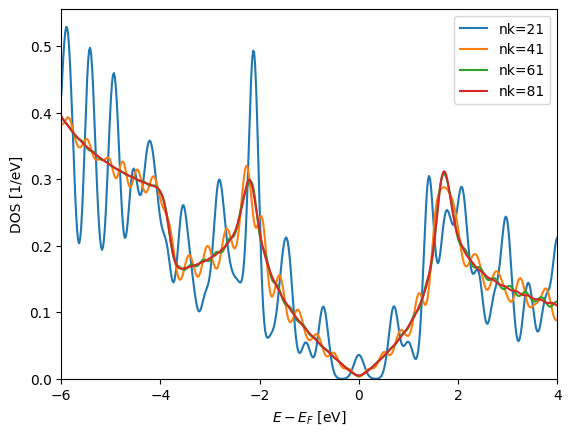

In [ ]:
E = np.linspace(-6, 4, 500)
for nk in [21, 41, 61, 81]:
    bz = MonkhorstPack(H, [nk, nk, 1])
    plt.plot(
        E,
        bz.apply.average.eigenvalue(wrap=lambda ev: ev.DOS(E)),
        label="nk={}".format(nk),
    )
plt.xlim(E[0], E[-1])
plt.ylim(0, None)
plt.xlabel(r"$E - E_F$ [eV]")
plt.ylabel(r"DOS [1/eV]")
plt.legend();

We see that the k-points are converged for approximately 61 k-points using the default smearing method. The default smearing method is the Gaussian smearing technique with σ=0.1 eV. Now we may use the Monkhorst-Pack grid for 81 points to find the projected DOS for some of the orbitals.

In [ ]:
pdos_plot = H.plot.pdos(kgrid=[81, 81, 1], data_Erange=(-6, 4), Erange=[-6, 4], nE=500)
orb_groups = [
    {"l": 0, "name": "s", "color": "red"},
    {"l": 1, "m": [-1, 1], "name": "px + py", "color": "blue"},
    {"l": 1, "m": 0, "name": "pz", "color": "green"},
]
pdos_plot.update_inputs(groups=orb_groups)

As seen the pz-orbitals are responsible for the DOS in a broad range of energies around the Fermi-level. This is one reason for the tight-binding models success with respect to graphene.

##### Caclulacting the band structure

Another way to gain information is via the so-called fat-bands which basically is the PDOS scaling (no broadening) on each band for the quantities we are interested in. To plot the fat-bands we need the band-structure and a projection of each state onto the requested orbitals.

In [ ]:
# Define the band-structure
bz = BandStructure(
    H,
    [[0] * 3, [2.0 / 3, 1.0 / 3, 0], [0.5, 0.5, 0], [1] * 3],
    400,
    names=[r"$\Gamma$", r"$K$", r"$M$", r"$\Gamma$"],
)

In [ ]:
bz.plot.fatbands(groups=orb_groups, Erange=[-21, 10])

##### Calculating wavefunctions

Eigenstates of the hamiltonian can be projected on real space. We can easily do so with sisl.

Here, we plot wf 8 at the gamma point:

In [ ]:
H.plot.wavefunction(i=8, axes="xy", grid_prec=0.1, nsc=[3, 3, 1], smooth=True, plot_geom=True, z_range=[0, 3])

Let's compare with other K points. Here is the valence band at Γ, which then is valence band -1 at 𝑀:

In [ ]:
wf_gamma = H.plot.wavefunction(i=3, k=(0,0,0), axes="xy", grid_prec=0.1, nsc=[1, 1, 1], smooth=True, plot_geom=True, z_range=[0, 3])# crange=[-0.4, 0.4])
wf_M = H.plot.wavefunction(i=2, k=(0,0.5,0), axes="xy", grid_prec=0.1, nsc=[1, 1, 1], smooth=True, plot_geom=True, z_range=[0, 3])#, crange=[-0.4, 0.4])
merge_plots(wf_gamma, wf_M, composite_method="subplots", cols=2, subplot_titles=["Wavefunction at Gamma", "Wavefunction at M"]).update_layout(showlegend=False)

In [ ]:
wf_gamma = H.plot.wavefunction(i=3, k=(0,0,0), axes="xy", grid_prec=0.1, nsc=[1, 1, 1], smooth=True, plot_geom=True, z_range=[0, 3])# crange=[-0.4, 0.4])
wf_K = H.plot.wavefunction(i=2, k=(1/3,2/3,0), axes="xy", grid_prec=0.1, nsc=[1, 1, 1], smooth=True, plot_geom=True, z_range=[0, 3])#, crange=[-0.4, 0.4])
merge_plots(wf_gamma, wf_K, composite_method="subplots", cols=2, subplot_titles=["Wavefunction at Gamma", "Wavefunction at K"]).update_layout(showlegend=False)

##### Reading and plotting real space grids.

Let's start with the electronic density (rho):

In [ ]:
rho_pristine = fdf.read_grid("rho")
rho_pristine
rho_pristine.plot(axes="xy", plot_geom=True, colorscale="viridis", nsc=[3, 3, 1], smooth=True)

dep:0: SislDeprecation:

__init__ argument bc has been deprecated (removed) in favor of the boundary conditions in Lattice, please update your code. [>=0.15.0]



We can also plot total potential:

In [ ]:
vt_pristine = fdf.read_grid("totalpotential")
vt_pristine.plot(axes="xy", plot_geom=True, colorscale="twilight", nsc=[3, 3, 1], smooth=True)

dep:0: SislDeprecation:

__init__ argument bc has been deprecated (removed) in favor of the boundary conditions in Lattice, please update your code. [>=0.15.0]



<font color='green'>Defected Graphene</font>
----------------------------

#### Input files

In [ ]:
! cd /content &&  mkdir graphene_defect
open("/content/graphene_defect/RUN.fdf", "w").write(
    """
SystemName graphene
SystemLabel graphene

# Include Geomety file
%include structure.fdf

PAO.BasisSize SZP
PAO.EnergyShift  200 meV
PAO.SplitNorm      0.15
PAO.OldStylePolOrbs F

XC.functional           GGA
XC.authors              PBE

MeshCutoff              500. Ry

SolutionMethod          diagon
Diag.ParllelOverK       true

ElectronicTemperature    1 meV

%block kgrid.MonkhorstPack
   6   0   0   0.
   0   6   0   0.
   0   0   1   0.
%endblock kgrid.MonkhorstPack

SCF.DM.Tolerance         1.0E-4

MaxSCFIterations        1000

DM.MixingWeight         0.01
DM.NumberPulay          12
DM.UseSaveDM            T
#DM.NumberKick           25
#DM.MixSCF1  F
SCF.Mixer.Variant GR


WriteMullikenPop       1
WriteHirshfeldPop      t
WriteVoronoiPop        t

WriteForces            T
WriteCoorStep          T

CDF.Save true
CDF.Compress 9

TS.HS.Save true
SaveRho T
SaveTotalPotential t
"""
)

890

In [ ]:
%%writefile /content/graphene_defect/structure.fdf
LatticeConstant 1.0 Ang
%block LatticeVectors
 12.78000000 -7.37853644 0.00000000
 12.78000000 7.37853644 0.00000000
 0.00000000 0.00000000 14.20000000
%endblock LatticeVectors

NumberOfAtoms 71
AtomicCoordinatesFormat Ang
%block AtomicCoordinatesAndAtomicSpecies
  0.00000000  0.00000000  0.00000000 1 #  1: C
  1.42000000  0.00000000  0.00000000 1 #  2: C
  2.13000000 -1.22975607  0.00000000 1 #  3: C
  3.55000000 -1.22975607  0.00000000 1 #  4: C
  4.26000000 -2.45951215  0.00000000 1 #  5: C
  5.68000000 -2.45951215  0.00000000 1 #  6: C
  6.39000000 -3.68926822  0.00000000 1 #  7: C
  7.81000000 -3.68926822  0.00000000 1 #  8: C
  8.52000000 -4.91902429  0.00000000 1 #  9: C
  9.94000000 -4.91902429  0.00000000 1 # 10: C
 10.65000000 -6.14878037  0.00000000 1 # 11: C
 12.07000000 -6.14878037  0.00000000 1 # 12: C
  2.13000000  1.22975607  0.00000000 1 # 13: C
  3.55000000  1.22975607  0.00000000 1 # 14: C
  4.26000000  0.00000000  0.00000000 1 # 15: C
  5.68000000  0.00000000  0.00000000 1 # 16: C
  6.39000000 -1.22975607  0.00000000 1 # 17: C
  7.81000000 -1.22975607  0.00000000 1 # 18: C
  8.52000000 -2.45951215  0.00000000 1 # 19: C
  9.94000000 -2.45951215  0.00000000 1 # 20: C
 10.65000000 -3.68926822  0.00000000 1 # 21: C
 12.07000000 -3.68926822  0.00000000 1 # 22: C
 12.78000000 -4.91902429  0.00000000 1 # 23: C
 14.20000000 -4.91902429  0.00000000 1 # 24: C
  4.26000000  2.45951215  0.00000000 1 # 25: C
  5.68000000  2.45951215  0.00000000 1 # 26: C
  6.39000000  1.22975607  0.00000000 1 # 27: C
  7.81000000  1.22975607  0.00000000 1 # 28: C
  8.52000000  0.00000000  0.00000000 1 # 29: C
 10.65000000 -1.22975607  0.00000000 1 # 30: C
 12.07000000 -1.22975607  0.00000000 1 # 31: C
 12.78000000 -2.45951215  0.00000000 1 # 32: C
 14.20000000 -2.45951215  0.00000000 1 # 33: C
 14.91000000 -3.68926822  0.00000000 1 # 34: C
 16.33000000 -3.68926822  0.00000000 1 # 35: C
  6.39000000  3.68926822  0.00000000 1 # 36: C
  7.81000000  3.68926822  0.00000000 1 # 37: C
  8.52000000  2.45951215  0.00000000 1 # 38: C
  9.94000000  2.45951215  0.00000000 1 # 39: C
 10.65000000  1.22975607  0.00000000 1 # 40: C
 12.07000000  1.22975607  0.00000000 1 # 41: C
 12.78000000  0.00000000  0.00000000 1 # 42: C
 14.20000000  0.00000000  0.00000000 1 # 43: C
 14.91000000 -1.22975607  0.00000000 1 # 44: C
 16.33000000 -1.22975607  0.00000000 1 # 45: C
 17.04000000 -2.45951215  0.00000000 1 # 46: C
 18.46000000 -2.45951215  0.00000000 1 # 47: C
  8.52000000  4.91902429  0.00000000 1 # 48: C
  9.94000000  4.91902429  0.00000000 1 # 49: C
 10.65000000  3.68926822  0.00000000 1 # 50: C
 12.07000000  3.68926822  0.00000000 1 # 51: C
 12.78000000  2.45951215  0.00000000 1 # 52: C
 14.20000000  2.45951215  0.00000000 1 # 53: C
 14.91000000  1.22975607  0.00000000 1 # 54: C
 16.33000000  1.22975607  0.00000000 1 # 55: C
 17.04000000  0.00000000  0.00000000 1 # 56: C
 18.46000000  0.00000000  0.00000000 1 # 57: C
 19.17000000 -1.22975607  0.00000000 1 # 58: C
 20.59000000 -1.22975607  0.00000000 1 # 59: C
 10.65000000  6.14878037  0.00000000 1 # 60: C
 12.07000000  6.14878037  0.00000000 1 # 61: C
 12.78000000  4.91902429  0.00000000 1 # 62: C
 14.20000000  4.91902429  0.00000000 1 # 63: C
 14.91000000  3.68926822  0.00000000 1 # 64: C
 16.33000000  3.68926822  0.00000000 1 # 65: C
 17.04000000  2.45951215  0.00000000 1 # 66: C
 18.46000000  2.45951215  0.00000000 1 # 67: C
 19.17000000  1.22975607  0.00000000 1 # 68: C
 20.59000000  1.22975607  0.00000000 1 # 69: C
 21.30000000  0.00000000  0.00000000 1 # 70: C
 22.72000000  0.00000000  0.00000000 1 # 71: C
%endblock AtomicCoordinatesAndAtomicSpecies

NumberOfSpecies 1
%block ChemicalSpeciesLabel
 1 6 C
%endblock ChemicalSpeciesLabel

Writing /content/graphene_defect/structure.fdf


###### C.psf

In [ ]:
%%writefile /content/graphene_defect/C.psf
 C  pb rel nc
 ATM3.3    22-JUL-16 Troullier-Martins
 2s 2.00r r= 1.25/2p 2.00r r= 1.25/3d 0.00r r= 1.25/4f 0.00r r= 1.25/
   4  3 1006  0.413125362778E-03  0.125000000000E-01   4.00000000000
 Radial grid follows
  0.519647735591E-05  0.104583183504E-04  0.157863451569E-04  0.211813902904E-04
  0.266442967376E-04  0.321759180888E-04  0.377771186712E-04  0.434487736837E-04
  0.491917693339E-04  0.550070029765E-04  0.608953832538E-04  0.668578302370E-04
  0.728952755706E-04  0.790086626178E-04  0.851989466078E-04  0.914670947849E-04
  0.978140865601E-04  0.104240913664E-03  0.110748580301E-03  0.117338103307E-03
  0.124010512309E-03  0.130766849885E-03  0.137608171725E-03  0.144535546801E-03
  0.151550057528E-03  0.158652799939E-03  0.165844883850E-03  0.173127433041E-03
  0.180501585424E-03  0.187968493225E-03  0.195529323164E-03  0.203185256636E-03
  0.210937489896E-03  0.218787234247E-03  0.226735716227E-03  0.234784177802E-03
  0.242933876561E-03  0.251186085910E-03  0.259542095276E-03  0.268003210300E-03
  0.276570753049E-03  0.285246062220E-03  0.294030493346E-03  0.302925419014E-03
  0.311932229074E-03  0.321052330857E-03  0.330287149399E-03  0.339638127658E-03
  0.349106726744E-03  0.358694426144E-03  0.368402723958E-03  0.378233137124E-03
  0.388187201666E-03  0.398266472927E-03  0.408472525813E-03  0.418806955041E-03
  0.429271375385E-03  0.439867421934E-03  0.450596750341E-03  0.461461037086E-03
  0.472461979735E-03  0.483601297207E-03  0.494880730045E-03  0.506302040682E-03
  0.517867013722E-03  0.529577456214E-03  0.541435197940E-03  0.553442091696E-03
  0.565600013583E-03  0.577910863301E-03  0.590376564446E-03  0.602999064808E-03
  0.615780336680E-03  0.628722377160E-03  0.641827208470E-03  0.655096878265E-03
  0.668533459959E-03  0.682139053044E-03  0.695915783422E-03  0.709865803737E-03
  0.723991293705E-03  0.738294460465E-03  0.752777538914E-03  0.767442792064E-03
  0.782292511390E-03  0.797329017191E-03  0.812554658952E-03  0.827971815710E-03
  0.843582896426E-03  0.859390340366E-03  0.875396617472E-03  0.891604228760E-03
  0.908015706701E-03  0.924633615621E-03  0.941460552104E-03  0.958499145392E-03
  0.975752057800E-03  0.993221985131E-03  0.101091165710E-02  0.102882383774E-02
  0.104696132589E-02  0.106532695554E-02  0.108392359638E-02  0.110275415417E-02
  0.112182157122E-02  0.114112882684E-02  0.116067893785E-02  0.118047495898E-02
  0.120051998340E-02  0.122081714319E-02  0.124136960982E-02  0.126218059466E-02
  0.128325334946E-02  0.130459116689E-02  0.132619738102E-02  0.134807536786E-02
  0.137022854591E-02  0.139266037663E-02  0.141537436504E-02  0.143837406026E-02
  0.146166305603E-02  0.148524499131E-02  0.150912355081E-02  0.153330246562E-02
  0.155778551374E-02  0.158257652069E-02  0.160767936012E-02  0.163309795440E-02
  0.165883627524E-02  0.168489834429E-02  0.171128823383E-02  0.173801006730E-02
  0.176506802007E-02  0.179246631998E-02  0.182020924808E-02  0.184830113926E-02
  0.187674638292E-02  0.190554942371E-02  0.193471476215E-02  0.196424695539E-02
  0.199415061789E-02  0.202443042215E-02  0.205509109947E-02  0.208613744064E-02
  0.211757429670E-02  0.214940657973E-02  0.218163926359E-02  0.221427738470E-02
  0.224732604283E-02  0.228079040192E-02  0.231467569082E-02  0.234898720418E-02
  0.238373030326E-02  0.241891041672E-02  0.245453304153E-02  0.249060374380E-02
  0.252712815966E-02  0.256411199611E-02  0.260156103195E-02  0.263948111868E-02
  0.267787818138E-02  0.271675821967E-02  0.275612730864E-02  0.279599159979E-02
  0.283635732199E-02  0.287723078247E-02  0.291861836780E-02  0.296052654486E-02
  0.300296186189E-02  0.304593094951E-02  0.308944052171E-02  0.313349737695E-02
  0.317810839922E-02  0.322328055906E-02  0.326902091473E-02  0.331533661325E-02
  0.336223489154E-02  0.340972307754E-02  0.345780859140E-02  0.350649894656E-02
  0.355580175099E-02  0.360572470836E-02  0.365627561923E-02  0.370746238228E-02
  0.375929299555E-02  0.381177555768E-02  0.386491826917E-02  0.391872943368E-02
  0.397321745932E-02  0.402839085995E-02  0.408425825652E-02  0.414082837844E-02
  0.419811006489E-02  0.425611226626E-02  0.431484404551E-02  0.437431457960E-02
  0.443453316091E-02  0.449550919874E-02  0.455725222070E-02  0.461977187428E-02
  0.468307792828E-02  0.474718027442E-02  0.481208892881E-02  0.487781403357E-02
  0.494436585837E-02  0.501175480207E-02  0.507999139434E-02  0.514908629728E-02
  0.521905030710E-02  0.528989435583E-02  0.536162951300E-02  0.543426698736E-02
  0.550781812868E-02  0.558229442946E-02  0.565770752678E-02  0.573406920410E-02
  0.581139139307E-02  0.588968617544E-02  0.596896578495E-02  0.604924260918E-02
  0.613052919155E-02  0.621283823326E-02  0.629618259526E-02  0.638057530028E-02
  0.646602953486E-02  0.655255865138E-02  0.664017617019E-02  0.672889578173E-02
  0.681873134860E-02  0.690969690779E-02  0.700180667286E-02  0.709507503615E-02
  0.718951657102E-02  0.728514603417E-02  0.738197836788E-02  0.748002870241E-02
  0.757931235832E-02  0.767984484889E-02  0.778164188252E-02  0.788471936520E-02
  0.798909340300E-02  0.809478030458E-02  0.820179658373E-02  0.831015896196E-02
  0.841988437111E-02  0.853098995601E-02  0.864349307712E-02  0.875741131329E-02
  0.887276246447E-02  0.898956455452E-02  0.910783583399E-02  0.922759478303E-02
  0.934886011420E-02  0.947165077546E-02  0.959598595311E-02  0.972188507476E-02
  0.984936781241E-02  0.997845408550E-02  0.101091640640E-01  0.102415181717E-01
  0.103755370891E-01  0.105112417569E-01  0.106486533793E-01  0.107877934272E-01
  0.109286836414E-01  0.110713460363E-01  0.112158029033E-01  0.113620768140E-01
  0.115101906239E-01  0.116601674763E-01  0.118120308052E-01  0.119658043396E-01
  0.121215121070E-01  0.122791784370E-01  0.124388279653E-01  0.126004856374E-01
  0.127641767127E-01  0.129299267683E-01  0.130977617030E-01  0.132677077412E-01
  0.134397914374E-01  0.136140396801E-01  0.137904796959E-01  0.139691390538E-01
  0.141500456698E-01  0.143332278109E-01  0.145187140997E-01  0.147065335188E-01
  0.148967154153E-01  0.150892895057E-01  0.152842858799E-01  0.154817350065E-01
  0.156816677374E-01  0.158841153124E-01  0.160891093645E-01  0.162966819244E-01
  0.165068654256E-01  0.167196927098E-01  0.169351970317E-01  0.171534120642E-01
  0.173743719040E-01  0.175981110764E-01  0.178246645411E-01  0.180540676976E-01
  0.182863563906E-01  0.185215669157E-01  0.187597360249E-01  0.190009009328E-01
  0.192450993218E-01  0.194923693483E-01  0.197427496490E-01  0.199962793461E-01
  0.202529980542E-01  0.205129458861E-01  0.207761634592E-01  0.210426919019E-01
  0.213125728596E-01  0.215858485019E-01  0.218625615286E-01  0.221427551767E-01
  0.224264732270E-01  0.227137600110E-01  0.230046604180E-01  0.232992199016E-01
  0.235974844875E-01  0.238995007799E-01  0.242053159697E-01  0.245149778410E-01
  0.248285347791E-01  0.251460357780E-01  0.254675304479E-01  0.257930690228E-01
  0.261227023690E-01  0.264564819922E-01  0.267944600462E-01  0.271366893408E-01
  0.274832233500E-01  0.278341162205E-01  0.281894227799E-01  0.285491985456E-01
  0.289134997334E-01  0.292823832660E-01  0.296559067823E-01  0.300341286460E-01
  0.304171079551E-01  0.308049045509E-01  0.311975790273E-01  0.315951927407E-01
  0.319978078188E-01  0.324054871713E-01  0.328182944986E-01  0.332362943030E-01
  0.336595518976E-01  0.340881334174E-01  0.345221058291E-01  0.349615369417E-01
  0.354064954172E-01  0.358570507814E-01  0.363132734344E-01  0.367752346620E-01
  0.372430066464E-01  0.377166624781E-01  0.381962761667E-01  0.386819226529E-01
  0.391736778198E-01  0.396716185053E-01  0.401758225135E-01  0.406863686275E-01
  0.412033366210E-01  0.417268072713E-01  0.422568623719E-01  0.427935847449E-01
  0.433370582542E-01  0.438873678187E-01  0.444445994254E-01  0.450088401429E-01
  0.455801781349E-01  0.461587026741E-01  0.467445041562E-01  0.473376741139E-01
  0.479383052312E-01  0.485464913578E-01  0.491623275242E-01  0.497859099559E-01
  0.504173360891E-01  0.510567045852E-01  0.517041153470E-01  0.523596695337E-01
  0.530234695770E-01  0.536956191969E-01  0.543762234183E-01  0.550653885869E-01
  0.557632223862E-01  0.564698338541E-01  0.571853334001E-01  0.579098328224E-01
  0.586434453257E-01  0.593862855382E-01  0.601384695304E-01  0.609001148325E-01
  0.616713404531E-01  0.624522668977E-01  0.632430161879E-01  0.640437118796E-01
  0.648544790834E-01  0.656754444831E-01  0.665067363563E-01  0.673484845940E-01
  0.682008207211E-01  0.690638779170E-01  0.699377910359E-01  0.708226966287E-01
  0.717187329636E-01  0.726260400480E-01  0.735447596507E-01  0.744750353234E-01
  0.754170124236E-01  0.763708381370E-01  0.773366615010E-01  0.783146334274E-01
  0.793049067262E-01  0.803076361298E-01  0.813229783165E-01  0.823510919358E-01
  0.833921376324E-01  0.844462780718E-01  0.855136779657E-01  0.865945040974E-01
  0.876889253482E-01  0.887971127237E-01  0.899192393804E-01  0.910554806529E-01
  0.922060140812E-01  0.933710194384E-01  0.945506787590E-01  0.957451763673E-01
  0.969546989058E-01  0.981794353650E-01  0.994195771124E-01  0.100675317923
  0.101946854008      0.103234384048      0.104538109222      0.105858233241
  0.107194962375      0.108548505492      0.109919074086      0.111306882310
  0.112712147012      0.114135087769      0.115575926917      0.117034889590
  0.118512203755      0.120008100244      0.121522812795      0.123056578084
  0.124609635766      0.126182228508      0.127774602032      0.129387005149
  0.131019689801      0.132672911097      0.134346927357      0.136042000150
  0.137758394334      0.139496378099      0.141256223008      0.143038204041
  0.144842599637      0.146669691735      0.148519765822      0.150393110977
  0.152290019912      0.154210789025      0.156155718439      0.158125112054
  0.160119277591      0.162138526642      0.164183174720      0.166253541304
  0.168349949894      0.170472728058      0.172622207484      0.174798724033
  0.177002617790      0.179234233118      0.181493918711      0.183782027650
  0.186098917456      0.188444950148      0.190820492299      0.193225915092
  0.195661594379      0.198127910739      0.200625249541      0.203154000997
  0.205714560231      0.208307327336      0.210932707436      0.213591110752
  0.216282952665      0.219008653782      0.221768639998      0.224563342567
  0.227393198166      0.230258648967      0.233160142703      0.236098132736
  0.239073078135      0.242085443740      0.245135700240      0.248224324244
  0.251351798355      0.254518611248      0.257725257743      0.260972238886
  0.264260062023      0.267589240885      0.270960295661      0.274373753087
  0.277830146522      0.281330016034      0.284873908485      0.288462377615
  0.292095984131      0.295775295790      0.299500887492      0.303273341369
  0.307093246874      0.310961200876      0.314877807750      0.318843679473
  0.322859435722      0.326925703966      0.331043119568      0.335212325882
  0.339433974357      0.343708724632      0.348037244646      0.352420210739
  0.356858307759      0.361352229168      0.365902677149      0.370510362719
  0.375176005839      0.379900335525      0.384684089963      0.389528016625
  0.394432872383      0.399399423632      0.404428446405      0.409520726497
  0.414677059587      0.419898251364      0.425185117648      0.430538484523
  0.435959188465      0.441448076468      0.447006006183      0.452633846047
  0.458332475423      0.464102784732      0.469945675597      0.475862060981
  0.481852865333      0.487919024726      0.494061487012      0.500281211962
  0.506579171420      0.512956349457      0.519413742518      0.525952359586
  0.532573222331      0.539277365277      0.546065835960      0.552939695093
  0.559900016730      0.566947888436      0.574084411454      0.581310700881
  0.588627885839      0.596037109654      0.603539530032      0.611136319240
  0.618828664294      0.626617767137      0.634504844833      0.642491129753
  0.650577869772      0.658766328457      0.667057785274      0.675453535778
  0.683954891823      0.692563181763      0.701279750661      0.710105960499
  0.719043190389      0.728092836792      0.737256313734      0.746535053027
  0.755930504492      0.765444136188      0.775077434640      0.784831905069
  0.794709071632      0.804710477656      0.814837685880      0.825092278703
  0.835475858425      0.845990047501      0.856636488794      0.867416845834
  0.878332803072      0.889386066149      0.900578362161      0.911911439925
  0.923387070259      0.935007046253      0.946773183552      0.958687320638
  0.970751319121      0.982967064024      0.995336464082       1.00786145204
   1.02054398495       1.03338604449       1.04638963725       1.05955679507
   1.07288957535       1.08639006136       1.10006036258       1.11390261502
   1.12791898156       1.14211165229       1.15648284484       1.17103480474
   1.18576980576       1.20069015027       1.21579816962       1.23109622446
   1.24658670514       1.26227203208       1.27815465614       1.29423705902
   1.31052175363       1.32701128448       1.34370822809       1.36061519340
   1.37773482215       1.39506978933       1.41262280354       1.43039660750
   1.44839397839       1.46661772834       1.48507070484       1.50375579121
   1.52267590704       1.54183400862       1.56123308946       1.58087618070
   1.60076635160       1.62090671006       1.64130040305       1.66195061711
   1.68286057888       1.70403355560       1.72547285558       1.74718182876
   1.76916386720       1.79142240565       1.81396092205       1.83678293808
   1.85989201973       1.88329177785       1.90698586869       1.93097799451
   1.95527190412       1.97987139349       2.00478030634       2.03000253475
   2.05554201974       2.08140275191       2.10758877203       2.13410417175
   2.16095309413       2.18813973439       2.21566834048       2.24354321380
   2.27176870988       2.30034923898       2.32928926689       2.35859331553
   2.38826596373       2.41831184790       2.44873566277       2.47954216212
   2.51073615952       2.54232252911       2.57430620632       2.60669218867
   2.63948553652       2.67269137391       2.70631488932       2.74036133649
   2.77483603524       2.80974437232       2.84509180222       2.88088384807
   2.91712610242       2.95382422821       2.99098395961       3.02861110288
   3.06671153735       3.10529121629       3.14435616785       3.18391249601
   3.22396638153       3.26452408290       3.30559193736       3.34717636184
   3.38928385398       3.43192099317       3.47509444155       3.51881094506
   3.56307733449       3.60790052656       3.65328752497       3.69924542154
   3.74578139729       3.79290272356       3.84061676314       3.88893097146
   3.93785289771       3.98739018603       4.03755057674       4.08834190749
   4.13977211453       4.19184923394       4.24458140287       4.29797686084
   4.35204395098       4.40679112140       4.46222692645       4.51836002808
   4.57519919721       4.63275331508       4.69103137463       4.75004248193
   4.80979585758       4.87030083818       4.93156687774       4.99360354920
   5.05642054594       5.12002768322       5.18443489980       5.24965225943
   5.31568995246       5.38255829741       5.45026774259       5.51882886775
   5.58825238570       5.65854914401       5.72973012669       5.80180645590
   5.87478939374       5.94869034391       6.02352085361       6.09929261525
   6.17601746832       6.25370740124       6.33237455321       6.41203121614
   6.49268983655       6.57436301750       6.65706352061       6.74080426798
   6.82559834429       6.91145899878       6.99839964734       7.08643387465
   7.17557543621       7.26583826059       7.35723645153       7.44978429019
   7.54349623735       7.63838693569       7.73447121209       7.83176407990
   7.93028074133       8.03003658982       8.13104721241       8.23332839223
   8.33689611090       8.44176655111       8.54795609907       8.65548134711
   8.76435909627       8.87460635893       8.98624036143       9.09927854683
   9.21373857756       9.32963833824       9.44699593845       9.56582971554
   9.68615823755       9.80800030603       9.93137495907       10.0563014742
   10.1827993714       10.3108884164       10.4405886231       10.5719202577
   10.7049038408       10.8395601515       10.9759102300       11.1139753815
   11.2537771787       11.3953374661       11.5386783626       11.6838222658
   11.8307918544       11.9796100929       12.1303002344       12.2828858246
   12.4373907052       12.5938390179       12.7522552082       12.9126640288
   13.0750905441       13.2395601333       13.4060984954       13.5747316521
   13.7454859529       13.9183880783       14.0934650448       14.2707442083
   14.4502532693       14.6320202763       14.8160736307       15.0024420914
   15.1911547787       15.3822411794       15.5757311512       15.7716549271
   15.9700431208       16.1709267308       16.3743371455       16.5803061483
   16.7888659222       17.0000490551       17.2138885448       17.4304178042
   17.6496706663       17.8716813900       18.0964846648       18.3241156167
   18.5546098134       18.7880032703       19.0243324555       19.2636342958
   19.5059461828       19.7513059781       19.9997520197       20.2513231278
   20.5060586108       20.7639982718       21.0251824144       21.2896518490
   21.5574478996       21.8286124098       22.1031877496       22.3812168221
   22.6627430698       22.9478104818       23.2364636004       23.5287475282
   23.8247079353       24.1243910660       24.4278437464       24.7351133917
   25.0462480134       25.3612962267       25.6803072588       26.0033309557
   26.3304177905       26.6616188712       26.9969859486       27.3365714246
   27.6804283600       28.0286104833       28.3811721985       28.7381685941
   29.0996554516       29.4656892540       29.8363271949       30.2116271872
   30.5916478722       30.9764486290       31.3660895834       31.7606316177
   32.1601363799       32.5646662934       32.9742845668       33.3890552038
   33.8090430131       34.2343136188       34.6649334701       35.1009698524
   35.5424908972       35.9895655931       36.4422637963       36.9006562420
   37.3648145548       37.8348112605       38.3107197970       38.7926145259
   39.2805707443       39.7746646964       40.2749735853       40.7815755853
   41.2945498541       41.8139765448       42.3399368189       42.8725128589
   43.4117878808       43.9578461475       44.5107729815       45.0706547790
   45.6375790225       46.2116342952       46.7929102942       47.3814978453
   47.9774889163       48.5809766322       49.1920552890       49.8108203691
   50.4373685558       51.0717977485       51.7142070781       52.3646969223
   53.0233689214       53.6903259944       54.3656723546       55.0495135262
   55.7419563609       56.4431090543       57.1530811628       57.8719836211
   58.5999287591       59.3370303198       60.0834034767       60.8391648522
   61.6044325355       62.3793261013       63.1639666283       63.9584767182
   64.7629805146       65.5776037232       66.4024736302       67.2377191234
   68.0834707116       68.9398605451       69.8070224367       70.6850918821
   71.5742060815       72.4745039607       73.3861261932       74.3092152217
   75.2439152809       76.1903724195       77.1487345233       78.1191513384
   79.1017744944       80.0967575281       81.1042559077       82.1244270568
   83.1574303794       84.2034272841       85.2625812102       86.3350576527
   87.4210241881       88.5206505010       89.6341084101       90.7615718956
   91.9032171259       93.0592224855       94.2297686024       95.4150383769
   96.6152170099       97.8304920316       99.0610533313       100.307093187
   101.568806294       102.846389798       104.140043325       105.449969010
   106.776371532       108.119458143       109.479438704       110.856525715
   112.250934349       113.662882483       115.092590739       116.540282511
   118.006184003       119.490524267
 Down Pseudopotential follows (l on next line)
  0
 -0.947152835831E-05 -0.190615105301E-04 -0.287735101746E-04 -0.386055998494E-04
 -0.485637491617E-04 -0.586451947572E-04 -0.688546860317E-04 -0.791920919896E-04
 -0.896597202580E-04 -0.100259024798E-03 -0.110991699483E-03 -0.121859425459E-03
 -0.132863907849E-03 -0.144006873593E-03 -0.155290071717E-03 -0.166715273637E-03
 -0.178284273465E-03 -0.189998888304E-03 -0.201860958555E-03 -0.213872348243E-03
 -0.226034945326E-03 -0.238350662015E-03 -0.250821435108E-03 -0.263449226328E-03
 -0.276236022650E-03 -0.289183836641E-03 -0.302294706838E-03 -0.315570698067E-03
 -0.329013901820E-03 -0.342626436627E-03 -0.356410448413E-03 -0.370368110888E-03
 -0.384501625924E-03 -0.398813223945E-03 -0.413305164335E-03 -0.427979735823E-03
 -0.442839256904E-03 -0.457886076259E-03 -0.473122573168E-03 -0.488551157952E-03
 -0.504174272388E-03 -0.519994390203E-03 -0.536014017475E-03 -0.552235693100E-03
 -0.568661989318E-03 -0.585295512123E-03 -0.602138901751E-03 -0.619194833259E-03
 -0.636466016892E-03 -0.653955198717E-03 -0.671665161139E-03 -0.689598723231E-03
 -0.707758741612E-03 -0.726148110746E-03 -0.744769763474E-03 -0.763626671910E-03
 -0.782721847569E-03 -0.802058342307E-03 -0.821639248842E-03 -0.841467701123E-03
 -0.861546875446E-03 -0.881879990663E-03 -0.902470308910E-03 -0.923321136571E-03
 -0.944435824435E-03 -0.965817768965E-03 -0.987470412583E-03 -0.100939724438E-02
 -0.103160180139E-02 -0.105408766852E-02 -0.107685847994E-02 -0.109991791971E-02
 -0.112326972235E-02 -0.114691767404E-02 -0.117086561310E-02 -0.119511743090E-02
 -0.121967707302E-02 -0.124454853973E-02 -0.126973588721E-02 -0.129524322837E-02
 -0.132107473337E-02 -0.134723463156E-02 -0.137372721171E-02 -0.140055682280E-02
 -0.142772787604E-02 -0.145524484488E-02 -0.148311226675E-02 -0.151133474418E-02
 -0.153991694499E-02 -0.156886360513E-02 -0.159817952815E-02 -0.162786958715E-02
 -0.165793872712E-02 -0.168839196372E-02 -0.171923438613E-02 -0.175047115972E-02
 -0.178210752444E-02 -0.181414879775E-02 -0.184660037739E-02 -0.187946773983E-02
 -0.191275644400E-02 -0.194647213344E-02 -0.198062053471E-02 -0.201520746224E-02
 -0.205023881901E-02 -0.208572059722E-02 -0.212165888118E-02 -0.215805984883E-02
 -0.219492977391E-02 -0.223227502680E-02 -0.227010207777E-02 -0.230841749800E-02
 -0.234722796204E-02 -0.238654025051E-02 -0.242636125091E-02 -0.246669796081E-02
 -0.250755749016E-02 -0.254894706334E-02 -0.259087402160E-02 -0.263334582589E-02
 -0.267637005874E-02 -0.271995442691E-02 -0.276410676568E-02 -0.280883504021E-02
 -0.285414734743E-02 -0.290005192097E-02 -0.294655713398E-02 -0.299367150088E-02
 -0.304140368131E-02 -0.308976248405E-02 -0.313875686990E-02 -0.318839595411E-02
 -0.323868901193E-02 -0.328964548181E-02 -0.334127496745E-02 -0.339358724394E-02
 -0.344659226137E-02 -0.350030014766E-02 -0.355472121415E-02 -0.360986596071E-02
 -0.366574507716E-02 -0.372236945170E-02 -0.377975017473E-02 -0.383789854142E-02
 -0.389682605931E-02 -0.395654445396E-02 -0.401706567333E-02 -0.407840189234E-02
 -0.414056552080E-02 -0.420356920840E-02 -0.426742585153E-02 -0.433214859886E-02
 -0.439775085690E-02 -0.446424630021E-02 -0.453164887546E-02 -0.459997280806E-02
 -0.466923261314E-02 -0.473944310000E-02 -0.481061938013E-02 -0.488277687832E-02
 -0.495593133906E-02 -0.503009883204E-02 -0.510529576572E-02 -0.518153889958E-02
 -0.525884534312E-02 -0.533723257278E-02 -0.541671844508E-02 -0.549732119754E-02
 -0.557905946967E-02 -0.566195230742E-02 -0.574601917430E-02 -0.583127996997E-02
 -0.591775503508E-02 -0.600546516655E-02 -0.609443163286E-02 -0.618467618374E-02
 -0.627622106431E-02 -0.636908903461E-02 -0.646330337663E-02 -0.655888791293E-02
 -0.665586702530E-02 -0.675426566496E-02 -0.685410937449E-02 -0.695542429975E-02
 -0.705823721159E-02 -0.716257552533E-02 -0.726846731160E-02 -0.737594132475E-02
 -0.748502701761E-02 -0.759575456149E-02 -0.770815487381E-02 -0.782225962909E-02
 -0.793810128896E-02 -0.805571312734E-02 -0.817512924428E-02 -0.829638459903E-02
 -0.841951503478E-02 -0.854455729663E-02 -0.867154906793E-02 -0.880052899289E-02
 -0.893153670346E-02 -0.906461285064E-02 -0.919979913597E-02 -0.933713833704E-02
 -0.947667433927E-02 -0.961845218027E-02 -0.976251806208E-02 -0.990891939885E-02
 -0.100577048599E-01 -0.102089243806E-01 -0.103626292205E-01 -0.105188719981E-01
 -0.106777067165E-01 -0.108391888231E-01 -0.110033752309E-01 -0.111703243727E-01
 -0.113400962433E-01 -0.115127524314E-01 -0.116883561821E-01 -0.118669724274E-01
 -0.120486678444E-01 -0.122335108934E-01 -0.124215718680E-01 -0.126129229606E-01
 -0.128076382868E-01 -0.130057939600E-01 -0.132074681340E-01 -0.134127410528E-01
 -0.136216951227E-01 -0.138344149468E-01 -0.140509873931E-01 -0.142715016540E-01
 -0.144960492996E-01 -0.147247243419E-01 -0.149576232872E-01 -0.151948452026E-01
 -0.154364917858E-01 -0.156826674055E-01 -0.159334791865E-01 -0.161890370677E-01
 -0.164494538524E-01 -0.167148452913E-01 -0.169853301360E-01 -0.172610302098E-01
 -0.175420704673E-01 -0.178285790603E-01 -0.181206874157E-01 -0.184185302801E-01
 -0.187222457901E-01 -0.190319755503E-01 -0.193478646839E-01 -0.196700618910E-01
 -0.199987195231E-01 -0.203339936366E-01 -0.206760440496E-01 -0.210250344037E-01
 -0.213811322200E-01 -0.217445089508E-01 -0.221153400241E-01 -0.224938049161E-01
 -0.228800871618E-01 -0.232743744323E-01 -0.236768585589E-01 -0.240877355509E-01
 -0.245072056773E-01 -0.249354734430E-01 -0.253727476384E-01 -0.258192413522E-01
 -0.262751719848E-01 -0.267407612545E-01 -0.272162351903E-01 -0.277018241490E-01
 -0.281977627679E-01 -0.287042899660E-01 -0.292216489225E-01 -0.297500870041E-01
 -0.302898557587E-01 -0.308412108471E-01 -0.314044119442E-01 -0.319797227076E-01
 -0.325674106703E-01 -0.331677471365E-01 -0.337810070741E-01 -0.344074689842E-01
 -0.350474147736E-01 -0.357011295984E-01 -0.363689016908E-01 -0.370510221772E-01
 -0.377477848915E-01 -0.384594861474E-01 -0.391864245236E-01 -0.399289005985E-01
 -0.406872166970E-01 -0.414616765998E-01 -0.422525852375E-01 -0.430602483924E-01
 -0.438849723228E-01 -0.447270634127E-01 -0.455868278058E-01 -0.464645709940E-01
 -0.473605973782E-01 -0.482752098443E-01 -0.492087092820E-01 -0.501613941088E-01
 -0.511335597609E-01 -0.521254981408E-01 -0.531374970980E-01 -0.541698398304E-01
 -0.552228042953E-01 -0.562966626085E-01 -0.573916803951E-01 -0.585081161219E-01
 -0.596462204601E-01 -0.608062355658E-01 -0.619883943656E-01 -0.631929198499E-01
 -0.644200243136E-01 -0.656699086160E-01 -0.669427613970E-01 -0.682387582968E-01
 -0.695580611676E-01 -0.709008172912E-01 -0.722671585308E-01 -0.736572005532E-01
 -0.750710420203E-01 -0.765087637416E-01 -0.779704278924E-01 -0.794560771819E-01
 -0.809657340890E-01 -0.824994000196E-01 -0.840570545562E-01 -0.856386547381E-01
 -0.872441342106E-01 -0.888734025884E-01 -0.905263447529E-01 -0.922028201495E-01
 -0.939026621548E-01 -0.956256774881E-01 -0.973716456751E-01 -0.991403184668E-01
 -0.100931419405     -0.102744643426     -0.104579656432     -0.106436095019
 -0.108313566261     -0.110211647448     -0.112129886047     -0.114067799651
 -0.116024876000     -0.118000573129     -0.119994319541     -0.122005514557
 -0.124033528675     -0.126077704023     -0.128137355024     -0.130211769007
 -0.132300207010     -0.134401904727     -0.136516073440     -0.138641901176
 -0.140778553931     -0.142925177003     -0.145080896439     -0.147244820618
 -0.149416041938     -0.151593638589     -0.153776676484     -0.155964211276
 -0.158155290483     -0.160348955732     -0.162544245081     -0.164740195486
 -0.166935845300     -0.169130236909     -0.171322419440     -0.173511451517
 -0.175696404130     -0.177876363510     -0.180050434098     -0.182217741545
 -0.184377435704     -0.186528693688     -0.188670722908     -0.190802764107
 -0.192924094364     -0.195034030083     -0.197131929919     -0.199217197635
 -0.201289284889     -0.203347693921     -0.205391980141     -0.207421754565
 -0.209436686138     -0.211436503885     -0.213420998901     -0.215390026143
 -0.217343506019     -0.219281425819     -0.221203840835     -0.223110875312
 -0.225002723156     -0.226879648333     -0.228741985091     -0.230590137848
 -0.232424580852     -0.234245857563     -0.236054579760     -0.237851426389
 -0.239637142135     -0.241412535747     -0.243178478105     -0.244935900034
 -0.246685789900     -0.248429190977     -0.250167198592     -0.251900957101
 -0.253631656668     -0.255360529883     -0.257088848246     -0.258817918519
 -0.260549078973     -0.262283695546     -0.264023157945     -0.265768875684
 -0.267522274108     -0.269284790408     -0.271057869638     -0.272842960763
 -0.274641512767     -0.276454970797     -0.278284772405     -0.280132343870
 -0.281999096625     -0.283886423800     -0.285795696882     -0.287728262513
 -0.289685439418     -0.291668515482     -0.293678744970     -0.295717345891
 -0.297785497512     -0.299884338020     -0.302014962327     -0.304178420011
 -0.306375713401     -0.308607795782     -0.310875569729     -0.313179885561
 -0.315521539886     -0.317901274265     -0.320319773953     -0.322777666726
 -0.325275521776     -0.327813848677     -0.330393096395     -0.333013652358
 -0.335675841552     -0.338379925658     -0.341126102219     -0.343914503824
 -0.346745197318     -0.349618183032     -0.352533394037     -0.355490695414
 -0.358489883565     -0.361530685555     -0.364612758505     -0.367735689046
 -0.370898992851     -0.374102114268     -0.377344426072     -0.380625229370
 -0.383943753686     -0.387299157268     -0.390690527642     -0.394116882483
 -0.397577170836     -0.401070274738     -0.404595011325     -0.408150135465
 -0.411734343005     -0.415346274700     -0.418984520914     -0.422647627184
 -0.426334100720     -0.430042417974     -0.433771033351     -0.437518389182
 -0.441282927083     -0.445063100788     -0.448857390593     -0.452664319532
 -0.456482471378     -0.460310510621     -0.464147204507     -0.467991447263
 -0.471842286606     -0.475698952638     -0.479560889202     -0.483427787774
 -0.487299623951     -0.491176696577     -0.495059669515     -0.498949616078
 -0.502848066085     -0.506757055489     -0.510679178513     -0.514617642156
 -0.518576322968     -0.522559825905     -0.526573545062     -0.530623726083
 -0.534717529978     -0.538863098068     -0.543069617779     -0.547347388950
 -0.551707890341     -0.556163846009     -0.560729291190     -0.565419637389
 -0.570251736322     -0.575243942409     -0.580416173530     -0.585789969750
 -0.591388549783     -0.597236864951     -0.603361650429     -0.609791473593
 -0.616556779275     -0.623689931745     -0.631225253225     -0.639199058714
 -0.647649686856     -0.656617526534     -0.666145038799     -0.676276773632
 -0.687059380969     -0.698541615253     -0.710774332699     -0.723810480292
 -0.737705075455     -0.752515175185     -0.768299833412     -0.785120045283
 -0.803038677087     -0.822120380648     -0.842431491153     -0.864039907667
 -0.887014955961     -0.911427233755     -0.937348439112     -0.964851183428
 -0.994008791299      -1.02489509047      -1.05758419601      -1.09215029387
  -1.12866742971      -1.16720930988      -1.20784912169      -1.25065938043
  -1.29571181037      -1.34307726607      -1.39282569923      -1.44502617423
  -1.49974693292      -1.55705550633      -1.61701886718      -1.67970361342
  -1.74517616909      -1.81350298496      -1.88475071835      -1.95898636892
  -2.03627734547      -2.11669143885      -2.20029667633      -2.28716103540
  -2.37735199791      -2.47093592975      -2.56797727632      -2.66853756933
  -2.77267424572      -2.88043928493      -2.99187767510      -3.10702572294
  -3.22590922479      -3.34854151912      -3.47492144162      -3.60503120536
  -3.73883422870      -3.87627293374      -4.01726653845      -4.16170886603
  -4.30946619560      -4.46037518020      -4.61424085947      -4.77083479761
  -4.92989338033      -5.09111630848      -5.25416533076      -5.41866326260
  -5.58419334356      -5.75029899049      -5.91648400871      -6.08221332750
  -6.24691432987      -6.40997884875      -6.57076590294      -6.72860524527
  -6.88280179317      -7.03264100700      -7.17739527486      -7.31633135301
  -7.44871889960      -7.57384012435      -7.69100055941      -7.79954093561
  -7.89885012287      -7.98837906395      -8.06765559403      -8.13629999575
  -8.19404108522      -8.24073256062      -8.27636926484      -8.30110291724
  -8.31525675110      -8.31933834956      -8.31404979825      -8.30029406121
  -8.27917623020      -8.25199798774      -8.22024324874      -8.18555249230
  -8.14968274842      -8.11444953858      -8.08164635761      -8.05293575097
  -8.02970853104      -8.01288905546      -8.00272937422      -7.99843250206
  -7.99789440168      -7.99812852088      -7.99830308153      -7.99845940950
  -7.99862492669      -7.99876498300      -7.99889736659      -7.99909653459
  -7.99926243393      -7.99939990326      -7.99951343056      -7.99960684553
  -7.99968343655      -7.99974600945      -7.99979694728      -7.99983826473
  -7.99987165766      -7.99989854745      -7.99992012050      -7.99993736301
  -7.99995109151      -7.99996197936      -7.99997057966      -7.99997734494
  -7.99998264401      -7.99998677625      -7.99998998373      -7.99999246137
  -7.99999436552      -7.99999582102      -7.99999692721      -7.99999776272
  -7.99999838956      -7.99999885639      -7.99999920122      -7.99999945360
  -7.99999963636      -7.99999976709      -7.99999985922      -7.99999992297
  -7.99999996606      -7.99999999428      -8.00000001195      -8.00000002223
  -8.00000002746      -8.00000002933      -8.00000002904      -8.00000002743
  -8.00000002509      -8.00000002243      -8.00000001969      -8.00000001704
  -8.00000001458      -8.00000001236      -8.00000001039      -8.00000000867
  -8.00000000719      -8.00000000593      -8.00000000487      -8.00000000398
  -8.00000000324      -8.00000000263      -8.00000000213      -8.00000000172
  -8.00000000138      -8.00000000111      -8.00000000089      -8.00000000071
  -8.00000000057      -8.00000000045      -8.00000000036      -8.00000000028
  -8.00000000023      -8.00000000018      -8.00000000014      -8.00000000011
  -8.00000000009      -8.00000000007      -8.00000000005      -8.00000000004
  -8.00000000003      -8.00000000003      -8.00000000002      -8.00000000002
  -8.00000000001      -8.00000000001      -8.00000000001      -8.00000000001
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000
 Down Pseudopotential follows (l on next line)
  1
 -0.115355604146E-03 -0.232161519822E-03 -0.350438063394E-03 -0.470200270852E-03
 -0.591471288607E-03 -0.714265746166E-03 -0.838606004563E-03 -0.964509765967E-03
 -0.109199739548E-02 -0.122108863169E-02 -0.135180368306E-02 -0.148416297823E-02
 -0.161818720562E-02 -0.175389731428E-02 -0.189131451709E-02 -0.203046029415E-02
 -0.217135639619E-02 -0.231402484793E-02 -0.245848795158E-02 -0.260476829033E-02
 -0.275288873195E-02 -0.290287243233E-02 -0.305474283918E-02 -0.320852369569E-02
 -0.336423904429E-02 -0.352191323044E-02 -0.368157090645E-02 -0.384323703538E-02
 -0.400693689500E-02 -0.417269608174E-02 -0.434054051474E-02 -0.451049643997E-02
 -0.468259043435E-02 -0.485684940996E-02 -0.503330061827E-02 -0.521197165448E-02
 -0.539289046187E-02 -0.557608533621E-02 -0.576158493028E-02 -0.594941825833E-02
 -0.613961470075E-02 -0.633220400869E-02 -0.652721630878E-02 -0.672468210788E-02
 -0.692463229800E-02 -0.712709816112E-02 -0.733211137414E-02 -0.753970401405E-02
 -0.774990856284E-02 -0.796275791281E-02 -0.817828537177E-02 -0.839652466821E-02
 -0.861750995690E-02 -0.884127582418E-02 -0.906785729339E-02 -0.929728983078E-02
 -0.952960935073E-02 -0.976485222185E-02 -0.100030552727E-01 -0.102442557972E-01
 -0.104884915618E-01 -0.107358008100E-01 -0.109862222695E-01 -0.112397951584E-01
 -0.114965591906E-01 -0.117565545833E-01 -0.120198220628E-01 -0.122864028710E-01
 -0.125563387726E-01 -0.128296720610E-01 -0.131064455659E-01 -0.133867026597E-01
 -0.136704872645E-01 -0.139578438598E-01 -0.142488174889E-01 -0.145434537664E-01
 -0.148417988861E-01 -0.151438996277E-01 -0.154498033650E-01 -0.157595580736E-01
 -0.160732123377E-01 -0.163908153597E-01 -0.167124169668E-01 -0.170380676195E-01
 -0.173678184202E-01 -0.177017211213E-01 -0.180398281335E-01 -0.183821925350E-01
 -0.187288680787E-01 -0.190799092035E-01 -0.194353710408E-01 -0.197953094247E-01
 -0.201597809020E-01 -0.205288427396E-01 -0.209025529349E-01 -0.212809702270E-01
 -0.216641541036E-01 -0.220521648121E-01 -0.224450633712E-01 -0.228429115780E-01
 -0.232457720204E-01 -0.236537080883E-01 -0.240667839808E-01 -0.244850647208E-01
 -0.249086161640E-01 -0.253375050097E-01 -0.257717988129E-01 -0.262115659953E-01
 -0.266568758576E-01 -0.271077985897E-01 -0.275644052841E-01 -0.280267679472E-01
 -0.284949595119E-01 -0.289690538503E-01 -0.294491257856E-01 -0.299352511054E-01
 -0.304275065751E-01 -0.309259699506E-01 -0.314307199919E-01 -0.319418364769E-01
 -0.324594002148E-01 -0.329834930603E-01 -0.335141979289E-01 -0.340515988107E-01
 -0.345957807837E-01 -0.351468300310E-01 -0.357048338555E-01 -0.362698806943E-01
 -0.368420601352E-01 -0.374214629329E-01 -0.380081810248E-01 -0.386023075467E-01
 -0.392039368509E-01 -0.398131645235E-01 -0.404300873991E-01 -0.410548035811E-01
 -0.416874124588E-01 -0.423280147244E-01 -0.429767123927E-01 -0.436336088204E-01
 -0.442988087224E-01 -0.449724181945E-01 -0.456545447322E-01 -0.463452972484E-01
 -0.470447860965E-01 -0.477531230909E-01 -0.484704215277E-01 -0.491967962045E-01
 -0.499323634447E-01 -0.506772411187E-01 -0.514315486671E-01 -0.521954071230E-01
 -0.529689391341E-01 -0.537522689905E-01 -0.545455226458E-01 -0.553488277410E-01
 -0.561623136335E-01 -0.569861114195E-01 -0.578203539601E-01 -0.586651759106E-01
 -0.595207137460E-01 -0.603871057849E-01 -0.612644922225E-01 -0.621530151620E-01
 -0.630528186332E-01 -0.639640486295E-01 -0.648868531406E-01 -0.658213821744E-01
 -0.667677877981E-01 -0.677262241637E-01 -0.686968475401E-01 -0.696798163532E-01
 -0.706752912124E-01 -0.716834349476E-01 -0.727044126470E-01 -0.737383916888E-01
 -0.747855417787E-01 -0.758460349919E-01 -0.769200458038E-01 -0.780077511321E-01
 -0.791093303795E-01 -0.802249654679E-01 -0.813548408853E-01 -0.824991437220E-01
 -0.836580637178E-01 -0.848317933069E-01 -0.860205276544E-01 -0.872244647110E-01
 -0.884438052541E-01 -0.896787529345E-01 -0.909295143313E-01 -0.921962989902E-01
 -0.934793194813E-01 -0.947787914526E-01 -0.960949336722E-01 -0.974279680900E-01
 -0.987781198923E-01 -0.100145617549     -0.101530692878     -0.102933581104
 -0.104354520907     -0.105793754495     -0.107251527658     -0.108728089829
 -0.110223694152     -0.111738597552     -0.113273060784     -0.114827348515
 -0.116401729400     -0.117996476125     -0.119611865504     -0.121248178547
 -0.122905700520     -0.124584721044     -0.126285534149     -0.128008438371
 -0.129753736823     -0.131521737275     -0.133312752246     -0.135127099079
 -0.136965100038     -0.138827082384     -0.140713378466     -0.142624325830
 -0.144560267280     -0.146521551000     -0.148508530635     -0.150521565387
 -0.152561020128     -0.154627265480     -0.156720677927     -0.158841639922
 -0.160990539982     -0.163167772804     -0.165373739357     -0.167608847006
 -0.169873509620     -0.172168147667     -0.174493188348     -0.176849065703
 -0.179236220713     -0.181655101436     -0.184106163108     -0.186589868272
 -0.189106686885     -0.191657096442     -0.194241582110     -0.196860636819
 -0.199514761401     -0.202204464713     -0.204930263752     -0.207692683770
 -0.210492258405     -0.213329529797     -0.216205048704     -0.219119374624
 -0.222073075914     -0.225066729904     -0.228100923005     -0.231176250844
 -0.234293318344     -0.237452739862     -0.240655139282     -0.243901150102
 -0.247191415581     -0.250526588786     -0.253907332712     -0.257334320364
 -0.260808234844     -0.264329769430     -0.267899627642     -0.271518523331
 -0.275187180712     -0.278906334440     -0.282676729663     -0.286499122030
 -0.290374277767     -0.294302973684     -0.298285997159     -0.302324146191
 -0.306418229374     -0.310569065880     -0.314777485432     -0.319044328267
 -0.323370445090     -0.327756697009     -0.332203955452     -0.336713102078
 -0.341285028676     -0.345920637038     -0.350620838835     -0.355386555447
 -0.360218717809     -0.365118266217     -0.370086150120     -0.375123327926
 -0.380230766724     -0.385409442040     -0.390660337574     -0.395984444895
 -0.401382763107     -0.406856298535     -0.412406064353     -0.418033080221
 -0.423738371883     -0.429522970735     -0.435387913416     -0.441334241329
 -0.447363000170     -0.453475239443     -0.459672011939     -0.465954373183
 -0.472323380928     -0.478780094555     -0.485325574490     -0.491960881626
 -0.498687076692     -0.505505219644     -0.512416369021     -0.519421581293
 -0.526521910211     -0.533718406169     -0.541012115489     -0.548404079788
 -0.555895335314     -0.563486912245     -0.571179834051     -0.578975116816
 -0.586873768620     -0.594876788853     -0.602985167617     -0.611199885163
 -0.619521911201     -0.627952204421     -0.636491711953     -0.645141368832
 -0.653902097525     -0.662774807518     -0.671760394944     -0.680859742179
 -0.690073717577     -0.699403175256     -0.708848954840     -0.718411881379
 -0.728092765302     -0.737892402353     -0.747811573728     -0.757851046224
 -0.768011572440     -0.778293891128     -0.788698727556     -0.799226794061
 -0.809878790601     -0.820655405422     -0.831557315913     -0.842585189438
 -0.853739684339     -0.865021451100     -0.876431133491     -0.887969369939
 -0.899636794975     -0.911434040786     -0.923361738885     -0.935420521919
 -0.947611025587     -0.959933890635     -0.972389765032     -0.984979306212
 -0.997703183440      -1.01056208029      -1.02355669722      -1.03668775428
  -1.04995599384      -1.06336218348      -1.07690711900      -1.09059162732
  -1.10441656972      -1.11838284490      -1.13249139222      -1.14674319497
  -1.16113928364      -1.17568073920      -1.19036869644      -1.20520434726
  -1.22018894394      -1.23532380239      -1.25061030539      -1.26604990566
  -1.28164412896      -1.29739457706      -1.31330293057      -1.32937095167
  -1.34560048673      -1.36199346870      -1.37855191940      -1.39527795161
  -1.41217377088      -1.42924167730      -1.44648406686      -1.46390343267
  -1.48150236597      -1.49928355680      -1.51724979445      -1.53540396767
  -1.55374906455      -1.57228817219      -1.59102447606      -1.60996125910
  -1.62910190054      -1.64844987446      -1.66800874811      -1.68778217995
  -1.70777391746      -1.72798779474      -1.74842772986      -1.76909772200
  -1.79000184847      -1.81114426148      -1.83252918476      -1.85416091011
  -1.87604379375      -1.89818225262      -1.92058076057      -1.94324384449
  -1.96617608037      -1.98938208943      -2.01286653406      -2.03663411396
  -2.06068956215      -2.08503764107      -2.10968313875      -2.13463086498
  -2.15988564761      -2.18545232887      -2.21133576180      -2.23754080677
  -2.26407232807      -2.29093519062      -2.31813425676      -2.34567438312
  -2.37356041758      -2.40179719633      -2.43038954100      -2.45934225580
  -2.48866012485      -2.51834790936      -2.54841034508      -2.57885213953
  -2.60967796942      -2.64089247798      -2.67250027228      -2.70450592046
  -2.73691394903      -2.76972883995      -2.80295502770      -2.83659689625
  -2.87065877582      -2.90514493961      -2.94005960029      -2.97540690633
  -3.01119093820      -3.04741570424      -3.08408513648      -3.12120308608
  -3.15877331864      -3.19679950922      -3.23528523710      -3.27423398031
  -3.31364910992      -3.35353388400      -3.39389144142      -3.43472479531
  -3.47603682637      -3.51783027588      -3.56010773855      -3.60287165511
  -3.64612430484      -3.68986779779      -3.73410406709      -3.77883486096
  -3.82406173487      -3.86978604352      -3.91600893303      -3.96273133309
  -4.00995394934      -4.05767725585      -4.10590148801      -4.15462663556
  -4.20385243615      -4.25357836926      -4.30380365066      -4.35452722744
  -4.40574777362      -4.45746368656      -4.50967308399      -4.56237380189
  -4.61556339317      -4.66923912720      -4.72339799022      -4.77803668655
  -4.83315164069      -4.88873900021      -4.94479463938      -5.00131416343
  -5.05829291338      -5.11572597130      -5.17360816579      -5.23193407749
  -5.29069804447      -5.34989416714      -5.40951631249      -5.46955811724
  -5.53001298967      -5.59087410974      -5.65213442699      -5.71378665607
  -5.77582326926      -5.83823648572      -5.90101825699      -5.96416024836
  -6.02765381577      -6.09148997784      -6.15565938271      -6.22015226941
  -6.28495842345      -6.35006712654      -6.41546710006      -6.48114644233
  -6.54709255941      -6.61329208950      -6.67973082069      -6.74639360214
  -6.81326424858      -6.88032543801      -6.94755860251      -7.01494381202
  -7.08245965083      -7.15008308651      -7.21778933102      -7.28555169348
  -7.35334142428      -7.42112754998      -7.48887669861      -7.55655291498
  -7.62411746571      -7.69152863388      -7.75874150361      -7.82570773509
  -7.89237533123      -7.95868839769      -8.02458689867      -8.09000641216
  -8.15487788868      -8.21912741928      -8.28267601938      -8.34543943611
  -8.40732798820      -8.46824644809      -8.52809397691      -8.58676412313
  -8.64414489597      -8.70011892379      -8.75456370675      -8.80735197140
  -8.85835213225      -8.90742886277      -8.95444377461      -8.99925620041
  -9.04172407159      -9.08170487910      -9.11905670164      -9.15363928374
  -9.18531514393      -9.21395069336      -9.23941734530      -9.26159259807
  -9.28036107685      -9.29561552328      -9.30725772651      -9.31519939337
  -9.31936296028      -9.31968235326      -9.31610370571      -9.30858604609
  -9.29710196877      -9.28163830158      -9.26219678254      -9.23879475664
  -9.21146590053      -9.18026098010      -9.14524864207      -9.10651623700
  -9.06417066738      -9.01833925062      -8.96917058346      -8.91683539091
  -8.86152733997      -8.80346379563      -8.74288649397      -8.68006210472
  -8.61528265291      -8.54886576673      -8.48115471528      -8.41251819670
  -8.34334983306      -8.27406732380      -8.20511120470      -8.13694315342
  -8.07004377738      -8.00490981386      -7.94205066684      -7.88198420157
  -7.82523171511      -7.77231200209      -7.72373443913      -7.67999102036
  -7.64154729244      -7.60883215951      -7.58222656088      -7.56205106622
  -7.54855248725      -7.54188967433      -7.54211875192      -7.54917815274
  -7.56287394072      -7.58286607005      -7.60865641996      -7.63957967526
  -7.67479840054      -7.71330398736      -7.75392554837      -7.79534929937
  -7.83615152220      -7.87484884265      -7.90997039811      -7.94015677325
  -7.96429524109      -7.98168478015      -7.99229222384      -7.99696186414
  -7.99789427614      -7.99812852088      -7.99830308153      -7.99845940950
  -7.99862492669      -7.99876498300      -7.99889736659      -7.99909653459
  -7.99926243393      -7.99939990326      -7.99951343056      -7.99960684553
  -7.99968343655      -7.99974600945      -7.99979694728      -7.99983826473
  -7.99987165766      -7.99989854745      -7.99992012050      -7.99993736301
  -7.99995109151      -7.99996197936      -7.99997057966      -7.99997734494
  -7.99998264401      -7.99998677625      -7.99998998373      -7.99999246137
  -7.99999436552      -7.99999582102      -7.99999692721      -7.99999776272
  -7.99999838956      -7.99999885639      -7.99999920122      -7.99999945360
  -7.99999963636      -7.99999976709      -7.99999985922      -7.99999992297
  -7.99999996606      -7.99999999428      -8.00000001195      -8.00000002223
  -8.00000002746      -8.00000002933      -8.00000002904      -8.00000002743
  -8.00000002509      -8.00000002243      -8.00000001969      -8.00000001704
  -8.00000001458      -8.00000001236      -8.00000001039      -8.00000000867
  -8.00000000719      -8.00000000593      -8.00000000487      -8.00000000398
  -8.00000000324      -8.00000000263      -8.00000000213      -8.00000000172
  -8.00000000138      -8.00000000111      -8.00000000089      -8.00000000071
  -8.00000000057      -8.00000000045      -8.00000000036      -8.00000000028
  -8.00000000023      -8.00000000018      -8.00000000014      -8.00000000011
  -8.00000000009      -8.00000000007      -8.00000000005      -8.00000000004
  -8.00000000003      -8.00000000003      -8.00000000002      -8.00000000002
  -8.00000000001      -8.00000000001      -8.00000000001      -8.00000000001
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000
 Down Pseudopotential follows (l on next line)
  2
 -0.882648868756E-04 -0.177639326006E-03 -0.268139347535E-03 -0.359775647313E-03
 -0.452566977021E-03 -0.546523516158E-03 -0.641663119773E-03 -0.737998927374E-03
 -0.835546684013E-03 -0.934321450099E-03 -0.103433869710E-02 -0.113561405706E-02
 -0.123816336147E-02 -0.134200264135E-02 -0.144714812970E-02 -0.155361626412E-02
 -0.166142368936E-02 -0.177058725999E-02 -0.188112404300E-02 -0.199305132053E-02
 -0.210638659262E-02 -0.222114757990E-02 -0.233735222646E-02 -0.245501870264E-02
 -0.257416540794E-02 -0.269481097386E-02 -0.281697426695E-02 -0.294067439168E-02
 -0.306593069355E-02 -0.319276276211E-02 -0.332119043407E-02 -0.345123379644E-02
 -0.358291318972E-02 -0.371624921112E-02 -0.385126271783E-02 -0.398797483032E-02
 -0.412640693570E-02 -0.426658069112E-02 -0.440851802719E-02 -0.455224115150E-02
 -0.469777255212E-02 -0.484513500119E-02 -0.499435155856E-02 -0.514544557542E-02
 -0.529844069807E-02 -0.545336087168E-02 -0.561023034405E-02 -0.576907366959E-02
 -0.592991571312E-02 -0.609278165395E-02 -0.625769698990E-02 -0.642468754117E-02
 -0.659377945484E-02 -0.676499920880E-02 -0.693837361595E-02 -0.711392982882E-02
 -0.729169534352E-02 -0.747169800448E-02 -0.765396600881E-02 -0.783852791067E-02
 -0.802541262628E-02 -0.821464943821E-02 -0.840626800013E-02 -0.860029834193E-02
 -0.879677087407E-02 -0.899571639302E-02 -0.919716608587E-02 -0.940115153537E-02
 -0.960770472560E-02 -0.981685804628E-02 -0.100286442988E-01 -0.102430967012E-01
 -0.104602488936E-01 -0.106801349438E-01 -0.109027893528E-01 -0.111282470603E-01
 -0.113565434507E-01 -0.115877143584E-01 -0.118217960744E-01 -0.120588253518E-01
 -0.122988394115E-01 -0.125418759492E-01 -0.127879731412E-01 -0.130371696501E-01
 -0.132895046324E-01 -0.135450177439E-01 -0.138037491468E-01 -0.140657395167E-01
 -0.143310300481E-01 -0.145996624630E-01 -0.148716790165E-01 -0.151471225041E-01
 -0.154260362703E-01 -0.157084642132E-01 -0.159944507935E-01 -0.162840410434E-01
 -0.165772805711E-01 -0.168742155701E-01 -0.171748928284E-01 -0.174793597331E-01
 -0.177876642813E-01 -0.180998550882E-01 -0.184159813927E-01 -0.187360930688E-01
 -0.190602406334E-01 -0.193884752537E-01 -0.197208487571E-01 -0.200574136402E-01
 -0.203982230781E-01 -0.207433309322E-01 -0.210927917613E-01 -0.214466608301E-01
 -0.218049941190E-01 -0.221678483346E-01 -0.225352809187E-01 -0.229073500587E-01
 -0.232841146984E-01 -0.236656345481E-01 -0.240519700950E-01 -0.244431826148E-01
 -0.248393341813E-01 -0.252404876781E-01 -0.256467068115E-01 -0.260580561203E-01
 -0.264746009867E-01 -0.268964076502E-01 -0.273235432194E-01 -0.277560756829E-01
 -0.281940739228E-01 -0.286376077277E-01 -0.290867478054E-01 -0.295415657946E-01
 -0.300021342806E-01 -0.304685268083E-01 -0.309408178940E-01 -0.314190830422E-01
 -0.319033987588E-01 -0.323938425650E-01 -0.328904930130E-01 -0.333934297019E-01
 -0.339027332899E-01 -0.344184855138E-01 -0.349407692035E-01 -0.354696682963E-01
 -0.360052678555E-01 -0.365476540876E-01 -0.370969143584E-01 -0.376531372093E-01
 -0.382164123772E-01 -0.387868308114E-01 -0.393644846929E-01 -0.399494674522E-01
 -0.405418737876E-01 -0.411417996877E-01 -0.417493424490E-01 -0.423646006947E-01
 -0.429876743996E-01 -0.436186649075E-01 -0.442576749530E-01 -0.449048086860E-01
 -0.455601716922E-01 -0.462238710126E-01 -0.468960151712E-01 -0.475767142016E-01
 -0.482660796608E-01 -0.489642246608E-01 -0.496712638964E-01 -0.503873136617E-01
 -0.511124918860E-01 -0.518469181541E-01 -0.525907137329E-01 -0.533440016061E-01
 -0.541069064948E-01 -0.548795548895E-01 -0.556620750817E-01 -0.564545971903E-01
 -0.572572531926E-01 -0.580701769613E-01 -0.588935042886E-01 -0.597273729223E-01
 -0.605719226026E-01 -0.614272950902E-01 -0.622936342063E-01 -0.631710858633E-01
 -0.640597981049E-01 -0.649599211447E-01 -0.658716073965E-01 -0.667950115215E-01
 -0.677302904632E-01 -0.686776034874E-01 -0.696371122296E-01 -0.706089807267E-01
 -0.715933754677E-01 -0.725904654396E-01 -0.736004221627E-01 -0.746234197449E-01
 -0.756596349286E-01 -0.767092471300E-01 -0.777724384985E-01 -0.788493939613E-01
 -0.799403012734E-01 -0.810453510720E-01 -0.821647369315E-01 -0.832986554125E-01
 -0.844473061179E-01 -0.856108917616E-01 -0.867896182051E-01 -0.879836945301E-01
 -0.891933331074E-01 -0.904187496326E-01 -0.916601632107E-01 -0.929177964167E-01
 -0.941918753482E-01 -0.954826297115E-01 -0.967902928708E-01 -0.981151019291E-01
 -0.994572977993E-01 -0.100817125263     -0.102194833064     -0.103590673964
 -0.105004904835     -0.106437786723     -0.107889584930     -0.109360569109
 -0.110851013322     -0.112361196140     -0.113891400726     -0.115441914908
 -0.117013031289     -0.118605047313     -0.120218265364     -0.121852992863
 -0.123509542355     -0.125188231603     -0.126889383682     -0.128613327075
 -0.130360395783     -0.132130929399     -0.133925273231     -0.135743778398
 -0.137586801916     -0.139454706821     -0.141347862259     -0.143266643599
 -0.145211432528     -0.147182617163     -0.149180592162     -0.151205758817
 -0.153258525161     -0.155339306090     -0.157448523456     -0.159586606169
 -0.161753990316     -0.163951119255     -0.166178443722     -0.168436421934
 -0.170725519695     -0.173046210488     -0.175398975576     -0.177784304111
 -0.180202693205     -0.182654648046     -0.185140681977     -0.187661316564
 -0.190217081726     -0.192808515766     -0.195436165469     -0.198100586171
 -0.200802341824     -0.203542005056     -0.206320157222     -0.209137388470
 -0.211994297756     -0.214891492902     -0.217829590625     -0.220809216534
 -0.223831005170     -0.226895600010     -0.230003653419     -0.233155826684
 -0.236352789970     -0.239595222277     -0.242883811396     -0.246219253842
 -0.249602254796     -0.253033528008     -0.256513795699     -0.260043788439
 -0.263624245032     -0.267255912362     -0.270939545240     -0.274675906217
 -0.278465765400     -0.282309900235     -0.286209095274     -0.290164141954
 -0.294175838293     -0.298244988621     -0.302372403289     -0.306558898338
 -0.310805295136     -0.315112420039     -0.319481103988     -0.323912182119
 -0.328406493334     -0.332964879836     -0.337588186693     -0.342277261330
 -0.347032953026     -0.351856112400     -0.356747590855     -0.361708240002
 -0.366738911111     -0.371840454490     -0.377013718864     -0.382259550761
 -0.387578793854     -0.392972288318     -0.398440870144     -0.403985370460
 -0.409606614849     -0.415305422662     -0.421082606281     -0.426938970446
 -0.432875311548     -0.438892416900     -0.444991064054     -0.451172020090
 -0.457436040956     -0.463783870747     -0.470216241062     -0.476733870409
 -0.483337463464     -0.490027710562     -0.496805287109     -0.503670853005
 -0.510625052134     -0.517668511903     -0.524801842829     -0.532025638089
 -0.539340473216     -0.546746905832     -0.554245475355     -0.561836702861
 -0.569521091002     -0.577299123887     -0.585171267176     -0.593137968180
 -0.601199656012     -0.609356741892     -0.617609619458     -0.625958665267
 -0.634404239304     -0.642946685588     -0.651586332984     -0.660323495977
 -0.669158475623     -0.678091560663     -0.687123028610     -0.696253147066
 -0.705482175118     -0.714810364826     -0.724237962848     -0.733765212181
 -0.743392354029     -0.753119629740     -0.762947282921     -0.772875561622
 -0.782904720645     -0.793035023964     -0.803266747235     -0.813600180438
 -0.824035630570     -0.834573424457     -0.845213911666     -0.855957467438
 -0.866804495753     -0.877755432403     -0.888810748154     -0.899970951940
 -0.911236594060     -0.922608269431     -0.934086620831     -0.945672342136
 -0.957366181528     -0.969168944692     -0.981081497945     -0.993104771307
  -1.00523976150      -1.01748753483      -1.02984923001      -1.04232606080
  -1.05491931854      -1.06763037451      -1.08046068215      -1.09341177907
  -1.10648528882      -1.11968292259      -1.13300648051      -1.14645785283
  -1.16003902083      -1.17375205747      -1.18759912776      -1.20158248895
  -1.21570449034      -1.22996757287      -1.24437426848      -1.25892719915
  -1.27362907564      -1.28848269606      -1.30349094414      -1.31865678720
  -1.33398327397      -1.34947353215      -1.36513076569      -1.38095825202
  -1.39695933893      -1.41313744139      -1.42949603820      -1.44603866847
  -1.46276892800      -1.47969046563      -1.49680697939      -1.51412221269
  -1.53163995047      -1.54936401523      -1.56729826321      -1.58544658042
  -1.60381287884      -1.62240109257      -1.64121517410      -1.66025909058
  -1.67953682027      -1.69905234897      -1.71880966664      -1.73881276407
  -1.75906562968      -1.77957224640      -1.80033658877      -1.82136261997
  -1.84265428912      -1.86421552864      -1.88605025165      -1.90816234956
  -1.93055568967      -1.95323411292      -1.97620143159      -1.99946142722
  -2.02301784844      -2.04687440887      -2.07103478506      -2.09550261444
  -2.12028149320      -2.14537497424      -2.17078656497      -2.19651972516
  -2.22257786468      -2.24896434116      -2.27568245755      -2.30273545963
  -2.33012653334      -2.35785880204      -2.38593532360      -2.41435908740
  -2.44313301117      -2.47225993766      -2.50174263120      -2.53158377414
  -2.56178596308      -2.59235170503      -2.62328341346      -2.65458340419
  -2.68625389121      -2.71829698250      -2.75071467565      -2.78350885365
  -2.81668128053      -2.85023359714      -2.88416731700      -2.91848382225
  -2.95318435985      -2.98827003793      -3.02374182252      -3.05960053452
  -3.09584684725      -3.13248128431      -3.16950421815      -3.20691586915
  -3.24471630557      -3.28290544409      -3.32148305141      -3.36044874673
  -3.39980200519      -3.43954216252      -3.47966842083      -3.52017985560
  -3.56107542397      -3.60235397442      -3.64401425776      -3.68605493949
  -3.72847461362      -3.77127181778      -3.81444504970      -3.85799278493
  -3.90191349573      -3.94620567105      -3.99086783737      -4.03589858026
  -4.08129656655      -4.12706056664      -4.17318947696      -4.21968234199
  -4.26653837580      -4.31375698255      -4.36133777557      -4.40928059483
  -4.45758552218      -4.50625289403      -4.55528331108      -4.60467764465
  -4.65443703927      -4.70456291104      -4.75505694156      -4.80592106693
  -4.85715746166      -4.90876851710      -4.96075681427      -5.01312509069
  -5.06587620127      -5.11901307276      -5.17253865190      -5.22645584682
  -5.28076746168      -5.33547612410      -5.39058420536      -5.44609373269
  -5.50200629353      -5.55832293102      -5.61504403021      -5.67216919436
  -5.72969711046      -5.78762540328      -5.84595047706      -5.90466734410
  -5.96376943953      -6.02324842168      -6.08309395790      -6.14329349573
  -6.20383202010      -6.26469179770      -6.32585211026      -6.38728897967
  -6.44897488844      -6.51087850038      -6.57296438727      -6.63519276855
  -6.69751927204      -6.75989472461      -6.82226498252      -6.88457081136
  -6.94674782573      -7.00872649793      -7.07043224422      -7.13178559510
  -7.19270245416      -7.25309444670      -7.31286935659      -7.37193164555
  -7.43018304596      -7.48752321446      -7.54385043049      -7.59906232178
  -7.65305659709      -7.70573176644      -7.75698782960      -7.80672691603
  -7.85485386223      -7.90127671686      -7.94590716829      -7.98866089442
  -8.02945783922      -8.06822242513      -8.10488371389      -8.13937553150
  -8.17163657448      -8.20161051563      -8.22924612678      -8.25449743493
  -8.27732392618      -8.29769080902      -8.31556934569      -8.33093725728
  -8.34377920471      -8.35408734512      -8.36186196016      -8.36711215001
  -8.36985658504      -8.37012430448      -8.36795555003      -8.36340262032
  -8.35653073028      -8.34741885773      -8.33616055710      -8.32286471778
  -8.30765624153      -8.29067661009      -8.27208430991      -8.25205507676
  -8.23078191826      -8.20847486766      -8.18536041762      -8.16168057909
  -8.13769150777      -8.11366163951      -8.08986927755      -8.06659957874
  -8.04414089313      -8.02278042307      -8.00279918323      -7.98446626288
  -7.96803241692      -7.95372304172      -7.94173062813      -7.93220682644
  -7.92525430892      -7.92091867712      -7.91918073461      -7.91994953710
  -7.92305674253      -7.92825292147      -7.93520665692      -7.94350747097
  -7.95267387085      -7.96216811056      -7.97141971821      -7.97985969920
  -7.98697146954      -7.99234790250      -7.99581103641      -7.99745109229
  -7.99789385030      -7.99812852088      -7.99830308153      -7.99845940950
  -7.99862492669      -7.99876498300      -7.99889736659      -7.99909653459
  -7.99926243393      -7.99939990326      -7.99951343056      -7.99960684553
  -7.99968343655      -7.99974600945      -7.99979694728      -7.99983826473
  -7.99987165766      -7.99989854745      -7.99992012050      -7.99993736301
  -7.99995109151      -7.99996197936      -7.99997057966      -7.99997734494
  -7.99998264401      -7.99998677625      -7.99998998373      -7.99999246137
  -7.99999436552      -7.99999582102      -7.99999692721      -7.99999776272
  -7.99999838956      -7.99999885639      -7.99999920122      -7.99999945360
  -7.99999963636      -7.99999976709      -7.99999985922      -7.99999992297
  -7.99999996606      -7.99999999428      -8.00000001195      -8.00000002223
  -8.00000002746      -8.00000002933      -8.00000002904      -8.00000002743
  -8.00000002509      -8.00000002243      -8.00000001969      -8.00000001704
  -8.00000001458      -8.00000001236      -8.00000001039      -8.00000000867
  -8.00000000719      -8.00000000593      -8.00000000487      -8.00000000398
  -8.00000000324      -8.00000000263      -8.00000000213      -8.00000000172
  -8.00000000138      -8.00000000111      -8.00000000089      -8.00000000071
  -8.00000000057      -8.00000000045      -8.00000000036      -8.00000000028
  -8.00000000023      -8.00000000018      -8.00000000014      -8.00000000011
  -8.00000000009      -8.00000000007      -8.00000000005      -8.00000000004
  -8.00000000003      -8.00000000003      -8.00000000002      -8.00000000002
  -8.00000000001      -8.00000000001      -8.00000000001      -8.00000000001
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000
 Down Pseudopotential follows (l on next line)
  3
 -0.806906823315E-04 -0.162395645154E-03 -0.245129720238E-03 -0.328902389990E-03
 -0.413731177382E-03 -0.499625017751E-03 -0.586600506333E-03 -0.674669506975E-03
 -0.763846473024E-03 -0.854145156937E-03 -0.945579705775E-03 -0.103816441052E-02
 -0.113191374473E-02 -0.122684236441E-02 -0.132296511025E-02 -0.142029701004E-02
 -0.151885328096E-02 -0.161864933207E-02 -0.171970076667E-02 -0.182202338480E-02
 -0.192563318574E-02 -0.203054637051E-02 -0.213677934445E-02 -0.224434871981E-02
 -0.235327131839E-02 -0.246356417417E-02 -0.257524453605E-02 -0.268832987053E-02
 -0.280283786453E-02 -0.291878642814E-02 -0.303619369752E-02 -0.315507803770E-02
 -0.327545804558E-02 -0.339735255281E-02 -0.352078062881E-02 -0.364576158381E-02
 -0.377231497191E-02 -0.390046059418E-02 -0.403021850181E-02 -0.416160899933E-02
 -0.429465264780E-02 -0.442937026815E-02 -0.456578294443E-02 -0.470391202720E-02
 -0.484377913697E-02 -0.498540616762E-02 -0.512881528987E-02 -0.527402895494E-02
 -0.542106989798E-02 -0.556996114184E-02 -0.572072600076E-02 -0.587338808392E-02
 -0.602797129955E-02 -0.618449985850E-02 -0.634299827815E-02 -0.650349138665E-02
 -0.666600432644E-02 -0.683056255871E-02 -0.699719186737E-02 -0.716591836297E-02
 -0.733676848744E-02 -0.750976901789E-02 -0.768494707106E-02 -0.786233010797E-02
 -0.804194593789E-02 -0.822382272342E-02 -0.840798898461E-02 -0.859447360364E-02
 -0.878330583005E-02 -0.897451528463E-02 -0.916813196497E-02 -0.936418625015E-02
 -0.956270890548E-02 -0.976373108794E-02 -0.996728435092E-02 -0.101734006495E-01
 -0.103821123460E-01 -0.105934522148E-01 -0.108074534480E-01 -0.110241496613E-01
 -0.112435748984E-01 -0.114657636381E-01 -0.116907507990E-01 -0.119185717452E-01
 -0.121492622935E-01 -0.123828587174E-01 -0.126193977548E-01 -0.128589166135E-01
 -0.131014529770E-01 -0.133470450118E-01 -0.135957313728E-01 -0.138475512103E-01
 -0.141025441774E-01 -0.143607504345E-01 -0.146222106578E-01 -0.148869660472E-01
 -0.151550583302E-01 -0.154265297712E-01 -0.157014231792E-01 -0.159797819128E-01
 -0.162616498895E-01 -0.165470715938E-01 -0.168360920818E-01 -0.171287569922E-01
 -0.174251125533E-01 -0.177252055897E-01 -0.180290835317E-01 -0.183367944235E-01
 -0.186483869313E-01 -0.189639103517E-01 -0.192834146208E-01 -0.196069503223E-01
 -0.199345686972E-01 -0.202663216528E-01 -0.206022617710E-01 -0.209424423188E-01
 -0.212869172572E-01 -0.216357412511E-01 -0.219889696791E-01 -0.223466586435E-01
 -0.227088649803E-01 -0.230756462690E-01 -0.234470608451E-01 -0.238231678092E-01
 -0.242040270367E-01 -0.245896991913E-01 -0.249802457353E-01 -0.253757289405E-01
 -0.257762118997E-01 -0.261817585398E-01 -0.265924336329E-01 -0.270083028076E-01
 -0.274294325634E-01 -0.278558902827E-01 -0.282877442420E-01 -0.287250636272E-01
 -0.291679185466E-01 -0.296163800430E-01 -0.300705201088E-01 -0.305304117006E-01
 -0.309961287509E-01 -0.314677461859E-01 -0.319453399395E-01 -0.324289869659E-01
 -0.329187652579E-01 -0.334147538621E-01 -0.339170328947E-01 -0.344256835562E-01
 -0.349407881502E-01 -0.354624300993E-01 -0.359906939630E-01 -0.365256654547E-01
 -0.370674314581E-01 -0.376160800493E-01 -0.381717005124E-01 -0.387343833579E-01
 -0.393042203455E-01 -0.398813045006E-01 -0.404657301349E-01 -0.410575928693E-01
 -0.416569896533E-01 -0.422640187832E-01 -0.428787799279E-01 -0.435013741551E-01
 -0.441319039426E-01 -0.447704732092E-01 -0.454171873410E-01 -0.460721532061E-01
 -0.467354791894E-01 -0.474072752110E-01 -0.480876527518E-01 -0.487767248863E-01
 -0.494746063018E-01 -0.501814133287E-01 -0.508972639706E-01 -0.516222779293E-01
 -0.523565766337E-01 -0.531002832755E-01 -0.538535228317E-01 -0.546164220987E-01
 -0.553891097276E-01 -0.561717162504E-01 -0.569643741186E-01 -0.577672177318E-01
 -0.585803834759E-01 -0.594040097603E-01 -0.602382370459E-01 -0.610832078910E-01
 -0.619390669836E-01 -0.628059611801E-01 -0.636840395502E-01 -0.645734534073E-01
 -0.654743563567E-01 -0.663869043395E-01 -0.673112556663E-01 -0.682475710691E-01
 -0.691960137456E-01 -0.701567493979E-01 -0.711299462879E-01 -0.721157752810E-01
 -0.731144098937E-01 -0.741260263453E-01 -0.751508036110E-01 -0.761889234688E-01
 -0.772405705529E-01 -0.783059324199E-01 -0.793851995838E-01 -0.804785655857E-01
 -0.815862270600E-01 -0.827083837684E-01 -0.838452386813E-01 -0.849969980362E-01
 -0.861638713877E-01 -0.873460716909E-01 -0.885438153485E-01 -0.897573222881E-01
 -0.909868160315E-01 -0.922325237507E-01 -0.934946763574E-01 -0.947735085587E-01
 -0.960692589426E-01 -0.973821700427E-01 -0.987124884152E-01 -0.100060464732
 -0.101426353835     -0.102810414834     -0.104212911183     -0.105634110757
 -0.107074285953     -0.108533713754     -0.110012675830     -0.111511458622
 -0.113030353434     -0.114569656520     -0.116129669175     -0.117710697829
 -0.119313054154     -0.120937055130     -0.122583023169     -0.124251286207
 -0.125942177784     -0.127656037164     -0.129393209425     -0.131154045562
 -0.132938902585     -0.134748143618     -0.136582138018     -0.138441261454
 -0.140325896014     -0.142236430324     -0.144173259634     -0.146136785920
 -0.148127417991     -0.150145571591     -0.152191669488     -0.154266141585
 -0.156369425010     -0.158501964215     -0.160664211063     -0.162856624938
 -0.165079672808     -0.167333829340     -0.169619576970     -0.171937405970
 -0.174287814571     -0.176671308987     -0.179088403515     -0.181539620591
 -0.184025490853     -0.186546553199     -0.189103354825     -0.191696451295
 -0.194326406545     -0.196993792934     -0.199699191273     -0.202443190810
 -0.205226389273     -0.208049392856     -0.210912816179     -0.213817282305
 -0.216763422696     -0.219751877160     -0.222783293805     -0.225858328966
 -0.228977647133     -0.232141920860     -0.235351830648     -0.238608064825
 -0.241911319423     -0.245262298013     -0.248661711552     -0.252110278181
 -0.255608723043     -0.259157778051     -0.262758181655     -0.266410678605
 -0.270116019651     -0.273874961257     -0.277688265306     -0.281556698763
 -0.285481033303     -0.289462044962     -0.293500513731     -0.297597223153
 -0.301752959889     -0.305968513246     -0.310244674731     -0.314582237530
 -0.318981996005     -0.323444745168     -0.327971280115     -0.332562395440
 -0.337218884683     -0.341941539694     -0.346731150005     -0.351588502210
 -0.356514379290     -0.361509559969     -0.366574818012     -0.371710921542
 -0.376918632342     -0.382198705164     -0.387551886978     -0.392978916288
 -0.398480522422     -0.404057424782     -0.409710332161     -0.415439942010
 -0.421246939781     -0.427131998180     -0.433095776527     -0.439138920137
 -0.445262059580     -0.451465810150     -0.457750771272     -0.464117525911
 -0.470566640049     -0.477098662215     -0.483714123058     -0.490413534883
 -0.497197391338     -0.504066167133     -0.511020317732     -0.518060279205
 -0.525186468135     -0.532399281477     -0.539699096652     -0.547086271618
 -0.554561145022     -0.562124036479     -0.569775246880     -0.577515058871
 -0.585343737350     -0.593261530059     -0.601268668380     -0.609365368097
 -0.617551830331     -0.625828242638     -0.634194780080     -0.642651606530
 -0.651198876046     -0.659836734353     -0.668565320442     -0.677384768305
 -0.686295208775     -0.695296771459     -0.704389586825     -0.713573788379
 -0.722849514953     -0.732216913107     -0.741676139621     -0.751227364125
 -0.760870771769     -0.770606566022     -0.780434971561     -0.790356237191
 -0.800370638892     -0.810478482868     -0.820680108696     -0.830975892503
 -0.841366250139     -0.851851640416     -0.862432568330     -0.873109588279
 -0.883883307255     -0.894754388017     -0.905723552208     -0.916791583399
 -0.927959330071     -0.939227708493     -0.950597705498     -0.962070381116
 -0.973646871098     -0.985328389250     -0.997116229629      -1.00901176853
  -1.02101646626      -1.03313186879      -1.04535960905      -1.05770140810
  -1.07015907600      -1.08273451244      -1.09542970715      -1.10824673998
  -1.12118778075      -1.13425508883      -1.14745101244      -1.16077798771
  -1.17423853738      -1.18783526939      -1.20157087509      -1.21544812721
  -1.22946987769      -1.24363905518      -1.25795866239      -1.27243177320
  -1.28706152960      -1.30185113849      -1.31680386831      -1.33192304550
  -1.34721205094      -1.36267431618      -1.37831331970      -1.39413258303
  -1.41013566690      -1.42632616735      -1.44270771177      -1.45928395508
  -1.47605857586      -1.49303527252      -1.51021775958      -1.52760976400
  -1.54521502155      -1.56303727337      -1.58108026254      -1.59934773083
  -1.61784341548      -1.63657104617      -1.65553434209      -1.67473700910
  -1.69418273702      -1.71387519703      -1.73381803922      -1.75401489014
  -1.77446935056      -1.79518499320      -1.81616536066      -1.83741396329
  -1.85893427720      -1.88072974225      -1.90280376014      -1.92515969245
  -1.94780085866      -1.97073053430      -1.99395194885      -2.01746828383
  -2.04128267067      -2.06539818861      -2.08981786247      -2.11454466037
  -2.13958149136      -2.16493120288      -2.19059657823      -2.21658033379
  -2.24288511619      -2.26951349941      -2.29646798164      -2.32375098212
  -2.35136483784      -2.37931180014      -2.40759403119      -2.43621360044
  -2.46517248102      -2.49447254603      -2.52411556491      -2.55410319976
  -2.58443700179      -2.61511840775      -2.64614873661      -2.67752918636
  -2.70926083102      -2.74134461803      -2.77378136586      -2.80657176213
  -2.83971636220      -2.87321558826      -2.90706972910      -2.94127894056
  -2.97584324680      -3.01076254239      -3.04603659543      -3.08166505162
  -3.11764743954      -3.15398317706      -3.19067157903      -3.22771186637
  -3.26510317645      -3.30284457504      -3.34093506968      -3.37937362450
  -3.41815917671      -3.45729065443      -3.49676699607      -3.53658717110
  -3.57675020214      -3.61725518825      -3.65810132927      -3.69928795114
  -3.74081453174      -3.78268072741      -3.82488639941      -3.86743164053
  -3.91031680104      -3.95354251398      -3.99710971932      -4.04101968647
  -4.08527403495      -4.12987475268      -4.17482421145      -4.22012517930
  -4.26578082930      -4.31179474437      -4.35817091783      -4.40491374926
  -4.45202803544      -4.49951895610      -4.54739205408      -4.59565320992
  -4.64430861041      -4.69336471111      -4.74282819251      -4.79270590972
  -4.84300483533      -4.89373199540      -4.94489439793      -4.99649895376
  -5.04855238920      -5.10106114993      -5.15403129554      -5.20746838389
  -5.26137734465      -5.31576234094      -5.37062661838      -5.42597234057
  -5.48180041029      -5.53811027575      -5.59489972150      -5.65216464403
  -5.70989881248      -5.76809361542      -5.82673779554      -5.88581717475
  -5.94531437327      -6.00520852731      -6.06547501101      -6.12608516939
  -6.18700607025      -6.24820028362      -6.30962569839      -6.37123538576
  -6.43297751932      -6.49479536110      -6.55662732148      -6.61840709956
  -6.68006390797      -6.74152278327      -6.80270497998      -6.86352844233
  -6.92390834440      -6.98375768572      -7.04298792631      -7.10150964279
  -7.15923318571      -7.21606931814      -7.27192981607      -7.32672801366
  -7.38037927924      -7.43280141224      -7.48391495583      -7.53364342491
  -7.58191345429      -7.62865487613      -7.67380073950      -7.71728728825
  -7.75905391465      -7.79904310755      -7.83720041342      -7.87347442732
  -7.90781682927      -7.94018247872      -7.97052957722      -7.99881990643
  -8.02501914549      -8.04909726911      -8.07102902534      -8.09079448928
  -8.10837968739      -8.12377728524      -8.13698732984      -8.14801803655
  -8.15688660882      -8.16362007796      -8.16825614786      -8.17084402795
  -8.17144523507      -8.17013434183      -8.16699964595      -8.16214373084
  -8.15568388386      -8.14775233415      -8.13849626808      -8.12807757657
  -8.11667228617      -8.10446962458      -8.09167067199      -8.07848655296
  -8.06513612924      -8.05184316280      -8.03883293032      -8.02632828523
  -8.01454518176      -8.00368769644      -7.99394260723      -7.98547361829
  -7.97841535126      -7.97286726185      -7.96888768651      -7.96648827972
  -7.96562917129      -7.96621525948      -7.96809416324      -7.97105649176
  -7.97483925749      -7.97913345828      -7.98359718549      -7.98787532874
  -7.99163091828      -7.99457626860      -7.99655900450      -7.99755785675
  -7.99789516202      -7.99812852088      -7.99830308153      -7.99845940950
  -7.99862492669      -7.99876498300      -7.99889736659      -7.99909653459
  -7.99926243393      -7.99939990326      -7.99951343056      -7.99960684553
  -7.99968343655      -7.99974600945      -7.99979694728      -7.99983826473
  -7.99987165766      -7.99989854745      -7.99992012050      -7.99993736301
  -7.99995109151      -7.99996197936      -7.99997057966      -7.99997734494
  -7.99998264401      -7.99998677625      -7.99998998373      -7.99999246137
  -7.99999436552      -7.99999582102      -7.99999692721      -7.99999776272
  -7.99999838956      -7.99999885639      -7.99999920122      -7.99999945360
  -7.99999963636      -7.99999976709      -7.99999985922      -7.99999992297
  -7.99999996606      -7.99999999428      -8.00000001195      -8.00000002223
  -8.00000002746      -8.00000002933      -8.00000002904      -8.00000002743
  -8.00000002509      -8.00000002243      -8.00000001969      -8.00000001704
  -8.00000001458      -8.00000001236      -8.00000001039      -8.00000000867
  -8.00000000719      -8.00000000593      -8.00000000487      -8.00000000398
  -8.00000000324      -8.00000000263      -8.00000000213      -8.00000000172
  -8.00000000138      -8.00000000111      -8.00000000089      -8.00000000071
  -8.00000000057      -8.00000000045      -8.00000000036      -8.00000000028
  -8.00000000023      -8.00000000018      -8.00000000014      -8.00000000011
  -8.00000000009      -8.00000000007      -8.00000000005      -8.00000000004
  -8.00000000003      -8.00000000003      -8.00000000002      -8.00000000002
  -8.00000000001      -8.00000000001      -8.00000000001      -8.00000000001
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000      -8.00000000000      -8.00000000000
  -8.00000000000      -8.00000000000
 Up Pseudopotential follows (l on next line)
  1
  0.583738754741E-07  0.117482003894E-06  0.177333621047E-06  0.237938078869E-06
  0.299304846925E-06  0.361443513897E-06  0.424363789090E-06  0.488075503911E-06
  0.552588613441E-06  0.617913198007E-06  0.684059464684E-06  0.751037748982E-06
  0.818858516383E-06  0.887532364010E-06  0.957070022308E-06  0.102748235666E-05
  0.109878036916E-05  0.117097520025E-05  0.124407813052E-05  0.131810058247E-05
  0.139305412223E-05  0.146895046146E-05  0.154580145912E-05  0.162361912334E-05
  0.170241561326E-05  0.178220324102E-05  0.186299447359E-05  0.194480193476E-05
  0.202763840712E-05  0.211151683403E-05  0.219645032166E-05  0.228245214106E-05
  0.236953573017E-05  0.245771469598E-05  0.254700281666E-05  0.263741404362E-05
  0.272896250382E-05  0.282166250191E-05  0.291552852240E-05  0.301057523211E-05
  0.310681748224E-05  0.320427031085E-05  0.330294894514E-05  0.340286880385E-05
  0.350404549967E-05  0.360649484165E-05  0.371023283770E-05  0.381527569712E-05
  0.392163983305E-05  0.402934186512E-05  0.413839862198E-05  0.424882714396E-05
  0.436064468575E-05  0.447386871908E-05  0.458851693542E-05  0.470460724881E-05
  0.482215779857E-05  0.494118695222E-05  0.506171330832E-05  0.518375569935E-05
  0.530733319467E-05  0.543246510354E-05  0.555917097805E-05  0.568747061626E-05
  0.581738406527E-05  0.594893162428E-05  0.608213384790E-05  0.621701154924E-05
  0.635358580320E-05  0.649187794979E-05  0.663190959746E-05  0.677370262641E-05
  0.691727919211E-05  0.706266172869E-05  0.720987295245E-05  0.735893586546E-05
  0.750987375910E-05  0.766271021772E-05  0.781746912233E-05  0.797417465431E-05
  0.813285129924E-05  0.829352385065E-05  0.845621741397E-05  0.862095741040E-05
  0.878776958087E-05  0.895667999016E-05  0.912771503084E-05  0.930090142750E-05
  0.947626624084E-05  0.965383687200E-05  0.983364106674E-05  0.100157069198E-04
  0.102000628794E-04  0.103867377515E-04  0.105757607044E-04  0.107671612734E-04
  0.109609693652E-04  0.111572152626E-04  0.113559296296E-04  0.115571435156E-04
  0.117608883607E-04  0.119671960005E-04  0.121760986709E-04  0.123876290135E-04
  0.126018200802E-04  0.128187053388E-04  0.130383186782E-04  0.132606944133E-04
  0.134858672908E-04  0.137138724944E-04  0.139447456505E-04  0.141785228333E-04
  0.144152405712E-04  0.146549358516E-04  0.148976461274E-04  0.151434093227E-04
  0.153922638385E-04  0.156442485587E-04  0.158994028565E-04  0.161577666003E-04
  0.164193801599E-04  0.166842844130E-04  0.169525207514E-04  0.172241310875E-04
  0.174991578611E-04  0.177776440457E-04  0.180596331552E-04  0.183451692511E-04
  0.186342969489E-04  0.189270614254E-04  0.192235084257E-04  0.195236842702E-04
  0.198276358621E-04  0.201354106942E-04  0.204470568572E-04  0.207626230464E-04
  0.210821585695E-04  0.214057133548E-04  0.217333379581E-04  0.220650835717E-04
  0.224010020314E-04  0.227411458252E-04  0.230855681011E-04  0.234343226759E-04
  0.237874640433E-04  0.241450473822E-04  0.245071285657E-04  0.248737641699E-04
  0.252450114822E-04  0.256209285108E-04  0.260015739935E-04  0.263870074070E-04
  0.267772889759E-04  0.271724796826E-04  0.275726412764E-04  0.279778362833E-04
  0.283881280160E-04  0.288035805833E-04  0.292242589005E-04  0.296502286995E-04
  0.300815565389E-04  0.305183098146E-04  0.309605567701E-04  0.314083665074E-04
  0.318618089978E-04  0.323209550924E-04  0.327858765338E-04  0.332566459670E-04
  0.337333369506E-04  0.342160239685E-04  0.347047824415E-04  0.351996887391E-04
  0.357008201915E-04  0.362082551015E-04  0.367220727567E-04  0.372423534422E-04
  0.377691784529E-04  0.383026301063E-04  0.388427917552E-04  0.393897478011E-04
  0.399435837068E-04  0.405043860104E-04  0.410722423383E-04  0.416472414191E-04
  0.422294730978E-04  0.428190283491E-04  0.434159992922E-04  0.440204792049E-04
  0.446325625386E-04  0.452523449323E-04  0.458799232284E-04  0.465153954872E-04
  0.471588610025E-04  0.478104203170E-04  0.484701752381E-04  0.491382288539E-04
  0.498146855490E-04  0.504996510212E-04  0.511932322975E-04  0.518955377514E-04
  0.526066771196E-04  0.533267615189E-04  0.540559034639E-04  0.547942168843E-04
  0.555418171432E-04  0.562988210545E-04  0.570653469014E-04  0.578415144551E-04
  0.586274449932E-04  0.594232613188E-04  0.602290877798E-04  0.610450502880E-04
  0.618712763391E-04  0.627078950324E-04  0.635550370911E-04  0.644128348827E-04
  0.652814224397E-04  0.661609354804E-04  0.670515114303E-04  0.679532894434E-04
  0.688664104243E-04  0.697910170496E-04  0.707272537906E-04  0.716752669360E-04
  0.726352046145E-04  0.736072168179E-04  0.745914554247E-04  0.755880742238E-04
  0.765972289386E-04  0.776190772510E-04  0.786537788264E-04  0.797014953385E-04
  0.807623904948E-04  0.818366300614E-04  0.829243818901E-04  0.840258159436E-04
  0.851411043224E-04  0.862704212919E-04  0.874139433094E-04  0.885718490516E-04
  0.897443194428E-04  0.909315376829E-04  0.921336892760E-04  0.933509620599E-04
  0.945835462346E-04  0.958316343925E-04  0.970954215489E-04  0.983751051714E-04
  0.996708852118E-04  0.100982964137E-03  0.102311546959E-03  0.103656841272E-03
  0.105019057277E-03  0.106398407821E-03  0.107795108430E-03  0.109209377337E-03
  0.110641435523E-03  0.112091506746E-03  0.113559817581E-03  0.115046597451E-03
  0.116552078665E-03  0.118076496455E-03  0.119620089009E-03  0.121183097513E-03
  0.122765766187E-03  0.124368342321E-03  0.125991076316E-03  0.127634221722E-03
  0.129298035279E-03  0.130982776955E-03  0.132688709989E-03  0.134416100929E-03
  0.136165219676E-03  0.137936339527E-03  0.139729737215E-03  0.141545692952E-03
  0.143384490478E-03  0.145246417097E-03  0.147131763730E-03  0.149040824955E-03
  0.150973899055E-03  0.152931288064E-03  0.154913297815E-03  0.156920237987E-03
  0.158952422154E-03  0.161010167831E-03  0.163093796530E-03  0.165203633803E-03
  0.167340009296E-03  0.169503256804E-03  0.171693714314E-03  0.173911724068E-03
  0.176157632608E-03  0.178431790837E-03  0.180734554067E-03  0.183066282080E-03
  0.185427339180E-03  0.187818094255E-03  0.190238920826E-03  0.192690197115E-03
  0.195172306097E-03  0.197685635562E-03  0.200230578177E-03  0.202807531543E-03
  0.205416898261E-03  0.208059085995E-03  0.210734507529E-03  0.213443580840E-03
  0.216186729157E-03  0.218964381030E-03  0.221776970395E-03  0.224624936640E-03
  0.227508724679E-03  0.230428785015E-03  0.233385573814E-03  0.236379552971E-03
  0.239411190190E-03  0.242480959048E-03  0.245589339073E-03  0.248736815820E-03
  0.251923880941E-03  0.255151032266E-03  0.258418773878E-03  0.261727616191E-03
  0.265078076030E-03  0.268470676711E-03  0.271905948120E-03  0.275384426798E-03
  0.278906656024E-03  0.282473185893E-03  0.286084573408E-03  0.289741382564E-03
  0.293444184432E-03  0.297193557252E-03  0.300990086517E-03  0.304834365065E-03
  0.308726993172E-03  0.312668578643E-03  0.316659736904E-03  0.320701091097E-03
  0.324793272176E-03  0.328936919005E-03  0.333132678452E-03  0.337381205491E-03
  0.341683163300E-03  0.346039223363E-03  0.350450065572E-03  0.354916378330E-03
  0.359438858656E-03  0.364018212289E-03  0.368655153797E-03  0.373350406682E-03
  0.378104703494E-03  0.382918785934E-03  0.387793404971E-03  0.392729320953E-03
  0.397727303720E-03  0.402788132717E-03  0.407912597116E-03  0.413101495925E-03
  0.418355638112E-03  0.423675842723E-03  0.429062939000E-03  0.434517766507E-03
  0.440041175248E-03  0.445634025793E-03  0.451297189404E-03  0.457031548159E-03
  0.462837995078E-03  0.468717434253E-03  0.474670780976E-03  0.480698961870E-03
  0.486802915018E-03  0.492983590092E-03  0.499241948494E-03  0.505578963480E-03
  0.511995620300E-03  0.518492916329E-03  0.525071861206E-03  0.531733476966E-03
  0.538478798182E-03  0.545308872096E-03  0.552224758760E-03  0.559227531173E-03
  0.566318275420E-03  0.573498090809E-03  0.580768090008E-03  0.588129399187E-03
  0.595583158152E-03  0.603130520486E-03  0.610772653682E-03  0.618510739286E-03
  0.626345973028E-03  0.634279564956E-03  0.642312739576E-03  0.650446735982E-03
  0.658682807981E-03  0.667022224236E-03  0.675466268381E-03  0.684016239155E-03
  0.692673450519E-03  0.701439231783E-03  0.710314927717E-03  0.719301898673E-03
  0.728401520687E-03  0.737615185592E-03  0.746944301117E-03  0.756390290986E-03
  0.765954595011E-03  0.775638669174E-03  0.785443985713E-03  0.795372033189E-03
  0.805424316559E-03  0.815602357228E-03  0.825907693103E-03  0.836341878630E-03
  0.846906484825E-03  0.857603099292E-03  0.868433326238E-03  0.879398786457E-03
  0.890501117317E-03  0.901741972731E-03  0.913123023103E-03  0.924645955264E-03
  0.936312472391E-03  0.948124293905E-03  0.960083155350E-03  0.972190808239E-03
  0.984449019902E-03  0.996859573283E-03  0.100942426672E-02  0.102214491369E-02
  0.103502334257E-02  0.104806139625E-02  0.106126093188E-02  0.107462382040E-02
  0.108815194617E-02  0.110184720650E-02  0.111571151112E-02  0.112974678164E-02
  0.114395495093E-02  0.115833796247E-02  0.117289776962E-02  0.118763633483E-02
  0.120255562884E-02  0.121765762969E-02  0.123294432179E-02  0.124841769484E-02
  0.126407974267E-02  0.127993246199E-02  0.129597785108E-02  0.131221790837E-02
  0.132865463086E-02  0.134529001251E-02  0.136212604246E-02  0.137916470314E-02
  0.139640796822E-02  0.141385780050E-02  0.143151614953E-02  0.144938494918E-02
  0.146746611500E-02  0.148576154135E-02  0.150427309845E-02  0.152300262916E-02
  0.154195194554E-02  0.156112282526E-02  0.158051700768E-02  0.160013618977E-02
  0.161998202171E-02  0.164005610223E-02  0.166035997370E-02  0.168089511681E-02
  0.170166294507E-02  0.172266479882E-02  0.174390193899E-02  0.176537554042E-02
  0.178708668480E-02  0.180903635322E-02  0.183122541819E-02  0.185365463530E-02
  0.187632463431E-02  0.189923590978E-02  0.192238881109E-02  0.194578353202E-02
  0.196942009955E-02  0.199329836222E-02  0.201741797771E-02  0.204177839981E-02
  0.206637886463E-02  0.209121837603E-02  0.211629569040E-02  0.214160930044E-02
  0.216715741823E-02  0.219293795732E-02  0.221894851395E-02  0.224518634728E-02
  0.227164835858E-02  0.229833106942E-02  0.232523059881E-02  0.235234263909E-02
  0.237966243078E-02  0.240718473618E-02  0.243490381173E-02  0.246281337903E-02
  0.249090659468E-02  0.251917601859E-02  0.254761358103E-02  0.257621054819E-02
  0.260495748629E-02  0.263384422421E-02  0.266285981460E-02  0.269199249347E-02
  0.272122963819E-02  0.275055772398E-02  0.277996227881E-02  0.280942783669E-02
  0.283893788944E-02  0.286847483692E-02  0.289801993571E-02  0.292755324635E-02
  0.295705357907E-02  0.298649843822E-02  0.301586396540E-02  0.304512488130E-02
  0.307425442659E-02  0.310322430169E-02  0.313200460582E-02  0.316056377542E-02
  0.318886852203E-02  0.321688377007E-02  0.324457259457E-02  0.327189615927E-02
  0.329881365537E-02  0.332528224122E-02  0.335125698352E-02  0.337669080026E-02
  0.340153440608E-02  0.342573626034E-02  0.344924251881E-02  0.347199698931E-02
  0.349394109215E-02  0.351501382604E-02  0.353515174040E-02  0.355428891477E-02
  0.357235694640E-02  0.358928494695E-02  0.360499954935E-02  0.361942492604E-02
  0.363248281975E-02  0.364409258805E-02  0.365417126310E-02  0.366263362798E-02
  0.366939231098E-02  0.367435789964E-02  0.367743907572E-02  0.367854277322E-02
  0.367757436072E-02  0.367443784991E-02  0.366903613217E-02  0.366127124469E-02
  0.365104466800E-02  0.363825765661E-02  0.362281160444E-02  0.360460844646E-02
  0.358355109834E-02  0.355954393518E-02  0.353249331081E-02  0.350230811848E-02
  0.346890039397E-02  0.343218596157E-02  0.339208512329E-02  0.334852339110E-02
  0.330143226201E-02  0.325075003482E-02  0.319642266743E-02  0.313840467267E-02
  0.307666005032E-02  0.301116325219E-02  0.294190017647E-02  0.286886918706E-02
  0.279208215253E-02  0.271156549881E-02  0.262736126881E-02  0.253952818133E-02
  0.244814268078E-02  0.235329996840E-02  0.225511500468E-02  0.215372347211E-02
  0.204928268617E-02  0.194197244198E-02  0.183199578319E-02  0.171957967874E-02
  0.160497559272E-02  0.148845993171E-02  0.137033435330E-02  0.125092591907E-02
  0.113058707430E-02  0.100969543644E-02  0.888653373136E-03  0.767887350056E-03
  0.647847027409E-03  0.529004082825E-03  0.411850736450E-03  0.296897952076E-03
  0.184673285361E-03  0.757183471999E-04 -0.294141537177E-04 -0.130163829300E-03
 -0.225966536692E-03 -0.316258859777E-03 -0.400483203803E-03 -0.478093564903E-03
 -0.548562041055E-03 -0.611386154271E-03 -0.666097054652E-03 -0.712268673783E-03
 -0.749527886081E-03 -0.777565720224E-03 -0.796149635329E-03 -0.805136835906E-03
 -0.804488540927E-03 -0.794285042236E-03 -0.774741280942E-03 -0.746222531454E-03
 -0.709259607241E-03 -0.664562783137E-03 -0.613033360699E-03 -0.555771480476E-03
 -0.494078401914E-03 -0.429451022814E-03 -0.363565891237E-03 -0.298249367093E-03
 -0.235429910938E-03 -0.177067705216E-03 -0.125055929673E-03 -0.810869954281E-04
 -0.464758539079E-04 -0.219310811526E-04 -0.726272626395E-05 -0.101381361854E-05
  0.186465361670E-09   0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000
 Up Pseudopotential follows (l on next line)
  2
  0.163186319213E-06  0.328425269641E-06  0.495742670203E-06  0.665164664571E-06
  0.836717725280E-06  0.101042865788E-05  0.118632460498E-05  0.136443305075E-05
  0.154478182498E-05  0.172739910752E-05  0.191231343271E-05  0.209955369376E-05
  0.228914914738E-05  0.248112941821E-05  0.267552450358E-05  0.287236477811E-05
  0.307168099849E-05  0.327350430830E-05  0.347786624282E-05  0.368479873404E-05
  0.389433411557E-05  0.410650512774E-05  0.432134492270E-05  0.453888706962E-05
  0.475916555989E-05  0.498221481248E-05  0.520806967928E-05  0.543676545057E-05
  0.566833786055E-05  0.590282309287E-05  0.614025778630E-05  0.638067904053E-05
  0.662412442186E-05  0.687063196911E-05  0.712024019961E-05  0.737298811513E-05
  0.762891520807E-05  0.788806146753E-05  0.815046738566E-05  0.841617396393E-05
  0.868522271951E-05  0.895765569182E-05  0.923351544907E-05  0.951284509491E-05
  0.979568827517E-05  0.100820891847E-04  0.103720925741E-04  0.106657437571E-04
  0.109630886174E-04  0.112641736155E-04  0.115690457967E-04  0.118777527978E-04
  0.121903428550E-04  0.125068648111E-04  0.128273681233E-04  0.131519028708E-04
  0.134805197629E-04  0.138132701467E-04  0.141502060151E-04  0.144913800150E-04
  0.148368454555E-04  0.151866563163E-04  0.155408672560E-04  0.158995336209E-04
  0.162627114533E-04  0.166304575004E-04  0.170028292234E-04  0.173798848061E-04
  0.177616831641E-04  0.181482839543E-04  0.185397475838E-04  0.189361352195E-04
  0.193375087980E-04  0.197439310345E-04  0.201554654335E-04  0.205721762979E-04
  0.209941287398E-04  0.214213886900E-04  0.218540229088E-04  0.222920989961E-04
  0.227356854023E-04  0.231848514386E-04  0.236396672881E-04  0.241002040167E-04
  0.245665335843E-04  0.250387288557E-04  0.255168636125E-04  0.260010125641E-04
  0.264912513598E-04  0.269876566005E-04  0.274903058505E-04  0.279992776497E-04
  0.285146515259E-04  0.290365080076E-04  0.295649286357E-04  0.300999959770E-04
  0.306417936370E-04  0.311904062725E-04  0.317459196056E-04  0.323084204361E-04
  0.328779966561E-04  0.334547372630E-04  0.340387323737E-04  0.346300732385E-04
  0.352288522558E-04  0.358351629859E-04  0.364491001662E-04  0.370707597255E-04
  0.377002387994E-04  0.383376357454E-04  0.389830501580E-04  0.396365828845E-04
  0.402983360407E-04  0.409684130269E-04  0.416469185440E-04  0.423339586098E-04
  0.430296405759E-04  0.437340731438E-04  0.444473663826E-04  0.451696317459E-04
  0.459009820890E-04  0.466415316870E-04  0.473913962522E-04  0.481506929525E-04
  0.489195404295E-04  0.496980588172E-04  0.504863697607E-04  0.512845964353E-04
  0.520928635653E-04  0.529112974443E-04  0.537400259541E-04  0.545791785854E-04
  0.554288864573E-04  0.562892823384E-04  0.571605006675E-04  0.580426775741E-04
  0.589359509001E-04  0.598404602213E-04  0.607563468691E-04  0.616837539528E-04
  0.626228263815E-04  0.635737108871E-04  0.645365560474E-04  0.655115123089E-04
  0.664987320104E-04  0.674983694070E-04  0.685105806941E-04  0.695355240318E-04
  0.705733595696E-04  0.716242494713E-04  0.726883579406E-04  0.737658512467E-04
  0.748568977500E-04  0.759616679288E-04  0.770803344057E-04  0.782130719746E-04
  0.793600576279E-04  0.805214705846E-04  0.816974923178E-04  0.828883065833E-04
  0.840940994481E-04  0.853150593200E-04  0.865513769762E-04  0.878032455940E-04
  0.890708607804E-04  0.903544206028E-04  0.916541256200E-04  0.929701789135E-04
  0.943027861194E-04  0.956521554602E-04  0.970184977777E-04  0.984020265654E-04
  0.998029580027E-04  0.101221510988E-03  0.102657907173E-03  0.104112370997E-03
  0.105585129723E-03  0.107076413474E-03  0.108586455264E-03  0.110115491041E-03
  0.111663759720E-03  0.113231503222E-03  0.114818966508E-03  0.116426397623E-03
  0.118054047733E-03  0.119702171159E-03  0.121371025426E-03  0.123060871294E-03
  0.124771972806E-03  0.126504597324E-03  0.128259015574E-03  0.130035501689E-03
  0.131834333247E-03  0.133655791319E-03  0.135500160512E-03  0.137367729012E-03
  0.139258788630E-03  0.141173634849E-03  0.143112566866E-03  0.145075887644E-03
  0.147063903955E-03  0.149076926431E-03  0.151115269610E-03  0.153179251988E-03
  0.155269196065E-03  0.157385428400E-03  0.159528279658E-03  0.161698084663E-03
  0.163895182453E-03  0.166119916327E-03  0.168372633904E-03  0.170653687176E-03
  0.172963432562E-03  0.175302230963E-03  0.177670447822E-03  0.180068453177E-03
  0.182496621720E-03  0.184955332857E-03  0.187444970767E-03  0.189965924460E-03
  0.192518587840E-03  0.195103359764E-03  0.197720644109E-03  0.200370849828E-03
  0.203054391023E-03  0.205771687000E-03  0.208523162343E-03  0.211309246973E-03
  0.214130376221E-03  0.216986990894E-03  0.219879537342E-03  0.222808467530E-03
  0.225774239109E-03  0.228777315485E-03  0.231818165894E-03  0.234897265472E-03
  0.238015095335E-03  0.241172142648E-03  0.244368900704E-03  0.247605869002E-03
  0.250883553321E-03  0.254202465806E-03  0.257563125040E-03  0.260966056131E-03
  0.264411790791E-03  0.267900867421E-03  0.271433831193E-03  0.275011234137E-03
  0.278633635226E-03  0.282301600463E-03  0.286015702973E-03  0.289776523087E-03
  0.293584648438E-03  0.297440674046E-03  0.301345202421E-03  0.305298843646E-03
  0.309302215482E-03  0.313355943456E-03  0.317460660967E-03  0.321617009378E-03
  0.325825638119E-03  0.330087204791E-03  0.334402375262E-03  0.338771823780E-03
  0.343196233070E-03  0.347676294445E-03  0.352212707913E-03  0.356806182288E-03
  0.361457435297E-03  0.366167193695E-03  0.370936193379E-03  0.375765179499E-03
  0.380654906580E-03  0.385606138635E-03  0.390619649287E-03  0.395696221889E-03
  0.400836649645E-03  0.406041735738E-03  0.411312293450E-03  0.416649146293E-03
  0.422053128136E-03  0.427525083334E-03  0.433065866864E-03  0.438676344453E-03
  0.444357392717E-03  0.450109899297E-03  0.455934762997E-03  0.461832893923E-03
  0.467805213630E-03  0.473852655259E-03  0.479976163687E-03  0.486176695675E-03
  0.492455220014E-03  0.498812717678E-03  0.505250181978E-03  0.511768618715E-03
  0.518369046340E-03  0.525052496106E-03  0.531820012239E-03  0.538672652091E-03
  0.545611486313E-03  0.552637599014E-03  0.559752087939E-03  0.566956064631E-03
  0.574250654610E-03  0.581636997549E-03  0.589116247446E-03  0.596689572811E-03
  0.604358156841E-03  0.612123197611E-03  0.619985908254E-03  0.627947517155E-03
  0.636009268140E-03  0.644172420670E-03  0.652438250036E-03  0.660808047560E-03
  0.669283120792E-03  0.677864793718E-03  0.686554406961E-03  0.695353317994E-03
  0.704262901346E-03  0.713284548819E-03  0.722419669706E-03  0.731669691002E-03
  0.741036057635E-03  0.750520232684E-03  0.760123697606E-03  0.769847952469E-03
  0.779694516183E-03  0.789664926734E-03  0.799760741421E-03  0.809983537104E-03
  0.820334910438E-03  0.830816478126E-03  0.841429877169E-03  0.852176765116E-03
  0.863058820319E-03  0.874077742198E-03  0.885235251496E-03  0.896533090546E-03
  0.907973023540E-03  0.919556836803E-03  0.931286339060E-03  0.943163361720E-03
  0.955189759156E-03  0.967367408987E-03  0.979698212365E-03  0.992184094268E-03
  0.100482700379E-02  0.101762891446E-02  0.103059182448E-02  0.104371775713E-02
  0.105700876097E-02  0.107046691022E-02  0.108409430505E-02  0.109789307192E-02
  0.111186536384E-02  0.112601336077E-02  0.114033926990E-02  0.115484532601E-02
  0.116953379176E-02  0.118440695809E-02  0.119946714451E-02  0.121471669948E-02
  0.123015800073E-02  0.124579345562E-02  0.126162550153E-02  0.127765660615E-02
  0.129388926790E-02  0.131032601629E-02  0.132696941225E-02  0.134382204852E-02
  0.136088655007E-02  0.137816557438E-02  0.139566181193E-02  0.141337798650E-02
  0.143131685561E-02  0.144948121086E-02  0.146787387838E-02  0.148649771916E-02
  0.150535562952E-02  0.152445054144E-02  0.154378542300E-02  0.156336327876E-02
  0.158318715022E-02  0.160326011614E-02  0.162358529302E-02  0.164416583547E-02
  0.166500493665E-02  0.168610582865E-02  0.170747178292E-02  0.172910611069E-02
  0.175101216336E-02  0.177319333292E-02  0.179565305236E-02  0.181839479610E-02
  0.184142208036E-02  0.186473846358E-02  0.188834754685E-02  0.191225297427E-02
  0.193645843336E-02  0.196096765546E-02  0.198578441611E-02  0.201091253545E-02
  0.203635587855E-02  0.206211835582E-02  0.208820392335E-02  0.211461658328E-02
  0.214136038412E-02  0.216843942109E-02  0.219585783643E-02  0.222361981974E-02
  0.225172960823E-02  0.228019148701E-02  0.230900978935E-02  0.233818889694E-02
  0.236773324008E-02  0.239764729789E-02  0.242793559852E-02  0.245860271922E-02
  0.248965328656E-02  0.252109197644E-02  0.255292351422E-02  0.258515267469E-02
  0.261778428209E-02  0.265082321007E-02  0.268427438156E-02  0.271814276867E-02
  0.275243339250E-02  0.278715132285E-02  0.282230167800E-02  0.285788962430E-02
  0.289392037577E-02  0.293039919358E-02  0.296733138554E-02  0.300472230540E-02
  0.304257735216E-02  0.308090196924E-02  0.311970164355E-02  0.315898190451E-02
  0.319874832288E-02  0.323900650956E-02  0.327976211417E-02  0.332102082362E-02
  0.336278836040E-02  0.340507048085E-02  0.344787297315E-02  0.349120165527E-02
  0.353506237260E-02  0.357946099551E-02  0.362440341662E-02  0.366989554790E-02
  0.371594331755E-02  0.376255266655E-02  0.380972954508E-02  0.385747990855E-02
  0.390580971342E-02  0.395472491262E-02  0.400423145076E-02  0.405433525886E-02
  0.410504224884E-02  0.415635830748E-02  0.420828929011E-02  0.426084101374E-02
  0.431401924978E-02  0.436782971625E-02  0.442227806953E-02  0.447736989541E-02
  0.453311069973E-02  0.458950589828E-02  0.464656080612E-02  0.470428062613E-02
  0.476267043693E-02  0.482173517996E-02  0.488147964575E-02  0.494190845938E-02
  0.500302606499E-02  0.506483670934E-02  0.512734442439E-02  0.519055300880E-02
  0.525446600830E-02  0.531908669492E-02  0.538441804496E-02  0.545046271561E-02
  0.551722302032E-02  0.558470090260E-02  0.565289790837E-02  0.572181515674E-02
  0.579145330902E-02  0.586181253613E-02  0.593289248402E-02  0.600469223725E-02
  0.607721028057E-02  0.615044445829E-02  0.622439193155E-02  0.629904913322E-02
  0.637441172036E-02  0.645047452425E-02  0.652723149769E-02  0.660467565966E-02
  0.668279903699E-02  0.676159260322E-02  0.684104621426E-02  0.692114854084E-02
  0.700188699775E-02  0.708324766946E-02  0.716521523233E-02  0.724777287303E-02
  0.733090220319E-02  0.741458317012E-02  0.749879396347E-02  0.758351091777E-02
  0.766870841071E-02  0.775435875698E-02  0.784043209781E-02  0.792689628578E-02
  0.801371676520E-02  0.810085644765E-02  0.818827558291E-02  0.827593162501E-02
  0.836377909363E-02  0.845176943059E-02  0.853985085166E-02  0.862796819360E-02
  0.871606275668E-02  0.880407214257E-02  0.889193008790E-02  0.897956629368E-02
  0.906690625073E-02  0.915387106143E-02  0.924037725819E-02  0.932633661888E-02
  0.941165597987E-02  0.949623704702E-02  0.957997620538E-02  0.966276432808E-02
  0.974448658547E-02  0.982502225508E-02  0.990424453355E-02  0.998202035161E-02
  0.100582101932E-01  0.101326679200E-01  0.102052406037E-01  0.102757683655E-01
  0.103440842275E-01  0.104100139755E-01  0.104733760364E-01  0.105339813725E-01
  0.105916333952E-01  0.106461278997E-01  0.106972530257E-01  0.107447892450E-01
  0.107885093810E-01  0.108281786623E-01  0.108635548158E-01  0.108943882015E-01
  0.109204219950E-01  0.109413924210E-01  0.109570290431E-01  0.109670551152E-01
  0.109711879989E-01  0.109691396536E-01  0.109606172035E-01  0.109453235891E-01
  0.109229583078E-01  0.108932182508E-01  0.108557986423E-01  0.108103940873E-01
  0.107566997348E-01  0.106944125636E-01  0.106232327948E-01  0.105428654403E-01
  0.104530219918E-01  0.103534222556E-01  0.102437963406E-01  0.101238868025E-01
  0.999345094999E-02  0.985226331587E-02  0.970011829596E-02  0.953683295789E-02
  0.936225001984E-02  0.917624099861E-02  0.897870952429E-02  0.876959481724E-02
  0.854887532055E-02  0.831657247923E-02  0.807275465405E-02  0.781754115520E-02
  0.755110637729E-02  0.727368401325E-02  0.698557132014E-02  0.668713340518E-02
  0.637880749438E-02  0.606110714021E-02  0.573462631765E-02  0.540004335027E-02
  0.505812459938E-02  0.470972783972E-02  0.435580523452E-02  0.399740581111E-02
  0.363567732540E-02  0.327186738923E-02  0.290732371947E-02  0.254349335081E-02
  0.218192063660E-02  0.182424384292E-02  0.147219012160E-02  0.112756862749E-02
  0.792261525518E-03  0.468212613746E-03  0.157413271701E-03 -0.138114570465E-03
 -0.416338754663E-03 -0.675240822448E-03 -0.912843850108E-03 -0.112724446836E-02
 -0.131664929863E-02 -0.147941596685E-02 -0.161409875210E-02 -0.171949878150E-02
 -0.179471848538E-02 -0.183921976491E-02 -0.185288498399E-02 -0.183607946190E-02
 -0.178971359377E-02 -0.171530204064E-02 -0.161501658498E-02 -0.149172821224E-02
 -0.134903272259E-02 -0.119125266217E-02 -0.102340654618E-02 -0.851134177970E-03
 -0.680564287401E-03 -0.518107645141E-03 -0.370155168042E-03 -0.242656199900E-03
 -0.140546992073E-03 -0.669932422340E-04 -0.224031616796E-04 -0.315867475322E-05
 -0.172256946485E-08   0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000
 Up Pseudopotential follows (l on next line)
  3
  0.770749739072E-06  0.155119431638E-05  0.234145567797E-05  0.314165730381E-05
  0.395192422704E-05  0.477238305349E-05  0.560316198154E-05  0.644439082206E-05
  0.729620101879E-05  0.815872566880E-05  0.903209954332E-05  0.991645910881E-05
  0.108119425482E-04  0.117186897827E-04  0.126368424933E-04  0.135665441433E-04
  0.145079400005E-04  0.154611771598E-04  0.164264045665E-04  0.174037730394E-04
  0.183934352943E-04  0.193955459678E-04  0.204102616420E-04  0.214377408680E-04
  0.224781441917E-04  0.235316341783E-04  0.245983754375E-04  0.256785346500E-04
  0.267722805928E-04  0.278797841659E-04  0.290012184191E-04  0.301367585786E-04
  0.312865820751E-04  0.324508685707E-04  0.336297999875E-04  0.348235605360E-04
  0.360323367438E-04  0.372563174844E-04  0.384956940076E-04  0.397506599682E-04
  0.410214114574E-04  0.423081470326E-04  0.436110677489E-04  0.449303771903E-04
  0.462662815016E-04  0.476189894205E-04  0.489887123104E-04  0.503756641933E-04
  0.517800617832E-04  0.532021245202E-04  0.546420746044E-04  0.561001370309E-04
  0.575765396251E-04  0.590715130777E-04  0.605852909814E-04  0.621181098672E-04
  0.636702092410E-04  0.652418316216E-04  0.668332225781E-04  0.684446307687E-04
  0.700763079791E-04  0.717285091622E-04  0.734014924779E-04  0.750955193331E-04
  0.768108544230E-04  0.785477657722E-04  0.803065247766E-04  0.820874062460E-04
  0.838906884466E-04  0.857166531450E-04  0.875655856519E-04  0.894377748667E-04
  0.913335133228E-04  0.932530972332E-04  0.951968265368E-04  0.971650049453E-04
  0.991579399905E-04  0.101175943073E-03  0.103219329509E-03  0.105288418582E-03
  0.107383533592E-03  0.109505001905E-03  0.111653155004E-03  0.113828328542E-03
  0.116030862396E-03  0.118261100715E-03  0.120519391978E-03  0.122806089049E-03
  0.125121549228E-03  0.127466134311E-03  0.129840210643E-03  0.132244149180E-03
  0.134678325541E-03  0.137143120071E-03  0.139638917900E-03  0.142166109001E-03
  0.144725088253E-03  0.147316255501E-03  0.149940015621E-03  0.152596778580E-03
  0.155286959504E-03  0.158010978738E-03  0.160769261916E-03  0.163562240025E-03
  0.166390349474E-03  0.169254032161E-03  0.172153735541E-03  0.175089912700E-03
  0.178063022421E-03  0.181073529259E-03  0.184121903611E-03  0.187208621792E-03
  0.190334166108E-03  0.193499024931E-03  0.196703692778E-03  0.199948670385E-03
  0.203234464784E-03  0.206561589390E-03  0.209930564071E-03  0.213341915236E-03
  0.216796175917E-03  0.220293885849E-03  0.223835591555E-03  0.227421846435E-03
  0.231053210848E-03  0.234730252203E-03  0.238453545043E-03  0.242223671143E-03
  0.246041219590E-03  0.249906786886E-03  0.253820977033E-03  0.257784401631E-03
  0.261797679972E-03  0.265861439141E-03  0.269976314108E-03  0.274142947829E-03
  0.278361991352E-03  0.282634103908E-03  0.286959953025E-03  0.291340214625E-03
  0.295775573134E-03  0.300266721585E-03  0.304814361728E-03  0.309419204143E-03
  0.314081968344E-03  0.318803382899E-03  0.323584185538E-03  0.328425123270E-03
  0.333326952504E-03  0.338290439158E-03  0.343316358789E-03  0.348405496706E-03
  0.353558648097E-03  0.358776618153E-03  0.364060222192E-03  0.369410285788E-03
  0.374827644899E-03  0.380313145999E-03  0.385867646208E-03  0.391492013429E-03
  0.397187126479E-03  0.402953875233E-03  0.408793160755E-03  0.414705895447E-03
  0.420693003185E-03  0.426755419466E-03  0.432894091556E-03  0.439109978635E-03
  0.445404051947E-03  0.451777294955E-03  0.458230703489E-03  0.464765285909E-03
  0.471382063256E-03  0.478082069415E-03  0.484866351275E-03  0.491735968895E-03
  0.498691995665E-03  0.505735518479E-03  0.512867637901E-03  0.520089468341E-03
  0.527402138222E-03  0.534806790165E-03  0.542304581161E-03  0.549896682755E-03
  0.557584281228E-03  0.565368577783E-03  0.573250788733E-03  0.581232145687E-03
  0.589313895749E-03  0.597497301709E-03  0.605783642240E-03  0.614174212100E-03
  0.622670322332E-03  0.631273300469E-03  0.639984490744E-03  0.648805254299E-03
  0.657736969394E-03  0.666781031629E-03  0.675938854155E-03  0.685211867900E-03
  0.694601521792E-03  0.704109282981E-03  0.713736637075E-03  0.723485088366E-03
  0.733356160069E-03  0.743351394559E-03  0.753472353609E-03  0.763720618639E-03
  0.774097790961E-03  0.784605492028E-03  0.795245363689E-03  0.806019068443E-03
  0.816928289703E-03  0.827974732056E-03  0.839160121528E-03  0.850486205859E-03
  0.861954754770E-03  0.873567560244E-03  0.885326436803E-03  0.897233221793E-03
  0.909289775672E-03  0.921497982299E-03  0.933859749228E-03  0.946377008007E-03
  0.959051714482E-03  0.971885849097E-03  0.984881417209E-03  0.998040449399E-03
  0.101136500179E-02  0.102485715636E-02  0.103851902129E-02  0.105235273127E-02
  0.106636044783E-02  0.108054435971E-02  0.109490668317E-02  0.110944966233E-02
  0.112417556958E-02  0.113908670584E-02  0.115418540102E-02  0.116947401430E-02
  0.118495493456E-02  0.120063058071E-02  0.121650340209E-02  0.123257587885E-02
  0.124885052235E-02  0.126532987552E-02  0.128201651328E-02  0.129891304293E-02
  0.131602210458E-02  0.133334637154E-02  0.135088855076E-02  0.136865138321E-02
  0.138663764435E-02  0.140485014456E-02  0.142329172956E-02  0.144196528087E-02
  0.146087371623E-02  0.148001999012E-02  0.149940709414E-02  0.151903805756E-02
  0.153891594770E-02  0.155904387052E-02  0.157942497100E-02  0.160006243369E-02
  0.162095948321E-02  0.164211938473E-02  0.166354544448E-02  0.168524101027E-02
  0.170720947205E-02  0.172945426237E-02  0.175197885698E-02  0.177478677533E-02
  0.179788158115E-02  0.182126688298E-02  0.184494633476E-02  0.186892363636E-02
  0.189320253422E-02  0.191778682188E-02  0.194268034059E-02  0.196788697993E-02
  0.199341067837E-02  0.201925542395E-02  0.204542525483E-02  0.207192426000E-02
  0.209875657983E-02  0.212592640680E-02  0.215343798610E-02  0.218129561631E-02
  0.220950365007E-02  0.223806649478E-02  0.226698861322E-02  0.229627452436E-02
  0.232592880395E-02  0.235595608529E-02  0.238636105998E-02  0.241714847859E-02
  0.244832315143E-02  0.247988994931E-02  0.251185380430E-02  0.254421971047E-02
  0.257699272470E-02  0.261017796747E-02  0.264378062361E-02  0.267780594319E-02
  0.271225924226E-02  0.274714590373E-02  0.278247137819E-02  0.281824118475E-02
  0.285446091192E-02  0.289113621848E-02  0.292827283434E-02  0.296587656145E-02
  0.300395327470E-02  0.304250892284E-02  0.308154952940E-02  0.312108119362E-02
  0.316111009142E-02  0.320164247635E-02  0.324268468055E-02  0.328424311576E-02
  0.332632427430E-02  0.336893473008E-02  0.341208113963E-02  0.345577024314E-02
  0.350000886547E-02  0.354480391725E-02  0.359016239597E-02  0.363609138699E-02
  0.368259806471E-02  0.372968969365E-02  0.377737362960E-02  0.382565732072E-02
  0.387454830873E-02  0.392405423007E-02  0.397418281708E-02  0.402494189918E-02
  0.407633940409E-02  0.412838335909E-02  0.418108189220E-02  0.423444323347E-02
  0.428847571625E-02  0.434318777845E-02  0.439858796388E-02  0.445468492353E-02
  0.451148741691E-02  0.456900431339E-02  0.462724459360E-02  0.468621735074E-02
  0.474593179204E-02  0.480639724012E-02  0.486762313445E-02  0.492961903277E-02
  0.499239461256E-02  0.505595967251E-02  0.512032413402E-02  0.518549804269E-02
  0.525149156986E-02  0.531831501414E-02  0.538597880298E-02  0.545449349424E-02
  0.552386977777E-02  0.559411847706E-02  0.566525055079E-02  0.573727709456E-02
  0.581020934248E-02  0.588405866889E-02  0.595883659003E-02  0.603455476574E-02
  0.611122500124E-02  0.618885924881E-02  0.626746960958E-02  0.634706833530E-02
  0.642766783014E-02  0.650928065250E-02  0.659191951680E-02  0.667559729536E-02
  0.676032702026E-02  0.684612188514E-02  0.693299524718E-02  0.702096062891E-02
  0.711003172021E-02  0.720022238014E-02  0.729154663895E-02  0.738401870000E-02
  0.747765294172E-02  0.757246391960E-02  0.766846636815E-02  0.776567520291E-02
  0.786410552242E-02  0.796377261028E-02  0.806469193712E-02  0.816687916261E-02
  0.827035013755E-02  0.837512090580E-02  0.848120770639E-02  0.858862697551E-02
  0.869739534853E-02  0.880752966205E-02  0.891904695586E-02  0.903196447504E-02
  0.914629967186E-02  0.926207020783E-02  0.937929395566E-02  0.949798900121E-02
  0.961817364543E-02  0.973986640625E-02  0.986308602052E-02  0.998785144581E-02
  0.101141818623E-01  0.102420966744E-01  0.103716155127E-01  0.105027582357E-01
  0.106355449311E-01  0.107699959178E-01  0.109061317473E-01  0.110439732048E-01
  0.111835413113E-01  0.113248573242E-01  0.114679427390E-01  0.116128192901E-01
  0.117595089522E-01  0.119080339406E-01  0.120584167126E-01  0.122106799679E-01
  0.123648466488E-01  0.125209399413E-01  0.126789832744E-01  0.128390003209E-01
  0.130010149965E-01  0.131650514602E-01  0.133311341129E-01  0.134992875973E-01
  0.136695367960E-01  0.138419068309E-01  0.140164230612E-01  0.141931110813E-01
  0.143719967186E-01  0.145531060311E-01  0.147364653038E-01  0.149221010459E-01
  0.151100399865E-01  0.153003090703E-01  0.154929354527E-01  0.156879464949E-01
  0.158853697573E-01  0.160852329933E-01  0.162875641424E-01  0.164923913217E-01
  0.166997428181E-01  0.169096470781E-01  0.171221326984E-01  0.173372284146E-01
  0.175549630890E-01  0.177753656981E-01  0.179984653181E-01  0.182242911103E-01
  0.184528723044E-01  0.186842381814E-01  0.189184180542E-01  0.191554412478E-01
  0.193953370771E-01  0.196381348240E-01  0.198838637120E-01  0.201325528792E-01
  0.203842313501E-01  0.206389280045E-01  0.208966715445E-01  0.211574904598E-01
  0.214214129898E-01  0.216884670837E-01  0.219586803580E-01  0.222320800506E-01
  0.225086929726E-01  0.227885454566E-01  0.230716633015E-01  0.233580717141E-01
  0.236477952470E-01  0.239408577323E-01  0.242372822110E-01  0.245370908589E-01
  0.248403049068E-01  0.251469445563E-01  0.254570288910E-01  0.257705757812E-01
  0.260876017835E-01  0.264081220351E-01  0.267321501400E-01  0.270596980506E-01
  0.273907759407E-01  0.277253920722E-01  0.280635526536E-01  0.284052616903E-01
  0.287505208272E-01  0.290993291812E-01  0.294516831654E-01  0.298075763028E-01
  0.301669990305E-01  0.305299384922E-01  0.308963783205E-01  0.312662984069E-01
  0.316396746594E-01  0.320164787480E-01  0.323966778364E-01  0.327802342996E-01
  0.331671054281E-01  0.335572431158E-01  0.339505935332E-01  0.343470967840E-01
  0.347466865450E-01  0.351492896890E-01  0.355548258889E-01  0.359632072041E-01
  0.363743376474E-01  0.367881127319E-01  0.372044189982E-01  0.376231335206E-01
  0.380441233915E-01  0.384672451848E-01  0.388923443967E-01  0.393192548636E-01
  0.397477981580E-01  0.401777829596E-01  0.406090044049E-01  0.410412434117E-01
  0.414742659809E-01  0.419078224745E-01  0.423416468708E-01  0.427754559958E-01
  0.432089487337E-01  0.436418052139E-01  0.440736859789E-01  0.445042311312E-01
  0.449330594625E-01  0.453597675659E-01  0.457839289328E-01  0.462050930376E-01
  0.466227844118E-01  0.470365017103E-01  0.474457167748E-01  0.478498736956E-01
  0.482483878777E-01  0.486406451160E-01  0.490260006838E-01  0.494037784411E-01
  0.497732699695E-01  0.501337337406E-01  0.504843943255E-01  0.508244416551E-01
  0.511530303398E-01  0.514692790595E-01  0.517722700357E-01  0.520610485973E-01
  0.523346228538E-01  0.525919634914E-01  0.528320037056E-01  0.530536392895E-01
  0.532557288943E-01  0.534370944821E-01  0.535965219908E-01  0.537327622350E-01
  0.538445320637E-01  0.539305158016E-01  0.539893669993E-01  0.540197105196E-01
  0.540201449891E-01  0.539892456449E-01  0.539255676083E-01  0.538276496162E-01
  0.536940182461E-01  0.535231926669E-01  0.533136899509E-01  0.530640309834E-01
  0.527727470043E-01  0.524383868180E-01  0.520595247063E-01  0.516347690786E-01
  0.511627718925E-01  0.506422388745E-01  0.500719405719E-01  0.494507242567E-01
  0.487775267070E-01  0.480513878779E-01  0.472714654738E-01  0.464370504236E-01
  0.455475832529E-01  0.446026713355E-01  0.436021069971E-01  0.425458864285E-01
  0.414342293495E-01  0.402675993484E-01  0.390467247992E-01  0.377726202368E-01
  0.364466080423E-01  0.350703402616E-01  0.336458203463E-01  0.321754245683E-01
  0.306619228164E-01  0.291084984391E-01  0.275187667416E-01  0.258967916939E-01
  0.242471003381E-01  0.225746943225E-01  0.208850579091E-01  0.191841617304E-01
  0.174784614825E-01  0.157748906588E-01  0.140808463357E-01  0.124041669351E-01
  0.107531007963E-01  0.913626431109E-02  0.756258829786E-02  0.604125123682E-02
  0.458159795263E-02  0.319304233015E-02  0.188495269432E-02  0.666518590382E-03
 -0.453402113677E-03 -0.146645659293E-02 -0.236499127097E-02 -0.314226665367E-02
 -0.379269179170E-02 -0.431207633221E-02 -0.469789676981E-02 -0.494957178128E-02
 -0.506873934826E-02 -0.505952564729E-02 -0.492879231016E-02 -0.468634450761E-02
 -0.434507724218E-02 -0.392103108537E-02 -0.343332116495E-02 -0.290389427150E-02
 -0.235705823694E-02 -0.181871491775E-02 -0.131521280069E-02 -0.871716966186E-03
 -0.509972318450E-03 -0.245309924611E-03 -0.827151576388E-04 -0.117391197319E-04
  0.959734793225E-08   0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000
 Core charge follows
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000       0.00000000000       0.00000000000
   0.00000000000       0.00000000000
 Valence charge follows
  0.203680782277E-10  0.825003311772E-10  0.187972867346E-09  0.338408221177E-09
  0.535476610463E-09  0.780897226607E-09  0.107643955861E-08  0.142392475160E-08
  0.182522700091E-08  0.228227498242E-08  0.279705332030E-08  0.337160409299E-08
  0.400802837844E-08  0.470848783962E-08  0.547520635131E-08  0.631047166926E-08
  0.721663714280E-08  0.819612347197E-08  0.925142051042E-08  0.103850891151E-07
  0.115997630442E-07  0.128981509040E-07  0.142830381469E-07  0.157572891208E-07
  0.173238491719E-07  0.189857468021E-07  0.207460958820E-07  0.226080979223E-07
  0.245750444025E-07  0.266503191615E-07  0.288374008491E-07  0.311398654415E-07
  0.335613888220E-07  0.361057494279E-07  0.387768309667E-07  0.415786252018E-07
  0.445152348113E-07  0.475908763193E-07  0.508098831044E-07  0.541767084847E-07
  0.576959288839E-07  0.613722470778E-07  0.652104955252E-07  0.692156397856E-07
  0.733927820235E-07  0.777471646045E-07  0.822841737839E-07  0.870093434895E-07
  0.919283592036E-07  0.970470619435E-07  0.102371452346E-06  0.107907694855E-06
  0.113662122021E-06  0.119641238906E-06  0.125851727608E-06  0.132300451894E-06
  0.138994461962E-06  0.145940999317E-06  0.153147501778E-06  0.160621608610E-06
  0.168371165793E-06  0.176404231419E-06  0.184729081237E-06  0.193354214332E-06
  0.202288358954E-06  0.211540478499E-06  0.221119777641E-06  0.231035708618E-06
  0.241297977687E-06  0.251916551741E-06  0.262901665093E-06  0.274263826441E-06
  0.286013826004E-06  0.298162742848E-06  0.310721952398E-06  0.323703134138E-06
  0.337118279515E-06  0.350979700043E-06  0.365300035616E-06  0.380092263031E-06
  0.395369704732E-06  0.411146037781E-06  0.427435303053E-06  0.444251914670E-06
  0.461610669677E-06  0.479526757967E-06  0.498015772454E-06  0.517093719515E-06
  0.536777029697E-06  0.557082568691E-06  0.578027648601E-06  0.599630039486E-06
  0.621907981210E-06  0.644880195589E-06  0.668565898851E-06  0.692984814412E-06
  0.718157185984E-06  0.744103791017E-06  0.770845954477E-06  0.798405562993E-06
  0.826805079347E-06  0.856067557351E-06  0.886216657093E-06  0.917276660579E-06
  0.949272487774E-06  0.982229713053E-06  0.101617458207E-05  0.105113402906E-05
  0.108713569459E-05  0.112420794375E-05  0.116237988483E-05  0.120168138844E-05
  0.124214310717E-05  0.128379649567E-05  0.132667383138E-05  0.137080823562E-05
  0.141623369536E-05  0.146298508545E-05  0.151109819151E-05  0.156060973330E-05
  0.161155738878E-05  0.166397981874E-05  0.171791669202E-05  0.177340871150E-05
  0.183049764061E-05  0.188922633058E-05  0.194963874844E-05  0.201178000563E-05
  0.207569638741E-05  0.214143538301E-05  0.220904571654E-05  0.227857737868E-05
  0.235008165921E-05  0.242361118037E-05  0.249921993101E-05  0.257696330169E-05
  0.265689812064E-05  0.273908269066E-05  0.282357682690E-05  0.291044189569E-05
  0.299974085431E-05  0.309153829181E-05  0.318590047081E-05  0.328289537044E-05
  0.338259273034E-05  0.348506409577E-05  0.359038286395E-05  0.369862433145E-05
  0.380986574292E-05  0.392418634100E-05  0.404166741750E-05  0.416239236594E-05
  0.428644673537E-05  0.441391828560E-05  0.454489704383E-05  0.467947536276E-05
  0.481774798011E-05  0.495981207975E-05  0.510576735433E-05  0.525571606957E-05
  0.540976313007E-05  0.556801614701E-05  0.573058550735E-05  0.589758444498E-05
  0.606912911359E-05  0.624533866145E-05  0.642633530807E-05  0.661224442288E-05
  0.680319460581E-05  0.699931777007E-05  0.720074922697E-05  0.740762777290E-05
  0.762009577858E-05  0.783829928058E-05  0.806238807517E-05  0.829251581461E-05
  0.852884010584E-05  0.877152261177E-05  0.902072915515E-05  0.927662982505E-05
  0.953939908614E-05  0.980921589071E-05  0.100862637937E-04  0.103707310703E-04
  0.106628108372E-04  0.109627011764E-04  0.112706052624E-04  0.115867314926E-04
  0.119112936213E-04  0.122445108967E-04  0.125866082017E-04  0.129378161985E-04
  0.132983714764E-04  0.136685167040E-04  0.140485007845E-04  0.144385790162E-04
  0.148390132560E-04  0.152500720874E-04  0.156720309936E-04  0.161051725336E-04
  0.165497865244E-04  0.170061702268E-04  0.174746285366E-04  0.179554741799E-04
  0.184490279150E-04  0.189556187376E-04  0.194755840929E-04  0.200092700923E-04
  0.205570317357E-04  0.211192331402E-04  0.216962477742E-04  0.222884586972E-04
  0.228962588070E-04  0.235200510920E-04  0.241602488908E-04  0.248172761586E-04
  0.254915677397E-04  0.261835696481E-04  0.268937393549E-04  0.276225460830E-04
  0.283704711096E-04  0.291380080769E-04  0.299256633105E-04  0.307339561463E-04
  0.315634192655E-04  0.324145990391E-04  0.332880558809E-04  0.341843646095E-04
  0.351041148205E-04  0.360479112675E-04  0.370163742540E-04  0.380101400351E-04
  0.390298612293E-04  0.400762072423E-04  0.411498647005E-04  0.422515378973E-04
  0.433819492498E-04  0.445418397686E-04  0.457319695394E-04  0.469531182172E-04
  0.482060855344E-04  0.494916918213E-04  0.508107785406E-04  0.521642088369E-04
  0.535528680994E-04  0.549776645408E-04  0.564395297905E-04  0.579394195047E-04
  0.594783139916E-04  0.610572188539E-04  0.626771656486E-04  0.643392125639E-04
  0.660444451145E-04  0.677939768555E-04  0.695889501154E-04  0.714305367488E-04
  0.733199389095E-04  0.752583898439E-04  0.772471547063E-04  0.792875313962E-04
  0.813808514176E-04  0.835284807625E-04  0.857318208178E-04  0.879923092965E-04
  0.903114211951E-04  0.926906697764E-04  0.951316075792E-04  0.976358274560E-04
  0.100204963638E-03  0.102840692833E-03  0.105544735344E-03  0.108318856234E-03
  0.111164866507E-03  0.114084624332E-03  0.117080036296E-03  0.120153058695E-03
  0.123305698858E-03  0.126540016507E-03  0.129858125163E-03  0.133262193578E-03
  0.136754447218E-03  0.140337169786E-03  0.144012704781E-03  0.147783457107E-03
  0.151651894731E-03  0.155620550375E-03  0.159692023273E-03  0.163868980960E-03
  0.168154161129E-03  0.172550373529E-03  0.177060501924E-03  0.181687506101E-03
  0.186434423950E-03  0.191304373584E-03  0.196300555541E-03  0.201426255032E-03
  0.206684844269E-03  0.212079784852E-03  0.217614630227E-03  0.223293028221E-03
  0.229118723645E-03  0.235095560981E-03  0.241227487140E-03  0.247518554310E-03
  0.253972922887E-03  0.260594864488E-03  0.267388765060E-03  0.274359128085E-03
  0.281510577872E-03  0.288847862956E-03  0.296375859603E-03  0.304099575410E-03
  0.312024153032E-03  0.320154874003E-03  0.328497162694E-03  0.337056590382E-03
  0.345838879447E-03  0.354849907701E-03  0.364095712852E-03  0.373582497108E-03
  0.383316631922E-03  0.393304662895E-03  0.403553314824E-03  0.414069496920E-03
  0.424860308186E-03  0.435933042967E-03  0.447295196687E-03  0.458954471759E-03
  0.470918783696E-03  0.483196267414E-03  0.495795283747E-03  0.508724426172E-03
  0.521992527752E-03  0.535608668317E-03  0.549582181874E-03  0.563922664270E-03
  0.578639981109E-03  0.593744275933E-03  0.609245978681E-03  0.625155814433E-03
  0.641484812453E-03  0.658244315536E-03  0.675445989679E-03  0.693101834085E-03
  0.711224191505E-03  0.729825758952E-03  0.748919598771E-03  0.768519150112E-03
  0.788638240791E-03  0.809291099581E-03  0.830492368929E-03  0.852257118131E-03
  0.874600856970E-03  0.897539549845E-03  0.921089630413E-03  0.945268016749E-03
  0.970092127066E-03  0.995579895995E-03  0.102174979147E-02  0.104862083223E-02
  0.107621260595E-02  0.110454528806E-02  0.113363966128E-02  0.116351713581E-02
  0.119419977036E-02  0.122571029391E-02  0.125807212834E-02  0.129130941184E-02
  0.132544702327E-02  0.136051060747E-02  0.139652660143E-02  0.143352226157E-02
  0.147152569201E-02  0.151056587399E-02  0.155067269632E-02  0.159187698715E-02
  0.163421054687E-02  0.167770618234E-02  0.172239774251E-02  0.176832015534E-02
  0.181550946624E-02  0.186400287805E-02  0.191383879260E-02  0.196505685385E-02
  0.201769799289E-02  0.207180447461E-02  0.212741994636E-02  0.218458948849E-02
  0.224335966696E-02  0.230377858812E-02  0.236589595566E-02  0.242976312990E-02
  0.249543318952E-02  0.256296099582E-02  0.263240325957E-02  0.270381861064E-02
  0.277726767054E-02  0.285281312791E-02  0.293051981710E-02  0.301045480014E-02
  0.309268745195E-02  0.317728954923E-02  0.326433536298E-02  0.335390175496E-02
  0.344606827808E-02  0.354091728111E-02  0.363853401772E-02  0.373900676010E-02
  0.384242691741E-02  0.394888915918E-02  0.405849154391E-02  0.417133565316E-02
  0.428752673122E-02  0.440717383077E-02  0.453038996467E-02  0.465729226416E-02
  0.478800214381E-02  0.492264547344E-02  0.506135275735E-02  0.520425932112E-02
  0.535150550641E-02  0.550323687394E-02  0.565960441517E-02  0.582076477289E-02
  0.598688047124E-02  0.615812015547E-02  0.633465884180E-02  0.651667817796E-02
  0.670436671471E-02  0.689792018889E-02  0.709754181837E-02  0.730344260951E-02
  0.751584167760E-02  0.773496658072E-02  0.796105366774E-02  0.819434844085E-02
  0.843510593334E-02  0.868359110316E-02  0.894007924294E-02  0.920485640704E-02
  0.947821985641E-02  0.976047852184E-02  0.100519534864E-01  0.103529784877E-01
  0.106639004409E-01  0.109850799832E-01  0.113168920400E-01  0.116597264150E-01
  0.120139884036E-01  0.123800994309E-01  0.127584977158E-01  0.131496389615E-01
  0.135539970732E-01  0.139720649046E-01  0.144043550332E-01  0.148514005669E-01
  0.153137559807E-01  0.157919979871E-01  0.162867264386E-01  0.167985652659E-01
  0.173281634501E-01  0.178761960331E-01  0.184433651641E-01  0.190304011853E-01
  0.196380637578E-01  0.202671430275E-01  0.209184608328E-01  0.215928719559E-01
  0.222912654167E-01  0.230145658127E-01  0.237637347038E-01  0.245397720443E-01
  0.253437176617E-01  0.261766527851E-01  0.270397016214E-01  0.279340329821E-01
  0.288608619606E-01  0.298214516597E-01  0.308171149714E-01  0.318492164079E-01
  0.329191739849E-01  0.340284611562E-01  0.351786088011E-01  0.363712072625E-01
  0.376079084371E-01  0.388904279155E-01  0.402205471722E-01  0.416001158041E-01
  0.430310538165E-01  0.445153539544E-01  0.460550840773E-01  0.476523895756E-01
  0.493094958258E-01  0.510287106810E-01  0.528124269937E-01  0.546631251672E-01
  0.565833757310E-01  0.585758419351E-01  0.606432823581E-01  0.627885535235E-01
  0.650146125171E-01  0.673245195984E-01  0.697214407985E-01  0.722086504957E-01
  0.747895339593E-01  0.774675898524E-01  0.802464326817E-01  0.831297951834E-01
  0.861215306324E-01  0.892256150618E-01  0.924461493770E-01  0.957873613505E-01
  0.992536074811E-01  0.102849374699      0.106579281898      0.110448081282
  0.114460659491      0.118622038507      0.122937376290      0.127411967153
  0.132051241818      0.136860767159      0.141846245586      0.147013514042
  0.152368542612      0.157917432675      0.163666414613      0.169621845011
  0.175790203352      0.182178088153      0.188792212525      0.195639399134
  0.202726574518      0.210060762754      0.217649078439      0.225498718957
  0.233616956024      0.242011126477      0.250688622304      0.259656879887
  0.268923368459      0.278495577764      0.288381004918      0.298587140469
  0.309121453679      0.319991377016      0.331204289906      0.342767501740
  0.354688234192      0.366973602870      0.379630598365      0.392666066730
  0.406086689461      0.419898963059      0.434109178219      0.448723398758
  0.463747440350      0.479186849167      0.495046880523      0.511332477622
  0.528048250504      0.545198455304      0.562786973908      0.580817294110
  0.599292490355      0.618215205146      0.637587631172      0.657411494224
  0.677688036897      0.698418003111      0.719601623405      0.741238600954
  0.763328098225      0.785868724116      0.808858521428      0.832294954425
  0.856174896219      0.880494615661      0.905249763338      0.930435356287
  0.956045760901      0.982074673547       1.00851509830       1.03535932122
   1.06259888051       1.09022453198       1.11822620916       1.14659297745
   1.17531298182       1.20437338746       1.23376031314       1.26345875695
   1.29345251436       1.32372408868       1.35425459437       1.38502365371
   1.41600928782       1.44718780336       1.47853367636       1.51001943546
   1.54161554676       1.57329030319       1.60500972167       1.63673745149
   1.66843469799       1.70006016542       1.73157002356       1.76291790224
   1.79405491813       1.82492973791       1.85548868123       1.88567586689
   1.91543340412       1.94470163060       1.97341939711       2.00152439776
   2.02895354296       2.05564337096       2.08153049194       2.10655205699
   2.13064624311       2.15375274336       2.17581325084       2.19677192394
   2.21657582000       2.23517528499       2.25252428697       2.26858068276
   2.28330640899       2.29666759095       2.30863456598       2.31918182124
   2.32828785016       2.33593493579       2.34210887475       2.34679866046
   2.34999615084       2.35169575244       2.35189416078       2.35059020583
   2.34778486152       2.34348147203       2.33768611626       2.33040777300
   2.32165821305       2.31145202719       2.29980657148       2.28674190637
   2.27228070265       2.25644819373       2.23927219382       2.22078292995
   2.20101299835       2.17999724792       2.15777268003       2.13437833736
   2.10985518832       2.08424600649       2.05759524573       2.02994891125
   2.00135442737       1.97186050214       1.94151698966       1.91037475038
   1.87848550989       1.84590171696       1.81267640093       1.77886302940
   1.74451536635       1.70968733137       1.67443286048       1.63880576893
   1.60285961641       1.56664757520       1.53022230165       1.49363581125
   1.45693935786       1.42018331735       1.38341707591       1.34668892348
   1.31004595253       1.27353396242       1.23719736954       1.20107912360
   1.16522063015       1.12966167939       1.09444038172       1.05959310989
   1.02515444788      0.991157146764      0.957632087411      0.924608250122
  0.892112691270      0.860170526835      0.828804922835      0.798037092570
  0.767886300572      0.738369873141      0.709503215312      0.681299834043
  0.653771367442      0.626927619756      0.600776601861      0.575324576945
  0.550576111050      0.526534128124      0.503199969192      0.480573455252
  0.458652953485      0.437435446327      0.416916602989      0.397090852950
  0.377951460999      0.359490603361      0.341699444475      0.324568213990
  0.308086283573      0.292242243122      0.277023976010      0.262418733018
  0.248413204617      0.234993591320      0.222145671821      0.209854868700
  0.198106311478      0.186884896863      0.176175346032      0.165962258852
  0.156230164957      0.146963571617      0.138147008395      0.129765068572
  0.121802447384      0.114243977095      0.107074658981      0.100279692313
  0.938445004169E-01  0.877547539312E-01  0.819963913810E-01  0.765556371898E-01
  0.714190172679E-01  0.665733723149E-01  0.620058689762E-01  0.577040089996E-01
  0.536556365312E-01  0.498489436946E-01  0.462724745900E-01  0.429151278479E-01
  0.397661578677E-01  0.368151748641E-01  0.340521438403E-01  0.314673825974E-01
  0.290515588864E-01  0.267956867963E-01  0.246911224714E-01  0.227295592363E-01
  0.209030222056E-01  0.192038624462E-01  0.176247507512E-01  0.161586710840E-01
  0.147989137374E-01  0.135390682554E-01  0.123730161537E-01  0.112949234739E-01
  0.102992332028E-01  0.938065758241E-02  0.853417033573E-02  0.775499882903E-02
  0.703861619037E-02  0.638073340180E-02  0.577729138129E-02  0.522445306944E-02
  0.471859553484E-02  0.425630211146E-02  0.383435458070E-02  0.344972541037E-02
  0.309957006245E-02  0.278121938118E-02  0.249217207286E-02  0.223008728814E-02
  0.199277731778E-02  0.177820041208E-02  0.158445373413E-02  0.140976645646E-02
  0.125249301036E-02  0.111110649654E-02  0.984192265106E-03  0.870441672632E-03
  0.768646022906E-03  0.677690697617E-03  0.596549482297E-03  0.524279092129E-03
  0.460013901369E-03  0.402960879359E-03  0.352394735220E-03  0.307653272517E-03
  0.268132954351E-03  0.233284678505E-03  0.202609761502E-03  0.175656129683E-03
  0.152014714644E-03  0.131316049760E-03  0.113227063812E-03  0.974480672243E-04
  0.837099258209E-04  0.717714165813E-04  0.614167594385E-04  0.524533188043E-04
  0.447094682098E-04  0.380326112057E-04  0.322873514811E-04  0.273538050306E-04
  0.231260471222E-04  0.195106867920E-04  0.164255616131E-04  0.137985455501E-04
  0.115664628168E-04  0.967410079470E-05  0.807331524482E-05  0.672222124666E-05
  0.558446352555E-05  0.462856007597E-05  0.382731325230E-05  0.315728277465E-05
  0.259831538333E-05  0.213312616707E-05  0.174692688475E-05  0.142709689510E-05
  0.116289260129E-05  0.945191604594E-06  0.766268042423E-06  0.619595858335E-06
  0.499677014284E-06  0.401891906887E-06  0.322369489107E-06  0.257874825714E-06
  0.205712024717E-06  0.163640687405E-06  0.129804206609E-06  0.102668416297E-06
  0.809692559805E-07  0.636682607815E-07  0.499148230019E-07  0.390142939887E-07
  0.304011066913E-07  0.236162001092E-07  0.182881174970E-07  0.141172314671E-07
  0.108626213718E-07  0.833119313520E-08  0.636868879096E-08  0.485227766050E-08
  0.368448635415E-08  0.278821396358E-08  0.210268554675E-08  0.158016527819E-08
  0.118329024443E-08  0.882919338434E-09  0.656405027671E-09  0.486209897824E-09
  0.358803253838E-09  0.263784353386E-09  0.193188342399E-09  0.140938911395E-09
  0.102418319121E-09  0.741309331058E-10  0.534409867280E-10  0.383689984476E-10
  0.274343697849E-10  0.195341852345E-10  0.138502743841E-10  0.977824469987E-11
  0.687352108620E-11  0.481049294511E-11  0.335171931209E-11  0.232481793950E-11
  0.160519831536E-11  0.110321908601E-11  0.754679811150E-12  0.513813893518E-12
  0.348148902435E-12  0.234754484175E-12  0.157516377665E-12  0.105165532994E-12
  0.698601688590E-13  0.461707133886E-13  0.303568146707E-13  0.198550064584E-13
  0.129175243158E-13  0.835900926100E-14  0.537981158000E-14  0.344338966581E-14
  0.219170378614E-14  0.138715016232E-14  0.872931164384E-15  0.546160141602E-15
  0.339712615864E-15  0.210050057781E-15  0.129098375020E-15  0.788628670331E-16
  0.478789616909E-16  0.288870639656E-16  0.173186612060E-16  0.103167462837E-16
  0.610595437957E-17  0.359013798725E-17  0.209690845533E-17  0.121652784909E-17
  0.700974060123E-18  0.401126851165E-18  0.227941570473E-18  0.128614222109E-18
  0.720508772647E-19  0.400714485506E-19  0.221226160279E-19  0.121228091929E-19
  0.659317461417E-20  0.355851715724E-20  0.190583310603E-20  0.101274381004E-20
  0.533912802164E-21  0.279224560679E-21  0.144845642400E-21  0.745214378302E-22
  0.380220796214E-22  0.192363941116E-22  0.964935659301E-23  0.479858383041E-23
  0.236548618520E-23  0.115577236707E-23  0.559654647374E-24  0.268543460666E-24
  0.127674988762E-24  0.601372199292E-25  0.280592457485E-25  0.129673721035E-25
  0.593497431515E-26  0.268982172390E-26  0.120701357280E-26  0.536204379327E-27
  0.235788684309E-27  0.102620497886E-27  0.441984746521E-28  0.188358483864E-28
  0.794163349971E-29  0.331224552179E-29  0.136635566092E-29  0.557408178112E-30
  0.224848639856E-30  0.896711602172E-31  0.353507285415E-31  0.137741139169E-31
  0.530376847793E-32  0.201788345830E-32  0.758459617298E-33  0.281596397735E-33
  0.103255340003E-33  0.373869836705E-34  0.133653899899E-34  0.471656781233E-35
  0.164279290858E-35  0.564650858348E-36  0.191489443083E-36  0.640624668371E-37
  0.211388729795E-37  0.687865885782E-38  0.220695229264E-38  0.698026381861E-39
  0.217601531638E-39  0.668472860908E-40  0.202328389861E-40  0.603253084976E-41
  0.177145200491E-41  0.512227303300E-42  0.145819254431E-42  0.408601619729E-43
  0.112676023836E-43  0.305718145970E-44  0.815981173045E-45  0.214199322023E-45
  0.552896386599E-46  0.140302250873E-46  0.349934777660E-47  0.857662316827E-48
  0.206517228169E-48  0.488438351600E-49  0.113443154288E-49  0.258679624580E-50
  0.578976081258E-51  0.127166090091E-51  0.274025427849E-52  0.579181302964E-53
  0.120042852402E-53  0.243920811983E-54  0.485784382428E-55  0.948004523578E-56
  0.181233355225E-56  0.339323533002E-57  0.622049237034E-58  0.111623166309E-58
  0.196005505186E-59  0.336791644918E-60  0.567259449271E-61  0.934260785513E-62
  0.150417395830E-62  0.236672417834E-63


Overwriting /content/graphene_defect/C.psf


#### Running SIESTA calculations

In [ ]:
! cd /content/graphene_defect && siesta RUN.fdf

Siesta Version  : 4.1.5
Architecture    : unknown
Compiler version: GNU Fortran (conda-forge gcc 12.3.0-2) 12.3.0
Compiler flags  : mpifort -march=nocona -mtune=haswell -ftree-vectorize -fPIC -fstack-protectorr-strong -fno-plt -O2 -ffunction-sections -pipe  -fallow-argument-mismatch
PP flags        : -DFC_HAVE_ABORT -DCDF -DMPI -DSIESTA__MRRR -DNCDF -DNCDF_4
Libraries       : libncdf.a libfdict.a -lscalapack -llapack -lblas -lnetcdff -lnetcdf -lhdf5_hll -lhdf5 -lz
PARALLEL version
NetCDF support
NetCDF-4 support

* Running in serial mode with MPI
>> Start of run:   1-FEB-2024  10:30:33

                           ***********************       
                           *  WELCOME TO SIESTA  *       
                           ***********************       

reinit: Reading from RUN.fdf

reinit: -----------------------------------------------------------------------
reinit: System Name: graphene
reinit: -----------------------------------------------------------------------
reinit: Sys

#### Alternative option: Here we get a zip file with the simulations that we will postprocess and unzip it:

In [ ]:
!wget https://siesta-project.org/siesta/events/SIESTA_School-2023/sisl_playground_files.zip
! unzip sisl_playground_files.zip

--2024-02-01 06:58:16--  https://siesta-project.org/siesta/events/SIESTA_School-2023/sisl_playground_files.zip
Resolving siesta-project.org (siesta-project.org)... 216.137.182.194
Connecting to siesta-project.org (siesta-project.org)|216.137.182.194|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 60917248 (58M) [application/zip]
Saving to: ‘sisl_playground_files.zip’

sisl_playground_fil 100%[===================>]  58.09M  23.0MB/s    in 2.5s    

2024-02-01 06:58:19 (23.0 MB/s) - ‘sisl_playground_files.zip’ saved [60917248/60917248]

Archive:  sisl_playground_files.zip
replace graphene_defect/C.psf? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

After this, you should have two folders:
- `graphene_uc`: Graphene unit cell with 2 atoms.
- `graphene_defect`: Graphene 6x6 supercell where one atom is missing.

You can check the outputs to see that we have the Hamiltonian (`.TSHS`), the density matrix (`.DM`), the electronic density and total potential grids (`.grid.nc`), the main input file (`RUN.fdf`) and the output file (`RUN.out`), amongst other usual SIESTA outputs.

#### Inspecting the structures

Let's **explore the structures** that we have!

First, we define the path where we can find each of them:

In [ ]:
path_uc = Path("graphene_uc")
path_defect = Path("graphene_defect")

Then, tell sisl where the main fdf file is in each case. `get_sile` creates a `sisl` file for the specific extension. This specific file knows how to read and write things in this format.

In [ ]:
fdf_uc = sisl.get_sile(path_uc / "RUN.fdf")
fdf_defect = sisl.get_sile(path_defect / "RUN.fdf")

As an example, you can directly plot the geometry from an fdf file, because `sisl` knows how to read from an `fdf` file, and it also knows how to plot geometries.

Let's see the unit cell one:

In [ ]:
fdf_uc.plot.geometry(axes="xy")

And then the defect one:

In [ ]:
fdf_defect.plot.geometry(axes="xy")

In fact we can combine both in subplots, courtesy of `sisl.viz.merge_plots`:

In [ ]:
plot_uc = fdf_uc.plot.geometry(axes="xy")
plot_def = fdf_defect.plot.geometry(axes="xy")

merge_plots(plot_uc, plot_def, composite_method="subplots", cols=2)

Now that we have made sure that the structures are what we expected, let's move on!

#### Reading from the output

We can tell sisl where the output file is. In this case we need to specify the type of the file (sisl.io.stdoutSileSiesta) because there are multiple formats with the extension .out.

In [ ]:
out_uc = sisl.get_sile(path_uc / "RUN.out", cls=sisl.io.stdoutSileSiesta)

As we did in the case of the unit cell, we will read properties from the output.

This time, along with the forces, we will plot net charges of atoms by coloring them.  

In [ ]:
# Tell sisl where the output file is.
out_defect = sisl.get_sile(path_defect / "RUN.out", cls=sisl.io.stdoutSileSiesta)

In [ ]:
# Read forces and net charges
forces_defect = out_defect.read_force()
charges_defect = out_defect.read_charge("hirshfeld")[: , 0]

In [ ]:
# Plot geometry, using charges as colors and showing forces as arrows
fdf_defect.plot.geometry(
    axes="xy", atoms_style={"color": charges_defect}, atoms_colorscale="RdBu",
    arrows={"data": forces_defect, "color": "green"}
)

#### Pristine graphene vs defected graphene

We will now compare the electronic density and total potential of the defected structure vs the pristine one.

Let's start with the electronic density. Electronic density of pristine graphene:

In [ ]:
rho_uc = fdf_uc.read_grid("rho")

dep:0: SislDeprecation:

__init__ argument bc has been deprecated (removed) in favor of the boundary conditions in Lattice, please update your code. [>=0.15.0]



Now we read the $\rho$ for the defected structure:

In [ ]:
rho_defect = fdf_defect.read_grid("rho")

dep:0: SislDeprecation:

__init__ argument bc has been deprecated (removed) in favor of the boundary conditions in Lattice, please update your code. [>=0.15.0]



Then repeat the unit cell $\rho$ 6 times in each direction to make it as big as the defect one:

In [ ]:
rho_sc = rho_uc.tile(6, 0).tile(6, 1)

And plot the difference:

In [ ]:
(rho_defect - rho_sc).plot(axes="xy", plot_geom=True, crange=[-0.03, 0.03], smooth=True)

We can do the same for the total potential:

In [ ]:
vt_uc = fdf_uc.read_grid("totalpotential")
vt_defect = fdf_defect.read_grid("totalpotential")
vt_sc = vt_uc.tile(6, 0).tile(6, 1)

(vt_defect - vt_sc).plot(axes="xy", plot_geom=True, crange=[-0.1, 0.1], smooth=True)

dep:0: SislDeprecation:

__init__ argument bc has been deprecated (removed) in favor of the boundary conditions in Lattice, please update your code. [>=0.15.0]

dep:0: SislDeprecation:

__init__ argument bc has been deprecated (removed) in favor of the boundary conditions in Lattice, please update your code. [>=0.15.0]



Let's see the difference in PDOS. As we did in the pristine case, we can read the Hamiltonian:

In [ ]:
H_def = fdf_defect.read_hamiltonian()

And compute the PDOS from it. In this case it is much more expensive so we use a bigger gaussian smoothing and less k points.

In [ ]:
pdos_def = H_def.plot.pdos(kgrid=[5, 5, 1], data_Erange=[-10, 10], Erange=[-10,10], nE=500, distribution=sisl.get_distribution("gaussian", 0.25))

And we split on orbital types:

In [ ]:
pdos_def.split_DOS(on="orbitals", name="$orbitals")

Or atoms:

In [ ]:
pdos_def.split_DOS(on="atoms")

We see that very few atoms contribute to the defect state at 0 eV.

We can plot the contribution of each atom in a geometry plot.

**THIS IS ALREADY VERY ADVANCED!!** But it shows the versatility that `sisl` has so that you can do whatever you want.

We get the PDOS data from the plot:

In [ ]:
pdos_data = pdos_def.nodes.pdos_data.get()
pdos_data

Then group the contributions into atoms:

In [ ]:
atom_pdos = pdos_data.sisl.split_orbitals(on="atoms", name="$atoms")
atom_pdos

<xarray.DataArray 'PDOS' (group: 71, spin: 1, E: 500)>
array([[[0.08883029, 0.09002144, 0.09121702, ..., 0.09961846,
         0.10238041, 0.1052571 ]],

       [[0.0923766 , 0.09258943, 0.09302271, ..., 0.09094575,
         0.09486967, 0.09914587]],

       [[0.08883078, 0.09002201, 0.09121765, ..., 0.09961783,
         0.10237971, 0.10525624]],

       ...,

       [[0.09221228, 0.09347515, 0.09462026, ..., 0.11068118,
         0.1130542 , 0.11527951]],

       [[0.09641293, 0.09805171, 0.09943701, ..., 0.10513219,
         0.10796878, 0.11051059]],

       [[0.09557347, 0.09840847, 0.10109731, ..., 0.10614191,
         0.10836815, 0.11000729]]])
Coordinates:
  * spin     (spin) <U5 'total'
  * E        (E) float64 -10.0 -9.96 -9.92 -9.88 -9.84 ... 9.88 9.92 9.96 10.0
  * group    (group) <U2 '0' '1' '2' '3' '4' '5' ... '66' '67' '68' '69' '70'
Attributes:
    spin:      Spin{unpolarized, kind=f}
    geometry:  Geometry{na: 71, no: 639,\n Atoms{species: 1,\n  Atom{C, Z: 6,...
    units:     1/eV
    bz:        MonkhorstPack{nk: 13, size: [1.00000 1.00000 1.00000], trs: A,...

Select the energies close to the fermi level and integrate over them:

In [ ]:
near_fermi_atom_pdos = atom_pdos.sel(E=slice(-0.5, 0.5), spin="total").sum("E")

And finally plot it:

In [ ]:
fdf_defect.plot.geometry(atoms_style={"color": near_fermi_atom_pdos})


In [ ]:
fdf_defect.plot.geometry(atoms_style={"color": near_fermi_atom_pdos}, atoms_colorscale="RdOr")
#atoms_style={"color": charges_defect}, atoms_colorscale="RdBu",

We are done, what now?
----------------------

You can try to use `sisl` in your day to day work, it will probably help you! Navigate through the documentation and explore all the possibilities :)

Thanks for your attention!